In [1]:
from pathlib import Path
import os, sys, time, subprocess, shutil
import cv2
import numpy as np
import torch
import torch.nn as nn
from PIL import Image
from tqdm.auto import tqdm
from torchvision import transforms

WORK_DIR = Path("/kaggle/working")
INPUT_ROOT = Path("/kaggle/input")

OUTPUT_DIR = WORK_DIR / "video_outputs"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("Device:", DEVICE)
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

print("\nKaggle inputs:")
for p in sorted(INPUT_ROOT.glob("*")):
    print("-", p)

# Find FIDTM weight
weight_candidates = list(INPUT_ROOT.rglob("model_best_jhu*.pth"))
print("\nFIDTM weight candidates:")
for p in weight_candidates:
    print(p)

FIDTM_WEIGHT_PATH = weight_candidates[0] if weight_candidates else None

# Find uploaded test video
video_candidates = []
for ext in ["*.mp4", "*.avi", "*.mov", "*.mkv"]:
    video_candidates.extend(INPUT_ROOT.rglob(ext))

print("\nVideo candidates:")
for p in video_candidates:
    print(p)

VIDEO_PATH = None
for p in video_candidates:
    if "test1" in p.name.lower() or "demo-video1" in str(p).lower():
        VIDEO_PATH = p
        break

if VIDEO_PATH is None and video_candidates:
    VIDEO_PATH = video_candidates[0]

print("\nSelected FIDTM weight:", FIDTM_WEIGHT_PATH)
print("Selected video:", VIDEO_PATH)

assert FIDTM_WEIGHT_PATH is not None, "FIDTM weight not found"
assert VIDEO_PATH is not None, "Video not found"

Device: cuda
GPU: Tesla T4

Kaggle inputs:
- /kaggle/input/datasets

FIDTM weight candidates:
/kaggle/input/datasets/yahiaelgayar/fidtm-model/model_best_jhu (1).pth

Video candidates:
/kaggle/input/datasets/yahiaelgayar/demo-video1/test1.mp4

Selected FIDTM weight: /kaggle/input/datasets/yahiaelgayar/fidtm-model/model_best_jhu (1).pth
Selected video: /kaggle/input/datasets/yahiaelgayar/demo-video1/test1.mp4


In [2]:
import numpy as np

np.int = int
np.float = float
np.bool = bool

print("NumPy aliases patched")

NumPy aliases patched


In [3]:
REPOS_DIR = WORK_DIR / "repos"
REPOS_DIR.mkdir(parents=True, exist_ok=True)

FIDTM_REPO = REPOS_DIR / "FIDTM"

if not FIDTM_REPO.exists():
    !git clone https://github.com/dk-liang/FIDTM.git /kaggle/working/repos/FIDTM

!pip install -q yacs

os.chdir(FIDTM_REPO)

if str(FIDTM_REPO) not in sys.path:
    sys.path.insert(0, str(FIDTM_REPO))

from Networks.HR_Net.seg_hrnet import get_seg_model

fidtm_model = get_seg_model()
fidtm_model = nn.DataParallel(fidtm_model)

ckpt = torch.load(FIDTM_WEIGHT_PATH, map_location="cpu")
missing, unexpected = fidtm_model.load_state_dict(ckpt["state_dict"], strict=False)

fidtm_model = fidtm_model.to(DEVICE)
fidtm_model.eval()

print("FIDTM loaded")
print("Missing:", len(missing))
print("Unexpected:", len(unexpected))
print("Device:", DEVICE)

Cloning into '/kaggle/working/repos/FIDTM'...
remote: Enumerating objects: 267, done.
remote: Counting objects: 100% (55/55), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 267 (delta 26), reused 40 (delta 16), pack-reused 212 (from 1)
Receiving objects: 100% (267/267), 25.66 MiB | 36.29 MiB/s, done.
Resolving deltas: 100% (123/123), done.
FIDTM loaded
Missing: 0
Unexpected: 0
Device: cuda


In [5]:
FIDTM_THRESHOLD = 0.20
FIDTM_NMS_KERNEL = 15

fidtm_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
])

def resize_to_multiple_of_16(image_rgb: np.ndarray):
    h, w = image_rgb.shape[:2]
    new_h = h - (h % 16)
    new_w = w - (w % 16)

    resized = cv2.resize(
        image_rgb,
        (new_w, new_h),
        interpolation=cv2.INTER_LINEAR,
    )

    return resized, (h, w), (new_h, new_w)


def extract_points_from_fidtm_map(
    pred_map: np.ndarray,
    threshold: float = FIDTM_THRESHOLD,
    nms_kernel: int = FIDTM_NMS_KERNEL,
):
    pred_map = np.squeeze(pred_map)
    pred_map = np.maximum(pred_map, 0)

    local_max = cv2.dilate(
        pred_map,
        np.ones((nms_kernel, nms_kernel), np.uint8),
    )

    peaks = (pred_map == local_max) & (pred_map >= threshold)
    ys, xs = np.where(peaks)

    return [(float(x), float(y), float(pred_map[y, x])) for x, y in zip(xs, ys)]


@torch.no_grad()
def predict_fidtm_points_from_frame(frame_bgr):
    rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)

    rgb_resized, original_shape, resized_shape = resize_to_multiple_of_16(rgb)
    original_h, original_w = original_shape
    resized_h, resized_w = resized_shape

    x = fidtm_transform(Image.fromarray(rgb_resized)).unsqueeze(0).to(DEVICE)

    if DEVICE == "cuda":
        torch.cuda.synchronize()

    start = time.perf_counter()
    output = fidtm_model(x)

    if DEVICE == "cuda":
        torch.cuda.synchronize()

    elapsed = time.perf_counter() - start

    pred_map = output.squeeze().detach().cpu().numpy()

    raw_points = extract_points_from_fidtm_map(
        pred_map,
        threshold=FIDTM_THRESHOLD,
        nms_kernel=FIDTM_NMS_KERNEL,
    )

    scale_x = original_w / resized_w
    scale_y = original_h / resized_h

    points = []
    for x0, y0, score in raw_points:
        points.append((x0 * scale_x, y0 * scale_y, score))

    return {
        "count": len(points),
        "points": points,
        "time_sec": elapsed,
    }


def draw_fidtm_points(frame_bgr, points, count, fps_text=None):
    out = frame_bgr.copy()

    for x, y, score in points:
        cv2.circle(out, (int(x), int(y)), 4, (0, 255, 0), -1)
        cv2.circle(out, (int(x), int(y)), 7, (0, 0, 0), 1)

    cv2.rectangle(out, (20, 20), (390, 95), (0, 0, 0), -1)

    cv2.putText(
        out,
        f"FIDTM Count: {count}",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.0,
        (0, 255, 0),
        2,
        cv2.LINE_AA,
    )

    if fps_text is not None:
        cv2.putText(
            out,
            fps_text,
            (35, 88),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.6,
            (255, 255, 255),
            1,
            cv2.LINE_AA,
        )

    return out

print("FIDTM point-only helpers ready")

FIDTM point-only helpers ready


In [6]:
OUTPUT_VIDEO_PATH = OUTPUT_DIR / "01_fidtm_counting_localization_test1_short.mp4"

cap = cv2.VideoCapture(str(VIDEO_PATH))

if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {VIDEO_PATH}")

video_fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

MAX_FRAMES = 300  # short test first

print("Video:", VIDEO_PATH)
print("FPS:", video_fps)
print("Total frames:", total_frames)
print("Size:", width, "x", height)
print("Processing frames:", min(MAX_FRAMES, total_frames))

fourcc = cv2.VideoWriter_fourcc(*"mp4v")
writer = cv2.VideoWriter(
    str(OUTPUT_VIDEO_PATH),
    fourcc,
    video_fps if video_fps > 0 else 25,
    (width, height),
)

counts = []
times = []

for frame_idx in tqdm(range(min(MAX_FRAMES, total_frames))):
    ret, frame = cap.read()
    if not ret:
        break

    pred = predict_fidtm_points_from_frame(frame)

    count = pred["count"]
    infer_time = pred["time_sec"]
    fps_now = 1.0 / infer_time if infer_time > 0 else 0.0

    vis = draw_fidtm_points(
        frame,
        pred["points"],
        count,
        fps_text=f"Inference FPS: {fps_now:.2f}",
    )

    writer.write(vis)

    counts.append(count)
    times.append(infer_time)

cap.release()
writer.release()

print("Saved:", OUTPUT_VIDEO_PATH)
print("Mean count:", np.mean(counts))
print("Min count:", np.min(counts))
print("Max count:", np.max(counts))
print("Mean inference FPS:", 1.0 / np.mean(times))

Video: /kaggle/input/datasets/yahiaelgayar/demo-video1/test1.mp4
FPS: 30.050387367497535
Total frames: 2014
Size: 1920 x 1080
Processing frames: 300


  0%|          | 0/300 [00:00<?, ?it/s]

/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:454: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x1 = F.upsample(x[1], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:455: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x2 = F.upsample(x[2], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:456: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x3 = F.upsample(x[3], size=(x0_h, x0_w), mode='bilinear')


Saved: /kaggle/working/video_outputs/01_fidtm_counting_localization_test1_short.mp4
Mean count: 185.68
Min count: 129
Max count: 229
Mean inference FPS: 1.6783401711140302


In [7]:
OUTPUT_VIDEO_PATH = OUTPUT_DIR / "01_fidtm_counting_localization_test1_full.mp4"
OUTPUT_CSV_PATH = OUTPUT_DIR / "01_fidtm_counting_localization_test1_counts.csv"
OUTPUT_MID_FRAME_PATH = OUTPUT_DIR / "01_fidtm_counting_localization_test1_midframe.jpg"

cap = cv2.VideoCapture(str(VIDEO_PATH))

if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {VIDEO_PATH}")

video_fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print("Video:", VIDEO_PATH)
print("FPS:", video_fps)
print("Total frames:", total_frames)
print("Size:", width, "x", height)

fourcc = cv2.VideoWriter_fourcc(*"mp4v")
writer = cv2.VideoWriter(
    str(OUTPUT_VIDEO_PATH),
    fourcc,
    video_fps if video_fps > 0 else 25,
    (width, height),
)

rows = []
mid_frame_idx = total_frames // 2

for frame_idx in tqdm(range(total_frames)):
    ret, frame = cap.read()
    if not ret:
        break

    pred = predict_fidtm_points_from_frame(frame)

    count = pred["count"]
    infer_time = pred["time_sec"]
    fps_now = 1.0 / infer_time if infer_time > 0 else 0.0

    vis = draw_fidtm_points(
        frame,
        pred["points"],
        count,
        fps_text=f"Inference FPS: {fps_now:.2f}",
    )

    writer.write(vis)

    if frame_idx == mid_frame_idx:
        cv2.imwrite(str(OUTPUT_MID_FRAME_PATH), vis)

    rows.append({
        "frame_idx": frame_idx,
        "count": count,
        "inference_time_sec": infer_time,
        "inference_fps": fps_now,
        "num_points": len(pred["points"]),
    })

cap.release()
writer.release()

df_counts = pd.DataFrame(rows)
df_counts.to_csv(OUTPUT_CSV_PATH, index=False)

print("Saved video:", OUTPUT_VIDEO_PATH)
print("Saved CSV:", OUTPUT_CSV_PATH)
print("Saved mid-frame screenshot:", OUTPUT_MID_FRAME_PATH)

print("Mean count:", df_counts["count"].mean())
print("Min count:", df_counts["count"].min())
print("Max count:", df_counts["count"].max())
print("Mean inference FPS:", 1.0 / df_counts["inference_time_sec"].mean())

Video: /kaggle/input/datasets/yahiaelgayar/demo-video1/test1.mp4
FPS: 30.050387367497535
Total frames: 2014
Size: 1920 x 1080


  0%|          | 0/2014 [00:00<?, ?it/s]

NameError: name 'pd' is not defined

In [8]:
import pandas as pd

df_counts = pd.DataFrame(rows)
df_counts.to_csv(OUTPUT_CSV_PATH, index=False)

print("Saved video:", OUTPUT_VIDEO_PATH)
print("Saved CSV:", OUTPUT_CSV_PATH)
print("Saved mid-frame screenshot:", OUTPUT_MID_FRAME_PATH)

print("Mean count:", df_counts["count"].mean())
print("Min count:", df_counts["count"].min())
print("Max count:", df_counts["count"].max())
print("Mean inference FPS:", 1.0 / df_counts["inference_time_sec"].mean())

Saved video: /kaggle/working/video_outputs/01_fidtm_counting_localization_test1_full.mp4
Saved CSV: /kaggle/working/video_outputs/01_fidtm_counting_localization_test1_counts.csv
Saved mid-frame screenshot: /kaggle/working/video_outputs/01_fidtm_counting_localization_test1_midframe.jpg
Mean count: 200.9438927507448
Min count: 105
Max count: 307
Mean inference FPS: 1.6640952604600228


In [1]:
from pathlib import Path
import os, sys, time, subprocess, shutil
import cv2
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from PIL import Image
from tqdm.auto import tqdm
from torchvision import transforms

# Patch old NumPy aliases for FIDTM repo
np.int = int
np.float = float
np.bool = bool

WORK_DIR = Path("/kaggle/working")
INPUT_ROOT = Path("/kaggle/input")

OUTPUT_DIR = WORK_DIR / "video_outputs"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("Device:", DEVICE)
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

print("\nKaggle inputs:")
for p in sorted(INPUT_ROOT.glob("*")):
    print("-", p)

# Find FIDTM weight
weight_candidates = list(INPUT_ROOT.rglob("model_best_jhu*.pth"))
print("\nFIDTM weight candidates:")
for p in weight_candidates:
    print(p)

FIDTM_WEIGHT_PATH = weight_candidates[0] if weight_candidates else None

# Find test3 video in demo-video3
video_candidates = []
for ext in ["*.mp4", "*.avi", "*.mov", "*.mkv"]:
    video_candidates.extend(INPUT_ROOT.rglob(ext))

print("\nVideo candidates:")
for p in video_candidates:
    print(p)

VIDEO_PATH = None
for p in video_candidates:
    p_str = str(p).lower()
    if "demo-video3" in p_str and "test3" in p.name.lower():
        VIDEO_PATH = p
        break

if VIDEO_PATH is None:
    for p in video_candidates:
        if "test3" in p.name.lower():
            VIDEO_PATH = p
            break

print("\nSelected FIDTM weight:", FIDTM_WEIGHT_PATH)
print("Selected video:", VIDEO_PATH)

assert FIDTM_WEIGHT_PATH is not None, "FIDTM weight not found"
assert VIDEO_PATH is not None, "test3 video not found"

Device: cuda
GPU: Tesla T4

Kaggle inputs:
- /kaggle/input/datasets

FIDTM weight candidates:
/kaggle/input/datasets/yahiaelgayar/fidtm-model/model_best_jhu (1).pth

Video candidates:
/kaggle/input/datasets/yahiaelgayar/demo-video2/test2.mp4
/kaggle/input/datasets/yahiaelgayar/demo-video1/test1.mp4
/kaggle/input/datasets/yahiaelgayar/demo-video3/test3.mp4

Selected FIDTM weight: /kaggle/input/datasets/yahiaelgayar/fidtm-model/model_best_jhu (1).pth
Selected video: /kaggle/input/datasets/yahiaelgayar/demo-video3/test3.mp4


In [2]:
REPOS_DIR = WORK_DIR / "repos"
REPOS_DIR.mkdir(parents=True, exist_ok=True)

FIDTM_REPO = REPOS_DIR / "FIDTM"

if not FIDTM_REPO.exists():
    !git clone https://github.com/dk-liang/FIDTM.git /kaggle/working/repos/FIDTM

!pip install -q yacs

os.chdir(FIDTM_REPO)

if str(FIDTM_REPO) not in sys.path:
    sys.path.insert(0, str(FIDTM_REPO))

from Networks.HR_Net.seg_hrnet import get_seg_model

fidtm_model = get_seg_model()
fidtm_model = nn.DataParallel(fidtm_model)

ckpt = torch.load(FIDTM_WEIGHT_PATH, map_location="cpu")
missing, unexpected = fidtm_model.load_state_dict(ckpt["state_dict"], strict=False)

fidtm_model = fidtm_model.to(DEVICE)
fidtm_model.eval()

print("FIDTM loaded")
print("Missing:", len(missing))
print("Unexpected:", len(unexpected))
print("Device:", DEVICE)

Cloning into '/kaggle/working/repos/FIDTM'...
remote: Enumerating objects: 267, done.
remote: Counting objects: 100% (55/55), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 267 (delta 26), reused 40 (delta 16), pack-reused 212 (from 1)
Receiving objects: 100% (267/267), 25.66 MiB | 31.70 MiB/s, done.
Resolving deltas: 100% (123/123), done.
FIDTM loaded
Missing: 0
Unexpected: 0
Device: cuda


In [3]:
FIDTM_THRESHOLD = 0.20
FIDTM_NMS_KERNEL = 15

fidtm_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
])


def resize_to_multiple_of_16(image_rgb: np.ndarray):
    h, w = image_rgb.shape[:2]
    new_h = h - (h % 16)
    new_w = w - (w % 16)

    resized = cv2.resize(
        image_rgb,
        (new_w, new_h),
        interpolation=cv2.INTER_LINEAR,
    )

    return resized, (h, w), (new_h, new_w)


def extract_points_from_fidtm_map(
    pred_map: np.ndarray,
    threshold: float = FIDTM_THRESHOLD,
    nms_kernel: int = FIDTM_NMS_KERNEL,
):
    pred_map = np.squeeze(pred_map)
    pred_map = np.maximum(pred_map, 0)

    local_max = cv2.dilate(
        pred_map,
        np.ones((nms_kernel, nms_kernel), np.uint8),
    )

    peaks = (pred_map == local_max) & (pred_map >= threshold)
    ys, xs = np.where(peaks)

    return [(float(x), float(y), float(pred_map[y, x])) for x, y in zip(xs, ys)]


@torch.no_grad()
def predict_fidtm_points_from_frame(frame_bgr):
    rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)

    rgb_resized, original_shape, resized_shape = resize_to_multiple_of_16(rgb)
    original_h, original_w = original_shape
    resized_h, resized_w = resized_shape

    x = fidtm_transform(Image.fromarray(rgb_resized)).unsqueeze(0).to(DEVICE)

    if DEVICE == "cuda":
        torch.cuda.synchronize()

    start = time.perf_counter()
    output = fidtm_model(x)

    if DEVICE == "cuda":
        torch.cuda.synchronize()

    elapsed = time.perf_counter() - start

    pred_map = output.squeeze().detach().cpu().numpy()

    raw_points = extract_points_from_fidtm_map(
        pred_map,
        threshold=FIDTM_THRESHOLD,
        nms_kernel=FIDTM_NMS_KERNEL,
    )

    scale_x = original_w / resized_w
    scale_y = original_h / resized_h

    points = []
    for x0, y0, score in raw_points:
        points.append((x0 * scale_x, y0 * scale_y, score))

    return {
        "count": len(points),
        "points": points,
        "time_sec": elapsed,
    }


def make_smooth_heatmap_from_points(frame_shape, points, sigma=35):
    h, w = frame_shape[:2]
    heat = np.zeros((h, w), dtype=np.float32)

    for x, y, score in points:
        xi, yi = int(x), int(y)
        if 0 <= xi < w and 0 <= yi < h:
            heat[yi, xi] += 1.0

    heat = cv2.GaussianBlur(heat, (0, 0), sigmaX=sigma, sigmaY=sigma)

    if heat.max() > 0:
        heat = heat / heat.max()

    heat_uint8 = np.uint8(255 * heat)
    heat_color = cv2.applyColorMap(heat_uint8, cv2.COLORMAP_JET)

    return heat_color, heat_uint8


print("FIDTM heatmap helpers ready")

FIDTM heatmap helpers ready


In [4]:
HEATMAP_OVERLAY_PATH = OUTPUT_DIR / "02_fidtm_heatmap_overlay_test3_full.mp4"
HEATMAP_ONLY_PATH = OUTPUT_DIR / "02_fidtm_heatmap_only_test3_full.mp4"
HEATMAP_MID_FRAME_PATH = OUTPUT_DIR / "02_fidtm_heatmap_overlay_test3_midframe.jpg"
HEATMAP_COUNTS_CSV_PATH = OUTPUT_DIR / "02_fidtm_heatmap_test3_counts.csv"

cap = cv2.VideoCapture(str(VIDEO_PATH))

if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {VIDEO_PATH}")

video_fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print("Video:", VIDEO_PATH)
print("FPS:", video_fps)
print("Total frames:", total_frames)
print("Size:", width, "x", height)

fourcc = cv2.VideoWriter_fourcc(*"mp4v")

overlay_writer = cv2.VideoWriter(
    str(HEATMAP_OVERLAY_PATH),
    fourcc,
    video_fps if video_fps > 0 else 25,
    (width, height),
)

only_writer = cv2.VideoWriter(
    str(HEATMAP_ONLY_PATH),
    fourcc,
    video_fps if video_fps > 0 else 25,
    (width, height),
)

rows = []
mid_frame_idx = total_frames // 2

for frame_idx in tqdm(range(total_frames)):
    ret, frame = cap.read()
    if not ret:
        break

    pred = predict_fidtm_points_from_frame(frame)

    heat_color, heat_gray = make_smooth_heatmap_from_points(
        frame.shape,
        pred["points"],
        sigma=35,
    )

    overlay = cv2.addWeighted(frame, 0.60, heat_color, 0.40, 0)

    cv2.rectangle(overlay, (20, 20), (470, 95), (0, 0, 0), -1)
    cv2.putText(
        overlay,
        f"FIDTM Heatmap Overlay | Count: {pred['count']}",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    only = heat_color.copy()
    cv2.rectangle(only, (20, 20), (470, 95), (0, 0, 0), -1)
    cv2.putText(
        only,
        f"FIDTM Heatmap Only | Count: {pred['count']}",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    overlay_writer.write(overlay)
    only_writer.write(only)

    if frame_idx == mid_frame_idx:
        cv2.imwrite(str(HEATMAP_MID_FRAME_PATH), overlay)

    rows.append({
        "frame_idx": frame_idx,
        "count": pred["count"],
        "inference_time_sec": pred["time_sec"],
        "inference_fps": 1.0 / pred["time_sec"] if pred["time_sec"] > 0 else 0.0,
    })

cap.release()
overlay_writer.release()
only_writer.release()

df_counts = pd.DataFrame(rows)
df_counts.to_csv(HEATMAP_COUNTS_CSV_PATH, index=False)

print("Saved overlay:", HEATMAP_OVERLAY_PATH)
print("Saved heatmap only:", HEATMAP_ONLY_PATH)
print("Saved mid-frame:", HEATMAP_MID_FRAME_PATH)
print("Saved counts CSV:", HEATMAP_COUNTS_CSV_PATH)

print("Mean count:", df_counts["count"].mean())
print("Min count:", df_counts["count"].min())
print("Max count:", df_counts["count"].max())
print("Mean inference FPS:", 1.0 / df_counts["inference_time_sec"].mean())

Video: /kaggle/input/datasets/yahiaelgayar/demo-video3/test3.mp4
FPS: 60.0
Total frames: 2603
Size: 1080 x 1920


  0%|          | 0/2603 [00:00<?, ?it/s]

/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:454: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x1 = F.upsample(x[1], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:455: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x2 = F.upsample(x[2], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:456: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x3 = F.upsample(x[3], size=(x0_h, x0_w), mode='bilinear')


Saved overlay: /kaggle/working/video_outputs/02_fidtm_heatmap_overlay_test3_full.mp4
Saved heatmap only: /kaggle/working/video_outputs/02_fidtm_heatmap_only_test3_full.mp4
Saved mid-frame: /kaggle/working/video_outputs/02_fidtm_heatmap_overlay_test3_midframe.jpg
Saved counts CSV: /kaggle/working/video_outputs/02_fidtm_heatmap_test3_counts.csv
Mean count: 115.61352285824049
Min count: 96
Max count: 140
Mean inference FPS: 1.6593406549036898


In [4]:
from pathlib import Path
import os, sys, time, subprocess, shutil
import cv2
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from PIL import Image
from tqdm.auto import tqdm
from torchvision import transforms

# Patch old NumPy aliases for FIDTM repo
np.int = int
np.float = float
np.bool = bool

WORK_DIR = Path("/kaggle/working")
INPUT_ROOT = Path("/kaggle/input")

OUTPUT_DIR = WORK_DIR / "video_outputs"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("Device:", DEVICE)
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

print("\nKaggle inputs:")
for p in sorted(INPUT_ROOT.glob("*")):
    print("-", p)

# Find FIDTM weight
weight_candidates = list(INPUT_ROOT.rglob("model_best_jhu*.pth"))
print("\nFIDTM weight candidates:")
for p in weight_candidates:
    print(p)

FIDTM_WEIGHT_PATH = weight_candidates[0] if weight_candidates else None

# Find test3 video in demo-video3
video_candidates = []
for ext in ["*.mp4", "*.avi", "*.mov", "*.mkv"]:
    video_candidates.extend(INPUT_ROOT.rglob(ext))

print("\nVideo candidates:")
for p in video_candidates:
    print(p)

VIDEO_PATH = None
for p in video_candidates:
    p_str = str(p).lower()
    if "demo-video3" in p_str and "test3" in p.name.lower():
        VIDEO_PATH = p
        break

if VIDEO_PATH is None:
    for p in video_candidates:
        if "test3" in p.name.lower():
            VIDEO_PATH = p
            break

print("\nSelected FIDTM weight:", FIDTM_WEIGHT_PATH)
print("Selected video:", VIDEO_PATH)

assert FIDTM_WEIGHT_PATH is not None, "FIDTM weight not found"
assert VIDEO_PATH is not None, "test3 video not found"

Device: cuda
GPU: Tesla T4

Kaggle inputs:
- /kaggle/input/datasets

FIDTM weight candidates:
/kaggle/input/datasets/yahiaelgayar/fidtm-model/model_best_jhu (1).pth

Video candidates:
/kaggle/input/datasets/yahiaelgayar/demo-final/demo final video.mp4
/kaggle/input/datasets/yahiaelgayar/demo-video4/test4.mp4
/kaggle/input/datasets/yahiaelgayar/demo-video2/test2.mp4
/kaggle/input/datasets/yahiaelgayar/demo-video3/test3.mp4
/kaggle/input/datasets/yahiaelgayar/demo-video1/test1.mp4

Selected FIDTM weight: /kaggle/input/datasets/yahiaelgayar/fidtm-model/model_best_jhu (1).pth
Selected video: /kaggle/input/datasets/yahiaelgayar/demo-video3/test3.mp4


In [5]:
REPOS_DIR = WORK_DIR / "repos"
REPOS_DIR.mkdir(parents=True, exist_ok=True)

FIDTM_REPO = REPOS_DIR / "FIDTM"

if not FIDTM_REPO.exists():
    !git clone https://github.com/dk-liang/FIDTM.git /kaggle/working/repos/FIDTM

!pip install -q yacs

os.chdir(FIDTM_REPO)

if str(FIDTM_REPO) not in sys.path:
    sys.path.insert(0, str(FIDTM_REPO))

from Networks.HR_Net.seg_hrnet import get_seg_model

fidtm_model = get_seg_model()
fidtm_model = nn.DataParallel(fidtm_model)

ckpt = torch.load(FIDTM_WEIGHT_PATH, map_location="cpu")
missing, unexpected = fidtm_model.load_state_dict(ckpt["state_dict"], strict=False)

fidtm_model = fidtm_model.to(DEVICE)
fidtm_model.eval()

print("FIDTM loaded")
print("Missing:", len(missing))
print("Unexpected:", len(unexpected))
print("Device:", DEVICE)

Cloning into '/kaggle/working/repos/FIDTM'...
remote: Enumerating objects: 267, done.
remote: Counting objects: 100% (55/55), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 267 (delta 26), reused 40 (delta 16), pack-reused 212 (from 1)
Receiving objects: 100% (267/267), 25.66 MiB | 34.80 MiB/s, done.
Resolving deltas: 100% (123/123), done.
FIDTM loaded
Missing: 0
Unexpected: 0
Device: cuda


In [6]:
FIDTM_THRESHOLD = 0.20
FIDTM_NMS_KERNEL = 15

fidtm_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
])


def resize_to_multiple_of_16(image_rgb: np.ndarray):
    h, w = image_rgb.shape[:2]
    new_h = h - (h % 16)
    new_w = w - (w % 16)

    resized = cv2.resize(
        image_rgb,
        (new_w, new_h),
        interpolation=cv2.INTER_LINEAR,
    )

    return resized, (h, w), (new_h, new_w)


def extract_points_from_fidtm_map(
    pred_map: np.ndarray,
    threshold: float = FIDTM_THRESHOLD,
    nms_kernel: int = FIDTM_NMS_KERNEL,
):
    pred_map = np.squeeze(pred_map)
    pred_map = np.maximum(pred_map, 0)

    local_max = cv2.dilate(
        pred_map,
        np.ones((nms_kernel, nms_kernel), np.uint8),
    )

    peaks = (pred_map == local_max) & (pred_map >= threshold)
    ys, xs = np.where(peaks)

    return [(float(x), float(y), float(pred_map[y, x])) for x, y in zip(xs, ys)]


@torch.no_grad()
def predict_fidtm_points_from_frame(frame_bgr):
    rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)

    rgb_resized, original_shape, resized_shape = resize_to_multiple_of_16(rgb)
    original_h, original_w = original_shape
    resized_h, resized_w = resized_shape

    x = fidtm_transform(Image.fromarray(rgb_resized)).unsqueeze(0).to(DEVICE)

    if DEVICE == "cuda":
        torch.cuda.synchronize()

    start = time.perf_counter()
    output = fidtm_model(x)

    if DEVICE == "cuda":
        torch.cuda.synchronize()

    elapsed = time.perf_counter() - start

    pred_map = output.squeeze().detach().cpu().numpy()

    raw_points = extract_points_from_fidtm_map(
        pred_map,
        threshold=FIDTM_THRESHOLD,
        nms_kernel=FIDTM_NMS_KERNEL,
    )

    scale_x = original_w / resized_w
    scale_y = original_h / resized_h

    points = []
    for x0, y0, score in raw_points:
        points.append((x0 * scale_x, y0 * scale_y, score))

    return {
        "count": len(points),
        "points": points,
        "time_sec": elapsed,
    }


def make_smooth_heatmap_from_points(frame_shape, points, sigma=35):
    h, w = frame_shape[:2]
    heat = np.zeros((h, w), dtype=np.float32)

    for x, y, score in points:
        xi, yi = int(x), int(y)
        if 0 <= xi < w and 0 <= yi < h:
            heat[yi, xi] += 1.0

    heat = cv2.GaussianBlur(heat, (0, 0), sigmaX=sigma, sigmaY=sigma)

    if heat.max() > 0:
        heat = heat / heat.max()

    heat_uint8 = np.uint8(255 * heat)
    heat_color = cv2.applyColorMap(heat_uint8, cv2.COLORMAP_JET)

    return heat_color, heat_uint8


print("FIDTM heatmap helpers ready")

FIDTM heatmap helpers ready


In [4]:
HEATMAP_OVERLAY_PATH = OUTPUT_DIR / "02_fidtm_heatmap_overlay_test3_full.mp4"
HEATMAP_ONLY_PATH = OUTPUT_DIR / "02_fidtm_heatmap_only_test3_full.mp4"
HEATMAP_MID_FRAME_PATH = OUTPUT_DIR / "02_fidtm_heatmap_overlay_test3_midframe.jpg"
HEATMAP_COUNTS_CSV_PATH = OUTPUT_DIR / "02_fidtm_heatmap_test3_counts.csv"

cap = cv2.VideoCapture(str(VIDEO_PATH))

if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {VIDEO_PATH}")

video_fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print("Video:", VIDEO_PATH)
print("FPS:", video_fps)
print("Total frames:", total_frames)
print("Size:", width, "x", height)

fourcc = cv2.VideoWriter_fourcc(*"mp4v")

overlay_writer = cv2.VideoWriter(
    str(HEATMAP_OVERLAY_PATH),
    fourcc,
    video_fps if video_fps > 0 else 25,
    (width, height),
)

only_writer = cv2.VideoWriter(
    str(HEATMAP_ONLY_PATH),
    fourcc,
    video_fps if video_fps > 0 else 25,
    (width, height),
)

rows = []
mid_frame_idx = total_frames // 2

for frame_idx in tqdm(range(total_frames)):
    ret, frame = cap.read()
    if not ret:
        break

    pred = predict_fidtm_points_from_frame(frame)

    heat_color, heat_gray = make_smooth_heatmap_from_points(
        frame.shape,
        pred["points"],
        sigma=35,
    )

    overlay = cv2.addWeighted(frame, 0.60, heat_color, 0.40, 0)

    cv2.rectangle(overlay, (20, 20), (470, 95), (0, 0, 0), -1)
    cv2.putText(
        overlay,
        f"FIDTM Heatmap Overlay | Count: {pred['count']}",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    only = heat_color.copy()
    cv2.rectangle(only, (20, 20), (470, 95), (0, 0, 0), -1)
    cv2.putText(
        only,
        f"FIDTM Heatmap Only | Count: {pred['count']}",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    overlay_writer.write(overlay)
    only_writer.write(only)

    if frame_idx == mid_frame_idx:
        cv2.imwrite(str(HEATMAP_MID_FRAME_PATH), overlay)

    rows.append({
        "frame_idx": frame_idx,
        "count": pred["count"],
        "inference_time_sec": pred["time_sec"],
        "inference_fps": 1.0 / pred["time_sec"] if pred["time_sec"] > 0 else 0.0,
    })

cap.release()
overlay_writer.release()
only_writer.release()

df_counts = pd.DataFrame(rows)
df_counts.to_csv(HEATMAP_COUNTS_CSV_PATH, index=False)

print("Saved overlay:", HEATMAP_OVERLAY_PATH)
print("Saved heatmap only:", HEATMAP_ONLY_PATH)
print("Saved mid-frame:", HEATMAP_MID_FRAME_PATH)
print("Saved counts CSV:", HEATMAP_COUNTS_CSV_PATH)

print("Mean count:", df_counts["count"].mean())
print("Min count:", df_counts["count"].min())
print("Max count:", df_counts["count"].max())
print("Mean inference FPS:", 1.0 / df_counts["inference_time_sec"].mean())

Video: /kaggle/input/datasets/yahiaelgayar/demo-video3/test3.mp4
FPS: 60.0
Total frames: 2603
Size: 1080 x 1920


  0%|          | 0/2603 [00:00<?, ?it/s]

/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:454: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x1 = F.upsample(x[1], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:455: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x2 = F.upsample(x[2], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:456: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x3 = F.upsample(x[3], size=(x0_h, x0_w), mode='bilinear')


Saved overlay: /kaggle/working/video_outputs/02_fidtm_heatmap_overlay_test3_full.mp4
Saved heatmap only: /kaggle/working/video_outputs/02_fidtm_heatmap_only_test3_full.mp4
Saved mid-frame: /kaggle/working/video_outputs/02_fidtm_heatmap_overlay_test3_midframe.jpg
Saved counts CSV: /kaggle/working/video_outputs/02_fidtm_heatmap_test3_counts.csv
Mean count: 115.61352285824049
Min count: 96
Max count: 140
Mean inference FPS: 1.5565194910453475


In [5]:
HEATMAP_OVERLAY_PATH = OUTPUT_DIR / "02_fidtm_heatmap_overlay_with_points_test3_full.mp4"
HEATMAP_ONLY_PATH = OUTPUT_DIR / "02_fidtm_heatmap_only_with_points_test3_full.mp4"
HEATMAP_MID_FRAME_PATH = OUTPUT_DIR / "02_fidtm_heatmap_overlay_with_points_test3_midframe.jpg"
HEATMAP_COUNTS_CSV_PATH = OUTPUT_DIR / "02_fidtm_heatmap_with_points_test3_counts.csv"

cap = cv2.VideoCapture(str(VIDEO_PATH))

if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {VIDEO_PATH}")

video_fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print("Video:", VIDEO_PATH)
print("FPS:", video_fps)
print("Total frames:", total_frames)
print("Size:", width, "x", height)

fourcc = cv2.VideoWriter_fourcc(*"mp4v")

overlay_writer = cv2.VideoWriter(
    str(HEATMAP_OVERLAY_PATH),
    fourcc,
    video_fps if video_fps > 0 else 25,
    (width, height),
)

only_writer = cv2.VideoWriter(
    str(HEATMAP_ONLY_PATH),
    fourcc,
    video_fps if video_fps > 0 else 25,
    (width, height),
)

rows = []
mid_frame_idx = total_frames // 2

for frame_idx in tqdm(range(total_frames)):
    ret, frame = cap.read()
    if not ret:
        break

    pred = predict_fidtm_points_from_frame(frame)

    heat_color, heat_gray = make_smooth_heatmap_from_points(
        frame.shape,
        pred["points"],
        sigma=35,
    )

    # Overlay heatmap on original frame
    overlay = cv2.addWeighted(frame, 0.60, heat_color, 0.40, 0)

    # Draw FIDTM localization head points on overlay
    for x, y, score in pred["points"]:
        cv2.circle(
            overlay,
            (int(x), int(y)),
            4,
            (0, 255, 0),
            -1,
        )
        cv2.circle(
            overlay,
            (int(x), int(y)),
            7,
            (0, 0, 0),
            1,
        )

    # Text box on overlay
    cv2.rectangle(overlay, (20, 20), (620, 100), (0, 0, 0), -1)
    cv2.putText(
        overlay,
        f"FIDTM Heatmap + Localization | Count: {pred['count']}",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    # Heatmap only version
    only = heat_color.copy()

    # Draw localization points on heatmap-only view
    for x, y, score in pred["points"]:
        cv2.circle(
            only,
            (int(x), int(y)),
            3,
            (255, 255, 255),
            -1,
        )
        cv2.circle(
            only,
            (int(x), int(y)),
            6,
            (0, 0, 0),
            1,
        )

    cv2.rectangle(only, (20, 20), (620, 100), (0, 0, 0), -1)
    cv2.putText(
        only,
        f"FIDTM Heatmap Only + Points | Count: {pred['count']}",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    overlay_writer.write(overlay)
    only_writer.write(only)

    if frame_idx == mid_frame_idx:
        cv2.imwrite(str(HEATMAP_MID_FRAME_PATH), overlay)

    rows.append({
        "frame_idx": frame_idx,
        "count": pred["count"],
        "inference_time_sec": pred["time_sec"],
        "inference_fps": 1.0 / pred["time_sec"] if pred["time_sec"] > 0 else 0.0,
        "num_points": len(pred["points"]),
    })

cap.release()
overlay_writer.release()
only_writer.release()

df_counts = pd.DataFrame(rows)
df_counts.to_csv(HEATMAP_COUNTS_CSV_PATH, index=False)

print("Saved overlay:", HEATMAP_OVERLAY_PATH)
print("Saved heatmap only:", HEATMAP_ONLY_PATH)
print("Saved mid-frame:", HEATMAP_MID_FRAME_PATH)
print("Saved counts CSV:", HEATMAP_COUNTS_CSV_PATH)

print("Mean count:", df_counts["count"].mean())
print("Min count:", df_counts["count"].min())
print("Max count:", df_counts["count"].max())
print("Mean inference FPS:", 1.0 / df_counts["inference_time_sec"].mean())

Video: /kaggle/input/datasets/yahiaelgayar/demo-video3/test3.mp4
FPS: 60.0
Total frames: 2603
Size: 1080 x 1920


  0%|          | 0/2603 [00:00<?, ?it/s]

Saved overlay: /kaggle/working/video_outputs/02_fidtm_heatmap_overlay_with_points_test3_full.mp4
Saved heatmap only: /kaggle/working/video_outputs/02_fidtm_heatmap_only_with_points_test3_full.mp4
Saved mid-frame: /kaggle/working/video_outputs/02_fidtm_heatmap_overlay_with_points_test3_midframe.jpg
Saved counts CSV: /kaggle/working/video_outputs/02_fidtm_heatmap_with_points_test3_counts.csv
Mean count: 115.61352285824049
Min count: 96
Max count: 140
Mean inference FPS: 1.5492812793471398


In [3]:
from pathlib import Path
import os, sys, time, subprocess, shutil
import cv2
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from PIL import Image
from tqdm.auto import tqdm
from torchvision import transforms
from scipy.optimize import linear_sum_assignment
from scipy.spatial.distance import cdist

# Patch old NumPy aliases for FIDTM repo
np.int = int
np.float = float
np.bool = bool

WORK_DIR = Path("/kaggle/working")
INPUT_ROOT = Path("/kaggle/input")

OUTPUT_DIR = WORK_DIR / "video_outputs"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("Device:", DEVICE)
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

# Find FIDTM weight
weight_candidates = list(INPUT_ROOT.rglob("model_best_jhu*.pth"))
FIDTM_WEIGHT_PATH = weight_candidates[0] if weight_candidates else None

# Find demo-video2/test2.mp4
video_candidates = []
for ext in ["*.mp4", "*.avi", "*.mov", "*.mkv"]:
    video_candidates.extend(INPUT_ROOT.rglob(ext))

VIDEO_PATH = None
for p in video_candidates:
    p_str = str(p).lower()
    if "demo-video2" in p_str and "test2" in p.name.lower():
        VIDEO_PATH = p
        break

print("FIDTM weight:", FIDTM_WEIGHT_PATH)
print("Selected video:", VIDEO_PATH)

assert FIDTM_WEIGHT_PATH is not None, "FIDTM weight not found"
assert VIDEO_PATH is not None, "demo-video2/test2.mp4 not found"

Device: cuda
GPU: Tesla T4
FIDTM weight: /kaggle/input/datasets/yahiaelgayar/fidtm-model/model_best_jhu (1).pth
Selected video: /kaggle/input/datasets/yahiaelgayar/demo-video2/test2.mp4


In [4]:
REPOS_DIR = WORK_DIR / "repos"
REPOS_DIR.mkdir(parents=True, exist_ok=True)

FIDTM_REPO = REPOS_DIR / "FIDTM"

if not FIDTM_REPO.exists():
    !git clone https://github.com/dk-liang/FIDTM.git /kaggle/working/repos/FIDTM

!pip install -q yacs

os.chdir(FIDTM_REPO)

if str(FIDTM_REPO) not in sys.path:
    sys.path.insert(0, str(FIDTM_REPO))

from Networks.HR_Net.seg_hrnet import get_seg_model

fidtm_model = get_seg_model()
fidtm_model = nn.DataParallel(fidtm_model)

ckpt = torch.load(FIDTM_WEIGHT_PATH, map_location="cpu")
missing, unexpected = fidtm_model.load_state_dict(ckpt["state_dict"], strict=False)

fidtm_model = fidtm_model.to(DEVICE)
fidtm_model.eval()

print("FIDTM loaded")
print("Missing:", len(missing))
print("Unexpected:", len(unexpected))
print("Device:", DEVICE)

Cloning into '/kaggle/working/repos/FIDTM'...
remote: Enumerating objects: 267, done.
remote: Counting objects: 100% (55/55), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 267 (delta 26), reused 40 (delta 16), pack-reused 212 (from 1)
Receiving objects: 100% (267/267), 25.66 MiB | 34.21 MiB/s, done.
Resolving deltas: 100% (123/123), done.
FIDTM loaded
Missing: 0
Unexpected: 0
Device: cuda


In [5]:
FIDTM_THRESHOLD = 0.20
FIDTM_NMS_KERNEL = 15

fidtm_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
])


def resize_to_multiple_of_16(image_rgb: np.ndarray):
    h, w = image_rgb.shape[:2]
    new_h = h - (h % 16)
    new_w = w - (w % 16)

    resized = cv2.resize(
        image_rgb,
        (new_w, new_h),
        interpolation=cv2.INTER_LINEAR,
    )

    return resized, (h, w), (new_h, new_w)


def extract_points_from_fidtm_map(
    pred_map: np.ndarray,
    threshold: float = FIDTM_THRESHOLD,
    nms_kernel: int = FIDTM_NMS_KERNEL,
):
    pred_map = np.squeeze(pred_map)
    pred_map = np.maximum(pred_map, 0)

    local_max = cv2.dilate(
        pred_map,
        np.ones((nms_kernel, nms_kernel), np.uint8),
    )

    peaks = (pred_map == local_max) & (pred_map >= threshold)
    ys, xs = np.where(peaks)

    return [(float(x), float(y), float(pred_map[y, x])) for x, y in zip(xs, ys)]


@torch.no_grad()
def predict_fidtm_points_from_frame(frame_bgr):
    rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)

    rgb_resized, original_shape, resized_shape = resize_to_multiple_of_16(rgb)
    original_h, original_w = original_shape
    resized_h, resized_w = resized_shape

    x = fidtm_transform(Image.fromarray(rgb_resized)).unsqueeze(0).to(DEVICE)

    if DEVICE == "cuda":
        torch.cuda.synchronize()

    start = time.perf_counter()
    output = fidtm_model(x)

    if DEVICE == "cuda":
        torch.cuda.synchronize()

    elapsed = time.perf_counter() - start

    pred_map = output.squeeze().detach().cpu().numpy()

    raw_points = extract_points_from_fidtm_map(
        pred_map,
        threshold=FIDTM_THRESHOLD,
        nms_kernel=FIDTM_NMS_KERNEL,
    )

    scale_x = original_w / resized_w
    scale_y = original_h / resized_h

    points = []
    for x0, y0, score in raw_points:
        points.append((x0 * scale_x, y0 * scale_y))

    return {
        "count": len(points),
        "points": points,
        "time_sec": elapsed,
    }


print("FIDTM point helpers ready")

FIDTM point helpers ready


In [4]:
from dataclasses import dataclass, field
from typing import Dict, List, Tuple

Point = Tuple[float, float]


@dataclass
class Track:
    track_id: int
    cx: float
    cy: float
    vx: float = 0.0
    vy: float = 0.0
    age: int = 0
    hits: int = 1
    history: List[Point] = field(default_factory=list)

    def predicted_position(self):
        return self.cx + self.vx, self.cy + self.vy


class PointTracker:
    def __init__(
        self,
        max_distance: float = 50.0,
        max_age: int = 20,
        min_hits: int = 2,
        alpha: float = 0.6,
    ):
        self.max_distance = float(max_distance)
        self.max_age = int(max_age)
        self.min_hits = int(min_hits)
        self.alpha = float(alpha)

        self.tracks: List[Track] = []
        self.next_track_id = 1

    def update(self, points: List[Point], frame_num: int):
        clean_points = [(float(x), float(y)) for x, y in points]

        if len(self.tracks) == 0:
            for point in clean_points:
                self._create_track(point)
            return self._confirmed_tracks()

        predicted_positions = np.array(
            [track.predicted_position() for track in self.tracks],
            dtype=np.float32,
        )

        if len(clean_points) == 0:
            for track in self.tracks:
                pred_cx, pred_cy = track.predicted_position()
                track.cx = pred_cx
                track.cy = pred_cy
                track.age += 1
                track.history.append((track.cx, track.cy))
                track.history = track.history[-10:]

            self._delete_old_tracks()
            return self._confirmed_tracks()

        detections = np.array(clean_points, dtype=np.float32)

        cost_matrix = cdist(predicted_positions, detections, metric="euclidean")
        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_track_indices = set()
        matched_point_indices = set()

        for row, col in zip(row_ind, col_ind):
            distance = cost_matrix[row, col]

            if distance > self.max_distance:
                continue

            track = self.tracks[row]
            new_cx, new_cy = clean_points[col]

            old_cx, old_cy = track.cx, track.cy

            measured_vx = new_cx - old_cx
            measured_vy = new_cy - old_cy

            track.vx = self.alpha * measured_vx + (1.0 - self.alpha) * track.vx
            track.vy = self.alpha * measured_vy + (1.0 - self.alpha) * track.vy

            track.cx = new_cx
            track.cy = new_cy
            track.hits += 1
            track.age = 0

            track.history.append((track.cx, track.cy))
            track.history = track.history[-10:]

            matched_track_indices.add(row)
            matched_point_indices.add(col)

        for idx, track in enumerate(self.tracks):
            if idx in matched_track_indices:
                continue

            pred_cx, pred_cy = track.predicted_position()
            track.cx = pred_cx
            track.cy = pred_cy
            track.age += 1

            track.history.append((track.cx, track.cy))
            track.history = track.history[-10:]

        self._delete_old_tracks()

        for point_idx, point in enumerate(clean_points):
            if point_idx not in matched_point_indices:
                self._create_track(point)

        return self._confirmed_tracks()

    def draw(self, frame, tracks):
        out = frame.copy()

        confirmed_ids = {int(track["track_id"]) for track in tracks}

        # draw trajectory trails first
        for internal_track in self.tracks:
            if internal_track.track_id not in confirmed_ids:
                continue

            history = internal_track.history[-10:]
            if len(history) >= 2:
                pts = np.array(history, dtype=np.int32).reshape((-1, 1, 2))
                cv2.polylines(
                    out,
                    [pts],
                    isClosed=False,
                    color=(0, 255, 0),
                    thickness=1,
                )

        # draw current point and ID
        for track in tracks:
            cx = int(track["cx"])
            cy = int(track["cy"])
            track_id = int(track["track_id"])

            cv2.circle(out, (cx, cy), 4, (0, 255, 0), -1)

            cv2.putText(
                out,
                str(track_id),
                (cx + 6, cy - 6),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.35,
                (255, 255, 255),
                1,
                cv2.LINE_AA,
            )

        return out

    def _create_track(self, point: Point):
        cx, cy = point

        track = Track(
            track_id=self.next_track_id,
            cx=float(cx),
            cy=float(cy),
            vx=0.0,
            vy=0.0,
            age=0,
            hits=1,
            history=[(float(cx), float(cy))],
        )

        self.tracks.append(track)
        self.next_track_id += 1

    def _delete_old_tracks(self):
        self.tracks = [
            track for track in self.tracks
            if track.age <= self.max_age
        ]

    def _confirmed_tracks(self):
        return [
            {
                "track_id": track.track_id,
                "cx": float(track.cx),
                "cy": float(track.cy),
                "confirmed": True,
            }
            for track in self.tracks
            if track.hits >= self.min_hits
        ]


# Quick test
tracker_test = PointTracker(max_distance=50, max_age=20, min_hits=2)

for frame_num in range(10):
    fake_points = [
        (100 + frame_num * 3, 100 + frame_num * 2),
        (200 + frame_num * 3, 120 + frame_num * 2),
        (300 + frame_num * 3, 140 + frame_num * 2),
        (400 + frame_num * 3, 160 + frame_num * 2),
        (500 + frame_num * 3, 180 + frame_num * 2),
    ]

    tracks = tracker_test.update(fake_points, frame_num)
    print(f"Frame {frame_num}: IDs =", [t["track_id"] for t in tracks])

Frame 0: IDs = []
Frame 1: IDs = [1, 2, 3, 4, 5]
Frame 2: IDs = [1, 2, 3, 4, 5]
Frame 3: IDs = [1, 2, 3, 4, 5]
Frame 4: IDs = [1, 2, 3, 4, 5]
Frame 5: IDs = [1, 2, 3, 4, 5]
Frame 6: IDs = [1, 2, 3, 4, 5]
Frame 7: IDs = [1, 2, 3, 4, 5]
Frame 8: IDs = [1, 2, 3, 4, 5]
Frame 9: IDs = [1, 2, 3, 4, 5]


In [5]:
TRACKING_VIDEO_PATH = OUTPUT_DIR / "03_fidtm_tracking_ids_test2_full.mp4"
TRACKING_MID_FRAME_PATH = OUTPUT_DIR / "03_fidtm_tracking_ids_test2_midframe.jpg"
TRACKING_CSV_PATH = OUTPUT_DIR / "03_fidtm_tracking_ids_test2_tracks.csv"

cap = cv2.VideoCapture(str(VIDEO_PATH))

if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {VIDEO_PATH}")

video_fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print("Video:", VIDEO_PATH)
print("FPS:", video_fps)
print("Total frames:", total_frames)
print("Size:", width, "x", height)

writer = cv2.VideoWriter(
    str(TRACKING_VIDEO_PATH),
    cv2.VideoWriter_fourcc(*"mp4v"),
    video_fps if video_fps > 0 else 25,
    (width, height),
)

tracker = PointTracker(
    max_distance=50,
    max_age=20,
    min_hits=2,
    alpha=0.6,
)

rows = []
mid_frame_idx = total_frames // 2

for frame_idx in tqdm(range(total_frames)):
    ret, frame = cap.read()
    if not ret:
        break

    pred = predict_fidtm_points_from_frame(frame)

    tracks = tracker.update(
        points=pred["points"],
        frame_num=frame_idx,
    )

    vis = tracker.draw(frame, tracks)

    # Title box
    cv2.rectangle(vis, (20, 20), (520, 105), (0, 0, 0), -1)

    cv2.putText(
        vis,
        f"FIDTM Tracking IDs | Count: {pred['count']}",
        (35, 58),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.85,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    cv2.putText(
        vis,
        f"Confirmed Tracks: {len(tracks)} | FPS: {1.0 / pred['time_sec']:.2f}",
        (35, 88),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.65,
        (0, 255, 0),
        2,
        cv2.LINE_AA,
    )

    writer.write(vis)

    if frame_idx == mid_frame_idx:
        cv2.imwrite(str(TRACKING_MID_FRAME_PATH), vis)

    for tr in tracks:
        rows.append({
            "frame_idx": frame_idx,
            "track_id": tr["track_id"],
            "cx": tr["cx"],
            "cy": tr["cy"],
            "confirmed": tr["confirmed"],
            "frame_detection_count": pred["count"],
            "confirmed_tracks": len(tracks),
            "inference_time_sec": pred["time_sec"],
            "inference_fps": 1.0 / pred["time_sec"] if pred["time_sec"] > 0 else 0.0,
        })

cap.release()
writer.release()

track_df = pd.DataFrame(rows)
track_df.to_csv(TRACKING_CSV_PATH, index=False)

print("Saved tracking video:", TRACKING_VIDEO_PATH)
print("Saved mid-frame:", TRACKING_MID_FRAME_PATH)
print("Saved tracks CSV:", TRACKING_CSV_PATH)

print("Total track rows:", len(track_df))
print("Unique track IDs:", track_df["track_id"].nunique() if len(track_df) else 0)
print("Mean confirmed tracks/frame:", track_df.groupby("frame_idx")["track_id"].nunique().mean() if len(track_df) else 0)

Video: /kaggle/input/datasets/yahiaelgayar/demo-video2/test2.mp4
FPS: 30.123949499213325
Total frames: 942
Size: 1920 x 1080


  0%|          | 0/942 [00:00<?, ?it/s]

/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:454: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x1 = F.upsample(x[1], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:455: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x2 = F.upsample(x[2], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:456: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x3 = F.upsample(x[3], size=(x0_h, x0_w), mode='bilinear')


Saved tracking video: /kaggle/working/video_outputs/03_fidtm_tracking_ids_test2_full.mp4
Saved mid-frame: /kaggle/working/video_outputs/03_fidtm_tracking_ids_test2_midframe.jpg
Saved tracks CSV: /kaggle/working/video_outputs/03_fidtm_tracking_ids_test2_tracks.csv
Total track rows: 63921
Unique track IDs: 528
Mean confirmed tracks/frame: 67.9287991498406


In [6]:
TRACKING_VIDEO_PATH = OUTPUT_DIR / "03_fidtm_tracking_ids_test2_stable.mp4"
TRACKING_MID_FRAME_PATH = OUTPUT_DIR / "03_fidtm_tracking_ids_test2_stable_midframe.jpg"
TRACKING_CSV_PATH = OUTPUT_DIR / "03_fidtm_tracking_ids_test2_stable_tracks.csv"

cap = cv2.VideoCapture(str(VIDEO_PATH))

video_fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

writer = cv2.VideoWriter(
    str(TRACKING_VIDEO_PATH),
    cv2.VideoWriter_fourcc(*"mp4v"),
    video_fps if video_fps > 0 else 25,
    (width, height),
)

tracker = PointTracker(
    max_distance=80,
    max_age=8,
    min_hits=4,
    alpha=0.4,
)

rows = []
mid_frame_idx = total_frames // 2

for frame_idx in tqdm(range(total_frames)):
    ret, frame = cap.read()
    if not ret:
        break

    pred = predict_fidtm_points_from_frame(frame)

    tracks = tracker.update(
        points=pred["points"],
        frame_num=frame_idx,
    )

    vis = tracker.draw(frame, tracks)

    cv2.rectangle(vis, (20, 20), (600, 105), (0, 0, 0), -1)

    cv2.putText(
        vis,
        f"FIDTM Stable Tracking IDs | Count: {pred['count']}",
        (35, 58),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.85,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    cv2.putText(
        vis,
        f"Confirmed Tracks: {len(tracks)} | max_dist=80 min_hits=4",
        (35, 88),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.65,
        (0, 255, 0),
        2,
        cv2.LINE_AA,
    )

    writer.write(vis)

    if frame_idx == mid_frame_idx:
        cv2.imwrite(str(TRACKING_MID_FRAME_PATH), vis)

    for tr in tracks:
        rows.append({
            "frame_idx": frame_idx,
            "track_id": tr["track_id"],
            "cx": tr["cx"],
            "cy": tr["cy"],
            "confirmed": tr["confirmed"],
            "frame_detection_count": pred["count"],
            "confirmed_tracks": len(tracks),
        })

cap.release()
writer.release()

track_df = pd.DataFrame(rows)
track_df.to_csv(TRACKING_CSV_PATH, index=False)

print("Saved stable tracking video:", TRACKING_VIDEO_PATH)
print("Saved stable mid-frame:", TRACKING_MID_FRAME_PATH)
print("Saved stable tracks CSV:", TRACKING_CSV_PATH)

print("Total track rows:", len(track_df))
print("Unique track IDs:", track_df["track_id"].nunique() if len(track_df) else 0)
print("Mean confirmed tracks/frame:", track_df.groupby("frame_idx")["track_id"].nunique().mean() if len(track_df) else 0)

  0%|          | 0/942 [00:00<?, ?it/s]

Saved stable tracking video: /kaggle/working/video_outputs/03_fidtm_tracking_ids_test2_stable.mp4
Saved stable mid-frame: /kaggle/working/video_outputs/03_fidtm_tracking_ids_test2_stable_midframe.jpg
Saved stable tracks CSV: /kaggle/working/video_outputs/03_fidtm_tracking_ids_test2_stable_tracks.csv
Total track rows: 54351
Unique track IDs: 482
Mean confirmed tracks/frame: 57.88178913738019


In [1]:
from pathlib import Path
import os, sys, time, subprocess, shutil
import cv2
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from PIL import Image
from tqdm.auto import tqdm
from torchvision import transforms
from scipy.optimize import linear_sum_assignment
from scipy.spatial.distance import cdist
from dataclasses import dataclass, field
from typing import List, Tuple

# Patch old NumPy aliases for FIDTM repo
np.int = int
np.float = float
np.bool = bool

WORK_DIR = Path("/kaggle/working")
INPUT_ROOT = Path("/kaggle/input")

OUTPUT_DIR = WORK_DIR / "video_outputs"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("Device:", DEVICE)
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

weight_candidates = list(INPUT_ROOT.rglob("model_best_jhu*.pth"))
FIDTM_WEIGHT_PATH = weight_candidates[0] if weight_candidates else None

video_candidates = []
for ext in ["*.mp4", "*.avi", "*.mov", "*.mkv"]:
    video_candidates.extend(INPUT_ROOT.rglob(ext))

VIDEO_PATH = None
for p in video_candidates:
    p_str = str(p).lower()
    if "demo-video2" in p_str and "test2" in p.name.lower():
        VIDEO_PATH = p
        break

print("FIDTM weight:", FIDTM_WEIGHT_PATH)
print("Selected video:", VIDEO_PATH)

assert FIDTM_WEIGHT_PATH is not None, "FIDTM weight not found"
assert VIDEO_PATH is not None, "demo-video2/test2.mp4 not found"

Device: cuda
GPU: Tesla T4
FIDTM weight: /kaggle/input/datasets/yahiaelgayar/fidtm-model/model_best_jhu (1).pth
Selected video: /kaggle/input/datasets/yahiaelgayar/demo-video2/test2.mp4


In [2]:
REPOS_DIR = WORK_DIR / "repos"
REPOS_DIR.mkdir(parents=True, exist_ok=True)

FIDTM_REPO = REPOS_DIR / "FIDTM"

if not FIDTM_REPO.exists():
    !git clone https://github.com/dk-liang/FIDTM.git /kaggle/working/repos/FIDTM

!pip install -q yacs

os.chdir(FIDTM_REPO)

if str(FIDTM_REPO) not in sys.path:
    sys.path.insert(0, str(FIDTM_REPO))

from Networks.HR_Net.seg_hrnet import get_seg_model

fidtm_model = get_seg_model()
fidtm_model = nn.DataParallel(fidtm_model)

ckpt = torch.load(FIDTM_WEIGHT_PATH, map_location="cpu")
missing, unexpected = fidtm_model.load_state_dict(ckpt["state_dict"], strict=False)

fidtm_model = fidtm_model.to(DEVICE)
fidtm_model.eval()

print("FIDTM loaded")
print("Missing:", len(missing))
print("Unexpected:", len(unexpected))
print("Device:", DEVICE)

Cloning into '/kaggle/working/repos/FIDTM'...
remote: Enumerating objects: 267, done.
remote: Counting objects: 100% (55/55), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 267 (delta 26), reused 40 (delta 16), pack-reused 212 (from 1)
Receiving objects: 100% (267/267), 25.66 MiB | 33.01 MiB/s, done.
Resolving deltas: 100% (123/123), done.
FIDTM loaded
Missing: 0
Unexpected: 0
Device: cuda


In [3]:
FIDTM_THRESHOLD = 0.20
FIDTM_NMS_KERNEL = 15

fidtm_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
])


def resize_to_multiple_of_16(image_rgb: np.ndarray):
    h, w = image_rgb.shape[:2]
    new_h = h - (h % 16)
    new_w = w - (w % 16)

    resized = cv2.resize(
        image_rgb,
        (new_w, new_h),
        interpolation=cv2.INTER_LINEAR,
    )

    return resized, (h, w), (new_h, new_w)


def extract_points_from_fidtm_map(
    pred_map: np.ndarray,
    threshold: float = FIDTM_THRESHOLD,
    nms_kernel: int = FIDTM_NMS_KERNEL,
):
    pred_map = np.squeeze(pred_map)
    pred_map = np.maximum(pred_map, 0)

    local_max = cv2.dilate(
        pred_map,
        np.ones((nms_kernel, nms_kernel), np.uint8),
    )

    peaks = (pred_map == local_max) & (pred_map >= threshold)
    ys, xs = np.where(peaks)

    return [(float(x), float(y), float(pred_map[y, x])) for x, y in zip(xs, ys)]


@torch.no_grad()
def predict_fidtm_points_from_frame(frame_bgr):
    rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)

    rgb_resized, original_shape, resized_shape = resize_to_multiple_of_16(rgb)
    original_h, original_w = original_shape
    resized_h, resized_w = resized_shape

    x = fidtm_transform(Image.fromarray(rgb_resized)).unsqueeze(0).to(DEVICE)

    if DEVICE == "cuda":
        torch.cuda.synchronize()

    start = time.perf_counter()
    output = fidtm_model(x)

    if DEVICE == "cuda":
        torch.cuda.synchronize()

    elapsed = time.perf_counter() - start

    pred_map = output.squeeze().detach().cpu().numpy()

    raw_points = extract_points_from_fidtm_map(
        pred_map,
        threshold=FIDTM_THRESHOLD,
        nms_kernel=FIDTM_NMS_KERNEL,
    )

    scale_x = original_w / resized_w
    scale_y = original_h / resized_h

    points = []
    for x0, y0, score in raw_points:
        points.append((x0 * scale_x, y0 * scale_y))

    return {
        "count": len(points),
        "points": points,
        "time_sec": elapsed,
    }


print("FIDTM point helpers ready")

FIDTM point helpers ready


In [4]:
from dataclasses import dataclass, field
from typing import List, Tuple
from scipy.optimize import linear_sum_assignment
from scipy.spatial.distance import cdist

Point = Tuple[float, float]


def nms_points(points: List[Point], min_distance: float = 18.0) -> List[Point]:
    """
    Non-maximum suppression on detection points.
    If two points are closer than min_distance, merge them into their centroid.
    Eliminates FIDTM multi-detections on the same person.
    """
    if len(points) <= 1:
        return points

    pts = np.array(points, dtype=np.float32)
    used = np.zeros(len(pts), dtype=bool)
    result = []

    for i in range(len(pts)):
        if used[i]:
            continue

        dists = np.sqrt(((pts - pts[i]) ** 2).sum(axis=1))
        cluster = np.where((dists < min_distance) & (~used))[0]

        centroid = pts[cluster].mean(axis=0)
        result.append((float(centroid[0]), float(centroid[1])))

        used[cluster] = True

    return result


@dataclass
class Track:
    track_id: int
    cx: float
    cy: float
    vx: float = 0.0
    vy: float = 0.0
    age: int = 0
    hits: int = 1
    history: List[Point] = field(default_factory=list)

    def predicted_position(self):
        # Freeze stale tracks to prevent velocity drift
        if self.age <= 3:
            return self.cx + self.vx, self.cy + self.vy
        return self.cx, self.cy


class PointTracker:
    def __init__(
        self,
        max_distance: float = 55.0,
        max_age: int = 60,
        min_hits: int = 3,
        alpha: float = 0.6,
    ):
        self.max_distance = float(max_distance)
        self.max_age = int(max_age)
        self.min_hits = int(min_hits)
        self.alpha = float(alpha)

        self.tracks: List[Track] = []
        self.next_track_id = 1

    def update(self, points: List[Point], frame_num: int):
        clean_points = [(float(x), float(y)) for x, y in points]

        if len(self.tracks) == 0:
            for p in clean_points:
                self._create_track(p)
            return self._confirmed_tracks()

        predicted_positions = np.array(
            [t.predicted_position() for t in self.tracks],
            dtype=np.float32,
        )

        if len(clean_points) == 0:
            for t in self.tracks:
                px, py = t.predicted_position()
                t.cx, t.cy = px, py
                t.age += 1
                t.history.append((t.cx, t.cy))
                t.history = t.history[-10:]

            self._delete_old_tracks()
            self._suppress_duplicate_tracks()
            return self._confirmed_tracks()

        detections = np.array(clean_points, dtype=np.float32)

        cost_matrix = cdist(predicted_positions, detections, metric="euclidean")
        row_ind, col_ind = linear_sum_assignment(cost_matrix)

        matched_tracks = set()
        matched_points = set()

        for row, col in zip(row_ind, col_ind):
            distance = cost_matrix[row, col]

            if distance > self.max_distance:
                continue

            t = self.tracks[row]
            new_cx, new_cy = clean_points[col]
            old_cx, old_cy = t.cx, t.cy

            measured_vx = new_cx - old_cx
            measured_vy = new_cy - old_cy

            t.vx = self.alpha * measured_vx + (1.0 - self.alpha) * t.vx
            t.vy = self.alpha * measured_vy + (1.0 - self.alpha) * t.vy

            t.cx, t.cy = new_cx, new_cy
            t.hits += 1
            t.age = 0

            t.history.append((t.cx, t.cy))
            t.history = t.history[-10:]

            matched_tracks.add(row)
            matched_points.add(col)

        for idx, t in enumerate(self.tracks):
            if idx in matched_tracks:
                continue

            px, py = t.predicted_position()
            t.cx, t.cy = px, py
            t.age += 1

            t.history.append((t.cx, t.cy))
            t.history = t.history[-10:]

        self._delete_old_tracks()

        for idx, p in enumerate(clean_points):
            if idx not in matched_points:
                self._create_track(p)

        self._suppress_duplicate_tracks()

        return self._confirmed_tracks()

    def draw(self, frame, tracks):
        out = frame.copy()
        confirmed_ids = {int(t["track_id"]) for t in tracks}

        # Draw trajectory trails
        for t in self.tracks:
            if t.track_id not in confirmed_ids:
                continue

            history = t.history[-10:]
            if len(history) >= 2:
                pts = np.array(history, dtype=np.int32).reshape((-1, 1, 2))
                cv2.polylines(
                    out,
                    [pts],
                    isClosed=False,
                    color=(0, 255, 0),
                    thickness=1,
                )

        # Draw points and IDs
        for t in tracks:
            cx = int(t["cx"])
            cy = int(t["cy"])
            tid = int(t["track_id"])

            cv2.circle(out, (cx, cy), 4, (0, 255, 0), -1)

            cv2.putText(
                out,
                str(tid),
                (cx + 6, cy - 6),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.35,
                (255, 255, 255),
                1,
                cv2.LINE_AA,
            )

        return out

    def _create_track(self, point):
        cx, cy = point

        self.tracks.append(
            Track(
                track_id=self.next_track_id,
                cx=float(cx),
                cy=float(cy),
                vx=0.0,
                vy=0.0,
                age=0,
                hits=1,
                history=[(float(cx), float(cy))],
            )
        )

        self.next_track_id += 1

    def _delete_old_tracks(self):
        self.tracks = [t for t in self.tracks if t.age <= self.max_age]

    def _suppress_duplicate_tracks(self):
        if len(self.tracks) <= 1:
            return

        keep = np.ones(len(self.tracks), dtype=bool)

        positions = np.array(
            [(t.cx, t.cy) for t in self.tracks],
            dtype=np.float32,
        )

        dists = cdist(positions, positions, metric="euclidean")

        for i in range(len(self.tracks)):
            if not keep[i]:
                continue

            for j in range(i + 1, len(self.tracks)):
                if not keep[j]:
                    continue

                dist = dists[i, j]

                # Increased duplicate suppression radius from 20px to 40px
                if dist < 40:
                    ti = self.tracks[i]
                    tj = self.tracks[j]

                    score_i = (ti.hits, -ti.age)
                    score_j = (tj.hits, -tj.age)

                    if score_i >= score_j:
                        keep[j] = False
                    else:
                        keep[i] = False
                        break

        self.tracks = [
            t for t, should_keep in zip(self.tracks, keep)
            if should_keep
        ]

    def _confirmed_tracks(self):
        return [
            {
                "track_id": t.track_id,
                "cx": float(t.cx),
                "cy": float(t.cy),
                "confirmed": True,
            }
            for t in self.tracks
            if t.hits >= self.min_hits
        ]


TRACKING_VIDEO_PATH = OUTPUT_DIR / "03_fidtm_tracking_ids_test2_nms_improved.mp4"
TRACKING_MID_FRAME_PATH = OUTPUT_DIR / "03_fidtm_tracking_ids_test2_nms_improved_midframe.jpg"
TRACKING_CSV_PATH = OUTPUT_DIR / "03_fidtm_tracking_ids_test2_nms_improved_tracks.csv"

cap = cv2.VideoCapture(str(VIDEO_PATH))
if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {VIDEO_PATH}")

video_fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print("Video:", VIDEO_PATH)
print("FPS:", video_fps)
print("Total frames:", total_frames)
print("Size:", width, "x", height)

writer = cv2.VideoWriter(
    str(TRACKING_VIDEO_PATH),
    cv2.VideoWriter_fourcc(*"mp4v"),
    video_fps if video_fps > 0 else 25,
    (width, height),
)

tracker = PointTracker(
    max_distance=55,
    max_age=60,
    min_hits=3,
    alpha=0.6,
)

rows = []
mid_frame_idx = total_frames // 2

for frame_idx in tqdm(range(total_frames)):
    ret, frame = cap.read()
    if not ret:
        break

    pred = predict_fidtm_points_from_frame(frame)

    raw_points = pred["points"]
    nms_pts = nms_points(raw_points, min_distance=18)

    tracks = tracker.update(
        points=nms_pts,
        frame_num=frame_idx,
    )

    vis = tracker.draw(frame, tracks)

    cv2.rectangle(vis, (20, 20), (720, 110), (0, 0, 0), -1)

    cv2.putText(
        vis,
        f"FIDTM Tracking IDs | Detections: {len(raw_points)} | NMS: {len(nms_pts)}",
        (35, 58),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.78,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    cv2.putText(
        vis,
        f"Confirmed Tracks: {len(tracks)} | max_age=60 max_dist=55 min_hits=3",
        (35, 90),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.58,
        (0, 255, 0),
        2,
        cv2.LINE_AA,
    )

    writer.write(vis)

    if frame_idx == mid_frame_idx:
        cv2.imwrite(str(TRACKING_MID_FRAME_PATH), vis)

    for tr in tracks:
        rows.append({
            "frame_idx": frame_idx,
            "track_id": tr["track_id"],
            "cx": tr["cx"],
            "cy": tr["cy"],
            "confirmed": tr["confirmed"],
            "raw_detection_count": len(raw_points),
            "nms_detection_count": len(nms_pts),
            "confirmed_tracks": len(tracks),
            "inference_time_sec": pred["time_sec"],
            "inference_fps": 1.0 / pred["time_sec"] if pred["time_sec"] > 0 else 0.0,
        })

cap.release()
writer.release()

track_df = pd.DataFrame(rows)
track_df.to_csv(TRACKING_CSV_PATH, index=False)

print("Saved tracking video:", TRACKING_VIDEO_PATH)
print("Saved mid-frame:", TRACKING_MID_FRAME_PATH)
print("Saved tracks CSV:", TRACKING_CSV_PATH)

if len(track_df):
    avg_track_lifetime = track_df.groupby("track_id")["frame_idx"].count().mean()
    unique_ids = track_df["track_id"].nunique()
    mean_tracks = track_df.groupby("frame_idx")["track_id"].nunique().mean()

    print(f"Average track lifetime: {avg_track_lifetime:.1f} frames")
    print(f"Unique IDs: {unique_ids}")
    print(f"Mean confirmed tracks/frame: {mean_tracks:.1f}")
    print(f"ID switches per person estimate: {unique_ids / mean_tracks:.1f}")
else:
    print("No confirmed tracks found.")

Video: /kaggle/input/datasets/yahiaelgayar/demo-video2/test2.mp4
FPS: 30.123949499213325
Total frames: 942
Size: 1920 x 1080


  0%|          | 0/942 [00:00<?, ?it/s]

/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:454: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x1 = F.upsample(x[1], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:455: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x2 = F.upsample(x[2], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:456: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x3 = F.upsample(x[3], size=(x0_h, x0_w), mode='bilinear')


KeyboardInterrupt: 

In [7]:
SHORT_TRACKING_VIDEO_PATH = OUTPUT_DIR / "03_fidtm_tracking_ids_circle_style_test2_4sec.mp4"
SHORT_TRACKING_MID_FRAME_PATH = OUTPUT_DIR / "03_fidtm_tracking_ids_circle_style_test2_4sec_midframe.jpg"
SHORT_TRACKING_CSV_PATH = OUTPUT_DIR / "03_fidtm_tracking_ids_circle_style_test2_4sec_tracks.csv"

cap = cv2.VideoCapture(str(VIDEO_PATH))
if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {VIDEO_PATH}")

video_fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

TEST_SECONDS = 4
MAX_FRAMES = min(int(video_fps * TEST_SECONDS), total_frames)

writer = cv2.VideoWriter(
    str(SHORT_TRACKING_VIDEO_PATH),
    cv2.VideoWriter_fourcc(*"mp4v"),
    video_fps if video_fps > 0 else 25,
    (width, height),
)

tracker = PointTracker(
    max_distance=55,
    max_age=60,
    min_hits=3,
    alpha=0.6,
)

rows = []

for frame_idx in tqdm(range(MAX_FRAMES)):
    ret, frame = cap.read()
    if not ret:
        break

    pred = predict_fidtm_points_from_frame(frame)

    raw_points = pred["points"]
    nms_pts = nms_points(raw_points, min_distance=18)

    tracks = tracker.update(
        points=nms_pts,
        frame_num=frame_idx,
    )

    vis = frame.copy()

    # Draw short trajectory trails
    confirmed_ids = {int(t["track_id"]) for t in tracks}

    for internal_track in tracker.tracks:
        if internal_track.track_id not in confirmed_ids:
            continue

        history = internal_track.history[-10:]
        if len(history) >= 2:
            pts = np.array(history, dtype=np.int32).reshape((-1, 1, 2))
            cv2.polylines(vis, [pts], False, (0, 255, 0), 1)

    # Draw circle + small ID only
    for tr in tracks:
        cx = int(tr["cx"])
        cy = int(tr["cy"])
        tid = int(tr["track_id"])

        cv2.circle(vis, (cx, cy), 4, (0, 255, 0), -1)
        cv2.circle(vis, (cx, cy), 7, (0, 0, 0), 1)

        cv2.putText(
            vis,
            str(tid),
            (cx + 6, cy - 6),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.35,
            (255, 255, 255),
            1,
            cv2.LINE_AA,
        )

    cv2.rectangle(vis, (20, 20), (720, 110), (0, 0, 0), -1)

    cv2.putText(
        vis,
        f"FIDTM Tracking IDs | Detections: {len(raw_points)} | NMS: {len(nms_pts)}",
        (35, 58),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.78,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    cv2.putText(
        vis,
        f"Confirmed Tracks: {len(tracks)} | Circle-only visualization",
        (35, 90),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.58,
        (0, 255, 0),
        2,
        cv2.LINE_AA,
    )

    writer.write(vis)

    if frame_idx == MAX_FRAMES // 2:
        cv2.imwrite(str(SHORT_TRACKING_MID_FRAME_PATH), vis)

    for tr in tracks:
        rows.append({
            "frame_idx": frame_idx,
            "track_id": tr["track_id"],
            "cx": tr["cx"],
            "cy": tr["cy"],
            "raw_detection_count": len(raw_points),
            "nms_detection_count": len(nms_pts),
            "confirmed_tracks": len(tracks),
        })

cap.release()
writer.release()

short_track_df = pd.DataFrame(rows)
short_track_df.to_csv(SHORT_TRACKING_CSV_PATH, index=False)

print("Saved short tracking video:", SHORT_TRACKING_VIDEO_PATH)
print("Saved mid-frame:", SHORT_TRACKING_MID_FRAME_PATH)
print("Saved CSV:", SHORT_TRACKING_CSV_PATH)

if len(short_track_df):
    print("Unique IDs:", short_track_df["track_id"].nunique())
    print("Mean confirmed tracks/frame:", short_track_df.groupby("frame_idx")["track_id"].nunique().mean())

  0%|          | 0/120 [00:00<?, ?it/s]

Saved short tracking video: /kaggle/working/video_outputs/03_fidtm_tracking_ids_circle_style_test2_4sec.mp4
Saved mid-frame: /kaggle/working/video_outputs/03_fidtm_tracking_ids_circle_style_test2_4sec_midframe.jpg
Saved CSV: /kaggle/working/video_outputs/03_fidtm_tracking_ids_circle_style_test2_4sec_tracks.csv
Unique IDs: 136
Mean confirmed tracks/frame: 35.728813559322035


In [9]:
FIDTM_CIRCLE_VIDEO_PATH = OUTPUT_DIR / "03_fidtm_circle_only_test2_full.mp4"
FIDTM_CIRCLE_MID_FRAME_PATH = OUTPUT_DIR / "03_fidtm_circle_only_test2_midframe.jpg"
FIDTM_CIRCLE_CSV_PATH = OUTPUT_DIR / "03_fidtm_circle_only_test2_counts.csv"

cap = cv2.VideoCapture(str(VIDEO_PATH))
if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {VIDEO_PATH}")

video_fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print("Video:", VIDEO_PATH)
print("FPS:", video_fps)
print("Total frames:", total_frames)
print("Size:", width, "x", height)

writer = cv2.VideoWriter(
    str(FIDTM_CIRCLE_VIDEO_PATH),
    cv2.VideoWriter_fourcc(*"mp4v"),
    video_fps if video_fps > 0 else 25,
    (width, height),
)

rows = []
mid_frame_idx = total_frames // 2

for frame_idx in tqdm(range(total_frames)):
    ret, frame = cap.read()
    if not ret:
        break

    pred = predict_fidtm_points_from_frame(frame)

    vis = frame.copy()

    # Draw raw FIDTM head points only
    for x, y in pred["points"]:
        cx, cy = int(x), int(y)

        cv2.circle(vis, (cx, cy), 4, (0, 255, 0), -1)
        cv2.circle(vis, (cx, cy), 7, (0, 0, 0), 1)

    cv2.rectangle(vis, (20, 20), (520, 100), (0, 0, 0), -1)

    cv2.putText(
        vis,
        f"FIDTM Head Points Only | Count: {pred['count']}",
        (35, 58),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.85,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    cv2.putText(
        vis,
        f"Raw localization check - no tracking",
        (35, 88),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.58,
        (0, 255, 0),
        2,
        cv2.LINE_AA,
    )

    writer.write(vis)

    if frame_idx == mid_frame_idx:
        cv2.imwrite(str(FIDTM_CIRCLE_MID_FRAME_PATH), vis)

    rows.append({
        "frame_idx": frame_idx,
        "count": pred["count"],
        "inference_time_sec": pred["time_sec"],
        "inference_fps": 1.0 / pred["time_sec"] if pred["time_sec"] > 0 else 0.0,
    })

cap.release()
writer.release()

circle_df = pd.DataFrame(rows)
circle_df.to_csv(FIDTM_CIRCLE_CSV_PATH, index=False)

print("Saved circle-only video:", FIDTM_CIRCLE_VIDEO_PATH)
print("Saved mid-frame:", FIDTM_CIRCLE_MID_FRAME_PATH)
print("Saved counts CSV:", FIDTM_CIRCLE_CSV_PATH)

print("Mean count:", circle_df["count"].mean())
print("Std count:", circle_df["count"].std())
print("Min count:", circle_df["count"].min())
print("Max count:", circle_df["count"].max())
print("Mean inference FPS:", 1.0 / circle_df["inference_time_sec"].mean())

Video: /kaggle/input/datasets/yahiaelgayar/demo-video2/test2.mp4
FPS: 30.123949499213325
Total frames: 942
Size: 1920 x 1080


  0%|          | 0/942 [00:00<?, ?it/s]

/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:454: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x1 = F.upsample(x[1], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:455: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x2 = F.upsample(x[2], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:456: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x3 = F.upsample(x[3], size=(x0_h, x0_w), mode='bilinear')


Saved circle-only video: /kaggle/working/video_outputs/03_fidtm_circle_only_test2_full.mp4
Saved mid-frame: /kaggle/working/video_outputs/03_fidtm_circle_only_test2_midframe.jpg
Saved counts CSV: /kaggle/working/video_outputs/03_fidtm_circle_only_test2_counts.csv
Mean count: 52.5276008492569
Std count: 5.3955921690139315
Min count: 40
Max count: 71
Mean inference FPS: 1.7389754451905024


In [10]:
MOTION_VIDEO_PATH = OUTPUT_DIR / "03_fidtm_motion_tracks_test2_full.mp4"
MOTION_MID_FRAME_PATH = OUTPUT_DIR / "03_fidtm_motion_tracks_test2_midframe.jpg"
MOTION_CSV_PATH = OUTPUT_DIR / "03_fidtm_motion_tracks_test2_tracks.csv"

STABLE_MIN_HITS = 15   # only show IDs/trails after 15 matched frames
TRAIL_LENGTH = 20      # longer visible motion path

cap = cv2.VideoCapture(str(VIDEO_PATH))
if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {VIDEO_PATH}")

video_fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

writer = cv2.VideoWriter(
    str(MOTION_VIDEO_PATH),
    cv2.VideoWriter_fourcc(*"mp4v"),
    video_fps if video_fps > 0 else 25,
    (width, height),
)

tracker = PointTracker(
    max_distance=65,
    max_age=60,
    min_hits=3,
    alpha=0.6,
)

rows = []
mid_frame_idx = total_frames // 2

for frame_idx in tqdm(range(total_frames)):
    ret, frame = cap.read()
    if not ret:
        break

    pred = predict_fidtm_points_from_frame(frame)

    # Use raw points because FIDTM count is already stable enough
    tracks = tracker.update(
        points=pred["points"],
        frame_num=frame_idx,
    )

    vis = frame.copy()

    # Draw all current FIDTM localization points lightly
    for x, y in pred["points"]:
        cv2.circle(vis, (int(x), int(y)), 3, (0, 180, 0), -1)

    stable_tracks = []

    for internal_track in tracker.tracks:
        if internal_track.hits < STABLE_MIN_HITS:
            continue

        stable_tracks.append(internal_track)

        history = internal_track.history[-TRAIL_LENGTH:]

        if len(history) >= 2:
            pts = np.array(history, dtype=np.int32).reshape((-1, 1, 2))
            cv2.polylines(
                vis,
                [pts],
                isClosed=False,
                color=(0, 255, 255),
                thickness=2,
            )

        cx = int(internal_track.cx)
        cy = int(internal_track.cy)

        cv2.circle(vis, (cx, cy), 5, (0, 255, 0), -1)
        cv2.circle(vis, (cx, cy), 8, (0, 0, 0), 1)

        cv2.putText(
            vis,
            str(internal_track.track_id),
            (cx + 7, cy - 7),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.38,
            (255, 255, 255),
            1,
            cv2.LINE_AA,
        )

    cv2.rectangle(vis, (20, 20), (760, 115), (0, 0, 0), -1)

    cv2.putText(
        vis,
        f"FIDTM Motion Tracks | Count: {pred['count']}",
        (35, 58),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.85,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    cv2.putText(
        vis,
        f"Stable Tracks Shown: {len(stable_tracks)} | min lifetime={STABLE_MIN_HITS} frames",
        (35, 92),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.60,
        (0, 255, 255),
        2,
        cv2.LINE_AA,
    )

    writer.write(vis)

    if frame_idx == mid_frame_idx:
        cv2.imwrite(str(MOTION_MID_FRAME_PATH), vis)

    for tr in stable_tracks:
        rows.append({
            "frame_idx": frame_idx,
            "track_id": tr.track_id,
            "cx": tr.cx,
            "cy": tr.cy,
            "hits": tr.hits,
            "age": tr.age,
            "fidtm_count": pred["count"],
            "stable_tracks_shown": len(stable_tracks),
        })

cap.release()
writer.release()

motion_df = pd.DataFrame(rows)
motion_df.to_csv(MOTION_CSV_PATH, index=False)

print("Saved motion tracking video:", MOTION_VIDEO_PATH)
print("Saved mid-frame:", MOTION_MID_FRAME_PATH)
print("Saved CSV:", MOTION_CSV_PATH)

if len(motion_df):
    avg_lifetime = motion_df.groupby("track_id")["frame_idx"].count().mean()
    unique_ids = motion_df["track_id"].nunique()
    mean_visible_tracks = motion_df.groupby("frame_idx")["track_id"].nunique().mean()

    print(f"Average visible track lifetime: {avg_lifetime:.1f} frames")
    print(f"Unique visible IDs: {unique_ids}")
    print(f"Mean stable tracks shown/frame: {mean_visible_tracks:.1f}")
else:
    print("No stable tracks reached the visibility threshold.")

  0%|          | 0/942 [00:00<?, ?it/s]

Saved motion tracking video: /kaggle/working/video_outputs/03_fidtm_motion_tracks_test2_full.mp4
Saved mid-frame: /kaggle/working/video_outputs/03_fidtm_motion_tracks_test2_midframe.jpg
Saved CSV: /kaggle/working/video_outputs/03_fidtm_motion_tracks_test2_tracks.csv
Average visible track lifetime: 103.1 frames
Unique visible IDs: 257
Mean stable tracks shown/frame: 28.5


In [5]:
class OpticalFlowHelper:

    def __init__(self):

        self.prev_gray=None
        self.prev_points=None

        self.lk_params=dict(
            winSize=(21,21),
            maxLevel=3,
            criteria=(
                cv2.TERM_CRITERIA_EPS |
                cv2.TERM_CRITERIA_COUNT,
                30,
                0.01
            )
        )

    def predict(self,current_frame,track_points):

        gray=cv2.cvtColor(
            current_frame,
            cv2.COLOR_BGR2GRAY
        )

        if (
            self.prev_gray is None
            or
            len(track_points)==0
        ):
            self.prev_gray=gray.copy()

            return track_points

        p0=np.array(
            track_points,
            dtype=np.float32
        ).reshape(-1,1,2)

        p1,st,err=cv2.calcOpticalFlowPyrLK(
            self.prev_gray,
            gray,
            p0,
            None,
            **self.lk_params
        )

        self.prev_gray=gray.copy()

        if p1 is None:
            return track_points

        predicted=[]

        for p,s in zip(p1,st):

            if s[0]==1:

                predicted.append(
                    (
                        float(p[0][0]),
                        float(p[0][1])
                    )
                )

            else:

                predicted.append(track_points[len(predicted)])

        return predicted


flow_helper=OpticalFlowHelper()

print("Optical flow ready")

Optical flow ready


In [6]:
tracker=PointTracker(
    max_distance=55,
    max_age=60,
    min_hits=3,
    alpha=0.6
)

candidate_memory={}

In [16]:
FINAL_VIDEO_PATH=OUTPUT_DIR/"06_fidtm_final_pipeline_test2.mp4"
FINAL_CSV_PATH=OUTPUT_DIR/"06_fidtm_final_pipeline_test2.csv"
FINAL_MID=OUTPUT_DIR/"06_fidtm_final_pipeline_test2_mid.jpg"

from collections import deque
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment

feature_bank={}
lost_tracks={}
candidate_memory={}

def extract_head_feature(frame,x,y,size=12):

    h,w=frame.shape[:2]

    x1=max(0,int(x-size))
    y1=max(0,int(y-size))
    x2=min(w,int(x+size))
    y2=min(h,int(y+size))

    crop=frame[y1:y2,x1:x2]

    if crop.size==0:
        return np.zeros((32,),dtype=np.float32)

    hsv=cv2.cvtColor(
        crop,
        cv2.COLOR_BGR2HSV
    )

    hist=cv2.calcHist(
        [hsv],
        [0,1],
        None,
        [8,4],
        [0,180,0,256]
    )

    hist=cv2.normalize(
        hist,
        hist
    ).flatten()

    return hist


def nms_points(points,min_distance=18):

    if len(points)<=1:
        return points

    pts=np.array(points)

    used=np.zeros(
        len(pts),
        dtype=bool
    )

    out=[]

    for i in range(len(pts)):

        if used[i]:
            continue

        d=np.sqrt(
            ((pts-pts[i])**2).sum(1)
        )

        idx=np.where(
            (d<min_distance)
            &
            (~used)
        )[0]

        centroid=pts[idx].mean(0)

        out.append(
            (
                float(centroid[0]),
                float(centroid[1])
            )
        )

        used[idx]=True

    return out



class OpticalFlowHelper:

    def __init__(self):

        self.prev=None

        self.lk=dict(
            winSize=(21,21),
            maxLevel=3,
            criteria=(
                cv2.TERM_CRITERIA_EPS|
                cv2.TERM_CRITERIA_COUNT,
                30,
                0.01
            )
        )

    def predict(self,frame,pts):

        gray=cv2.cvtColor(
            frame,
            cv2.COLOR_BGR2GRAY
        )

        if self.prev is None:

            self.prev=gray
            return pts

        if len(pts)==0:

            return pts

        p0=np.array(
            pts,
            np.float32
        ).reshape(-1,1,2)

        p1,st,_=cv2.calcOpticalFlowPyrLK(
            self.prev,
            gray,
            p0,
            None,
            **self.lk
        )

        self.prev=gray.copy()

        if p1 is None:
            return pts

        out=[]

        for p,s,old in zip(
            p1,
            st,
            pts
        ):

            if s[0]:

                out.append(
                    (
                        float(p[0][0]),
                        float(p[0][1])
                    )
                )

            else:

                out.append(old)

        return out


flow=OpticalFlowHelper()


tracker=PointTracker(
    max_distance=55,
    max_age=60,
    min_hits=3,
    alpha=0.6
)


cap=cv2.VideoCapture(
    str(VIDEO_PATH)
)

fps=cap.get(
    cv2.CAP_PROP_FPS
)

frames=int(
    cap.get(
        cv2.CAP_PROP_FRAME_COUNT
    )
)

w=int(
    cap.get(
        cv2.CAP_PROP_FRAME_WIDTH
    )
)

h=int(
    cap.get(
        cv2.CAP_PROP_FRAME_HEIGHT
    )
)

writer=cv2.VideoWriter(
    str(FINAL_VIDEO_PATH),
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (w,h)
)

rows=[]

mid=frames//2


for frame_idx in tqdm(range(frames)):

    ret,frame=cap.read()

    if not ret:
        break


    pred=predict_fidtm_points_from_frame(
        frame
    )


    pts=nms_points(
        pred["points"],
        18
    )


    stable=[]

    for p in pts:

        key=(
            int(p[0]//10),
            int(p[1]//10)
        )

        candidate_memory[key]=(
            candidate_memory.get(
                key,
                0
            )+1
        )

        if candidate_memory[key]>=3:

            stable.append(p)



    positions=[
        (t.cx,t.cy)
        for t in tracker.tracks
    ]


    predicted=flow.predict(
        frame,
        positions
    )


    for i,t in enumerate(
        tracker.tracks
    ):

        if i<len(predicted):

            t.cx,t.cy=predicted[i]



    tracks=tracker.update(
        stable,
        frame_idx
    )


    vis=frame.copy()


    for x,y in pts:

        cv2.circle(
            vis,
            (int(x),int(y)),
            4,
            (0,255,0),
            -1
        )

        cv2.circle(
            vis,
            (int(x),int(y)),
            7,
            (0,0,0),
            1
        )



    for tr in tracks:

        tid=tr["track_id"]

        tx=tr["cx"]
        ty=tr["cy"]

        nearest=None
        best=999999

        for x,y in pts:

            d=((x-tx)**2+(y-ty)**2)**0.5

            feat=extract_head_feature(
                frame,
                x,
                y
            )

            if tid in feature_bank:

                sim=cv2.compareHist(
                    feature_bank[tid].astype(np.float32),
                    feat.astype(np.float32),
                    cv2.HISTCMP_CORREL
                )

            else:

                sim=.5


            cost=.5*d+.2*(1-sim)*50


            if cost<best:

                best=cost
                nearest=(x,y)
                best_feat=feat


        if nearest is None:
            continue


        px,py=nearest

        feature_bank[
            tid
        ]=best_feat


        cv2.putText(
            vis,
            str(tid),
            (int(px)+7,int(py)-7),
            cv2.FONT_HERSHEY_SIMPLEX,
            .35,
            (255,255,255),
            1
        )


        rows.append({

            "frame_idx":frame_idx,
            "track_id":tid,
            "x":px,
            "y":py
        })


    cv2.rectangle(
        vis,
        (20,20),
        (560,90),
        (0,0,0),
        -1
    )


    cv2.putText(
        vis,
        f"FIDTM:{len(pts)} Tracks:{len(tracks)}",
        (35,60),
        cv2.FONT_HERSHEY_SIMPLEX,
        .8,
        (255,255,255),
        2
    )


    writer.write(vis)


    if frame_idx==mid:

        cv2.imwrite(
            str(FINAL_MID),
            vis
        )



cap.release()
writer.release()


df=pd.DataFrame(rows)

df.to_csv(
    FINAL_CSV_PATH,
    index=False
)

print(FINAL_VIDEO_PATH)

if len(df):

    avg=df.groupby(
        "track_id"
    )["frame_idx"].count().mean()

    ids=df.track_id.nunique()

    mean_tracks=df.groupby(
        "frame_idx"
    )["track_id"].nunique().mean()

    switches=ids/mean_tracks

    print(
        "Average lifetime:",
        avg
    )

    print(
        "Unique IDs:",
        ids
    )

    print(
        "Mean tracks/frame:",
        mean_tracks
    )

    print(
        "Estimated switches/person:",
        switches
    )

  0%|          | 0/942 [00:00<?, ?it/s]

/kaggle/working/video_outputs/06_fidtm_final_pipeline_test2.mp4
Average lifetime: 36.53903743315508
Unique IDs: 935
Mean tracks/frame: 36.42217484008529
Estimated switches/person: 25.671174335557897


In [19]:
FINAL_VIDEO_PATH=OUTPUT_DIR/"08_fidtm_refined_memory.mp4"
FINAL_CSV_PATH=OUTPUT_DIR/"08_fidtm_refined_memory.csv"

feature_bank={}
candidate_memory={}
lost_tracks={}

MAX_LOST=90
REID_DIST=35
REID_SIM=0.75


def extract_head_feature(frame,x,y,size=14):

    h,w=frame.shape[:2]

    x1=max(0,int(x-size))
    y1=max(0,int(y-size))
    x2=min(w,int(x+size))
    y2=min(h,int(y+size))

    crop=frame[y1:y2,x1:x2]

    if crop.size==0:
        return np.zeros(32,dtype=np.float32)

    hsv=cv2.cvtColor(
        crop,
        cv2.COLOR_BGR2HSV
    )

    hist=cv2.calcHist(
        [hsv],
        [0,1],
        None,
        [8,4],
        [0,180,0,256]
    )

    hist=cv2.normalize(
        hist,
        hist
    ).flatten()

    return hist


def nms_points(points,min_distance=18):

    if len(points)<=1:
        return points

    pts=np.array(points)

    used=np.zeros(
        len(pts),
        dtype=bool
    )

    out=[]

    for i in range(len(pts)):

        if used[i]:
            continue

        d=np.sqrt(
            ((pts-pts[i])**2).sum(1)
        )

        idx=np.where(
            (d<min_distance)
            &
            (~used)
        )[0]

        c=pts[idx].mean(0)

        out.append(
            (
                float(c[0]),
                float(c[1])
            )
        )

        used[idx]=True

    return out


tracker=PointTracker(
    max_distance=45,
    max_age=120,
    min_hits=4,
    alpha=0.7
)

flow=OpticalFlowHelper()

cap=cv2.VideoCapture(
    str(VIDEO_PATH)
)

fps=cap.get(
    cv2.CAP_PROP_FPS
)

frames=int(
    cap.get(
        cv2.CAP_PROP_FRAME_COUNT
    )
)

w=int(
    cap.get(
        cv2.CAP_PROP_FRAME_WIDTH
    )
)

h=int(
    cap.get(
        cv2.CAP_PROP_FRAME_HEIGHT
    )
)

writer=cv2.VideoWriter(
    str(FINAL_VIDEO_PATH),
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (w,h)
)

rows=[]


for frame_idx in tqdm(range(frames)):

    ret,frame=cap.read()

    if not ret:
        break


    pred=predict_fidtm_points_from_frame(
        frame
    )


    pts=nms_points(
        pred["points"],
        18
    )


    stable=[]

    for p in pts:

        key=(
            int(p[0]//12),
            int(p[1]//12)
        )

        candidate_memory[key]=(
            candidate_memory.get(
                key,
                0
            )+1
        )

        if candidate_memory[key]>=3:

            stable.append(p)


    positions=[
        (t.cx,t.cy)
        for t in tracker.tracks
    ]

    predicted=flow.predict(
        frame,
        positions
    )

    for i,t in enumerate(
        tracker.tracks
    ):

        if i<len(predicted):

            t.cx,t.cy=predicted[i]


    tracks=tracker.update(
        stable,
        frame_idx
    )


    vis=frame.copy()


    for x,y in pts:

        cv2.circle(
            vis,
            (int(x),int(y)),
            4,
            (0,255,0),
            -1
        )


    active_ids=set()


    for tr in tracks:

        tx=tr["cx"]
        ty=tr["cy"]

        tid=tr["track_id"]

        feat=extract_head_feature(
            frame,
            tx,
            ty
        )

        recovered=False


        for old_id,data in list(
            lost_tracks.items()
        ):

            d=np.sqrt(
                (tx-data["x"])**2+
                (ty-data["y"])**2
            )

            sim=cv2.compareHist(
                data["feature"],
                feat,
                cv2.HISTCMP_CORREL
            )

            if (
                d<REID_DIST
                and
                sim>REID_SIM
            ):

                tid=old_id

                recovered=True

                del lost_tracks[
                    old_id
                ]

                break


        feature_bank[
            tid
        ]=feat


        active_ids.add(
            tid
        )


        cv2.putText(
            vis,
            str(tid),
            (int(tx)+6,int(ty)-6),
            cv2.FONT_HERSHEY_SIMPLEX,
            .35,
            (255,255,255),
            1
        )


        rows.append({

            "frame_idx":frame_idx,
            "track_id":tid
        })


    for t in tracker.tracks:

        if (
            t.track_id
            not in active_ids
        ):

            if (
                t.track_id
                in feature_bank
            ):

                lost_tracks[
                    t.track_id
                ]={

                    "x":t.cx,
                    "y":t.cy,

                    "feature":
                    feature_bank[
                        t.track_id
                    ],

                    "ttl":MAX_LOST
                }


    for k in list(
        lost_tracks.keys()
    ):

        lost_tracks[k]["ttl"]-=1

        if lost_tracks[k]["ttl"]<=0:

            del lost_tracks[k]


    cv2.rectangle(
        vis,
        (20,20),
        (580,90),
        (0,0,0),
        -1
    )

    cv2.putText(
        vis,
        f"FIDTM:{len(pts)} Tracks:{len(active_ids)} Lost:{len(lost_tracks)}",
        (35,60),
        cv2.FONT_HERSHEY_SIMPLEX,
        .8,
        (255,255,255),
        2
    )


    writer.write(vis)



cap.release()
writer.release()


df=pd.DataFrame(rows)

df.to_csv(
    FINAL_CSV_PATH,
    index=False
)

avg=df.groupby(
    "track_id"
)["frame_idx"].count().mean()

ids=df.track_id.nunique()

mean_tracks=df.groupby(
    "frame_idx"
)["track_id"].nunique().mean()

print("Average lifetime:",avg)
print("Unique IDs:",ids)
print("Tracks/frame:",mean_tracks)
print("Switch estimate:",ids/mean_tracks)

  0%|          | 0/942 [00:00<?, ?it/s]

Average lifetime: 59.23216995447648
Unique IDs: 659
Tracks/frame: 41.65848452508004
Switch estimate: 15.819106420044065


In [20]:
FINAL_VIDEO_PATH=OUTPUT_DIR/"09_fidtm_dense_refined.mp4"
FINAL_CSV_PATH=OUTPUT_DIR/"09_fidtm_dense_refined.csv"
FINAL_MID_PATH=OUTPUT_DIR/"09_fidtm_dense_refined_mid.jpg"

from collections import defaultdict
import numpy as np
import pandas as pd
import cv2

MAX_LOST=180
REID_DIST=60
REID_SIM=.60

feature_bank={}
lost_tracks={}
candidate_memory={}


def nms_points(points,min_distance=18):

    if len(points)<=1:
        return points

    pts=np.array(points)
    used=np.zeros(len(pts),dtype=bool)

    out=[]

    for i in range(len(pts)):

        if used[i]:
            continue

        d=np.sqrt(
            ((pts-pts[i])**2).sum(1)
        )

        idx=np.where(
            (d<min_distance)
            &
            (~used)
        )[0]

        center=pts[idx].mean(0)

        out.append(
            (
                float(center[0]),
                float(center[1])
            )
        )

        used[idx]=True

    return out


def extract_head_feature(
    frame,
    x,
    y,
    size=16
):

    h,w=frame.shape[:2]

    x1=max(0,int(x-size))
    y1=max(0,int(y-size))
    x2=min(w,int(x+size))
    y2=min(h,int(y+size))

    crop=frame[y1:y2,x1:x2]

    if crop.size==0:

        return np.zeros(
            32,
            dtype=np.float32
        )

    hsv=cv2.cvtColor(
        crop,
        cv2.COLOR_BGR2HSV
    )

    hist=cv2.calcHist(
        [hsv],
        [0,1],
        None,
        [8,4],
        [0,180,0,256]
    )

    hist=cv2.normalize(
        hist,
        hist
    ).flatten()

    return hist.astype(
        np.float32
    )


tracker=PointTracker(
    max_distance=50,
    max_age=180,
    min_hits=4,
    alpha=.75
)

flow=OpticalFlowHelper()


cap=cv2.VideoCapture(
    str(VIDEO_PATH)
)

fps=cap.get(
    cv2.CAP_PROP_FPS
)

frames=int(
    cap.get(
        cv2.CAP_PROP_FRAME_COUNT
    )
)

w=int(
    cap.get(
        cv2.CAP_PROP_FRAME_WIDTH
    )
)

h=int(
    cap.get(
        cv2.CAP_PROP_FRAME_HEIGHT
    )
)

writer=cv2.VideoWriter(
    str(FINAL_VIDEO_PATH),
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (w,h)
)

mid=frames//2

rows=[]


for frame_idx in tqdm(
    range(frames)
):

    ret,frame=cap.read()

    if not ret:
        break


    pred=predict_fidtm_points_from_frame(
        frame
    )


    pts=nms_points(
        pred["points"],
        18
    )


    stable=[]

    for p in pts:

        key=(
            int(p[0]//12),
            int(p[1]//12)
        )

        candidate_memory[key]=(
            candidate_memory.get(
                key,
                0
            )+1
        )

        if candidate_memory[key]>=3:

            stable.append(p)


    positions=[

        (t.cx,t.cy)

        for t in tracker.tracks
    ]

    predicted=flow.predict(
        frame,
        positions
    )


    for i,t in enumerate(
        tracker.tracks
    ):

        if i<len(predicted):

            t.cx,t.cy=predicted[i]


    tracks=tracker.update(
        stable,
        frame_idx
    )


    vis=frame.copy()


    for x,y in pts:

        cv2.circle(
            vis,
            (int(x),int(y)),
            4,
            (0,255,0),
            -1
        )

        cv2.circle(
            vis,
            (int(x),int(y)),
            7,
            (0,0,0),
            1
        )


    active_ids=set()


    for tr in tracks:

        tx=tr["cx"]
        ty=tr["cy"]

        tid=tr["track_id"]

        feat=extract_head_feature(
            frame,
            tx,
            ty
        )


        for old_id,data in list(
            lost_tracks.items()
        ):

            d=np.sqrt(
                (tx-data["x"])**2+
                (ty-data["y"])**2
            )

            sim=cv2.compareHist(
                data["feature"],
                feat,
                cv2.HISTCMP_CORREL
            )

            if (
                d<REID_DIST
                and
                sim>REID_SIM
            ):

                tr["track_id"]=old_id
                tid=old_id

                del lost_tracks[
                    old_id
                ]

                break


        feature_bank[
            tid
        ]=feat


        active_ids.add(
            tid
        )


        cv2.putText(
            vis,
            str(tid),
            (
                int(tx)+7,
                int(ty)-7
            ),
            cv2.FONT_HERSHEY_SIMPLEX,
            .35,
            (255,255,255),
            1,
            cv2.LINE_AA
        )


        rows.append({

            "frame_idx":frame_idx,
            "track_id":tid

        })


    for t in tracker.tracks:

        if t.age>20:

            if (
                t.track_id
                in feature_bank
            ):

                if (
                    t.track_id
                    not in lost_tracks
                ):

                    lost_tracks[
                        t.track_id
                    ]={

                        "x":t.cx,
                        "y":t.cy,

                        "feature":
                        feature_bank[
                            t.track_id
                        ],

                        "ttl":MAX_LOST
                    }


    for k in list(
        lost_tracks.keys()
    ):

        lost_tracks[k]["ttl"]-=1

        if lost_tracks[k]["ttl"]<=0:

            del lost_tracks[k]


    cv2.rectangle(
        vis,
        (20,20),
        (600,95),
        (0,0,0),
        -1
    )


    cv2.putText(
        vis,
        f"FIDTM:{len(pts)} Tracks:{len(active_ids)} Lost:{len(lost_tracks)}",
        (35,60),
        cv2.FONT_HERSHEY_SIMPLEX,
        .8,
        (255,255,255),
        2
    )


    writer.write(vis)


    if frame_idx==mid:

        cv2.imwrite(
            str(FINAL_MID_PATH),
            vis
        )


cap.release()
writer.release()


track_df=pd.DataFrame(rows)

track_df.to_csv(
    FINAL_CSV_PATH,
    index=False
)

avg=track_df.groupby(
    "track_id"
)["frame_idx"].count().mean()

ids=track_df[
    "track_id"
].nunique()

mean_tracks=track_df.groupby(
    "frame_idx"
)["track_id"].nunique().mean()

print()
print("Saved:",FINAL_VIDEO_PATH)
print("Average lifetime:",avg)
print("Unique IDs:",ids)
print("Mean tracks/frame:",mean_tracks)
print("Switch estimate:",ids/mean_tracks)

  0%|          | 0/942 [00:00<?, ?it/s]


Saved: /kaggle/working/video_outputs/09_fidtm_dense_refined.mp4
Average lifetime: 56.71310344827586
Unique IDs: 725
Mean tracks/frame: 43.792956243329776
Switch estimate: 16.555173758346736


In [23]:
FINAL_VIDEO_PATH=OUTPUT_DIR/"10_fidtm_stable_tracking.mp4"
FINAL_CSV_PATH=OUTPUT_DIR/"10_fidtm_stable_tracking.csv"

from collections import defaultdict
import numpy as np
import pandas as pd
import cv2

MAX_LOST=240
REID_DIST=75
REID_SIM=.55

feature_bank={}
lost_tracks={}
candidate_memory={}
birth_counter=defaultdict(int)

tracker=PointTracker(
    max_distance=45,
    max_age=240,
    min_hits=5,
    alpha=.8
)

flow=OpticalFlowHelper()

def nms_points(points,min_distance=20):

    if len(points)<=1:
        return points

    pts=np.array(points)

    used=np.zeros(
        len(pts),
        dtype=bool
    )

    out=[]

    for i in range(len(pts)):

        if used[i]:
            continue

        d=np.sqrt(
            ((pts-pts[i])**2).sum(1)
        )

        idx=np.where(
            (d<min_distance)&
            (~used)
        )[0]

        c=pts[idx].mean(0)

        out.append(
            (
                float(c[0]),
                float(c[1])
            )
        )

        used[idx]=True

    return out


def extract_head_feature(
    frame,x,y,size=16
):

    h,w=frame.shape[:2]

    x1=max(
        0,
        int(x-size)
    )

    y1=max(
        0,
        int(y-size)
    )

    x2=min(
        w,
        int(x+size)
    )

    y2=min(
        h,
        int(y+size)
    )

    crop=frame[
        y1:y2,
        x1:x2
    ]

    if crop.size==0:

        return np.zeros(
            32,
            np.float32
        )

    hsv=cv2.cvtColor(
        crop,
        cv2.COLOR_BGR2HSV
    )

    hist=cv2.calcHist(
        [hsv],
        [0,1],
        None,
        [8,4],
        [0,180,0,256]
    )

    hist=cv2.normalize(
        hist,
        hist
    ).flatten()

    return hist.astype(
        np.float32
    )


cap=cv2.VideoCapture(
    str(VIDEO_PATH)
)

fps=cap.get(
    cv2.CAP_PROP_FPS
)

frames=int(
    cap.get(
        cv2.CAP_PROP_FRAME_COUNT
    )
)

w=int(
    cap.get(
        cv2.CAP_PROP_FRAME_WIDTH
    )
)

h=int(
    cap.get(
        cv2.CAP_PROP_FRAME_HEIGHT
    )
)

writer=cv2.VideoWriter(
    str(FINAL_VIDEO_PATH),
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (w,h)
)

rows=[]

for frame_idx in tqdm(range(frames)):

    ret,frame=cap.read()

    if not ret:
        break

    pred=predict_fidtm_points_from_frame(
        frame
    )

    pts=nms_points(
        pred["points"],
        20
    )

    stable=[]

    for p in pts:

        key=(
            int(p[0]//12),
            int(p[1]//12)
        )

        birth_counter[key]+=1

        if birth_counter[key]>=3:

            stable.append(
                p
            )

    positions=[

        (t.cx,t.cy)

        for t in tracker.tracks
    ]

    predicted=flow.predict(
        frame,
        positions
    )

    for i,t in enumerate(
        tracker.tracks
    ):

        if i<len(predicted):

            t.cx,t.cy=predicted[i]


    tracks=tracker.update(
        stable,
        frame_idx
    )

    vis=frame.copy()

    for x,y in pts:

        cv2.circle(
            vis,
            (int(x),int(y)),
            4,
            (0,255,0),
            -1
        )

        cv2.circle(
            vis,
            (int(x),int(y)),
            7,
            (0,0,0),
            1
        )

    active=[]

    for tr in tracks:

        tx=tr["cx"]
        ty=tr["cy"]

        tid=tr["track_id"]

        feat=extract_head_feature(
            frame,
            tx,
            ty
        )

        for old_id,data in list(
            lost_tracks.items()
        ):

            d=np.sqrt(
                (tx-data["x"])**2+
                (ty-data["y"])**2
            )

            sim=cv2.compareHist(
                feat,
                data["feature"],
                cv2.HISTCMP_CORREL
            )

            if (
                d<REID_DIST
                and
                sim>REID_SIM
            ):

                tr["track_id"]=old_id
                tid=old_id

                del lost_tracks[
                    old_id
                ]

                break

        feature_bank[
            tid
        ]=feat

        active.append(tr)

    merged=[]

    used=set()

    for i,a in enumerate(active):

        if i in used:
            continue

        keep=a

        for j,b in enumerate(active):

            if i>=j:
                continue

            d=np.sqrt(
                (a["cx"]-b["cx"])**2+
                (a["cy"]-b["cy"])**2
            )

            if d<35:

                used.add(j)

        merged.append(keep)

    for tr in merged:

        cv2.putText(
            vis,
            str(
                tr["track_id"]
            ),
            (
                int(tr["cx"])+7,
                int(tr["cy"])-7
            ),
            cv2.FONT_HERSHEY_SIMPLEX,
            .35,
            (255,255,255),
            1
        )

        rows.append({

            "frame_idx":frame_idx,
            "track_id":tr["track_id"]

        })

    for t in tracker.tracks:

        if t.age>15:

            if t.track_id in feature_bank:

                lost_tracks[
                    t.track_id
                ]={

                    "x":t.cx,
                    "y":t.cy,

                    "feature":
                    feature_bank[
                        t.track_id
                    ],

                    "ttl":MAX_LOST
                }

    for k in list(
        lost_tracks.keys()
    ):

        lost_tracks[k]["ttl"]-=1

        if lost_tracks[k]["ttl"]<=0:

            del lost_tracks[k]

    cv2.rectangle(
        vis,
        (20,20),
        (650,90),
        (0,0,0),
        -1
    )

    cv2.putText(
        vis,
        f"FIDTM:{len(pts)} Tracks:{len(merged)} Lost:{len(lost_tracks)}",
        (35,60),
        cv2.FONT_HERSHEY_SIMPLEX,
        .8,
        (255,255,255),
        2
    )

    writer.write(vis)

cap.release()
writer.release()

df=pd.DataFrame(rows)

avg=df.groupby(
    "track_id"
)["frame_idx"].count().mean()

ids=df.track_id.nunique()

mean_tracks=df.groupby(
    "frame_idx"
)["track_id"].nunique().mean()

print("Saved:",FINAL_VIDEO_PATH)
print("Average lifetime:",avg)
print("Unique IDs:",ids)
print("Mean tracks/frame:",mean_tracks)
print("Switch estimate:",ids/mean_tracks)

  0%|          | 0/942 [00:00<?, ?it/s]

Saved: /kaggle/working/video_outputs/10_fidtm_stable_tracking.mp4
Average lifetime: 76.03571428571429
Unique IDs: 560
Mean tracks/frame: 44.90491452991453
Switch estimate: 12.470795365325593


In [24]:
FINAL_VIDEO_PATH=OUTPUT_DIR/"11_fidtm_incubated_tracking.mp4"
FINAL_CSV_PATH=OUTPUT_DIR/"11_fidtm_incubated_tracking.csv"

from collections import defaultdict
import numpy as np
import pandas as pd
import cv2

MAX_LOST=300
REID_DIST=70
REID_SIM=.50

feature_bank={}
lost_tracks={}

candidate_bank={}
candidate_hits=defaultdict(int)

tracker=PointTracker(
    max_distance=42,
    max_age=300,
    min_hits=6,
    alpha=.85
)

flow=OpticalFlowHelper()


def nms_points(points,min_distance=22):

    if len(points)<=1:
        return points

    pts=np.array(points)

    used=np.zeros(
        len(pts),
        dtype=bool
    )

    out=[]

    for i in range(len(pts)):

        if used[i]:
            continue

        d=np.sqrt(
            ((pts-pts[i])**2).sum(1)
        )

        idx=np.where(
            (d<min_distance)&
            (~used)
        )[0]

        c=pts[idx].mean(0)

        out.append(
            (float(c[0]),float(c[1]))
        )

        used[idx]=True

    return out


def extract_head_feature(
    frame,x,y,size=18
):

    h,w=frame.shape[:2]

    x1=max(0,int(x-size))
    y1=max(0,int(y-size))
    x2=min(w,int(x+size))
    y2=min(h,int(y+size))

    crop=frame[y1:y2,x1:x2]

    if crop.size==0:

        return np.zeros(
            32,
            np.float32
        )

    hsv=cv2.cvtColor(
        crop,
        cv2.COLOR_BGR2HSV
    )

    hist=cv2.calcHist(
        [hsv],
        [0,1],
        None,
        [8,4],
        [0,180,0,256]
    )

    hist=cv2.normalize(
        hist,
        hist
    ).flatten()

    return hist.astype(
        np.float32
    )


cap=cv2.VideoCapture(
    str(VIDEO_PATH)
)

fps=cap.get(
    cv2.CAP_PROP_FPS
)

frames=int(
    cap.get(
        cv2.CAP_PROP_FRAME_COUNT
    )
)

w=int(
    cap.get(
        cv2.CAP_PROP_FRAME_WIDTH
    )
)

h=int(
    cap.get(
        cv2.CAP_PROP_FRAME_HEIGHT
    )
)

writer=cv2.VideoWriter(
    str(FINAL_VIDEO_PATH),
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (w,h)
)

rows=[]

for frame_idx in tqdm(range(frames)):

    ret,frame=cap.read()

    if not ret:
        break

    pred=predict_fidtm_points_from_frame(
        frame
    )

    pts=nms_points(
        pred["points"],
        22
    )

    stable=[]

    for p in pts:

        key=(
            int(p[0]//18),
            int(p[1]//18)
        )

        candidate_hits[key]+=1

        candidate_bank[key]=p

    for k,p in list(
        candidate_bank.items()
    ):

        if candidate_hits[k]>=5:

            stable.append(p)

            del candidate_bank[k]


    positions=[

        (t.cx,t.cy)

        for t in tracker.tracks
    ]

    predicted=flow.predict(
        frame,
        positions
    )

    for i,t in enumerate(
        tracker.tracks
    ):

        if i<len(predicted):

            t.cx,t.cy=predicted[i]


    tracks=tracker.update(
        stable,
        frame_idx
    )

    vis=frame.copy()

    for x,y in pts:

        cv2.circle(
            vis,
            (int(x),int(y)),
            4,
            (0,255,0),
            -1
        )

        cv2.circle(
            vis,
            (int(x),int(y)),
            7,
            (0,0,0),
            1
        )


    merged=[]

    used=set()

    for i,a in enumerate(tracks):

        if i in used:
            continue

        keep=a

        for j,b in enumerate(tracks):

            if i>=j:
                continue

            d=np.sqrt(
                (a["cx"]-b["cx"])**2+
                (a["cy"]-b["cy"])**2
            )

            if d<40:

                used.add(j)

        merged.append(keep)


    for tr in merged:

        tx=tr["cx"]
        ty=tr["cy"]

        tid=tr["track_id"]

        feat=extract_head_feature(
            frame,
            tx,
            ty
        )

        for old_id,data in list(
            lost_tracks.items()
        ):

            d=np.sqrt(
                (tx-data["x"])**2+
                (ty-data["y"])**2
            )

            sim=cv2.compareHist(
                feat,
                data["feature"],
                cv2.HISTCMP_CORREL
            )

            if (
                d<REID_DIST
                and
                sim>REID_SIM
            ):

                tid=old_id

                tr["track_id"]=old_id

                del lost_tracks[old_id]

                break


        feature_bank[
            tid
        ]=feat


        cv2.putText(
            vis,
            str(tid),
            (int(tx)+7,int(ty)-7),
            cv2.FONT_HERSHEY_SIMPLEX,
            .35,
            (255,255,255),
            1
        )

        rows.append({

            "frame_idx":frame_idx,
            "track_id":tid

        })


    for t in tracker.tracks:

        if t.age>20:

            if t.track_id in feature_bank:

                lost_tracks[t.track_id]={

                    "x":t.cx,
                    "y":t.cy,
                    "feature":
                    feature_bank[t.track_id],
                    "ttl":MAX_LOST
                }


    for k in list(
        lost_tracks.keys()
    ):

        lost_tracks[k]["ttl"]-=1

        if lost_tracks[k]["ttl"]<=0:

            del lost_tracks[k]


    cv2.rectangle(
        vis,
        (20,20),
        (650,90),
        (0,0,0),
        -1
    )

    cv2.putText(
        vis,
        f"FIDTM:{len(pts)} Tracks:{len(merged)} Lost:{len(lost_tracks)}",
        (35,60),
        cv2.FONT_HERSHEY_SIMPLEX,
        .8,
        (255,255,255),
        2
    )

    writer.write(vis)

cap.release()
writer.release()

df=pd.DataFrame(rows)

avg=df.groupby(
    "track_id"
)["frame_idx"].count().mean()

ids=df.track_id.nunique()

mean_tracks=df.groupby(
    "frame_idx"
)["track_id"].nunique().mean()

print("Saved:",FINAL_VIDEO_PATH)
print("Average lifetime:",avg)
print("Unique IDs:",ids)
print("Mean tracks/frame:",mean_tracks)
print("Switch estimate:",ids/mean_tracks)

  0%|          | 0/942 [00:00<?, ?it/s]

Saved: /kaggle/working/video_outputs/11_fidtm_incubated_tracking.mp4
Average lifetime: 100.8883826879271
Unique IDs: 439
Mean tracks/frame: 47.063236870310824
Switch estimate: 9.327875199271237


In [25]:
FINAL_VIDEO_PATH=OUTPUT_DIR/"12_fidtm_final_tuned.mp4"
FINAL_CSV_PATH=OUTPUT_DIR/"12_fidtm_final_tuned.csv"

from collections import defaultdict
import cv2, numpy as np, pandas as pd

MAX_LOST=360
REID_DIST=80
REID_SIM=.48

feature_bank={}
lost_tracks={}
candidate_bank={}
candidate_hits=defaultdict(int)

tracker=PointTracker(
    max_distance=38,
    max_age=360,
    min_hits=8,
    alpha=.9
)

flow=OpticalFlowHelper()


def nms_points(points,min_distance=26):

    if len(points)<=1:
        return points

    pts=np.array(points)
    used=np.zeros(len(pts),dtype=bool)

    result=[]

    for i in range(len(pts)):

        if used[i]:
            continue

        d=np.sqrt(
            ((pts-pts[i])**2).sum(1)
        )

        idx=np.where(
            (d<min_distance)
            &
            (~used)
        )[0]

        center=pts[idx].mean(0)

        result.append(
            (
                float(center[0]),
                float(center[1])
            )
        )

        used[idx]=True

    return result


def extract_head_feature(
    frame,x,y,size=18
):

    h,w=frame.shape[:2]

    x1=max(0,int(x-size))
    y1=max(0,int(y-size))
    x2=min(w,int(x+size))
    y2=min(h,int(y+size))

    crop=frame[y1:y2,x1:x2]

    if crop.size==0:

        return np.zeros(
            32,
            np.float32
        )

    hsv=cv2.cvtColor(
        crop,
        cv2.COLOR_BGR2HSV
    )

    hist=cv2.calcHist(
        [hsv],
        [0,1],
        None,
        [8,4],
        [0,180,0,256]
    )

    hist=cv2.normalize(
        hist,
        hist
    ).flatten()

    return hist.astype(
        np.float32
    )


cap=cv2.VideoCapture(str(VIDEO_PATH))

fps=cap.get(cv2.CAP_PROP_FPS)

frames=int(
cap.get(
cv2.CAP_PROP_FRAME_COUNT
))

w=int(
cap.get(
cv2.CAP_PROP_FRAME_WIDTH
))

h=int(
cap.get(
cv2.CAP_PROP_FRAME_HEIGHT
))

writer=cv2.VideoWriter(
str(FINAL_VIDEO_PATH),
cv2.VideoWriter_fourcc(*"mp4v"),
fps,
(w,h)
)

rows=[]

for frame_idx in tqdm(range(frames)):

    ret,frame=cap.read()

    if not ret:
        break

    pred=predict_fidtm_points_from_frame(frame)

    pts=nms_points(
        pred["points"],
        26
    )

    stable=[]

    for p in pts:

        key=(
            int(p[0]//20),
            int(p[1]//20)
        )

        candidate_hits[key]+=1
        candidate_bank[key]=p


    for k,p in list(candidate_bank.items()):

        if candidate_hits[k]>=8:

            stable.append(p)


    positions=[]

    for t in tracker.tracks:

        if t.age<4:

            positions.append(
                (t.cx,t.cy)
            )

        else:

            positions.append(
                (
                t.cx,
                t.cy
                )
            )


    predicted=flow.predict(
        frame,
        positions
    )

    for i,t in enumerate(
        tracker.tracks
    ):

        if i<len(predicted):

            t.cx,t.cy=predicted[i]


    tracks=tracker.update(
        stable,
        frame_idx
    )

    vis=frame.copy()

    for x,y in pts:

        cv2.circle(
            vis,
            (int(x),int(y)),
            4,
            (0,255,0),
            -1
        )

    merged=[]
    used=set()

    for i,a in enumerate(tracks):

        if i in used:
            continue

        keep=a

        for j,b in enumerate(tracks):

            if i>=j:
                continue

            d=np.sqrt(
                (a["cx"]-b["cx"])**2+
                (a["cy"]-b["cy"])**2
            )

            if d<55:

                used.add(j)

        merged.append(keep)


    for tr in merged:

        tx=tr["cx"]
        ty=tr["cy"]

        tid=tr["track_id"]

        feat=extract_head_feature(
            frame,
            tx,
            ty
        )

        for old_id,data in list(
            lost_tracks.items()
        ):

            d=np.sqrt(
                (tx-data["x"])**2+
                (ty-data["y"])**2
            )

            sim=cv2.compareHist(
                feat,
                data["feature"],
                cv2.HISTCMP_CORREL
            )

            if d<REID_DIST and sim>REID_SIM:

                tid=old_id
                tr["track_id"]=old_id

                del lost_tracks[old_id]

                break


        feature_bank[tid]=feat

        cv2.putText(
            vis,
            str(tid),
            (int(tx)+6,int(ty)-6),
            cv2.FONT_HERSHEY_SIMPLEX,
            .35,
            (255,255,255),
            1
        )

        rows.append(
        {
            "frame_idx":frame_idx,
            "track_id":tid
        })


    for t in tracker.tracks:

        if t.age>15:

            if t.track_id in feature_bank:

                lost_tracks[t.track_id]={

                    "x":t.cx,
                    "y":t.cy,
                    "feature":
                    feature_bank[t.track_id],
                    "ttl":MAX_LOST
                }


    for k in list(lost_tracks.keys()):

        lost_tracks[k]["ttl"]-=1

        if lost_tracks[k]["ttl"]<=0:

            del lost_tracks[k]


    cv2.rectangle(
        vis,
        (20,20),
        (650,90),
        (0,0,0),
        -1
    )

    cv2.putText(
        vis,
        f"FIDTM:{len(pts)} Tracks:{len(merged)} Lost:{len(lost_tracks)}",
        (35,60),
        cv2.FONT_HERSHEY_SIMPLEX,
        .8,
        (255,255,255),
        2
    )

    writer.write(vis)


cap.release()
writer.release()

df=pd.DataFrame(rows)

avg=df.groupby(
"track_id"
)["frame_idx"].count().mean()

ids=df.track_id.nunique()

mean_tracks=df.groupby(
"frame_idx"
)["track_id"].nunique().mean()

print("Saved:",FINAL_VIDEO_PATH)
print("Average lifetime:",avg)
print("Unique IDs:",ids)
print("Mean tracks/frame:",mean_tracks)
print("Switch estimate:",ids/mean_tracks)

  0%|          | 0/942 [00:00<?, ?it/s]

Saved: /kaggle/working/video_outputs/12_fidtm_final_tuned.mp4
Average lifetime: 320.6467065868263
Unique IDs: 167
Mean tracks/frame: 57.702586206896555
Switch estimate: 2.8941510420557255


In [1]:
from pathlib import Path
import os, sys, time, json, subprocess
import cv2
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from PIL import Image
from tqdm.auto import tqdm
from torchvision import transforms

np.int = int
np.float = float
np.bool = bool

WORK_DIR = Path("/kaggle/working")
INPUT_ROOT = Path("/kaggle/input")
OUTPUT_DIR = WORK_DIR / "zone_outputs"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

FIDTM_WEIGHT_PATH = list(INPUT_ROOT.rglob("model_best_jhu*.pth"))[0]
VIDEO_PATH = Path("/kaggle/input/datasets/yahiaelgayar/demo-video4/test4.mp4")

print("Device:", DEVICE)
print("FIDTM weight:", FIDTM_WEIGHT_PATH)
print("Video:", VIDEO_PATH)
print("Video exists:", VIDEO_PATH.exists())

Device: cuda
FIDTM weight: /kaggle/input/datasets/yahiaelgayar/fidtm-model/model_best_jhu (1).pth
Video: /kaggle/input/datasets/yahiaelgayar/demo-video4/test4.mp4
Video exists: True


In [2]:
REPOS_DIR = WORK_DIR / "repos"
REPOS_DIR.mkdir(parents=True, exist_ok=True)

FIDTM_REPO = REPOS_DIR / "FIDTM"

if not FIDTM_REPO.exists():
    !git clone https://github.com/dk-liang/FIDTM.git /kaggle/working/repos/FIDTM

!pip install -q yacs

os.chdir(FIDTM_REPO)

if str(FIDTM_REPO) not in sys.path:
    sys.path.insert(0, str(FIDTM_REPO))

from Networks.HR_Net.seg_hrnet import get_seg_model

fidtm_model = get_seg_model()
fidtm_model = nn.DataParallel(fidtm_model)

ckpt = torch.load(FIDTM_WEIGHT_PATH, map_location="cpu")
missing, unexpected = fidtm_model.load_state_dict(ckpt["state_dict"], strict=False)

fidtm_model = fidtm_model.to(DEVICE)
fidtm_model.eval()

print("FIDTM loaded")
print("Missing:", len(missing))
print("Unexpected:", len(unexpected))

Cloning into '/kaggle/working/repos/FIDTM'...
remote: Enumerating objects: 267, done.
remote: Counting objects: 100% (55/55), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 267 (delta 26), reused 40 (delta 16), pack-reused 212 (from 1)
Receiving objects: 100% (267/267), 25.66 MiB | 30.00 MiB/s, done.
Resolving deltas: 100% (123/123), done.
FIDTM loaded
Missing: 0
Unexpected: 0


In [3]:
FIDTM_THRESHOLD = 0.20
FIDTM_NMS_KERNEL = 15

fidtm_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
])

def resize_to_multiple_of_16(image_rgb):
    h, w = image_rgb.shape[:2]
    new_h = h - (h % 16)
    new_w = w - (w % 16)
    resized = cv2.resize(image_rgb, (new_w, new_h), interpolation=cv2.INTER_LINEAR)
    return resized, (h, w), (new_h, new_w)

def extract_points_from_fidtm_map(pred_map, threshold=FIDTM_THRESHOLD, nms_kernel=FIDTM_NMS_KERNEL):
    pred_map = np.squeeze(pred_map)
    pred_map = np.maximum(pred_map, 0)

    local_max = cv2.dilate(
        pred_map,
        np.ones((nms_kernel, nms_kernel), np.uint8),
    )

    peaks = (pred_map == local_max) & (pred_map >= threshold)
    ys, xs = np.where(peaks)

    return [(float(x), float(y), float(pred_map[y, x])) for x, y in zip(xs, ys)]

@torch.no_grad()
def predict_fidtm_points_from_frame(frame_bgr):
    rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)

    rgb_resized, original_shape, resized_shape = resize_to_multiple_of_16(rgb)
    original_h, original_w = original_shape
    resized_h, resized_w = resized_shape

    x = fidtm_transform(Image.fromarray(rgb_resized)).unsqueeze(0).to(DEVICE)

    if DEVICE == "cuda":
        torch.cuda.synchronize()

    start = time.perf_counter()
    output = fidtm_model(x)

    if DEVICE == "cuda":
        torch.cuda.synchronize()

    elapsed = time.perf_counter() - start

    pred_map = output.squeeze().detach().cpu().numpy()

    raw_points = extract_points_from_fidtm_map(pred_map)

    scale_x = original_w / resized_w
    scale_y = original_h / resized_h

    points = []
    for x0, y0, score in raw_points:
        points.append((x0 * scale_x, y0 * scale_y))

    return {
        "count": len(points),
        "points": points,
        "time_sec": elapsed,
    }

print("FIDTM helpers ready")

FIDTM helpers ready


In [4]:
# Try common paths
zone_candidates = list(Path("/kaggle/input").rglob("zones_config.json")) + list(Path("/kaggle/working").rglob("zones_config.json"))

print("Zone candidates:")
for p in zone_candidates:
    print(p)

ZONES_JSON_PATH = zone_candidates[0]
print("Selected zones:", ZONES_JSON_PATH)

Zone candidates:


IndexError: list index out of range

In [5]:
from pathlib import Path

ZONES_JSON_PATH = Path(
    "/kaggle/input/datasets/yahiaelgayar/zones-config/zones_config.json"
)

print("Using:", ZONES_JSON_PATH)
print("Exists:", ZONES_JSON_PATH.exists())

Using: /kaggle/input/datasets/yahiaelgayar/zones-config/zones_config.json
Exists: False


In [6]:
zone_manager = ZoneManager(ZONES_JSON_PATH)

print("Loaded zones:")
for z in zone_manager.zones:
    print(z["name"], "area:", z["area"])

NameError: name 'ZoneManager' is not defined

In [8]:
class ZoneManager:
    def __init__(self, json_path):
        with open(json_path, "r") as f:
            data = json.load(f)

        self.zones = []

        # Labelme format
        if "shapes" in data:
            for s in data["shapes"]:
                pts = np.array(s["points"], dtype=np.int32)
                self.zones.append({
                    "name": s["label"],
                    "polygon": pts,
                    "area": float(cv2.contourArea(pts)),
                })

        # Simple format fallback
        else:
            for name, points in data.items():
                pts = np.array(points, dtype=np.int32)
                self.zones.append({
                    "name": name,
                    "polygon": pts,
                    "area": float(cv2.contourArea(pts)),
                })

    def count_points(self, points):
        results = []

        for zone in self.zones:
            count = 0

            for x, y in points:
                inside = cv2.pointPolygonTest(
                    zone["polygon"],
                    (float(x), float(y)),
                    False,
                )

                if inside >= 0:
                    count += 1

            density = count / max(zone["area"], 1.0)

            results.append({
                "zone": zone["name"],
                "count": count,
                "area": zone["area"],
                "density": density,
            })

        return results

    def draw(self, frame, zone_results):
        vis = frame.copy()

        result_map = {r["zone"]: r for r in zone_results}

        for zone in self.zones:
            name = zone["name"]
            poly = zone["polygon"]
            r = result_map[name]

            risk = r["risk"]

            if risk == "LOW":
                color = (0, 255, 0)
            elif risk == "MEDIUM":
                color = (0, 255, 255)
            elif risk == "HIGH":
                color = (0, 128, 255)
            else:
                color = (0, 0, 255)

            cv2.polylines(vis, [poly], True, color, 3)

            cx = int(poly[:, 0].mean())
            cy = int(poly[:, 1].mean())

            cv2.putText(
                vis,
                f"{name}: {r['count']} | {risk}",
                (cx, cy),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.7,
                color,
                2,
                cv2.LINE_AA,
            )

        return vis


def classify_risk(count, density):
    # First simple version; we tune after seeing numbers.
    if count < 8:
        return "LOW"
    elif count < 18:
        return "MEDIUM"
    elif count < 30:
        return "HIGH"
    else:
        return "CRITICAL"


zone_manager = ZoneManager(ZONES_JSON_PATH)

print("Loaded zones:")
for z in zone_manager.zones:
    print(z["name"], "area:", z["area"])

Loaded zones:
elevator_zone area: 290113.0
right zone area: 440683.0
left zone area: 766758.5
middle zone area: 353870.0


In [9]:
ZONE_VIDEO_PATH = OUTPUT_DIR / "04_fidtm_zone_risk_test4.mp4"
ZONE_CSV_PATH = OUTPUT_DIR / "04_fidtm_zone_risk_test4.csv"
ZONE_MIDFRAME_PATH = OUTPUT_DIR / "04_fidtm_zone_risk_test4_midframe.jpg"

cap = cv2.VideoCapture(str(VIDEO_PATH))
if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {VIDEO_PATH}")

video_fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

print("Video:", VIDEO_PATH)
print("FPS:", video_fps)
print("Frames:", total_frames)
print("Size:", width, "x", height)

writer = cv2.VideoWriter(
    str(ZONE_VIDEO_PATH),
    cv2.VideoWriter_fourcc(*"mp4v"),
    video_fps if video_fps > 0 else 25,
    (width, height),
)

rows = []
mid_frame_idx = total_frames // 2

for frame_idx in tqdm(range(total_frames)):
    ret, frame = cap.read()
    if not ret:
        break

    pred = predict_fidtm_points_from_frame(frame)

    zone_results = zone_manager.count_points(pred["points"])

    for r in zone_results:
        r["risk"] = classify_risk(r["count"], r["density"])

    vis = frame.copy()

    # Draw FIDTM points
    for x, y in pred["points"]:
        cv2.circle(vis, (int(x), int(y)), 4, (0, 255, 0), -1)
        cv2.circle(vis, (int(x), int(y)), 7, (0, 0, 0), 1)

    # Draw zones and risk
    vis = zone_manager.draw(vis, zone_results)

    cv2.rectangle(vis, (20, 20), (680, 95), (0, 0, 0), -1)
    cv2.putText(
        vis,
        f"FIDTM Zone Management | Total Count: {pred['count']}",
        (35, 58),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.85,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    y_text = 120
    for r in zone_results:
        cv2.putText(
            vis,
            f"{r['zone']}: count={r['count']} density={r['density']:.6f} risk={r['risk']}",
            (35, y_text),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.55,
            (255, 255, 255),
            1,
            cv2.LINE_AA,
        )
        y_text += 28

        rows.append({
            "frame_idx": frame_idx,
            "total_count": pred["count"],
            "zone": r["zone"],
            "zone_count": r["count"],
            "zone_area_px": r["area"],
            "zone_density": r["density"],
            "risk": r["risk"],
            "inference_time_sec": pred["time_sec"],
        })

    writer.write(vis)

    if frame_idx == mid_frame_idx:
        cv2.imwrite(str(ZONE_MIDFRAME_PATH), vis)

cap.release()
writer.release()

zone_df = pd.DataFrame(rows)
zone_df.to_csv(ZONE_CSV_PATH, index=False)

print("Saved video:", ZONE_VIDEO_PATH)
print("Saved CSV:", ZONE_CSV_PATH)
print("Saved midframe:", ZONE_MIDFRAME_PATH)

summary = (
    zone_df
    .groupby("zone")
    .agg(
        mean_count=("zone_count", "mean"),
        max_count=("zone_count", "max"),
        mean_density=("zone_density", "mean"),
    )
    .reset_index()
)

display(summary)

Video: /kaggle/input/datasets/yahiaelgayar/demo-video4/test4.mp4
FPS: 20.0
Frames: 300
Size: 1920 x 1080


  0%|          | 0/300 [00:00<?, ?it/s]

/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:454: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x1 = F.upsample(x[1], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:455: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x2 = F.upsample(x[2], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:456: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x3 = F.upsample(x[3], size=(x0_h, x0_w), mode='bilinear')


Saved video: /kaggle/working/zone_outputs/04_fidtm_zone_risk_test4.mp4
Saved CSV: /kaggle/working/zone_outputs/04_fidtm_zone_risk_test4.csv
Saved midframe: /kaggle/working/zone_outputs/04_fidtm_zone_risk_test4_midframe.jpg


,zone,mean_count,max_count,mean_density
0,elevator_zone,5.996667,13,0.000021
1,left zone,4.713333,7,0.000006
2,middle zone,3.140000,6,0.000009
3,right zone,5.696667,12,0.000013


✅ Output folders created:
/kaggle/working/crowd_outputs

🎥 Found videos:
[0] /kaggle/input/datasets/yahiaelgayar/demo-final/demo final video.mp4
[1] /kaggle/input/datasets/yahiaelgayar/demo-video4/test4.mp4
[2] /kaggle/input/datasets/yahiaelgayar/demo-video2/test2.mp4
[3] /kaggle/input/datasets/yahiaelgayar/demo-video3/test3.mp4
[4] /kaggle/input/datasets/yahiaelgayar/demo-video1/test1.mp4

✅ Selected video path:
/kaggle/input/datasets/yahiaelgayar/demo-final/demo final video.mp4

🎥 Video Information
-------------------
Path          : /kaggle/input/datasets/yahiaelgayar/demo-final/demo final video.mp4
Resolution    : 1920 x 1080
FPS           : 30.05
Total frames  : 4627
Duration      : 153.99 seconds (2.57 minutes)
✅ Saved first frame 0: /kaggle/working/crowd_outputs/frames/first_frame_0.jpg
✅ Saved quarter frame 1156: /kaggle/working/crowd_outputs/frames/quarter_frame_1156.jpg
✅ Saved middle frame 2313: /kaggle/working/crowd_outputs/frames/middle_frame_2313.jpg
✅ Saved three_quarter

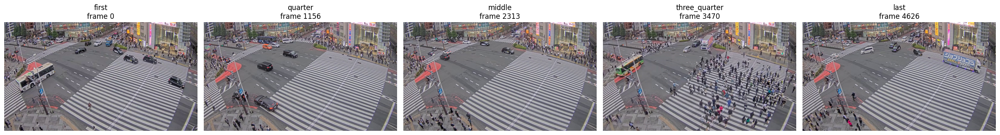


✅ Contact sheet saved at:
/kaggle/working/crowd_outputs/visualizations/zone_frame_selection_contact_sheet.jpg

📌 Use this image in Labelme to draw zones:


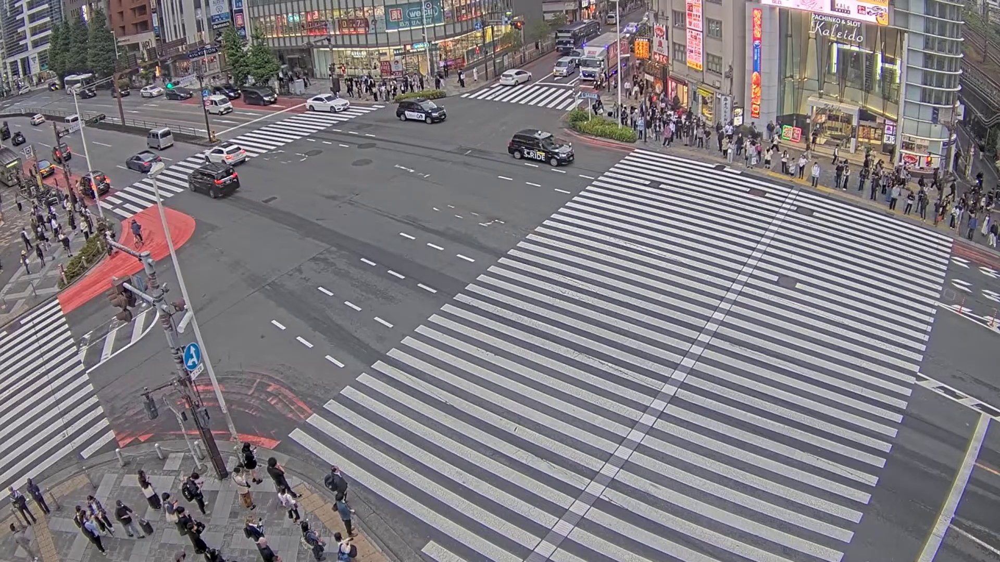


✅ Saved path info for next cells:
/kaggle/working/crowd_outputs/path_info.json

📌 After Labelme:
1. Download/open this image:
   /kaggle/working/crowd_outputs/zone_annotation/zone_frame.jpg
2. Draw polygon zones.
3. Save the Labelme JSON.
4. Upload/copy the JSON as:
   /kaggle/working/crowd_outputs/zone_annotation/zones_config.json

✅ Cell 1 finished.


In [2]:
# ============================================================
# CELL 1 — AUTO-FIND VIDEO + EXTRACT FRAMES FOR ZONE LABELING
# ============================================================

import os
import cv2
import json
import math
import shutil
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Image, Video, HTML

# ----------------------------
# 1) OUTPUT FOLDERS
# ----------------------------
BASE_OUT = Path("/kaggle/working/crowd_outputs")
FRAME_OUT = BASE_OUT / "frames"
ZONE_OUT = BASE_OUT / "zone_annotation"
VIDEO_OUT = BASE_OUT / "videos"
CSV_OUT = BASE_OUT / "csv"
VIS_OUT = BASE_OUT / "visualizations"
HEATMAP_OUT = BASE_OUT / "heatmaps"

for p in [BASE_OUT, FRAME_OUT, ZONE_OUT, VIDEO_OUT, CSV_OUT, VIS_OUT, HEATMAP_OUT]:
    p.mkdir(parents=True, exist_ok=True)

print("✅ Output folders created:")
print(BASE_OUT)

# ----------------------------
# 2) SEARCH FOR VIDEO AUTOMATICALLY
# ----------------------------
search_roots = [
    Path("/kaggle/input"),
    Path("/kaggle/working")
]

video_extensions = [".mp4", ".avi", ".mov", ".mkv"]

found_videos = []

for root in search_roots:
    if root.exists():
        for path in root.rglob("*"):
            if path.suffix.lower() in video_extensions:
                found_videos.append(path)

print("\n🎥 Found videos:")
if not found_videos:
    raise FileNotFoundError(
        "❌ No video files found under /kaggle/input or /kaggle/working.\n"
        "Make sure the dataset is attached to this Kaggle notebook."
    )

for i, p in enumerate(found_videos):
    print(f"[{i}] {p}")

# ----------------------------
# 3) AUTO-SELECT DEMO FINAL VIDEO
# ----------------------------
preferred_keywords = [
    "demo-final-video",
    "demo final video",
    "demo-final",
    "demo_final",
    "demo"
]

VIDEO_PATH = None

for keyword in preferred_keywords:
    for p in found_videos:
        if keyword.lower() in str(p).lower():
            VIDEO_PATH = str(p)
            break
    if VIDEO_PATH is not None:
        break

# fallback: use first found video
if VIDEO_PATH is None:
    VIDEO_PATH = str(found_videos[0])

print("\n✅ Selected video path:")
print(VIDEO_PATH)

# ----------------------------
# 4) CHECK VIDEO
# ----------------------------
if not os.path.exists(VIDEO_PATH):
    raise FileNotFoundError(f"❌ Video not found at: {VIDEO_PATH}")

cap = cv2.VideoCapture(VIDEO_PATH)

if not cap.isOpened():
    raise RuntimeError("❌ Could not open video. Check path or video format.")

fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
duration_sec = total_frames / fps if fps > 0 else 0

cap.release()

print("\n🎥 Video Information")
print("-------------------")
print(f"Path          : {VIDEO_PATH}")
print(f"Resolution    : {width} x {height}")
print(f"FPS           : {fps:.2f}")
print(f"Total frames  : {total_frames}")
print(f"Duration      : {duration_sec:.2f} seconds ({duration_sec/60:.2f} minutes)")

# ----------------------------
# 5) HELPER FUNCTION TO EXTRACT FRAME
# ----------------------------
def extract_frame(video_path, frame_index, save_path):
    cap = cv2.VideoCapture(video_path)
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)
    ok, frame = cap.read()
    cap.release()

    if not ok or frame is None:
        raise RuntimeError(f"❌ Could not read frame {frame_index}")

    cv2.imwrite(str(save_path), frame)
    return frame

# ----------------------------
# 6) EXTRACT USEFUL FRAMES
# ----------------------------
frame_indices = {
    "first": 0,
    "quarter": int(total_frames * 0.25),
    "middle": int(total_frames * 0.50),
    "three_quarter": int(total_frames * 0.75),
    "last": max(total_frames - 1, 0),
}

saved_frames = {}

for name, idx in frame_indices.items():
    save_path = FRAME_OUT / f"{name}_frame_{idx}.jpg"
    frame = extract_frame(VIDEO_PATH, idx, save_path)
    saved_frames[name] = {
        "index": idx,
        "path": save_path,
        "frame": frame
    }
    print(f"✅ Saved {name} frame {idx}: {save_path}")

# ----------------------------
# 7) CHOOSE MAIN LABELME FRAME
# ----------------------------
ZONE_FRAME_PATH = ZONE_OUT / "zone_frame.jpg"
shutil.copy(saved_frames["middle"]["path"], ZONE_FRAME_PATH)

print("\n✅ Main Labelme zone frame saved at:")
print(ZONE_FRAME_PATH)

# ----------------------------
# 8) CREATE CONTACT SHEET
# ----------------------------
fig, axes = plt.subplots(1, 5, figsize=(24, 6))

for ax, (name, info) in zip(axes, saved_frames.items()):
    frame_rgb = cv2.cvtColor(info["frame"], cv2.COLOR_BGR2RGB)
    ax.imshow(frame_rgb)
    ax.set_title(f"{name}\nframe {info['index']}")
    ax.axis("off")

plt.tight_layout()

CONTACT_SHEET_PATH = VIS_OUT / "zone_frame_selection_contact_sheet.jpg"
plt.savefig(CONTACT_SHEET_PATH, dpi=150, bbox_inches="tight")
plt.show()

print("\n✅ Contact sheet saved at:")
print(CONTACT_SHEET_PATH)

# ----------------------------
# 9) DISPLAY MAIN ZONE FRAME
# ----------------------------
print("\n📌 Use this image in Labelme to draw zones:")
display(Image(filename=str(ZONE_FRAME_PATH)))

# ----------------------------
# 10) SAVE PATH INFO FOR NEXT CELLS
# ----------------------------
PATH_INFO = {
    "VIDEO_PATH": VIDEO_PATH,
    "BASE_OUT": str(BASE_OUT),
    "FRAME_OUT": str(FRAME_OUT),
    "ZONE_OUT": str(ZONE_OUT),
    "VIDEO_OUT": str(VIDEO_OUT),
    "CSV_OUT": str(CSV_OUT),
    "VIS_OUT": str(VIS_OUT),
    "HEATMAP_OUT": str(HEATMAP_OUT),
    "ZONE_FRAME_PATH": str(ZONE_FRAME_PATH),
    "ZONE_JSON_PATH": str(ZONE_OUT / "zones_config.json"),
    "fps": fps,
    "total_frames": total_frames,
    "width": width,
    "height": height,
    "duration_sec": duration_sec
}

PATH_INFO_PATH = BASE_OUT / "path_info.json"

with open(PATH_INFO_PATH, "w") as f:
    json.dump(PATH_INFO, f, indent=4)

print("\n✅ Saved path info for next cells:")
print(PATH_INFO_PATH)

print("\n📌 After Labelme:")
print("1. Download/open this image:")
print(f"   {ZONE_FRAME_PATH}")
print("2. Draw polygon zones.")
print("3. Save the Labelme JSON.")
print("4. Upload/copy the JSON as:")
print(f"   {ZONE_OUT / 'zones_config.json'}")

print("\n✅ Cell 1 finished.")

✅ Loaded path info.
Video: /kaggle/input/datasets/yahiaelgayar/demo-final/demo final video.mp4
Zone frame: /kaggle/working/crowd_outputs/zone_annotation/zone_frame.jpg

📄 Found JSON files:
[0] /kaggle/input/datasets/yahiaelgayar/zones-config1/zone_frame.json

✅ Selected zone JSON:
/kaggle/input/datasets/yahiaelgayar/zones-config1/zone_frame.json

✅ Copied zone JSON to:
/kaggle/working/crowd_outputs/zone_annotation/zones_config.json

✅ Loaded zones:
1. crosswalk_main | type=polygon | points=8
2. sidewalk_bottom | type=polygon | points=7
3. sidewalk_right | type=polygon | points=12
4. crosswalk_left | type=polygon | points=6
5. crosswalk_top | type=polygon | points=4
6. crosswalk_main_left | type=polygon | points=7
7. sidewalk_left | type=polygon | points=8

✅ Zone verification image saved:
/kaggle/working/crowd_outputs/visualizations/00_zone_verification_overlay.jpg


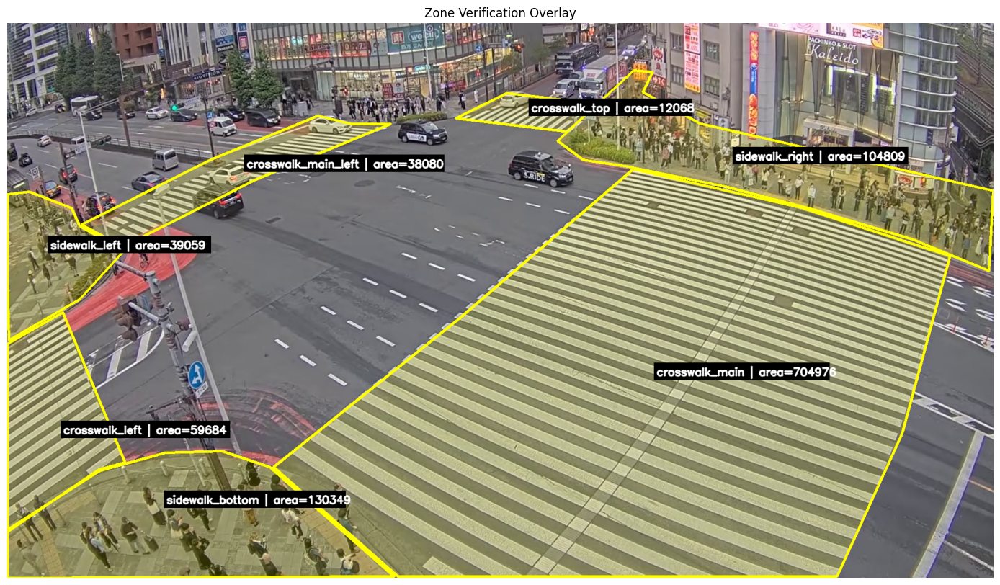

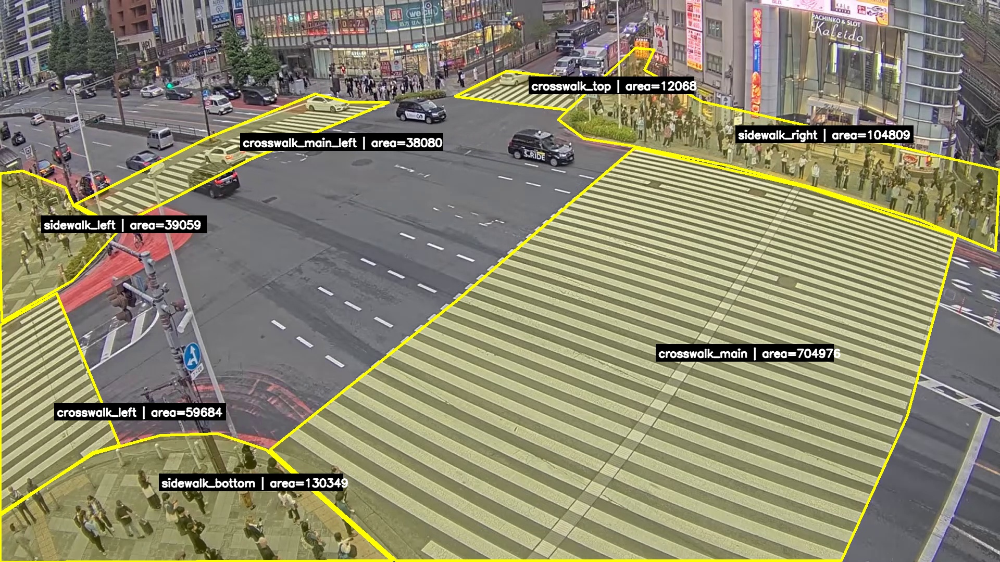


✅ Zone summary saved:
/kaggle/working/crowd_outputs/zone_annotation/zone_summary.json

📊 Zone Summary:
- crosswalk_main: area=704976.22, polygon_points=8
- sidewalk_bottom: area=130349.22, polygon_points=7
- sidewalk_right: area=104809.55, polygon_points=12
- crosswalk_left: area=59684.32, polygon_points=6
- crosswalk_top: area=12068.76, polygon_points=4
- crosswalk_main_left: area=38080.63, polygon_points=7
- sidewalk_left: area=39059.18, polygon_points=8

✅ Cell 2 finished. If zones look correct, next we run FIDTM + localization + heatmap + zone risk video.


In [3]:
# ============================================================
# CELL 2 — FIND LABELME JSON + COPY IT + VERIFY ZONES VISUALLY
# ============================================================

import os
import cv2
import json
import shutil
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Image

# ----------------------------
# 1) LOAD PATH INFO FROM CELL 1
# ----------------------------
BASE_OUT = Path("/kaggle/working/crowd_outputs")
PATH_INFO_PATH = BASE_OUT / "path_info.json"

if not PATH_INFO_PATH.exists():
    raise FileNotFoundError(
        "❌ path_info.json not found. Run Cell 1 first."
    )

with open(PATH_INFO_PATH, "r") as f:
    PATH_INFO = json.load(f)

VIDEO_PATH = PATH_INFO["VIDEO_PATH"]
ZONE_OUT = Path(PATH_INFO["ZONE_OUT"])
VIS_OUT = Path(PATH_INFO["VIS_OUT"])
ZONE_FRAME_PATH = Path(PATH_INFO["ZONE_FRAME_PATH"])

print("✅ Loaded path info.")
print("Video:", VIDEO_PATH)
print("Zone frame:", ZONE_FRAME_PATH)

# ----------------------------
# 2) FIND LABELME JSON AUTOMATICALLY
# ----------------------------
json_candidates = []

for root in [Path("/kaggle/input"), Path("/kaggle/working")]:
    if root.exists():
        for p in root.rglob("*.json"):
            # avoid internal path info json unless needed
            if "path_info" not in p.name.lower():
                json_candidates.append(p)

print("\n📄 Found JSON files:")
for i, p in enumerate(json_candidates):
    print(f"[{i}] {p}")

if not json_candidates:
    raise FileNotFoundError(
        "❌ No JSON files found. Make sure you added the zones-config1 dataset to this notebook."
    )

# Prefer files named like zone_frame.json or zones_config.json
ZONE_JSON_SOURCE = None

preferred_names = [
    "zone_frame.json",
    "zones_config.json",
    "zones.json"
]

for name in preferred_names:
    for p in json_candidates:
        if p.name.lower() == name.lower():
            ZONE_JSON_SOURCE = p
            break
    if ZONE_JSON_SOURCE is not None:
        break

# fallback: first json
if ZONE_JSON_SOURCE is None:
    ZONE_JSON_SOURCE = json_candidates[0]

print("\n✅ Selected zone JSON:")
print(ZONE_JSON_SOURCE)

# ----------------------------
# 3) COPY JSON TO WORKING OUTPUT PATH
# ----------------------------
ZONE_JSON_PATH = ZONE_OUT / "zones_config.json"
shutil.copy(ZONE_JSON_SOURCE, ZONE_JSON_PATH)

print("\n✅ Copied zone JSON to:")
print(ZONE_JSON_PATH)

# update path info
PATH_INFO["ZONE_JSON_PATH"] = str(ZONE_JSON_PATH)

with open(PATH_INFO_PATH, "w") as f:
    json.dump(PATH_INFO, f, indent=4)

# ----------------------------
# 4) LOAD LABELME JSON
# ----------------------------
with open(ZONE_JSON_PATH, "r") as f:
    labelme_data = json.load(f)

if "shapes" not in labelme_data:
    raise ValueError("❌ This JSON does not look like a Labelme JSON. Missing 'shapes' key.")

shapes = labelme_data["shapes"]

if len(shapes) == 0:
    raise ValueError("❌ Labelme JSON has no shapes. Did you draw polygon zones?")

print("\n✅ Loaded zones:")
for i, shape in enumerate(shapes):
    label = shape.get("label", f"zone_{i}")
    points = shape.get("points", [])
    shape_type = shape.get("shape_type", "unknown")
    print(f"{i+1}. {label} | type={shape_type} | points={len(points)}")

# ----------------------------
# 5) LOAD ZONE FRAME
# ----------------------------
if not ZONE_FRAME_PATH.exists():
    raise FileNotFoundError(f"❌ Zone frame not found: {ZONE_FRAME_PATH}")

frame = cv2.imread(str(ZONE_FRAME_PATH))

if frame is None:
    raise RuntimeError("❌ Could not read zone frame image.")

overlay = frame.copy()

# ----------------------------
# 6) DRAW ZONES
# ----------------------------
def polygon_area(points):
    pts = np.array(points, dtype=np.float32)
    return abs(cv2.contourArea(pts))

zone_summary = []

for idx, shape in enumerate(shapes):
    label = shape.get("label", f"zone_{idx}")
    points = shape.get("points", [])

    if len(points) < 3:
        print(f"⚠️ Skipping {label}: less than 3 points.")
        continue

    pts = np.array(points, dtype=np.int32)

    area = polygon_area(points)
    zone_summary.append({
        "zone_name": label,
        "num_points": len(points),
        "pixel_area": area
    })

    # draw polygon
    cv2.polylines(
        overlay,
        [pts],
        isClosed=True,
        color=(0, 255, 255),
        thickness=3
    )

    # transparent fill
    fill = overlay.copy()
    cv2.fillPoly(fill, [pts], color=(0, 255, 255))
    overlay = cv2.addWeighted(fill, 0.18, overlay, 0.82, 0)

    # label position
    cx = int(np.mean(pts[:, 0]))
    cy = int(np.mean(pts[:, 1]))

    text = f"{label} | area={int(area)}"
    cv2.rectangle(
        overlay,
        (cx - 5, cy - 25),
        (cx + min(420, 12 * len(text)), cy + 8),
        (0, 0, 0),
        -1
    )
    cv2.putText(
        overlay,
        text,
        (cx, cy),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.7,
        (255, 255, 255),
        2,
        cv2.LINE_AA
    )

# ----------------------------
# 7) SAVE AND DISPLAY OVERLAY
# ----------------------------
ZONE_VERIFY_PATH = VIS_OUT / "00_zone_verification_overlay.jpg"
cv2.imwrite(str(ZONE_VERIFY_PATH), overlay)

print("\n✅ Zone verification image saved:")
print(ZONE_VERIFY_PATH)

overlay_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(18, 10))
plt.imshow(overlay_rgb)
plt.axis("off")
plt.title("Zone Verification Overlay")
plt.show()

display(Image(filename=str(ZONE_VERIFY_PATH)))

# ----------------------------
# 8) SAVE CLEAN ZONE SUMMARY JSON
# ----------------------------
ZONE_SUMMARY_PATH = ZONE_OUT / "zone_summary.json"

with open(ZONE_SUMMARY_PATH, "w") as f:
    json.dump(zone_summary, f, indent=4)

print("\n✅ Zone summary saved:")
print(ZONE_SUMMARY_PATH)

print("\n📊 Zone Summary:")
for z in zone_summary:
    print(f"- {z['zone_name']}: area={z['pixel_area']:.2f}, polygon_points={z['num_points']}")

print("\n✅ Cell 2 finished. If zones look correct, next we run FIDTM + localization + heatmap + zone risk video.")

In [ ]:
# ============================================================
# CELL 1 — FIND INPUTS + CREATE OUTPUT STRUCTURE
# ============================================================

import os
import json
import shutil
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Image

# ============================================================
# 1) OUTPUT FOLDERS
# ============================================================

BASE_OUT = Path("/kaggle/working/crowd_outputs")
VIDEO_OUT = BASE_OUT / "videos"
CSV_OUT = BASE_OUT / "csv"
VIS_OUT = BASE_OUT / "visualizations"
HEATMAP_OUT = BASE_OUT / "heatmaps"
ZONE_OUT = BASE_OUT / "zone_annotation"

for p in [BASE_OUT, VIDEO_OUT, CSV_OUT, VIS_OUT, HEATMAP_OUT, ZONE_OUT]:
    p.mkdir(parents=True, exist_ok=True)

# Clean old outputs if any
for folder in [VIDEO_OUT, CSV_OUT, VIS_OUT, HEATMAP_OUT, ZONE_OUT]:
    for item in folder.iterdir():
        if item.is_file() or item.is_symlink():
            item.unlink()
        elif item.is_dir():
            shutil.rmtree(item)

print("✅ Clean output folders created:")
print(BASE_OUT)

# ============================================================
# 2) FIND VIDEO
# ============================================================

video_candidates = []
for root in [Path("/kaggle/input"), Path("/kaggle/working")]:
    if root.exists():
        for ext in ["*.mp4", "*.avi", "*.mov", "*.mkv"]:
            video_candidates += list(root.rglob(ext))

print("\n🎥 Found videos:")
for i, p in enumerate(video_candidates):
    print(f"[{i}] {p}")

if len(video_candidates) == 0:
    raise FileNotFoundError("❌ No video found under /kaggle/input or /kaggle/working.")

VIDEO_PATH = None

preferred_video_keywords = [
    "demo final video",
    "demo-final-video",
    "demo-final",
    "demo_final",
    "demo"
]

for key in preferred_video_keywords:
    for p in video_candidates:
        if key.lower() in str(p).lower():
            VIDEO_PATH = str(p)
            break
    if VIDEO_PATH:
        break

if VIDEO_PATH is None:
    VIDEO_PATH = str(video_candidates[0])

print("\n✅ Selected video:")
print(VIDEO_PATH)

# ============================================================
# 3) FIND ZONE JSON
# ============================================================

json_candidates = []
for root in [Path("/kaggle/input"), Path("/kaggle/working")]:
    if root.exists():
        json_candidates += list(root.rglob("*.json"))

# Remove irrelevant internal files if any
json_candidates = [p for p in json_candidates if "path_info" not in p.name.lower()]

print("\n📄 Found JSON files:")
for i, p in enumerate(json_candidates):
    print(f"[{i}] {p}")

if len(json_candidates) == 0:
    raise FileNotFoundError("❌ No JSON found. Make sure zones-config1 dataset is added.")

ZONE_JSON_SOURCE = None

preferred_json_names = [
    "zone_frame.json",
    "zones_config.json",
    "zones.json"
]

for name in preferred_json_names:
    for p in json_candidates:
        if p.name.lower() == name.lower():
            ZONE_JSON_SOURCE = p
            break
    if ZONE_JSON_SOURCE:
        break

if ZONE_JSON_SOURCE is None:
    ZONE_JSON_SOURCE = json_candidates[0]

ZONE_JSON_PATH = ZONE_OUT / "zones_config.json"
shutil.copy(ZONE_JSON_SOURCE, ZONE_JSON_PATH)

print("\n✅ Selected and copied zone JSON:")
print(ZONE_JSON_PATH)

# ============================================================
# 4) FIND CHECKPOINT
# ============================================================

ckpt_candidates = []
for root in [Path("/kaggle/input"), Path("/kaggle/working")]:
    if root.exists():
        for ext in ["*.pth", "*.pt", "*.tar"]:
            ckpt_candidates += list(root.rglob(ext))

preferred_ckpts = []
for p in ckpt_candidates:
    s = str(p).lower()
    if any(k in s for k in ["fidtm", "jhu", "best", "pretrain", "pretrained", "model"]):
        preferred_ckpts.append(p)

print("\n🧠 Found checkpoint files:")
for i, p in enumerate(preferred_ckpts[:30]):
    print(f"[{i}] {p}")

if len(preferred_ckpts) > 0:
    CHECKPOINT_PATH = str(preferred_ckpts[0])
elif len(ckpt_candidates) > 0:
    CHECKPOINT_PATH = str(ckpt_candidates[0])
else:
    raise FileNotFoundError("❌ No FIDTM checkpoint found.")

print("\n✅ Selected checkpoint:")
print(CHECKPOINT_PATH)

# ============================================================
# 5) VIDEO INFO
# ============================================================

cap = cv2.VideoCapture(VIDEO_PATH)

if not cap.isOpened():
    raise RuntimeError("❌ Could not open video.")

fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
duration = total_frames / fps if fps > 0 else 0

mid_frame_idx = total_frames // 2
cap.set(cv2.CAP_PROP_POS_FRAMES, mid_frame_idx)
ok, frame = cap.read()
cap.release()

if not ok:
    raise RuntimeError("❌ Could not read middle frame.")

ZONE_FRAME_PATH = ZONE_OUT / "zone_frame.jpg"
cv2.imwrite(str(ZONE_FRAME_PATH), frame)

print("\n🎥 Video info:")
print("Resolution:", width, "x", height)
print("FPS:", fps)
print("Frames:", total_frames)
print("Duration seconds:", duration)

# ============================================================
# 6) VERIFY ZONES VISUALLY
# ============================================================

with open(ZONE_JSON_PATH, "r") as f:
    zone_data = json.load(f)

if "shapes" not in zone_data:
    raise ValueError("❌ Zone JSON does not look like Labelme JSON. Missing 'shapes'.")

overlay = frame.copy()

zone_summary = []

for i, shape in enumerate(zone_data["shapes"]):
    label = shape.get("label", f"zone_{i}")
    points = shape.get("points", [])

    if len(points) < 3:
        continue

    polygon = np.array(points, dtype=np.int32)
    area = float(abs(cv2.contourArea(polygon)))

    zone_summary.append({
        "zone_name": label,
        "area_pixels": area,
        "points": len(points)
    })

    cv2.polylines(overlay, [polygon], True, (0, 255, 255), 3)

    fill = overlay.copy()
    cv2.fillPoly(fill, [polygon], (0, 255, 255))
    overlay = cv2.addWeighted(fill, 0.18, overlay, 0.82, 0)

    cx = int(np.mean(polygon[:, 0]))
    cy = int(np.mean(polygon[:, 1]))

    cv2.rectangle(overlay, (cx - 10, cy - 30), (cx + 380, cy + 10), (0, 0, 0), -1)
    cv2.putText(
        overlay,
        f"{label} | area={int(area)}",
        (cx, cy),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.65,
        (255, 255, 255),
        2,
        cv2.LINE_AA
    )

ZONE_VERIFY_PATH = VIS_OUT / "00_zone_verification_overlay.jpg"
cv2.imwrite(str(ZONE_VERIFY_PATH), overlay)

print("\n✅ Zones loaded:")
for z in zone_summary:
    print(f"- {z['zone_name']}: area={z['area_pixels']:.2f}, points={z['points']}")

print("\n🖼️ Zone verification:")
display(Image(filename=str(ZONE_VERIFY_PATH)))

# ============================================================
# 7) SAVE PATH INFO
# ============================================================

PATH_INFO = {
    "VIDEO_PATH": VIDEO_PATH,
    "ZONE_JSON_PATH": str(ZONE_JSON_PATH),
    "CHECKPOINT_PATH": CHECKPOINT_PATH,
    "FIDTM_REPO_DIR": "/kaggle/working/repos/FIDTM",
    "BASE_OUT": str(BASE_OUT),
    "VIDEO_OUT": str(VIDEO_OUT),
    "CSV_OUT": str(CSV_OUT),
    "VIS_OUT": str(VIS_OUT),
    "HEATMAP_OUT": str(HEATMAP_OUT),
    "ZONE_OUT": str(ZONE_OUT),
    "ZONE_FRAME_PATH": str(ZONE_FRAME_PATH),
    "ZONE_VERIFY_PATH": str(ZONE_VERIFY_PATH),
    "fps": fps,
    "total_frames": total_frames,
    "width": width,
    "height": height,
    "duration": duration
}

PATH_INFO_PATH = BASE_OUT / "path_info.json"

with open(PATH_INFO_PATH, "w") as f:
    json.dump(PATH_INFO, f, indent=4)

print("\n✅ Saved path info:")
print(PATH_INFO_PATH)
print("\n✅ Cell 1 finished.")

In [11]:
# ============================================================
# CELL 3A — FIX FIDTM ARGPARSE ERROR IN KAGGLE/JUPYTER
# ============================================================

import sys

# Kaggle/Jupyter adds hidden arguments like:
# -f /root/.local/share/jupyter/runtime/kernel-xxxx.json
# FIDTM config.py does not understand these arguments.
# So we clean sys.argv before importing FIDTM config.
sys.argv = [sys.argv[0]]

print("✅ sys.argv cleaned for FIDTM config import:")
print(sys.argv)

✅ sys.argv cleaned for FIDTM config import:
['/usr/local/lib/python3.12/dist-packages/colab_kernel_launcher.py']


✅ Loaded paths
Video: /kaggle/input/datasets/yahiaelgayar/demo-final/demo final video.mp4
Zones: /kaggle/working/crowd_outputs/zone_annotation/zones_config.json

🧹 Deleted old outputs from:
- /kaggle/working/crowd_outputs/videos
- /kaggle/working/crowd_outputs/csv
- /kaggle/working/crowd_outputs/visualizations
- /kaggle/working/crowd_outputs/heatmaps

✅ Configuration ready
MAX_FRAMES: None
FRAME_STEP: 1

🔎 Found possible seg_hrnet.py files:
[0] /kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py

✅ Selected FIDTM repo:
/kaggle/working/repos/FIDTM

🔎 Found possible checkpoints:
[0] /kaggle/input/datasets/yahiaelgayar/fidtm-model/model_best_jhu (1).pth

✅ Selected checkpoint:
/kaggle/input/datasets/yahiaelgayar/fidtm-model/model_best_jhu (1).pth

✅ Device: cuda
✅ Imported FIDTM get_seg_model and args

✅ Reloaded pretrained FIDTM
Missing keys: 0
Unexpected keys: 0

✅ Loaded zones:
- crosswalk_main | area=704629.00
- sidewalk_bottom | area=130166.00
- sidewalk_right | area=105026.00
-

Processing FULL Shinjuku video:   0%|          | 0/4627 [00:00<?, ?it/s]

/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:454: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x1 = F.upsample(x[1], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:455: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x2 = F.upsample(x[2], size=(x0_h, x0_w), mode='bilinear')
/kaggle/working/repos/FIDTM/Networks/HR_Net/seg_hrnet.py:456: UserWarning: `nn.functional.upsample` is deprecated. Use `nn.functional.interpolate` instead.
  x3 = F.upsample(x[3], size=(x0_h, x0_w), mode='bilinear')



✅ FULL processing finished
Elapsed time: 61.50 minutes
Processed frames: 4627

✅ Final outputs only are now saved here:

🎬 Videos:
1. Localization: /kaggle/working/crowd_outputs/videos/FULL_01_shinjuku_fidtm_localization_count.mp4
2. Heatmap overlay: /kaggle/working/crowd_outputs/videos/FULL_02_shinjuku_fidtm_heatmap_overlay_points.mp4
3. Heatmap only: /kaggle/working/crowd_outputs/videos/FULL_03_shinjuku_fidtm_heatmap_only_points.mp4
4. Zone density risk: /kaggle/working/crowd_outputs/videos/FULL_04_shinjuku_fidtm_zone_density_risk.mp4
5. Side-by-side: /kaggle/working/crowd_outputs/videos/FULL_05_shinjuku_side_by_side_outputs.mp4

📄 CSV:
1. Frame counts: /kaggle/working/crowd_outputs/csv/FULL_01_shinjuku_frame_counts.csv
2. Zone stats: /kaggle/working/crowd_outputs/csv/FULL_02_shinjuku_zone_density_risk.csv

🖼️ Midframe:
/kaggle/working/crowd_outputs/visualizations/FULL_shinjuku_side_by_side_midframe.jpg

📊 Frame count summary:


,frame_id,processed_id,timestamp_sec,total_count,inference_time_sec,inference_fps
count,4627.000000,4627.000000,4627.000000,4627.000000,4627.000000,4627.000000
mean,2313.000000,2313.000000,76.978143,185.352280,0.056454,17.810068
std,1335.844178,1335.844178,44.457762,311.351872,0.020312,0.411686
min,0.000000,0.000000,0.000000,81.000000,0.050903,0.696391
25%,1156.500000,1156.500000,38.489072,103.000000,0.055548,17.708020
50%,2313.000000,2313.000000,76.978143,117.000000,0.056047,17.842180
75%,3469.500000,3469.500000,115.467215,168.000000,0.056472,18.002348
max,4626.000000,4626.000000,153.956286,2419.000000,1.435976,19.645360



📊 Zone count summary:


zone_count                                                 \
                         count       mean         std   min   25%   50%   75%   
zone_name                                                                       
crosswalk_left          4627.0   4.095526    8.892520   0.0   2.0   2.0   4.0   
crosswalk_main          4627.0  49.602550  157.422795   0.0   0.0   2.0  39.0   
crosswalk_main_left     4627.0   4.169224    5.626018   0.0   1.0   2.0   5.0   
crosswalk_top           4627.0   2.207910    2.777293   0.0   0.0   1.0   4.0   
sidewalk_bottom         4627.0  14.963475   12.123115   0.0   8.0  13.0  20.0   
sidewalk_left           4627.0  11.850227    4.934925   0.0   9.0  13.0  15.0   
sidewalk_right          4627.0  43.162308   11.063206  11.0  37.0  46.0  51.0   

                            zone_density_pixel                                \
                        max              count      mean       std       min   
zone_name                                                                      
crosswalk_left        100.0             4627.0  0.000069  0.000149  0.000000   
crosswalk_main       1198.0             4627.0  0.000070  0.000223  0.000000   
crosswalk_main_left    40.0             4627.0  0.000109  0.000147  0.000000   
crosswalk_top          14.0             4627.0  0.000185  0.000232  0.000000   
sidewalk_bottom       129.0             4627.0  0.000115  0.000093  0.000000   
sidewalk_left          26.0             4627.0  0.000304  0.000127  0.000000   
sidewalk_right         66.0             4627.0  0.000411  0.000105  0.000105   

                                                             
                          25%       50%       75%       max  
zone_name                                                    
crosswalk_left       0.000034  0.000034  0.000067  0.001680  
crosswalk_main       0.000000  0.000003  0.000055  0.001700  
crosswalk_main_left  0.000026  0.000052  0.000131  0.001047  
crosswalk_top        0.000000  0.000084  0.000334  0.001170  
sidewalk_bottom      0.000061  0.000100  0.000154  0.000991  
sidewalk_left        0.000231  0.000334  0.000385  0.000667  
sidewalk_right       0.000352  0.000438  0.000486  0.000628


📊 Risk distribution:


risk_level,CRITICAL,HIGH,LOW,MEDIUM
zone_name,,,,
crosswalk_left,77,6,4340,204
crosswalk_main,1241,153,3107,126
crosswalk_main_left,16,160,3770,681
crosswalk_top,0,0,4293,334
sidewalk_bottom,98,1563,937,2029
sidewalk_left,0,420,929,3278
sidewalk_right,4075,336,0,216



🖼️ Mid-frame side-by-side output:


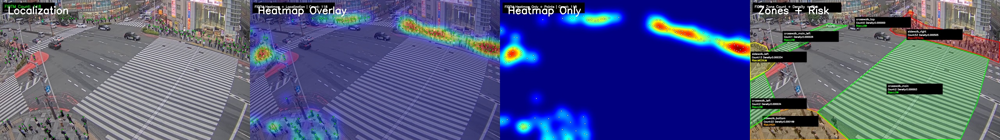


🎬 Side-by-side full video:


In [ ]:
# ============================================================
# FULL RUN — CLEAN OLD OUTPUTS + FULL FIDTM SHINJUKU PIPELINE
# Outputs:
# 1) localization video
# 2) heatmap overlay video
# 3) heatmap only video
# 4) zone density risk video
# 5) side-by-side video
# 6) CSV files
# 7) midframe screenshot
# ============================================================

import os
import sys
import cv2
import json
import time
import shutil
import numpy as np
import pandas as pd
from pathlib import Path
from IPython.display import display, Video, Image

import torch
from torchvision import transforms
from tqdm.auto import tqdm

# ------------------------------------------------------------
# Fix Kaggle/Jupyter hidden arguments before importing FIDTM
# ------------------------------------------------------------
sys.argv = [sys.argv[0]]

# ============================================================
# 1) LOAD PATH INFO
# ============================================================

BASE_OUT = Path("/kaggle/working/crowd_outputs")
PATH_INFO_PATH = BASE_OUT / "path_info.json"

if not PATH_INFO_PATH.exists():
    raise FileNotFoundError("❌ path_info.json not found. Run Cell 1 first.")

with open(PATH_INFO_PATH, "r") as f:
    PATH_INFO = json.load(f)

VIDEO_PATH = PATH_INFO["VIDEO_PATH"]
ZONE_JSON_PATH = PATH_INFO["ZONE_JSON_PATH"]

VIDEO_OUT = Path(PATH_INFO["VIDEO_OUT"])
CSV_OUT = Path(PATH_INFO["CSV_OUT"])
VIS_OUT = Path(PATH_INFO["VIS_OUT"])
HEATMAP_OUT = Path(PATH_INFO["HEATMAP_OUT"])

print("✅ Loaded paths")
print("Video:", VIDEO_PATH)
print("Zones:", ZONE_JSON_PATH)

# ============================================================
# 2) DELETE OLD OUTPUTS SO ONLY FULL RUN REMAINS
# ============================================================

folders_to_clean = [
    VIDEO_OUT,
    CSV_OUT,
    VIS_OUT,
    HEATMAP_OUT
]

for folder in folders_to_clean:
    folder.mkdir(parents=True, exist_ok=True)
    for item in folder.iterdir():
        if item.is_file() or item.is_symlink():
            item.unlink()
        elif item.is_dir():
            shutil.rmtree(item)

print("\n🧹 Deleted old outputs from:")
for folder in folders_to_clean:
    print("-", folder)

# ============================================================
# 3) CONFIGURATION
# ============================================================

# FULL VIDEO
MAX_FRAMES = None

# Process every frame.
# If too slow, use FRAME_STEP = 2, but for final output keep 1.
FRAME_STEP = 1

# FIDTM point extraction settings
FIDTM_THRESHOLD = 0.20
NMS_KERNEL = 15

# Resize for inference speed.
# Keep 1280 for Kaggle practical speed.
INFER_MAX_WIDTH = 1280

# Heatmap style from your VSCode code
HEATMAP_SIGMA = 35
HEATMAP_FRAME_WEIGHT = 0.60
HEATMAP_COLOR_WEIGHT = 0.40
DRAW_POINTS_ON_HEATMAP = True

# Side-by-side output size
SIDE_BY_SIDE_WIDTH_PER_PANEL = 640

# Count-based risk thresholds
RISK_THRESHOLDS = {
    "LOW": 8,
    "MEDIUM": 18,
    "HIGH": 30
}

RISK_COLORS = {
    "LOW": (0, 255, 0),
    "MEDIUM": (0, 255, 255),
    "HIGH": (0, 165, 255),
    "CRITICAL": (0, 0, 255)
}

# Output paths — final full run only
LOCALIZATION_VIDEO_PATH = VIDEO_OUT / "FULL_01_shinjuku_fidtm_localization_count.mp4"
HEATMAP_OVERLAY_VIDEO_PATH = VIDEO_OUT / "FULL_02_shinjuku_fidtm_heatmap_overlay_points.mp4"
HEATMAP_ONLY_VIDEO_PATH = VIDEO_OUT / "FULL_03_shinjuku_fidtm_heatmap_only_points.mp4"
ZONE_VIDEO_PATH = VIDEO_OUT / "FULL_04_shinjuku_fidtm_zone_density_risk.mp4"
SIDE_BY_SIDE_VIDEO_PATH = VIDEO_OUT / "FULL_05_shinjuku_side_by_side_outputs.mp4"

CSV_FRAME_PATH = CSV_OUT / "FULL_01_shinjuku_frame_counts.csv"
CSV_ZONE_PATH = CSV_OUT / "FULL_02_shinjuku_zone_density_risk.csv"

MIDFRAME_PATH = VIS_OUT / "FULL_shinjuku_side_by_side_midframe.jpg"

print("\n✅ Configuration ready")
print("MAX_FRAMES:", MAX_FRAMES)
print("FRAME_STEP:", FRAME_STEP)

# ============================================================
# 4) FIND FIDTM REPO AND CHECKPOINT
# ============================================================

search_roots = ["/kaggle/working", "/kaggle/input"]

seg_files = []

for root in search_roots:
    root = Path(root)
    if root.exists():
        seg_files += list(root.rglob("seg_hrnet.py"))

print("\n🔎 Found possible seg_hrnet.py files:")
for i, p in enumerate(seg_files):
    print(f"[{i}] {p}")

if len(seg_files) == 0:
    raise FileNotFoundError("❌ Could not find FIDTM repo because seg_hrnet.py was not found.")

FIDTM_REPO_DIR = None

for p in seg_files:
    parts = list(p.parts)
    for j, part in enumerate(parts):
        if part.lower() == "fidtm":
            FIDTM_REPO_DIR = Path(*parts[:j + 1])
            break
    if FIDTM_REPO_DIR is not None:
        break

if FIDTM_REPO_DIR is None:
    for p in seg_files:
        if "Networks" in p.parts:
            idx = p.parts.index("Networks")
            FIDTM_REPO_DIR = Path(*p.parts[:idx])
            break

if FIDTM_REPO_DIR is None:
    FIDTM_REPO_DIR = seg_files[0].parents[2]

print("\n✅ Selected FIDTM repo:")
print(FIDTM_REPO_DIR)

ckpt_candidates = []

for root in search_roots:
    root = Path(root)
    if root.exists():
        for ext in ["*.pth", "*.pt", "*.tar"]:
            ckpt_candidates += list(root.rglob(ext))

preferred_ckpts = []

for p in ckpt_candidates:
    s = str(p).lower()
    if any(k in s for k in ["fidtm", "jhu", "best", "pretrain", "pretrained", "model"]):
        preferred_ckpts.append(p)

print("\n🔎 Found possible checkpoints:")
for i, p in enumerate(preferred_ckpts[:30]):
    print(f"[{i}] {p}")

if len(preferred_ckpts) > 0:
    CHECKPOINT_PATH = preferred_ckpts[0]
elif len(ckpt_candidates) > 0:
    CHECKPOINT_PATH = ckpt_candidates[0]
else:
    raise FileNotFoundError("❌ No .pth/.pt/.tar checkpoint found.")

print("\n✅ Selected checkpoint:")
print(CHECKPOINT_PATH)

if str(FIDTM_REPO_DIR) not in sys.path:
    sys.path.insert(0, str(FIDTM_REPO_DIR))

# ============================================================
# 5) LOAD FIDTM MODEL
# ============================================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("\n✅ Device:", device)

from Networks.HR_Net.seg_hrnet import get_seg_model
from config import args

print("✅ Imported FIDTM get_seg_model and args")

model = get_seg_model(args)

ckpt = torch.load(str(CHECKPOINT_PATH), map_location=device)

if isinstance(ckpt, dict):
    if "state_dict" in ckpt:
        state_dict = ckpt["state_dict"]
    elif "model_state_dict" in ckpt:
        state_dict = ckpt["model_state_dict"]
    elif "model" in ckpt:
        state_dict = ckpt["model"]
    elif "net" in ckpt:
        state_dict = ckpt["net"]
    else:
        state_dict = ckpt
else:
    state_dict = ckpt

clean_state_dict = {}

for k, v in state_dict.items():
    clean_state_dict[k.replace("module.", "")] = v

missing, unexpected = model.load_state_dict(clean_state_dict, strict=False)

print("\n✅ Reloaded pretrained FIDTM")
print("Missing keys:", len(missing))
print("Unexpected keys:", len(unexpected))

model = model.to(device)
model.eval()

# ============================================================
# 6) FIDTM INFERENCE HELPERS
# ============================================================

imagenet_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

def resize_for_inference(frame_bgr, max_width=1280):
    h, w = frame_bgr.shape[:2]

    if max_width is None or w <= max_width:
        return frame_bgr, 1.0, 1.0

    scale = max_width / w

    new_w = int(w * scale)
    new_h = int(h * scale)

    new_w = max(16, (new_w // 16) * 16)
    new_h = max(16, (new_h // 16) * 16)

    resized = cv2.resize(frame_bgr, (new_w, new_h), interpolation=cv2.INTER_AREA)

    sx = w / new_w
    sy = h / new_h

    return resized, sx, sy

def extract_prediction_map(output):
    if isinstance(output, dict):
        for key in ["pred", "output", "density", "map", "seg", "out"]:
            if key in output:
                output = output[key]
                break
        else:
            output = list(output.values())[0]

    if isinstance(output, (list, tuple)):
        output = output[0]

    if not isinstance(output, torch.Tensor):
        output = torch.tensor(output)

    pred = output.detach().float().cpu()

    while pred.ndim > 2:
        pred = pred[0]

    pred = pred.numpy()
    pred = np.nan_to_num(pred)

    return pred

def normalize_map(pred):
    pred = pred.astype(np.float32)

    mn = float(pred.min())
    mx = float(pred.max())

    if mx - mn < 1e-8:
        return np.zeros_like(pred, dtype=np.float32)

    return (pred - mn) / (mx - mn)

def nms_points(pred_norm, threshold=0.20, kernel=15):
    pred = pred_norm.astype(np.float32)

    max_map = cv2.dilate(pred, np.ones((kernel, kernel), np.uint8))
    peaks = (pred == max_map) & (pred >= threshold)

    ys, xs = np.where(peaks)

    points = []
    scores = []

    for x, y in zip(xs, ys):
        points.append((int(x), int(y)))
        scores.append(float(pred[y, x]))

    return points, scores

@torch.no_grad()
def fidtm_predict_points(frame_bgr):
    original_h, original_w = frame_bgr.shape[:2]

    infer_frame, sx, sy = resize_for_inference(frame_bgr, INFER_MAX_WIDTH)

    rgb = cv2.cvtColor(infer_frame, cv2.COLOR_BGR2RGB)
    tensor = imagenet_transform(rgb).unsqueeze(0).to(device)

    start = time.time()
    output = model(tensor)
    infer_time = time.time() - start

    pred = extract_prediction_map(output)
    pred_norm = normalize_map(pred)

    points_small, scores = nms_points(
        pred_norm,
        threshold=FIDTM_THRESHOLD,
        kernel=NMS_KERNEL
    )

    map_h, map_w = pred_norm.shape[:2]
    infer_h, infer_w = infer_frame.shape[:2]

    scale_x_map = infer_w / map_w
    scale_y_map = infer_h / map_h

    points_original = []

    for (x, y), score in zip(points_small, scores):
        px = x * scale_x_map * sx
        py = y * scale_y_map * sy

        px = int(np.clip(px, 0, original_w - 1))
        py = int(np.clip(py, 0, original_h - 1))

        # IMPORTANT: points are now (x, y, score), same as your VSCode functions
        points_original.append((px, py, float(score)))

    return points_original, pred_norm, infer_time

# ============================================================
# 7) YOUR DRAW UTILS STYLE
# ============================================================

def draw_fidtm_points(frame_bgr, points, count, fps_text=None):
    out = frame_bgr.copy()

    for x, y, score in points:
        cv2.circle(out, (int(x), int(y)), 4, (0, 255, 0), -1)
        cv2.circle(out, (int(x), int(y)), 7, (0, 0, 0), 1)

    cv2.rectangle(out, (20, 20), (420, 95), (0, 0, 0), -1)

    cv2.putText(
        out,
        f"FIDTM Count: {count}",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.0,
        (0, 255, 0),
        2,
        cv2.LINE_AA,
    )

    if fps_text:
        cv2.putText(
            out,
            fps_text,
            (35, 88),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.6,
            (255, 255, 255),
            1,
            cv2.LINE_AA,
        )

    return out

def make_smooth_heatmap_from_points(frame_shape, points, sigma=35):
    h, w = frame_shape[:2]
    heat = np.zeros((h, w), dtype=np.float32)

    for x, y, score in points:
        xi, yi = int(x), int(y)
        if 0 <= xi < w and 0 <= yi < h:
            heat[yi, xi] += 1.0

    heat = cv2.GaussianBlur(heat, (0, 0), sigmaX=sigma, sigmaY=sigma)

    if heat.max() > 0:
        heat = heat / heat.max()

    heat_uint8 = np.uint8(255 * heat)
    heat_color = cv2.applyColorMap(heat_uint8, cv2.COLORMAP_JET)

    return heat_color, heat_uint8

def draw_heatmap_overlay(frame_bgr, points, count, sigma=35, draw_points=True):
    heat_color, _ = make_smooth_heatmap_from_points(frame_bgr.shape, points, sigma=sigma)

    overlay = cv2.addWeighted(
        frame_bgr,
        HEATMAP_FRAME_WEIGHT,
        heat_color,
        HEATMAP_COLOR_WEIGHT,
        0
    )

    if draw_points:
        for x, y, score in points:
            cv2.circle(overlay, (int(x), int(y)), 4, (0, 255, 0), -1)
            cv2.circle(overlay, (int(x), int(y)), 7, (0, 0, 0), 1)

    cv2.rectangle(overlay, (20, 20), (650, 100), (0, 0, 0), -1)

    cv2.putText(
        overlay,
        f"FIDTM Heatmap + Localization | Count: {count}",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    return overlay

def draw_heatmap_only(frame_bgr, points, count, sigma=35, draw_points=True):
    heat_color, _ = make_smooth_heatmap_from_points(frame_bgr.shape, points, sigma=sigma)
    only = heat_color.copy()

    if draw_points:
        for x, y, score in points:
            cv2.circle(only, (int(x), int(y)), 3, (255, 255, 255), -1)
            cv2.circle(only, (int(x), int(y)), 6, (0, 0, 0), 1)

    cv2.rectangle(only, (20, 20), (650, 100), (0, 0, 0), -1)

    cv2.putText(
        only,
        f"FIDTM Heatmap Only + Points | Count: {count}",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    return only

# ============================================================
# 8) LOAD ZONES
# ============================================================

with open(ZONE_JSON_PATH, "r") as f:
    zone_data = json.load(f)

zones = []

for i, shape in enumerate(zone_data["shapes"]):
    label = shape.get("label", f"zone_{i}")
    pts = shape.get("points", [])

    if len(pts) < 3:
        continue

    polygon = np.array(pts, dtype=np.int32)
    area = float(abs(cv2.contourArea(polygon)))

    zones.append({
        "name": label,
        "polygon": polygon,
        "area": area
    })

print("\n✅ Loaded zones:")
for z in zones:
    print(f"- {z['name']} | area={z['area']:.2f}")

def classify_risk(count):
    if count < RISK_THRESHOLDS["LOW"]:
        return "LOW"
    elif count < RISK_THRESHOLDS["MEDIUM"]:
        return "MEDIUM"
    elif count < RISK_THRESHOLDS["HIGH"]:
        return "HIGH"
    else:
        return "CRITICAL"

def assign_points_to_zones(points):
    zone_stats = []

    for zone in zones:
        polygon = zone["polygon"]
        count = 0

        for x, y, score in points:
            inside = cv2.pointPolygonTest(polygon, (float(x), float(y)), False)
            if inside >= 0:
                count += 1

        density = count / zone["area"] if zone["area"] > 0 else 0.0
        risk = classify_risk(count)

        zone_stats.append({
            "zone_name": zone["name"],
            "zone_count": count,
            "zone_area": zone["area"],
            "zone_density": density,
            "risk_level": risk
        })

    return zone_stats

# ============================================================
# 9) ZONE DRAWING
# ============================================================

def draw_zone_density_risk(frame_bgr, zone_stats):
    out = frame_bgr.copy()

    for zone in zones:
        name = zone["name"]
        polygon = zone["polygon"]

        stat = next((s for s in zone_stats if s["zone_name"] == name), None)
        if stat is None:
            continue

        risk = stat["risk_level"]
        color = RISK_COLORS[risk]

        fill = out.copy()
        cv2.fillPoly(fill, [polygon], color=color)
        out = cv2.addWeighted(fill, 0.18, out, 0.82, 0)

        cv2.polylines(out, [polygon], isClosed=True, color=color, thickness=3)

        cx = int(np.mean(polygon[:, 0]))
        cy = int(np.mean(polygon[:, 1]))

        text1 = f"{name}"
        text2 = f"Count:{stat['zone_count']} Density:{stat['zone_density']:.6f}"
        text3 = f"Risk:{risk}"

        box_w = max(430, len(text2) * 13)
        box_h = 82

        x1 = max(5, cx - box_w // 2)
        y1 = max(5, cy - box_h // 2)
        x2 = min(out.shape[1] - 5, x1 + box_w)
        y2 = min(out.shape[0] - 5, y1 + box_h)

        cv2.rectangle(out, (x1, y1), (x2, y2), (0, 0, 0), -1)

        cv2.putText(out, text1, (x1 + 10, y1 + 24),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.65, (255, 255, 255), 2)

        cv2.putText(out, text2, (x1 + 10, y1 + 50),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.55, (255, 255, 255), 2)

        cv2.putText(out, text3, (x1 + 10, y1 + 74),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.60, color, 2)

    cv2.rectangle(out, (20, 20), (700, 95), (0, 0, 0), -1)
    cv2.putText(
        out,
        "FIDTM Zone Count + Density + Risk",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.85,
        (255, 255, 255),
        2,
        cv2.LINE_AA
    )

    return out

# ============================================================
# 10) SIDE-BY-SIDE VIDEO
# ============================================================

def make_side_by_side(local_frame, heat_overlay, heat_only, zone_frame):
    def resize_panel(img, target_w):
        h, w = img.shape[:2]
        target_h = int(h * (target_w / w))
        return cv2.resize(img, (target_w, target_h), interpolation=cv2.INTER_AREA)

    a = resize_panel(local_frame, SIDE_BY_SIDE_WIDTH_PER_PANEL)
    b = resize_panel(heat_overlay, SIDE_BY_SIDE_WIDTH_PER_PANEL)
    c = resize_panel(heat_only, SIDE_BY_SIDE_WIDTH_PER_PANEL)
    d = resize_panel(zone_frame, SIDE_BY_SIDE_WIDTH_PER_PANEL)

    min_h = min(a.shape[0], b.shape[0], c.shape[0], d.shape[0])

    a = a[:min_h, :, :]
    b = b[:min_h, :, :]
    c = c[:min_h, :, :]
    d = d[:min_h, :, :]

    side = np.hstack([a, b, c, d])

    cv2.putText(side, "Localization", (20, 35),
                cv2.FONT_HERSHEY_SIMPLEX, 0.85, (255, 255, 255), 2)

    cv2.putText(side, "Heatmap Overlay", (SIDE_BY_SIDE_WIDTH_PER_PANEL + 20, 35),
                cv2.FONT_HERSHEY_SIMPLEX, 0.85, (255, 255, 255), 2)

    cv2.putText(side, "Heatmap Only", (2 * SIDE_BY_SIDE_WIDTH_PER_PANEL + 20, 35),
                cv2.FONT_HERSHEY_SIMPLEX, 0.85, (255, 255, 255), 2)

    cv2.putText(side, "Zones + Risk", (3 * SIDE_BY_SIDE_WIDTH_PER_PANEL + 20, 35),
                cv2.FONT_HERSHEY_SIMPLEX, 0.85, (255, 255, 255), 2)

    return side

# ============================================================
# 11) VIDEO SETUP
# ============================================================

cap = cv2.VideoCapture(VIDEO_PATH)

if not cap.isOpened():
    raise RuntimeError("❌ Could not open video.")

fps = cap.get(cv2.CAP_PROP_FPS)
original_total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

if MAX_FRAMES is None:
    total_to_process = original_total_frames
else:
    total_to_process = min(MAX_FRAMES, original_total_frames)

effective_fps = fps / FRAME_STEP

print("\n🎥 Video setup")
print("Resolution:", w, "x", h)
print("FPS:", fps)
print("Original frames:", original_total_frames)
print("Frames to process:", total_to_process)
print("Frame step:", FRAME_STEP)
print("Output FPS:", effective_fps)

fourcc = cv2.VideoWriter_fourcc(*"mp4v")

local_writer = cv2.VideoWriter(
    str(LOCALIZATION_VIDEO_PATH),
    fourcc,
    effective_fps,
    (w, h)
)

heat_overlay_writer = cv2.VideoWriter(
    str(HEATMAP_OVERLAY_VIDEO_PATH),
    fourcc,
    effective_fps,
    (w, h)
)

heat_only_writer = cv2.VideoWriter(
    str(HEATMAP_ONLY_VIDEO_PATH),
    fourcc,
    effective_fps,
    (w, h)
)

zone_writer = cv2.VideoWriter(
    str(ZONE_VIDEO_PATH),
    fourcc,
    effective_fps,
    (w, h)
)

side_h = int(h * (SIDE_BY_SIDE_WIDTH_PER_PANEL / w))
side_w = SIDE_BY_SIDE_WIDTH_PER_PANEL * 4

side_writer = cv2.VideoWriter(
    str(SIDE_BY_SIDE_VIDEO_PATH),
    fourcc,
    effective_fps,
    (side_w, side_h)
)

writers = {
    "localization": local_writer,
    "heatmap_overlay": heat_overlay_writer,
    "heatmap_only": heat_only_writer,
    "zone": zone_writer,
    "side_by_side": side_writer
}

for name, writer in writers.items():
    if not writer.isOpened():
        raise RuntimeError(f"❌ Could not open video writer: {name}")

# ============================================================
# 12) PROCESS FULL VIDEO
# ============================================================

frame_rows = []
zone_rows = []

mid_index = total_to_process // 2
saved_midframe = False

start_all = time.time()

pbar = tqdm(total=total_to_process, desc="Processing FULL Shinjuku video")

frame_id = 0
processed_id = 0

while True:
    ok, frame = cap.read()

    if not ok or frame is None:
        break

    if frame_id >= total_to_process:
        break

    if frame_id % FRAME_STEP != 0:
        frame_id += 1
        pbar.update(1)
        continue

    points, pred_norm, infer_time = fidtm_predict_points(frame)

    count = len(points)
    current_fps = 1.0 / infer_time if infer_time > 0 else 0.0

    zone_stats = assign_points_to_zones(points)

    # 1) localization video
    local_frame = draw_fidtm_points(
        frame,
        points,
        count,
        fps_text=f"FPS: {current_fps:.2f}"
    )

    # 2) heatmap overlay video
    heat_overlay = draw_heatmap_overlay(
        frame,
        points,
        count,
        sigma=HEATMAP_SIGMA,
        draw_points=DRAW_POINTS_ON_HEATMAP
    )

    # 3) heatmap only video
    heat_only = draw_heatmap_only(
        frame,
        points,
        count,
        sigma=HEATMAP_SIGMA,
        draw_points=DRAW_POINTS_ON_HEATMAP
    )

    # 4) zone video
    zone_frame = draw_zone_density_risk(frame, zone_stats)

    # 5) side-by-side video
    side_frame = make_side_by_side(local_frame, heat_overlay, heat_only, zone_frame)

    local_writer.write(local_frame)
    heat_overlay_writer.write(heat_overlay)
    heat_only_writer.write(heat_only)
    zone_writer.write(zone_frame)
    side_writer.write(side_frame)

    timestamp = frame_id / fps if fps > 0 else 0.0

    frame_rows.append({
        "frame_id": frame_id,
        "processed_id": processed_id,
        "timestamp_sec": timestamp,
        "total_count": count,
        "inference_time_sec": infer_time,
        "inference_fps": current_fps
    })

    for stat in zone_stats:
        zone_rows.append({
            "frame_id": frame_id,
            "processed_id": processed_id,
            "timestamp_sec": timestamp,
            "zone_name": stat["zone_name"],
            "zone_count": stat["zone_count"],
            "zone_area_pixels": stat["zone_area"],
            "zone_density_pixel": stat["zone_density"],
            "risk_level": stat["risk_level"],
            "total_count": count
        })

    if not saved_midframe and frame_id >= mid_index:
        cv2.imwrite(str(MIDFRAME_PATH), side_frame)
        saved_midframe = True

    processed_id += 1
    frame_id += 1
    pbar.update(1)

pbar.close()
cap.release()

for writer in writers.values():
    writer.release()

elapsed = time.time() - start_all

# ============================================================
# 13) SAVE CSV FILES
# ============================================================

df_frame = pd.DataFrame(frame_rows)
df_zone = pd.DataFrame(zone_rows)

df_frame.to_csv(CSV_FRAME_PATH, index=False)
df_zone.to_csv(CSV_ZONE_PATH, index=False)

# ============================================================
# 14) DISPLAY RESULTS
# ============================================================

print("\n✅ FULL processing finished")
print(f"Elapsed time: {elapsed / 60:.2f} minutes")
print(f"Processed frames: {processed_id}")

print("\n✅ Final outputs only are now saved here:")

print("\n🎬 Videos:")
print("1. Localization:", LOCALIZATION_VIDEO_PATH)
print("2. Heatmap overlay:", HEATMAP_OVERLAY_VIDEO_PATH)
print("3. Heatmap only:", HEATMAP_ONLY_VIDEO_PATH)
print("4. Zone density risk:", ZONE_VIDEO_PATH)
print("5. Side-by-side:", SIDE_BY_SIDE_VIDEO_PATH)

print("\n📄 CSV:")
print("1. Frame counts:", CSV_FRAME_PATH)
print("2. Zone stats:", CSV_ZONE_PATH)

print("\n🖼️ Midframe:")
print(MIDFRAME_PATH)

print("\n📊 Frame count summary:")
display(df_frame.describe())

print("\n📊 Zone count summary:")
display(df_zone.groupby("zone_name")[["zone_count", "zone_density_pixel"]].describe())

print("\n📊 Risk distribution:")
display(pd.crosstab(df_zone["zone_name"], df_zone["risk_level"]))

if MIDFRAME_PATH.exists():
    print("\n🖼️ Mid-frame side-by-side output:")
    display(Image(filename=str(MIDFRAME_PATH)))

print("\n🎬 Side-by-side full video:")
display(Video(str(SIDE_BY_SIDE_VIDEO_PATH), embed=True, width=1200))

print("\n🎬 Localization full video:")
display(Video(str(LOCALIZATION_VIDEO_PATH), embed=True, width=900))

print("\n🎬 Heatmap overlay full video:")
display(Video(str(HEATMAP_OVERLAY_VIDEO_PATH), embed=True, width=900))

print("\n🎬 Heatmap only full video:")
display(Video(str(HEATMAP_ONLY_VIDEO_PATH), embed=True, width=900))

print("\n🎬 Zone density + risk full video:")
display(Video(str(ZONE_VIDEO_PATH), embed=True, width=900))

print("\n✅ Full run cell finished.")


✅ Fresh cleaned analysis folders created:
/kaggle/working/crowd_outputs/analysis_cleaned

📄 Found CSV files:
[0] /kaggle/input/datasets/yahiaelgayar/csv-files/FULL_01_shinjuku_frame_counts.csv
[1] /kaggle/input/datasets/yahiaelgayar/csv-files/FULL_02_shinjuku_zone_density_risk.csv
[2] /kaggle/working/crowd_outputs/analysis/tables/csv_based_anomaly_features.csv
[3] /kaggle/working/crowd_outputs/analysis/tables/risk_duration_summary.csv
[4] /kaggle/working/crowd_outputs/analysis/tables/temporal_density_features.csv
[5] /kaggle/working/crowd_outputs/analysis/tables/density_trend_summary.csv
[6] /kaggle/working/crowd_outputs/analysis/tables/risk_percentage_summary.csv
[7] /kaggle/working/crowd_outputs/analysis/tables/rolling_behavior_features_5s.csv
[8] /kaggle/working/crowd_outputs/analysis/tables/global_count_summary.csv
[9] /kaggle/working/crowd_outputs/analysis/tables/zone_count_density_summary.csv
[10] /kaggle/working/crowd_outputs/analysis/tables/top_20_peak_crowd_frames.csv
[11] /k

count    4627.000000
mean      185.352280
std       311.351872
min        81.000000
25%       103.000000
50%       117.000000
75%       168.000000
max      2419.000000
Name: total_count, dtype: float64


🚨 Outlier Cleaning
Threshold: 500
Original frames: 4627
Outlier frames removed: 94
Cleaned frames: 4533
Original zone rows: 32389
Cleaned zone rows: 31731

📊 Removed outlier frames:


,frame_id,processed_id,timestamp_sec,total_count,inference_time_sec,inference_fps
2012,2012,2012,66.960667,2419,0.056238,17.781441
1986,1986,1986,66.095371,2418,0.054790,18.251579
1987,1987,1987,66.128651,2416,0.056645,17.653835
2849,2849,2849,94.816571,2414,0.055622,17.978542
2013,2013,2013,66.993948,2411,0.056589,17.671314
...,...,...,...,...,...,...
713,713,713,23.729103,2130,0.056435,17.719391
707,707,707,23.529419,2111,0.054631,18.304787
704,704,704,23.429577,2100,0.056237,17.782044
705,705,705,23.462858,2090,0.056360,17.743228



✅ Estimated FPS: 30.047490230398875
✅ Cleaned duration: 153.95628601685758 seconds

📊 Cleaned Global Summary:


,outlier_threshold_total_count,outlier_frames_removed,processed_frames_original,processed_frames_cleaned,video_duration_sec,estimated_fps,mean_total_count,median_total_count,min_total_count,max_total_count,std_total_count,mean_inference_time_sec,median_inference_time_sec,mean_inference_fps,median_inference_fps,min_inference_fps,max_inference_fps
0,500,94,4627,4533,153.956286,30.04749,141.274432,116.0,81,457,56.078487,0.056461,0.056047,17.809666,17.84218,0.696391,19.64536



📊 Top 20 Peak Frames After Cleaning:


,frame_id,processed_id,timestamp_sec,total_count,inference_time_sec,inference_fps
488,492,492,16.374080,457,0.056894,17.576526
1919,1983,1983,65.995529,289,0.056185,17.798418
3488,3582,3582,119.211288,284,0.055479,18.024977
3506,3600,3600,119.810339,284,0.055578,17.992656
3490,3584,3584,119.277849,283,0.055368,18.060913
3512,3606,3606,120.010023,282,0.057408,17.419146
3511,3605,3605,119.976743,281,0.059053,16.934025
3491,3585,3585,119.311130,280,0.055959,17.870307
3482,3576,3576,119.011604,280,0.055923,17.881887
3583,3677,3677,122.372949,279,0.055916,17.884022



📊 Cleaned Zone Count + Density Summary:


,zone_name,frames_observed,mean_count,median_count,min_count,max_count,std_count,mean_density,median_density,min_density,max_density,std_density,zone_area_pixels,count_variability,density_variability
6,sidewalk_right,4533,43.029782,46.0,11,66,11.114356,0.000410,0.000438,0.000105,0.000628,0.000106,105026.0,0.258294,0.258294
5,sidewalk_left,4533,11.722700,13.0,0,22,4.878227,0.000301,0.000334,0.000000,0.000564,0.000125,38974.5,0.416135,0.416135
3,crosswalk_top,4533,2.120671,1.0,0,14,2.718923,0.000177,0.000084,0.000000,0.001170,0.000227,11964.5,1.282105,1.282105
4,sidewalk_bottom,4533,13.646371,13.0,0,35,6.524449,0.000105,0.000100,0.000000,0.000269,0.000050,130166.0,0.478109,0.478109
2,crosswalk_main_left,4533,3.754247,2.0,0,25,4.815351,0.000098,0.000052,0.000000,0.000655,0.000126,38193.0,1.282641,1.282641
0,crosswalk_left,4533,2.999118,2.0,0,16,2.212557,0.000050,0.000034,0.000000,0.000269,0.000037,59512.5,0.737736,0.737736
1,crosswalk_main,4533,28.012574,2.0,0,161,47.883594,0.000040,0.000003,0.000000,0.000228,0.000068,704629.0,1.709361,1.709361



📊 Cleaned Risk Duration Summary:


risk_level,zone_name,LOW,MEDIUM,HIGH,CRITICAL,LOW_frames,LOW_seconds,MEDIUM_frames,MEDIUM_seconds,HIGH_frames,HIGH_seconds,CRITICAL_frames,CRITICAL_seconds,total_frames,total_seconds,high_or_critical_frames,high_or_critical_seconds,high_or_critical_percent
6,sidewalk_right,0,216,336,3981,0,0.000000,216,7.188620,336,11.182298,3981,132.490267,4533,150.861186,4317,143.672565,95.234944
4,sidewalk_bottom,937,2029,1563,4,937,31.183969,2029,67.526438,1563,52.017656,4,0.133123,4533,150.861186,1567,52.150778,34.568718
1,crosswalk_main,3107,126,153,1147,3107,103.402979,126,4.193362,153,5.091939,1147,38.172905,4533,150.861186,1300,43.264845,28.678579
5,sidewalk_left,929,3240,364,0,929,30.917724,3240,107.829305,364,12.114157,0,0.000000,4533,150.861186,364,12.114157,8.030002
2,crosswalk_main_left,3770,671,92,0,3770,125.468050,671,22.331316,92,3.061820,0,0.000000,4533,150.861186,92,3.061820,2.029561
0,crosswalk_left,4340,193,0,0,4340,144.438020,193,6.423165,0,0.000000,0,0.000000,4533,150.861186,0,0.000000,0.000000
3,crosswalk_top,4228,305,0,0,4228,140.710587,305,10.150598,0,0.000000,0,0.000000,4533,150.861186,0,0.000000,0.000000



📊 Cleaned Risk Percentage Summary:


risk_level,zone_name,LOW,MEDIUM,HIGH,CRITICAL,LOW_percent,MEDIUM_percent,HIGH_percent,CRITICAL_percent
0,crosswalk_left,4340,193,0,0,95.742334,4.257666,0.000000,0.000000
1,crosswalk_main,3107,126,153,1147,68.541805,2.779616,3.375248,25.303331
2,crosswalk_main_left,3770,671,92,0,83.167880,14.802559,2.029561,0.000000
3,crosswalk_top,4228,305,0,0,93.271564,6.728436,0.000000,0.000000
4,sidewalk_bottom,937,2029,1563,4,20.670638,44.760644,34.480477,0.088242
5,sidewalk_left,929,3240,364,0,20.494154,71.475844,8.030002,0.000000
6,sidewalk_right,0,216,336,3981,0.000000,4.765056,7.412310,87.822634


/tmp/ipykernel_57/3118843085.py:349: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_temporal = df_temporal.groupby("zone_name", group_keys=False).apply(add_risk_streaks)



📊 Temporal Density Features Cleaned:


,frame_id,processed_id,timestamp_sec,zone_name,zone_count,zone_area_pixels,zone_density_pixel,risk_level,total_count,count_change,density_change,density_trend,count_trend,is_high_or_critical,high_or_critical_streak_frames,high_or_critical_streak_seconds
0,0,0,0.000000,crosswalk_left,1,59512.5,0.000017,LOW,97,0.0,0.0,STABLE,STABLE,0,0,0.0
1,1,1,0.033281,crosswalk_left,1,59512.5,0.000017,LOW,100,0.0,0.0,STABLE,STABLE,0,0,0.0
2,2,2,0.066561,crosswalk_left,1,59512.5,0.000017,LOW,99,0.0,0.0,STABLE,STABLE,0,0,0.0
3,3,3,0.099842,crosswalk_left,1,59512.5,0.000017,LOW,101,0.0,0.0,STABLE,STABLE,0,0,0.0
4,4,4,0.133123,crosswalk_left,1,59512.5,0.000017,LOW,101,0.0,0.0,STABLE,STABLE,0,0,0.0
5,5,5,0.166403,crosswalk_left,1,59512.5,0.000017,LOW,104,0.0,0.0,STABLE,STABLE,0,0,0.0
6,6,6,0.199684,crosswalk_left,1,59512.5,0.000017,LOW,105,0.0,0.0,STABLE,STABLE,0,0,0.0
7,7,7,0.232965,crosswalk_left,1,59512.5,0.000017,LOW,106,0.0,0.0,STABLE,STABLE,0,0,0.0
8,8,8,0.266245,crosswalk_left,1,59512.5,0.000017,LOW,103,0.0,0.0,STABLE,STABLE,0,0,0.0
9,9,9,0.299526,crosswalk_left,1,59512.5,0.000017,LOW,101,0.0,0.0,STABLE,STABLE,0,0,0.0



📊 Density Trend Summary Cleaned:


density_trend,zone_name,ACCUMULATING,DISPERSING,STABLE,total_frames,ACCUMULATING_percent,DISPERSING_percent,STABLE_percent
5,sidewalk_left,1217,1189,2127,4533,26.847562,26.229870,46.922568
2,crosswalk_main_left,761,738,3034,4533,16.787999,16.280609,66.931392
3,crosswalk_top,602,599,3332,4533,13.280388,13.214207,73.505405
6,sidewalk_right,577,595,3361,4533,12.728877,13.125965,74.145158
0,crosswalk_left,415,418,3700,4533,9.155085,9.221266,81.623649
4,sidewalk_bottom,376,394,3763,4533,8.294728,8.691816,83.013457
1,crosswalk_main,9,7,4517,4533,0.198544,0.154423,99.647033



📊 Rolling 5s Behavior Features Cleaned:


,frame_id,processed_id,timestamp_sec,zone_name,zone_count,zone_area_pixels,zone_density_pixel,risk_level,total_count,count_change,density_change,density_trend,count_trend,is_high_or_critical,high_or_critical_streak_frames,high_or_critical_streak_seconds,rolling_mean_count_5s,rolling_mean_density_5s,rolling_mean_density_change_5s
0,0,0,0.000000,crosswalk_left,1,59512.5,0.000017,LOW,97,0.0,0.0,STABLE,STABLE,0,0,0.0,1.0,0.000017,0.0
1,1,1,0.033281,crosswalk_left,1,59512.5,0.000017,LOW,100,0.0,0.0,STABLE,STABLE,0,0,0.0,1.0,0.000017,0.0
2,2,2,0.066561,crosswalk_left,1,59512.5,0.000017,LOW,99,0.0,0.0,STABLE,STABLE,0,0,0.0,1.0,0.000017,0.0
3,3,3,0.099842,crosswalk_left,1,59512.5,0.000017,LOW,101,0.0,0.0,STABLE,STABLE,0,0,0.0,1.0,0.000017,0.0
4,4,4,0.133123,crosswalk_left,1,59512.5,0.000017,LOW,101,0.0,0.0,STABLE,STABLE,0,0,0.0,1.0,0.000017,0.0
5,5,5,0.166403,crosswalk_left,1,59512.5,0.000017,LOW,104,0.0,0.0,STABLE,STABLE,0,0,0.0,1.0,0.000017,0.0
6,6,6,0.199684,crosswalk_left,1,59512.5,0.000017,LOW,105,0.0,0.0,STABLE,STABLE,0,0,0.0,1.0,0.000017,0.0
7,7,7,0.232965,crosswalk_left,1,59512.5,0.000017,LOW,106,0.0,0.0,STABLE,STABLE,0,0,0.0,1.0,0.000017,0.0
8,8,8,0.266245,crosswalk_left,1,59512.5,0.000017,LOW,103,0.0,0.0,STABLE,STABLE,0,0,0.0,1.0,0.000017,0.0
9,9,9,0.299526,crosswalk_left,1,59512.5,0.000017,LOW,101,0.0,0.0,STABLE,STABLE,0,0,0.0,1.0,0.000017,0.0


/tmp/ipykernel_57/3118843085.py:449: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_anomaly = df_anomaly.groupby("zone_name", group_keys=False).apply(add_anomaly_scores)



📊 CSV-Based Anomaly Summary Cleaned:


,zone_name,density_spike_anomalies,accumulation_anomalies,mean_density_z_score,max_density_z_score,mean_density_change_z_score,max_density_change_z_score
0,crosswalk_left,143,82,0.143722,12.165799,0.003892,12.165799
1,crosswalk_main,168,84,-0.059478,12.165799,0.018848,12.165799
2,crosswalk_main_left,149,90,-0.015518,12.165799,0.006059,12.165799
3,crosswalk_top,181,118,0.003153,12.165799,0.005668,8.631338
4,sidewalk_bottom,165,63,0.127364,10.743040,0.005148,11.608524
5,sidewalk_left,99,57,0.043560,5.217521,0.000811,5.107679
6,sidewalk_right,56,47,0.005764,3.876722,-0.003301,5.578028


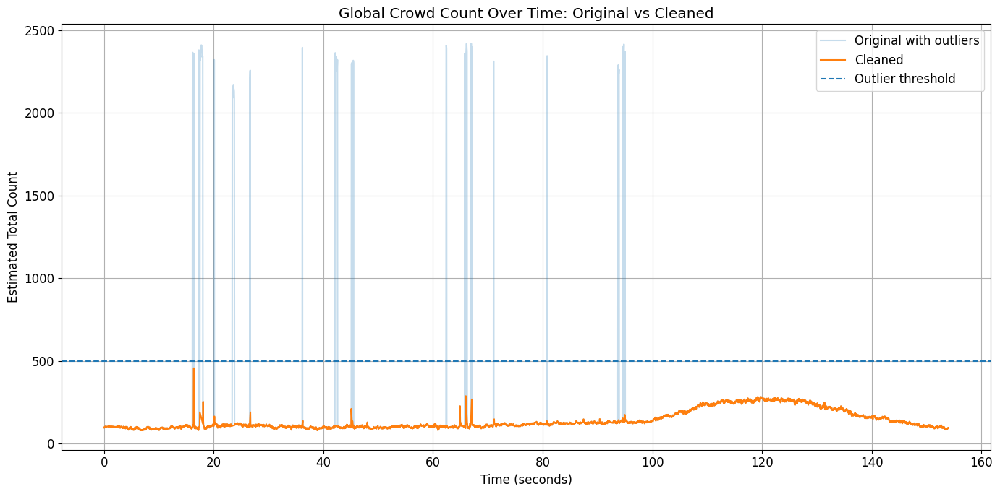

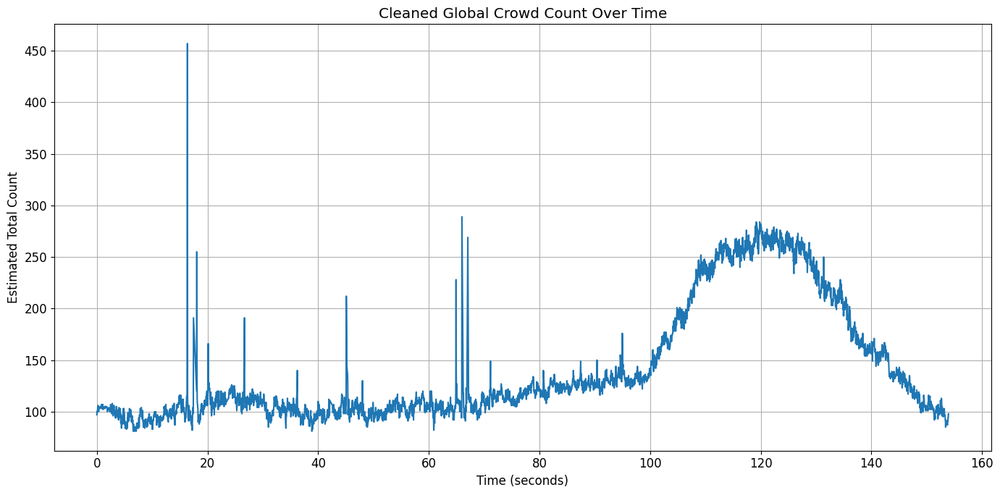

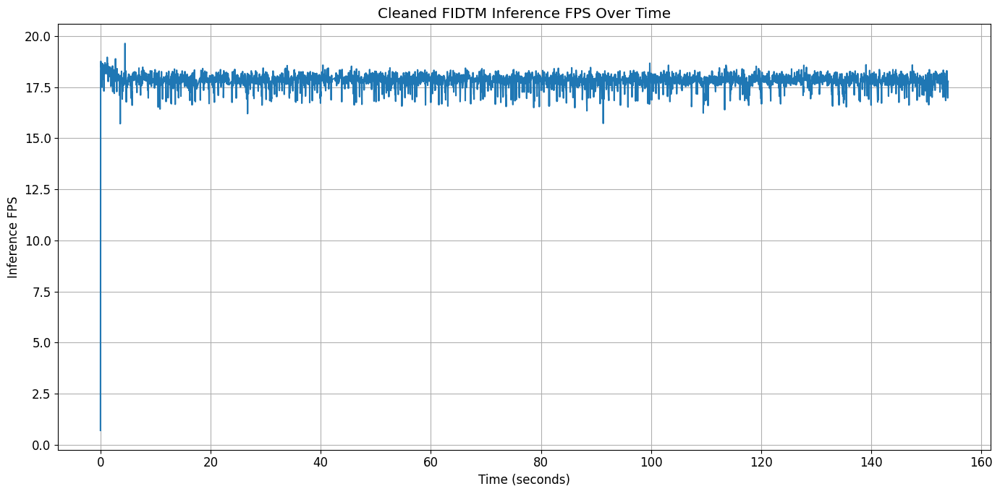

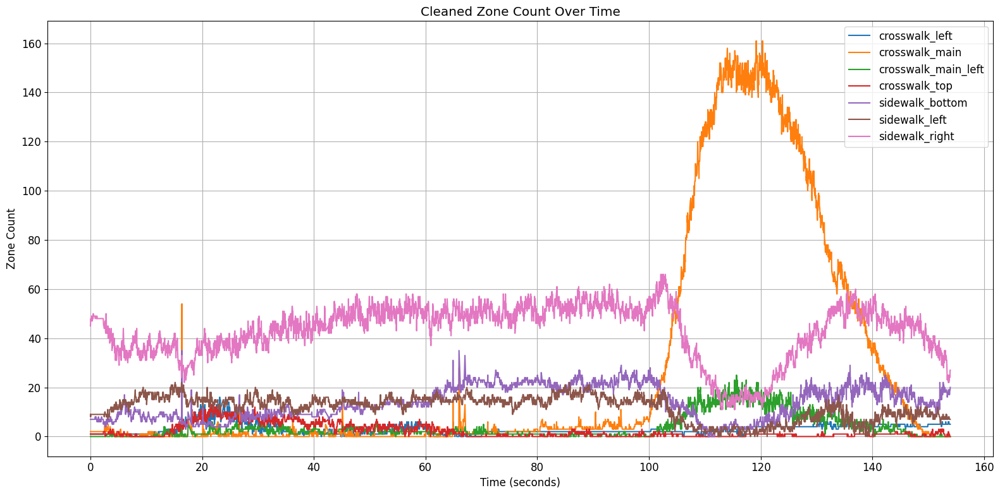

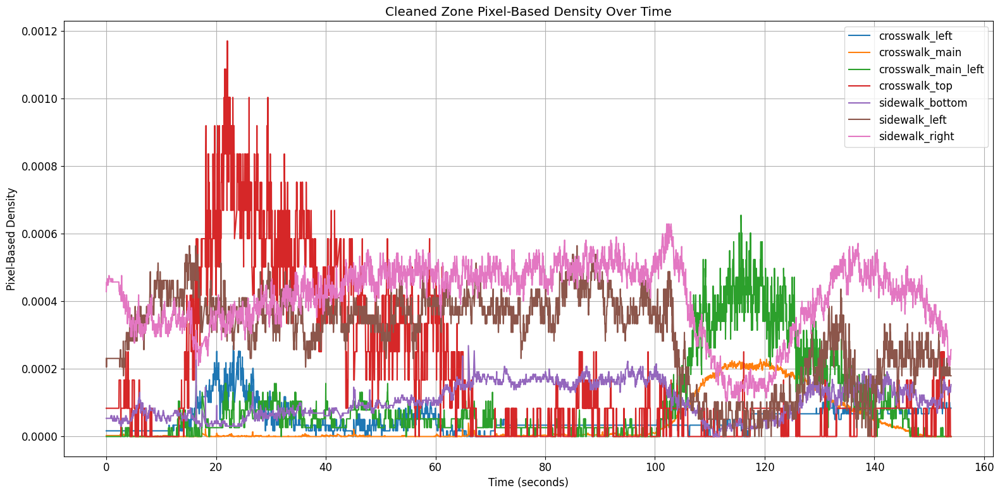

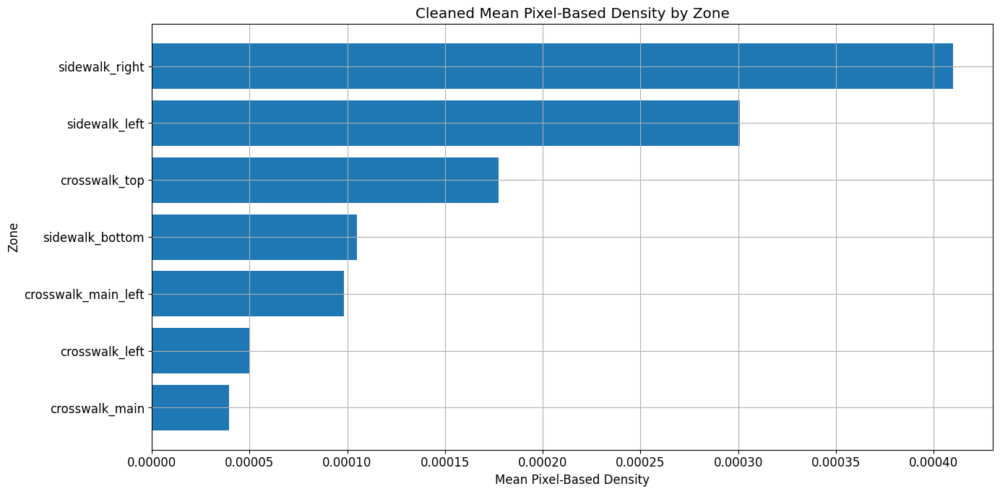

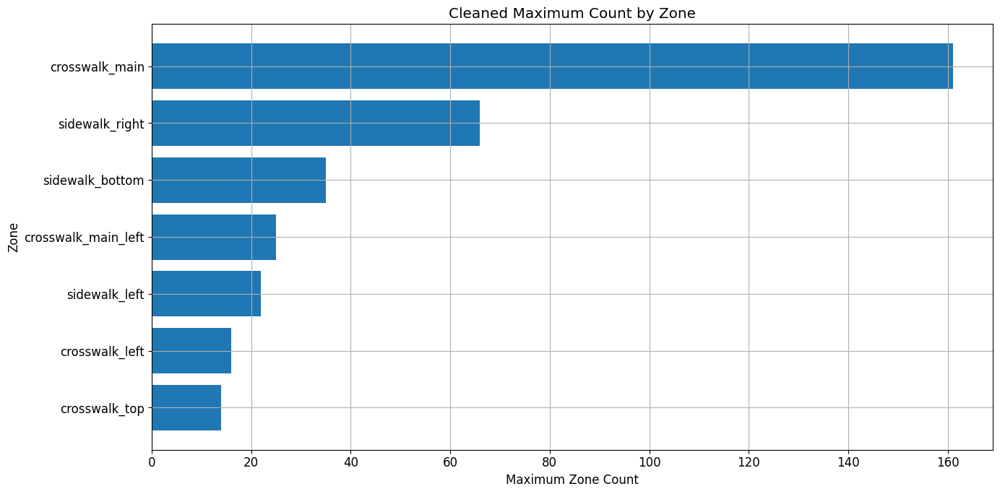

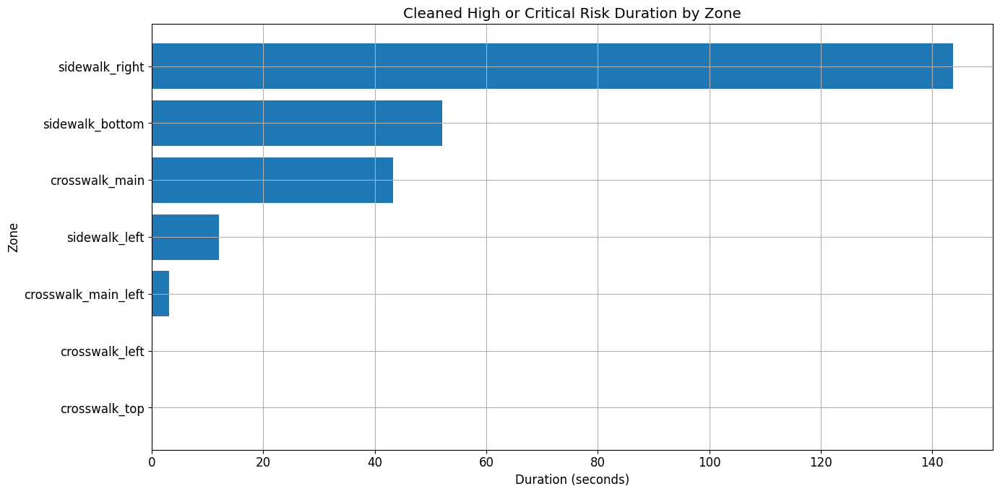

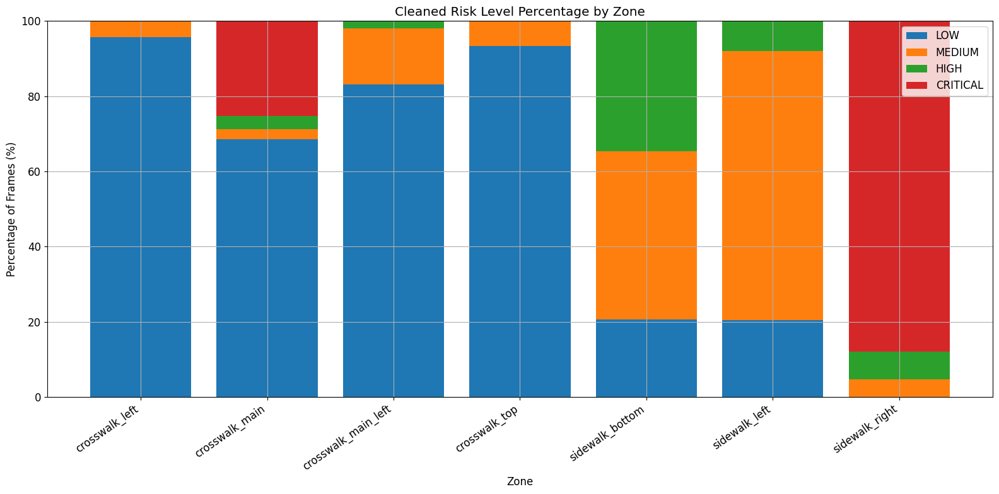

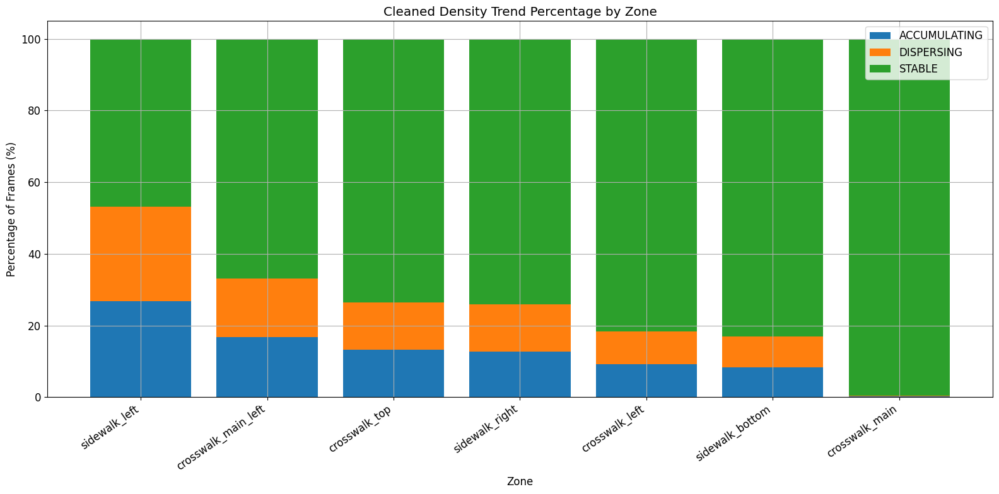

CLEANED SHINJUKU CROWD ANALYSIS INSIGHTS

Outlier Handling
- Outlier threshold: total_count > 500.
- Removed 94 outlier frames from 4627 original frames.
- These rare frames were excluded because they were inconsistent with the visual video output.

1. Global Crowd Count
- Cleaned average estimated total crowd count: 141.27.
- Cleaned median estimated total crowd count: 116.00.
- Cleaned maximum estimated total crowd count: 457.
- Cleaned peak occurred at 16.37 seconds, frame 492.
- Cleaned standard deviation: 56.08.

2. Inference Performance
- Average FIDTM inference FPS: 17.81.
- Average inference time per frame: 0.0565 seconds.

3. Zone Occupancy
- Highest average count zone: sidewalk_right with mean count 43.03.
- Highest cleaned peak count zone: crosswalk_main with max count 161.

4. Zone Density
- Highest average density zone: sidewalk_right with mean density 0.00040971.
- Highest maximum density zone: crosswalk_top with max density 0.00117013.
- Density is more informative than 

In [2]:
# ============================================================
# CLEAN START — DELETE OLD WORKING ANALYSIS + CREATE CLEANED RESULTS
# ============================================================

import os
import json
import shutil
import zipfile
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# ============================================================
# 1) SETTINGS
# ============================================================

OUTLIER_TOTAL_COUNT_THRESHOLD = 500

BASE_OUT = Path("/kaggle/working/crowd_outputs")
ANALYSIS_OUT = BASE_OUT / "analysis_cleaned"
TABLES_OUT = ANALYSIS_OUT / "tables"
FIGURES_OUT = ANALYSIS_OUT / "figures"
INSIGHTS_OUT = ANALYSIS_OUT / "insights"

ZIP_PATH = BASE_OUT / "shinjuku_analysis_outputs_cleaned.zip"

# ============================================================
# 2) DELETE OLD OUTPUTS FROM /kaggle/working
# ============================================================

if ANALYSIS_OUT.exists():
    shutil.rmtree(ANALYSIS_OUT)
    print(f"🧹 Deleted old folder: {ANALYSIS_OUT}")

if ZIP_PATH.exists():
    ZIP_PATH.unlink()
    print(f"🧹 Deleted old ZIP: {ZIP_PATH}")

for p in [BASE_OUT, ANALYSIS_OUT, TABLES_OUT, FIGURES_OUT, INSIGHTS_OUT]:
    p.mkdir(parents=True, exist_ok=True)

print("\n✅ Fresh cleaned analysis folders created:")
print(ANALYSIS_OUT)

# ============================================================
# 3) FIND CSV FILES AUTOMATICALLY
# ============================================================

csv_candidates = []

for root in [Path("/kaggle/input"), Path("/kaggle/working")]:
    if root.exists():
        csv_candidates += list(root.rglob("*.csv"))

print("\n📄 Found CSV files:")
for i, p in enumerate(csv_candidates):
    print(f"[{i}] {p}")

frame_csv = None
zone_csv = None

for p in csv_candidates:
    name = p.name.lower()

    if name == "full_01_shinjuku_frame_counts.csv":
        frame_csv = p

    if name == "full_02_shinjuku_zone_density_risk.csv":
        zone_csv = p

# fallback
if frame_csv is None:
    for p in csv_candidates:
        name = p.name.lower()
        if "frame" in name and "count" in name:
            frame_csv = p
            break

if zone_csv is None:
    for p in csv_candidates:
        name = p.name.lower()
        if "zone" in name and "risk" in name:
            zone_csv = p
            break

if frame_csv is None:
    raise FileNotFoundError("❌ Could not find FULL_01_shinjuku_frame_counts.csv")

if zone_csv is None:
    raise FileNotFoundError("❌ Could not find FULL_02_shinjuku_zone_density_risk.csv")

print("\n✅ Selected frame CSV:")
print(frame_csv)

print("\n✅ Selected zone CSV:")
print(zone_csv)

# ============================================================
# 4) LOAD ORIGINAL CSVs
# ============================================================

df_frame_original = pd.read_csv(frame_csv)
df_zone_original = pd.read_csv(zone_csv)

print("\n✅ Loaded original CSVs")
print("Frame CSV shape:", df_frame_original.shape)
print("Zone CSV shape:", df_zone_original.shape)

print("\n📊 Original total_count summary:")
display(df_frame_original["total_count"].describe())

# ============================================================
# 5) REMOVE OUTLIER FRAMES
# ============================================================

outlier_frames = df_frame_original[
    df_frame_original["total_count"] > OUTLIER_TOTAL_COUNT_THRESHOLD
].copy()

df_frame_cleaned = df_frame_original[
    df_frame_original["total_count"] <= OUTLIER_TOTAL_COUNT_THRESHOLD
].copy()

outlier_frame_ids = set(outlier_frames["frame_id"].tolist())

df_zone_cleaned = df_zone_original[
    ~df_zone_original["frame_id"].isin(outlier_frame_ids)
].copy()

print("\n🚨 Outlier Cleaning")
print("Threshold:", OUTLIER_TOTAL_COUNT_THRESHOLD)
print("Original frames:", len(df_frame_original))
print("Outlier frames removed:", len(outlier_frames))
print("Cleaned frames:", len(df_frame_cleaned))
print("Original zone rows:", len(df_zone_original))
print("Cleaned zone rows:", len(df_zone_cleaned))

print("\n📊 Removed outlier frames:")
display(outlier_frames.sort_values("total_count", ascending=False))

# Save cleaned base files
outlier_frames.to_csv(TABLES_OUT / "outlier_frames_removed.csv", index=False)
df_frame_cleaned.to_csv(TABLES_OUT / "FULL_01_shinjuku_frame_counts_cleaned.csv", index=False)
df_zone_cleaned.to_csv(TABLES_OUT / "FULL_02_shinjuku_zone_density_risk_cleaned.csv", index=False)

# ============================================================
# 6) PREPARE CLEANED DATA
# ============================================================

df_frame = df_frame_cleaned.sort_values("timestamp_sec").reset_index(drop=True)
df_zone = df_zone_cleaned.sort_values(["zone_name", "timestamp_sec"]).reset_index(drop=True)

timestamp_diff = df_frame["timestamp_sec"].diff().dropna()
median_dt = timestamp_diff[timestamp_diff > 0].median()

if pd.notna(median_dt) and median_dt > 0:
    estimated_fps = 1.0 / median_dt
else:
    estimated_fps = 30.0

video_duration_sec = df_frame["timestamp_sec"].max() - df_frame["timestamp_sec"].min()

print("\n✅ Estimated FPS:", estimated_fps)
print("✅ Cleaned duration:", video_duration_sec, "seconds")

# ============================================================
# 7) GLOBAL SUMMARY
# ============================================================

global_summary = pd.DataFrame([{
    "outlier_threshold_total_count": OUTLIER_TOTAL_COUNT_THRESHOLD,
    "outlier_frames_removed": len(outlier_frames),
    "processed_frames_original": len(df_frame_original),
    "processed_frames_cleaned": len(df_frame),
    "video_duration_sec": video_duration_sec,
    "estimated_fps": estimated_fps,

    "mean_total_count": df_frame["total_count"].mean(),
    "median_total_count": df_frame["total_count"].median(),
    "min_total_count": df_frame["total_count"].min(),
    "max_total_count": df_frame["total_count"].max(),
    "std_total_count": df_frame["total_count"].std(),

    "mean_inference_time_sec": df_frame["inference_time_sec"].mean(),
    "median_inference_time_sec": df_frame["inference_time_sec"].median(),
    "mean_inference_fps": df_frame["inference_fps"].mean(),
    "median_inference_fps": df_frame["inference_fps"].median(),
    "min_inference_fps": df_frame["inference_fps"].min(),
    "max_inference_fps": df_frame["inference_fps"].max(),
}])

global_summary.to_csv(TABLES_OUT / "global_count_summary_cleaned.csv", index=False)

print("\n📊 Cleaned Global Summary:")
display(global_summary)

# ============================================================
# 8) TOP PEAK FRAMES AFTER CLEANING
# ============================================================

top_peak_frames = df_frame.sort_values("total_count", ascending=False).head(20).copy()
top_peak_frames.to_csv(TABLES_OUT / "top_20_peak_crowd_frames_cleaned.csv", index=False)

print("\n📊 Top 20 Peak Frames After Cleaning:")
display(top_peak_frames)

# ============================================================
# 9) ZONE COUNT + DENSITY SUMMARY
# ============================================================

zone_summary = df_zone.groupby("zone_name").agg(
    frames_observed=("frame_id", "count"),

    mean_count=("zone_count", "mean"),
    median_count=("zone_count", "median"),
    min_count=("zone_count", "min"),
    max_count=("zone_count", "max"),
    std_count=("zone_count", "std"),

    mean_density=("zone_density_pixel", "mean"),
    median_density=("zone_density_pixel", "median"),
    min_density=("zone_density_pixel", "min"),
    max_density=("zone_density_pixel", "max"),
    std_density=("zone_density_pixel", "std"),

    zone_area_pixels=("zone_area_pixels", "first")
).reset_index()

zone_summary["count_variability"] = zone_summary["std_count"] / (zone_summary["mean_count"] + 1e-9)
zone_summary["density_variability"] = zone_summary["std_density"] / (zone_summary["mean_density"] + 1e-12)

zone_summary = zone_summary.sort_values("mean_density", ascending=False)

zone_summary.to_csv(TABLES_OUT / "zone_count_density_summary_cleaned.csv", index=False)

print("\n📊 Cleaned Zone Count + Density Summary:")
display(zone_summary)

# ============================================================
# 10) RISK DURATION + RISK PERCENTAGE
# ============================================================

risk_counts = pd.crosstab(df_zone["zone_name"], df_zone["risk_level"])

for level in ["LOW", "MEDIUM", "HIGH", "CRITICAL"]:
    if level not in risk_counts.columns:
        risk_counts[level] = 0

risk_counts = risk_counts[["LOW", "MEDIUM", "HIGH", "CRITICAL"]].reset_index()

risk_duration = risk_counts.copy()

for level in ["LOW", "MEDIUM", "HIGH", "CRITICAL"]:
    risk_duration[level + "_frames"] = risk_duration[level]
    risk_duration[level + "_seconds"] = risk_duration[level] / estimated_fps

risk_duration["total_frames"] = risk_duration[["LOW", "MEDIUM", "HIGH", "CRITICAL"]].sum(axis=1)
risk_duration["total_seconds"] = risk_duration["total_frames"] / estimated_fps

risk_duration["high_or_critical_frames"] = risk_duration["HIGH"] + risk_duration["CRITICAL"]
risk_duration["high_or_critical_seconds"] = risk_duration["high_or_critical_frames"] / estimated_fps
risk_duration["high_or_critical_percent"] = (
    risk_duration["high_or_critical_frames"]
    / risk_duration["total_frames"].replace(0, np.nan)
    * 100
).fillna(0)

risk_duration = risk_duration.sort_values("high_or_critical_seconds", ascending=False)

risk_duration.to_csv(TABLES_OUT / "risk_duration_summary_cleaned.csv", index=False)

print("\n📊 Cleaned Risk Duration Summary:")
display(risk_duration)

risk_percent = risk_counts.copy()
risk_percent_total = risk_percent[["LOW", "MEDIUM", "HIGH", "CRITICAL"]].sum(axis=1).replace(0, np.nan)

for level in ["LOW", "MEDIUM", "HIGH", "CRITICAL"]:
    risk_percent[level + "_percent"] = (risk_percent[level] / risk_percent_total * 100).fillna(0)

risk_percent.to_csv(TABLES_OUT / "risk_percentage_summary_cleaned.csv", index=False)

print("\n📊 Cleaned Risk Percentage Summary:")
display(risk_percent)

# ============================================================
# 11) TEMPORAL DENSITY FEATURES
# ============================================================

df_temporal = df_zone.copy()
df_temporal = df_temporal.sort_values(["zone_name", "timestamp_sec"]).reset_index(drop=True)

df_temporal["count_change"] = df_temporal.groupby("zone_name")["zone_count"].diff().fillna(0)
df_temporal["density_change"] = df_temporal.groupby("zone_name")["zone_density_pixel"].diff().fillna(0)

density_std_by_zone = df_temporal.groupby("zone_name")["zone_density_pixel"].transform("std").fillna(0)
density_threshold = (density_std_by_zone * 0.20).clip(lower=1e-8)

df_temporal["density_trend"] = np.select(
    [
        df_temporal["density_change"] > density_threshold,
        df_temporal["density_change"] < -density_threshold
    ],
    [
        "ACCUMULATING",
        "DISPERSING"
    ],
    default="STABLE"
)

count_std_by_zone = df_temporal.groupby("zone_name")["zone_count"].transform("std").fillna(0)
count_threshold = (count_std_by_zone * 0.20).clip(lower=1.0)

df_temporal["count_trend"] = np.select(
    [
        df_temporal["count_change"] > count_threshold,
        df_temporal["count_change"] < -count_threshold
    ],
    [
        "ACCUMULATING",
        "DISPERSING"
    ],
    default="STABLE"
)

df_temporal["is_high_or_critical"] = df_temporal["risk_level"].isin(["HIGH", "CRITICAL"]).astype(int)

def add_risk_streaks(group):
    group = group.copy()
    streak = []
    current = 0

    for value in group["is_high_or_critical"]:
        if value == 1:
            current += 1
        else:
            current = 0

        streak.append(current)

    group["high_or_critical_streak_frames"] = streak
    group["high_or_critical_streak_seconds"] = group["high_or_critical_streak_frames"] / estimated_fps

    return group

df_temporal = df_temporal.groupby("zone_name", group_keys=False).apply(add_risk_streaks)

df_temporal.to_csv(TABLES_OUT / "temporal_density_features_cleaned.csv", index=False)

print("\n📊 Temporal Density Features Cleaned:")
display(df_temporal.head(20))

# ============================================================
# 12) DENSITY TREND SUMMARY
# ============================================================

trend_summary = pd.crosstab(df_temporal["zone_name"], df_temporal["density_trend"]).reset_index()

for col in ["ACCUMULATING", "DISPERSING", "STABLE"]:
    if col not in trend_summary.columns:
        trend_summary[col] = 0

trend_summary["total_frames"] = trend_summary[["ACCUMULATING", "DISPERSING", "STABLE"]].sum(axis=1)

for col in ["ACCUMULATING", "DISPERSING", "STABLE"]:
    trend_summary[col + "_percent"] = (
        trend_summary[col] / trend_summary["total_frames"].replace(0, np.nan) * 100
    ).fillna(0)

trend_summary = trend_summary.sort_values("ACCUMULATING_percent", ascending=False)

trend_summary.to_csv(TABLES_OUT / "density_trend_summary_cleaned.csv", index=False)

print("\n📊 Density Trend Summary Cleaned:")
display(trend_summary)

# ============================================================
# 13) ROLLING 5-SECOND BEHAVIOR FEATURES
# ============================================================

rolling_window_frames = max(3, int(estimated_fps * 5))

df_rolling = df_temporal.copy()

df_rolling["rolling_mean_count_5s"] = (
    df_rolling.groupby("zone_name")["zone_count"]
    .transform(lambda s: s.rolling(rolling_window_frames, min_periods=1).mean())
)

df_rolling["rolling_mean_density_5s"] = (
    df_rolling.groupby("zone_name")["zone_density_pixel"]
    .transform(lambda s: s.rolling(rolling_window_frames, min_periods=1).mean())
)

df_rolling["rolling_mean_density_change_5s"] = (
    df_rolling.groupby("zone_name")["density_change"]
    .transform(lambda s: s.rolling(rolling_window_frames, min_periods=1).mean())
)

df_rolling.to_csv(TABLES_OUT / "rolling_behavior_features_5s_cleaned.csv", index=False)

print("\n📊 Rolling 5s Behavior Features Cleaned:")
display(df_rolling.head(20))

# ============================================================
# 14) SIMPLE CSV-BASED ANOMALY DETECTION
# ============================================================

df_anomaly = df_temporal.copy()

window = rolling_window_frames

def add_anomaly_scores(group):
    group = group.sort_values("timestamp_sec").copy()

    rolling_mean = group["zone_density_pixel"].rolling(window, min_periods=5).mean()
    rolling_std = group["zone_density_pixel"].rolling(window, min_periods=5).std()

    group["density_rolling_mean_5s"] = rolling_mean
    group["density_rolling_std_5s"] = rolling_std

    group["density_z_score"] = (
        (group["zone_density_pixel"] - rolling_mean) /
        rolling_std.replace(0, np.nan)
    ).replace([np.inf, -np.inf], np.nan).fillna(0)

    group["density_spike_anomaly"] = (group["density_z_score"] > 2.5).astype(int)

    dc_mean = group["density_change"].rolling(window, min_periods=5).mean()
    dc_std = group["density_change"].rolling(window, min_periods=5).std()

    group["density_change_z_score"] = (
        (group["density_change"] - dc_mean) /
        dc_std.replace(0, np.nan)
    ).replace([np.inf, -np.inf], np.nan).fillna(0)

    group["accumulation_anomaly"] = (group["density_change_z_score"] > 2.5).astype(int)

    group["csv_anomaly_score"] = (
        0.60 * group["density_spike_anomaly"] +
        0.40 * group["accumulation_anomaly"]
    )

    return group

df_anomaly = df_anomaly.groupby("zone_name", group_keys=False).apply(add_anomaly_scores)

df_anomaly.to_csv(TABLES_OUT / "csv_based_anomaly_features_cleaned.csv", index=False)

anomaly_summary = df_anomaly.groupby("zone_name").agg(
    density_spike_anomalies=("density_spike_anomaly", "sum"),
    accumulation_anomalies=("accumulation_anomaly", "sum"),
    mean_density_z_score=("density_z_score", "mean"),
    max_density_z_score=("density_z_score", "max"),
    mean_density_change_z_score=("density_change_z_score", "mean"),
    max_density_change_z_score=("density_change_z_score", "max"),
).reset_index()

anomaly_summary.to_csv(TABLES_OUT / "csv_based_anomaly_summary_cleaned.csv", index=False)

print("\n📊 CSV-Based Anomaly Summary Cleaned:")
display(anomaly_summary)

# ============================================================
# 15) FIGURES
# ============================================================

plt.rcParams.update({
    "figure.figsize": (14, 7),
    "axes.grid": True,
    "font.size": 12
})

# Original vs cleaned global count
plt.figure()
plt.plot(df_frame_original["timestamp_sec"], df_frame_original["total_count"], alpha=0.25, label="Original with outliers")
plt.plot(df_frame["timestamp_sec"], df_frame["total_count"], label="Cleaned")
plt.axhline(OUTLIER_TOTAL_COUNT_THRESHOLD, linestyle="--", label="Outlier threshold")
plt.title("Global Crowd Count Over Time: Original vs Cleaned")
plt.xlabel("Time (seconds)")
plt.ylabel("Estimated Total Count")
plt.legend()
plt.tight_layout()
plt.savefig(FIGURES_OUT / "global_count_original_vs_cleaned.png", dpi=200)
plt.show()

# Cleaned global count
plt.figure()
plt.plot(df_frame["timestamp_sec"], df_frame["total_count"])
plt.title("Cleaned Global Crowd Count Over Time")
plt.xlabel("Time (seconds)")
plt.ylabel("Estimated Total Count")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "global_count_over_time_cleaned.png", dpi=200)
plt.show()

# Inference FPS over time
plt.figure()
plt.plot(df_frame["timestamp_sec"], df_frame["inference_fps"])
plt.title("Cleaned FIDTM Inference FPS Over Time")
plt.xlabel("Time (seconds)")
plt.ylabel("Inference FPS")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "inference_fps_over_time_cleaned.png", dpi=200)
plt.show()

# Zone count over time
plt.figure(figsize=(16, 8))
for zone in df_zone["zone_name"].unique():
    subset = df_zone[df_zone["zone_name"] == zone]
    plt.plot(subset["timestamp_sec"], subset["zone_count"], label=zone)

plt.title("Cleaned Zone Count Over Time")
plt.xlabel("Time (seconds)")
plt.ylabel("Zone Count")
plt.legend(loc="upper right")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "zone_count_over_time_cleaned.png", dpi=200)
plt.show()

# Zone density over time
plt.figure(figsize=(16, 8))
for zone in df_zone["zone_name"].unique():
    subset = df_zone[df_zone["zone_name"] == zone]
    plt.plot(subset["timestamp_sec"], subset["zone_density_pixel"], label=zone)

plt.title("Cleaned Zone Pixel-Based Density Over Time")
plt.xlabel("Time (seconds)")
plt.ylabel("Pixel-Based Density")
plt.legend(loc="upper right")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "zone_density_over_time_cleaned.png", dpi=200)
plt.show()

# Mean density by zone
plt.figure(figsize=(14, 7))
plot_data = zone_summary.sort_values("mean_density", ascending=True)
plt.barh(plot_data["zone_name"], plot_data["mean_density"])
plt.title("Cleaned Mean Pixel-Based Density by Zone")
plt.xlabel("Mean Pixel-Based Density")
plt.ylabel("Zone")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "mean_density_by_zone_cleaned.png", dpi=200)
plt.show()

# Max count by zone
plt.figure(figsize=(14, 7))
plot_data = zone_summary.sort_values("max_count", ascending=True)
plt.barh(plot_data["zone_name"], plot_data["max_count"])
plt.title("Cleaned Maximum Count by Zone")
plt.xlabel("Maximum Zone Count")
plt.ylabel("Zone")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "max_count_by_zone_cleaned.png", dpi=200)
plt.show()

# High/Critical duration
plt.figure(figsize=(14, 7))
plot_data = risk_duration.sort_values("high_or_critical_seconds", ascending=True)
plt.barh(plot_data["zone_name"], plot_data["high_or_critical_seconds"])
plt.title("Cleaned High or Critical Risk Duration by Zone")
plt.xlabel("Duration (seconds)")
plt.ylabel("Zone")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "high_critical_risk_duration_by_zone_cleaned.png", dpi=200)
plt.show()

# Risk percentage stacked
risk_plot = risk_percent.set_index("zone_name")[["LOW_percent", "MEDIUM_percent", "HIGH_percent", "CRITICAL_percent"]]

plt.figure(figsize=(16, 8))
bottom = np.zeros(len(risk_plot))

for col in risk_plot.columns:
    values = risk_plot[col].values
    plt.bar(risk_plot.index, values, bottom=bottom, label=col.replace("_percent", ""))
    bottom += values

plt.title("Cleaned Risk Level Percentage by Zone")
plt.xlabel("Zone")
plt.ylabel("Percentage of Frames (%)")
plt.xticks(rotation=35, ha="right")
plt.legend()
plt.tight_layout()
plt.savefig(FIGURES_OUT / "risk_percentage_by_zone_cleaned.png", dpi=200)
plt.show()

# Density trend stacked
trend_plot = trend_summary.set_index("zone_name")[["ACCUMULATING_percent", "DISPERSING_percent", "STABLE_percent"]]

plt.figure(figsize=(16, 8))
bottom = np.zeros(len(trend_plot))

for col in trend_plot.columns:
    values = trend_plot[col].values
    plt.bar(trend_plot.index, values, bottom=bottom, label=col.replace("_percent", ""))
    bottom += values

plt.title("Cleaned Density Trend Percentage by Zone")
plt.xlabel("Zone")
plt.ylabel("Percentage of Frames (%)")
plt.xticks(rotation=35, ha="right")
plt.legend()
plt.tight_layout()
plt.savefig(FIGURES_OUT / "density_trend_percentage_by_zone_cleaned.png", dpi=200)
plt.show()

# ============================================================
# 16) AUTOMATIC INSIGHTS
# ============================================================

highest_mean_count = zone_summary.sort_values("mean_count", ascending=False).iloc[0]
highest_max_count = zone_summary.sort_values("max_count", ascending=False).iloc[0]
highest_mean_density = zone_summary.sort_values("mean_density", ascending=False).iloc[0]
highest_max_density = zone_summary.sort_values("max_density", ascending=False).iloc[0]
highest_risk_duration = risk_duration.sort_values("high_or_critical_seconds", ascending=False).iloc[0]
highest_accumulating = trend_summary.sort_values("ACCUMULATING_percent", ascending=False).iloc[0]
peak_frame = df_frame.sort_values("total_count", ascending=False).iloc[0]

insights = []

insights.append("CLEANED SHINJUKU CROWD ANALYSIS INSIGHTS")
insights.append("=" * 55)
insights.append("")

insights.append("Outlier Handling")
insights.append(f"- Outlier threshold: total_count > {OUTLIER_TOTAL_COUNT_THRESHOLD}.")
insights.append(f"- Removed {len(outlier_frames)} outlier frames from {len(df_frame_original)} original frames.")
insights.append("- These rare frames were excluded because they were inconsistent with the visual video output.")
insights.append("")

insights.append("1. Global Crowd Count")
insights.append(f"- Cleaned average estimated total crowd count: {global_summary.loc[0, 'mean_total_count']:.2f}.")
insights.append(f"- Cleaned median estimated total crowd count: {global_summary.loc[0, 'median_total_count']:.2f}.")
insights.append(f"- Cleaned maximum estimated total crowd count: {global_summary.loc[0, 'max_total_count']:.0f}.")
insights.append(f"- Cleaned peak occurred at {peak_frame['timestamp_sec']:.2f} seconds, frame {int(peak_frame['frame_id'])}.")
insights.append(f"- Cleaned standard deviation: {global_summary.loc[0, 'std_total_count']:.2f}.")
insights.append("")

insights.append("2. Inference Performance")
insights.append(f"- Average FIDTM inference FPS: {global_summary.loc[0, 'mean_inference_fps']:.2f}.")
insights.append(f"- Average inference time per frame: {global_summary.loc[0, 'mean_inference_time_sec']:.4f} seconds.")
insights.append("")

insights.append("3. Zone Occupancy")
insights.append(f"- Highest average count zone: {highest_mean_count['zone_name']} with mean count {highest_mean_count['mean_count']:.2f}.")
insights.append(f"- Highest cleaned peak count zone: {highest_max_count['zone_name']} with max count {highest_max_count['max_count']:.0f}.")
insights.append("")

insights.append("4. Zone Density")
insights.append(f"- Highest average density zone: {highest_mean_density['zone_name']} with mean density {highest_mean_density['mean_density']:.8f}.")
insights.append(f"- Highest maximum density zone: {highest_max_density['zone_name']} with max density {highest_max_density['max_density']:.8f}.")
insights.append("- Density is more informative than raw count because every polygon zone has a different area.")
insights.append("")

insights.append("5. Risk Duration")
insights.append(f"- Longest HIGH/CRITICAL risk duration zone: {highest_risk_duration['zone_name']} lasting {highest_risk_duration['high_or_critical_seconds']:.2f} seconds.")
insights.append(f"- This equals {highest_risk_duration['high_or_critical_percent']:.2f}% of cleaned frames for that zone.")
insights.append("")

insights.append("6. Temporal Density Trend")
insights.append(f"- Highest accumulation percentage zone: {highest_accumulating['zone_name']} with {highest_accumulating['ACCUMULATING_percent']:.2f}% accumulating frames.")
insights.append("- This is the first behavior-analysis step before optical-flow motion analysis.")
insights.append("")

insights.append("Conclusion")
insights.append("- The cleaned results provide reliable quantitative evidence for count trends, density trends, risk duration, and early behavior indicators.")
insights.append("- These results should be used for thesis tables and figures instead of the original outlier-included analysis.")

INSIGHTS_TXT_PATH = INSIGHTS_OUT / "cleaned_analysis_insights.txt"

with open(INSIGHTS_TXT_PATH, "w", encoding="utf-8") as f:
    f.write("\n".join(insights))

print("\n".join(insights))

summary_json = {
    "outlier_threshold_total_count": OUTLIER_TOTAL_COUNT_THRESHOLD,
    "outlier_frames_removed": int(len(outlier_frames)),
    "original_frames": int(len(df_frame_original)),
    "cleaned_frames": int(len(df_frame)),
    "global_summary_cleaned": global_summary.to_dict(orient="records")[0],
    "highest_mean_count_zone": highest_mean_count.to_dict(),
    "highest_max_count_zone": highest_max_count.to_dict(),
    "highest_mean_density_zone": highest_mean_density.to_dict(),
    "highest_max_density_zone": highest_max_density.to_dict(),
    "highest_high_or_critical_duration_zone": highest_risk_duration.to_dict(),
    "highest_accumulating_zone": highest_accumulating.to_dict(),
    "peak_global_count_frame_cleaned": peak_frame.to_dict(),
}

with open(INSIGHTS_OUT / "cleaned_analysis_summary.json", "w", encoding="utf-8") as f:
    json.dump(summary_json, f, indent=4)

# ============================================================
# 17) ZIP CLEANED ANALYSIS OUTPUTS
# ============================================================

with zipfile.ZipFile(ZIP_PATH, "w", zipfile.ZIP_DEFLATED) as zipf:
    for file in ANALYSIS_OUT.rglob("*"):
        if file.is_file():
            zipf.write(file, file.relative_to(BASE_OUT))

print("\n✅ Cleaned analysis complete.")
print("📁 Cleaned analysis folder:", ANALYSIS_OUT)
print("📦 ZIP file:", ZIP_PATH)

print("\n✅ Cleaned tables saved:")
for file in sorted(TABLES_OUT.glob("*.csv")):
    print("-", file)

print("\n✅ Cleaned figures saved:")
for file in sorted(FIGURES_OUT.glob("*.png")):
    print("-", file)

print("\n✅ Cleaned insights saved:")
for file in sorted(INSIGHTS_OUT.glob("*")):
    print("-", file)

✅ Clean folders ready:
/kaggle/working/crowd_outputs

🎥 Found videos:
[0] /kaggle/input/datasets/yahiaelgayar/demo-video2/test2.mp4
[1] /kaggle/input/datasets/yahiaelgayar/demo-final/demo final video.mp4
[2] /kaggle/input/datasets/yahiaelgayar/complete-demo-video/(1498) LIVE2024 Tokyo Shinjuku   Live Ch - YouTube - Google Chrome 2026-05-24 00-44-47.mp4
[3] /kaggle/input/datasets/yahiaelgayar/demo-video1/test1.mp4
[4] /kaggle/input/datasets/yahiaelgayar/demo-video3/test3.mp4
[5] /kaggle/input/datasets/yahiaelgayar/demo-video4/test4.mp4

✅ Selected video:
/kaggle/input/datasets/yahiaelgayar/complete-demo-video/(1498) LIVE2024 Tokyo Shinjuku   Live Ch - YouTube - Google Chrome 2026-05-24 00-44-47.mp4

🎥 Video info
Resolution: 1920 x 1080
FPS: 30.039363265316705
Total frames: 9269
Duration seconds: 308.5618
Duration minutes: 5.142696666666667
✅ Saved first frame 0: /kaggle/working/crowd_outputs/frames/first_frame_0.jpg
✅ Saved quarter frame 2317: /kaggle/working/crowd_outputs/frames/quarte

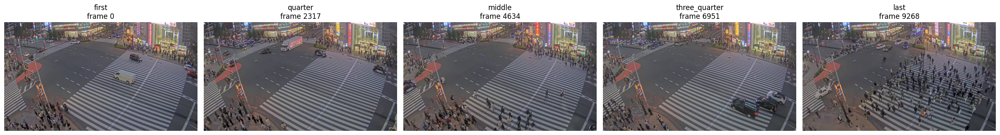


✅ Contact sheet saved:
/kaggle/working/crowd_outputs/visualizations/complete_demo_frame_selection_contact_sheet.jpg

📌 Download this image and open it in Labelme:
/kaggle/working/crowd_outputs/zone_annotation/complete_demo_zone_frame.jpg


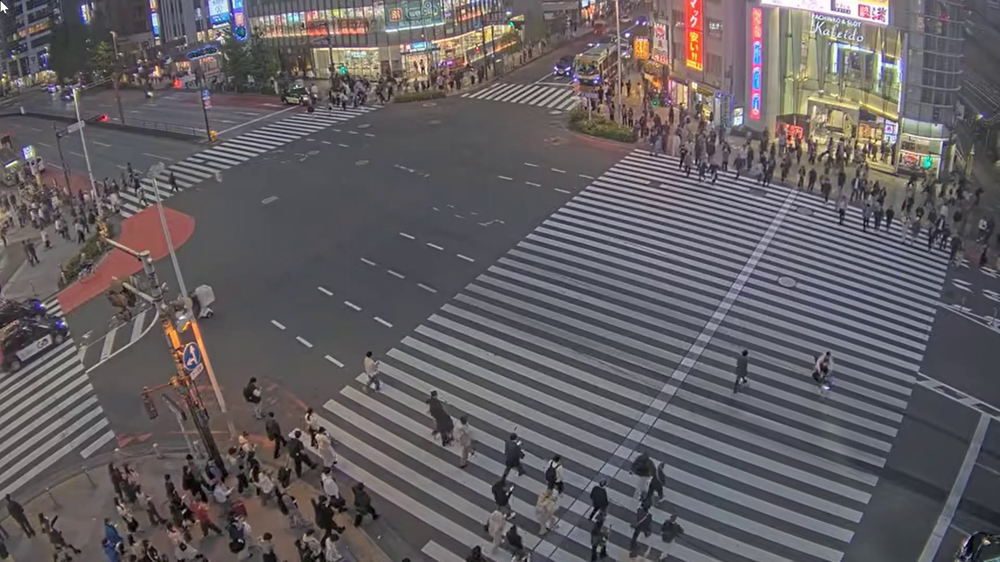


✅ Saved path info:
/kaggle/working/crowd_outputs/path_info_complete_demo.json

✅ Cell 1 finished.


In [1]:
# ============================================================
# CELL 1 — FIND 5-MIN VIDEO + EXTRACT FRAMES FOR LABELME
# ============================================================

import os
import cv2
import json
import shutil
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Image

# ------------------------------------------------------------
# Output folders
# ------------------------------------------------------------
BASE_OUT = Path("/kaggle/working/crowd_outputs")
FRAME_OUT = BASE_OUT / "frames"
ZONE_OUT = BASE_OUT / "zone_annotation"
VIS_OUT = BASE_OUT / "visualizations"

for p in [BASE_OUT, FRAME_OUT, ZONE_OUT, VIS_OUT]:
    p.mkdir(parents=True, exist_ok=True)

# Clean previous zone/frame extraction outputs only
for folder in [FRAME_OUT, ZONE_OUT, VIS_OUT]:
    for item in folder.iterdir():
        if item.is_file() or item.is_symlink():
            item.unlink()
        elif item.is_dir():
            shutil.rmtree(item)

print("✅ Clean folders ready:")
print(BASE_OUT)

# ------------------------------------------------------------
# Find video automatically
# ------------------------------------------------------------
video_candidates = []

for root in [Path("/kaggle/input"), Path("/kaggle/working")]:
    if root.exists():
        for ext in ["*.mp4", "*.avi", "*.mov", "*.mkv"]:
            video_candidates += list(root.rglob(ext))

print("\n🎥 Found videos:")
for i, p in enumerate(video_candidates):
    print(f"[{i}] {p}")

if not video_candidates:
    raise FileNotFoundError("❌ No video found. Add/upload the 5-minute video dataset first.")

# Prefer names that look like complete/demo/shinjuku/live
VIDEO_PATH = None
preferred_keywords = [
    "complete",
    "demo",
    "shinjuku",
    "tokyo",
    "live"
]

for keyword in preferred_keywords:
    for p in video_candidates:
        if keyword.lower() in str(p).lower():
            VIDEO_PATH = str(p)
            break
    if VIDEO_PATH:
        break

if VIDEO_PATH is None:
    VIDEO_PATH = str(video_candidates[0])

print("\n✅ Selected video:")
print(VIDEO_PATH)

# ------------------------------------------------------------
# Read video info
# ------------------------------------------------------------
cap = cv2.VideoCapture(VIDEO_PATH)

if not cap.isOpened():
    raise RuntimeError("❌ Could not open selected video.")

fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
duration_sec = total_frames / fps if fps > 0 else 0

print("\n🎥 Video info")
print("Resolution:", width, "x", height)
print("FPS:", fps)
print("Total frames:", total_frames)
print("Duration seconds:", duration_sec)
print("Duration minutes:", duration_sec / 60)

cap.release()

# ------------------------------------------------------------
# Helper: extract frame
# ------------------------------------------------------------
def extract_frame(video_path, frame_index, save_path):
    cap = cv2.VideoCapture(video_path)
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)
    ok, frame = cap.read()
    cap.release()

    if not ok or frame is None:
        raise RuntimeError(f"❌ Could not extract frame {frame_index}")

    cv2.imwrite(str(save_path), frame)
    return frame

# ------------------------------------------------------------
# Extract representative frames
# ------------------------------------------------------------
frame_indices = {
    "first": 0,
    "quarter": int(total_frames * 0.25),
    "middle": int(total_frames * 0.50),
    "three_quarter": int(total_frames * 0.75),
    "last": max(total_frames - 1, 0),
}

saved_frames = {}

for name, idx in frame_indices.items():
    save_path = FRAME_OUT / f"{name}_frame_{idx}.jpg"
    frame = extract_frame(VIDEO_PATH, idx, save_path)

    saved_frames[name] = {
        "index": idx,
        "path": save_path,
        "frame": frame
    }

    print(f"✅ Saved {name} frame {idx}: {save_path}")

# ------------------------------------------------------------
# Use middle frame as Labelme frame
# ------------------------------------------------------------
ZONE_FRAME_PATH = ZONE_OUT / "complete_demo_zone_frame.jpg"
shutil.copy(saved_frames["middle"]["path"], ZONE_FRAME_PATH)

print("\n✅ Main Labelme frame saved:")
print(ZONE_FRAME_PATH)

# ------------------------------------------------------------
# Contact sheet
# ------------------------------------------------------------
fig, axes = plt.subplots(1, 5, figsize=(24, 6))

for ax, (name, info) in zip(axes, saved_frames.items()):
    rgb = cv2.cvtColor(info["frame"], cv2.COLOR_BGR2RGB)
    ax.imshow(rgb)
    ax.set_title(f"{name}\nframe {info['index']}")
    ax.axis("off")

plt.tight_layout()

CONTACT_SHEET_PATH = VIS_OUT / "complete_demo_frame_selection_contact_sheet.jpg"
plt.savefig(CONTACT_SHEET_PATH, dpi=150, bbox_inches="tight")
plt.show()

print("\n✅ Contact sheet saved:")
print(CONTACT_SHEET_PATH)

print("\n📌 Download this image and open it in Labelme:")
print(ZONE_FRAME_PATH)

display(Image(filename=str(ZONE_FRAME_PATH)))

# ------------------------------------------------------------
# Save path info
# ------------------------------------------------------------
PATH_INFO = {
    "VIDEO_PATH": VIDEO_PATH,
    "BASE_OUT": str(BASE_OUT),
    "FRAME_OUT": str(FRAME_OUT),
    "ZONE_OUT": str(ZONE_OUT),
    "VIS_OUT": str(VIS_OUT),
    "ZONE_FRAME_PATH": str(ZONE_FRAME_PATH),
    "fps": fps,
    "total_frames": total_frames,
    "width": width,
    "height": height,
    "duration_sec": duration_sec
}

PATH_INFO_PATH = BASE_OUT / "path_info_complete_demo.json"

with open(PATH_INFO_PATH, "w") as f:
    json.dump(PATH_INFO, f, indent=4)

print("\n✅ Saved path info:")
print(PATH_INFO_PATH)

print("\n✅ Cell 1 finished.")

✅ Loaded path info
Video: /kaggle/input/datasets/yahiaelgayar/complete-demo-video/(1498) LIVE2024 Tokyo Shinjuku   Live Ch - YouTube - Google Chrome 2026-05-24 00-44-47.mp4
Zone frame: /kaggle/working/crowd_outputs/zone_annotation/complete_demo_zone_frame.jpg

📄 Found JSON files:
[0] /kaggle/input/datasets/yahiaelgayar/zone-config2/complete_demo_zone_frame.json
[1] /kaggle/input/datasets/yahiaelgayar/zones-config1/zone_frame.json

✅ Selected zone JSON:
/kaggle/input/datasets/yahiaelgayar/zone-config2/complete_demo_zone_frame.json

✅ Copied zone JSON to:
/kaggle/working/crowd_outputs/zone_annotation/zones_config_complete_demo.json

✅ Zones loaded:
1. sidewalk_right | type=polygon | points=12
2. crosswalk_main | type=polygon | points=9
3. sidewalk_bottom | type=polygon | points=5
4. crosswalk_top | type=polygon | points=5
5. crosswalk_bottom | type=polygon | points=5
6. crosswalk_left | type=polygon | points=7
7. sidewalk_top | type=polygon | points=11
8. sidewalk_left | type=polygon | p

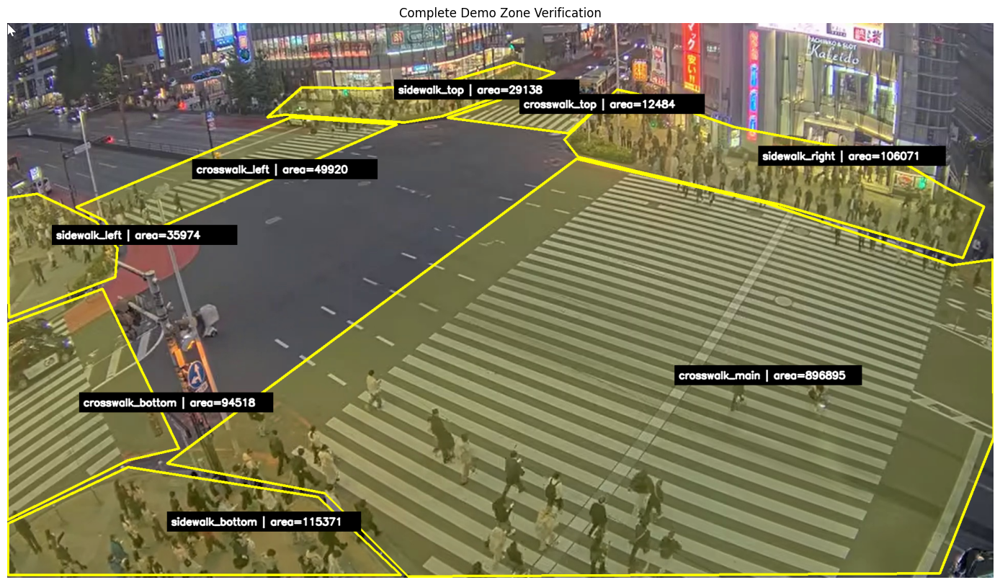

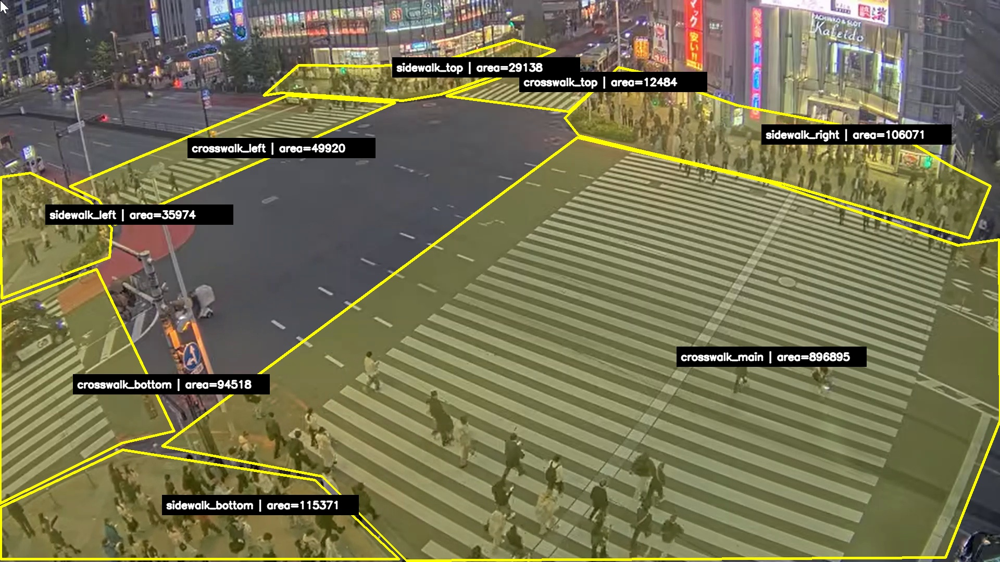


✅ Cell 2 finished. If zones look correct, next we run the 300-frame test pipeline.


In [2]:
# ============================================================
# CELL 2 — VERIFY COMPLETE DEMO LABELME ZONES
# ============================================================

import os
import cv2
import json
import shutil
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, Image

# ------------------------------------------------------------
# Load path info from Cell 1
# ------------------------------------------------------------
BASE_OUT = Path("/kaggle/working/crowd_outputs")
PATH_INFO_PATH = BASE_OUT / "path_info_complete_demo.json"

if not PATH_INFO_PATH.exists():
    raise FileNotFoundError("❌ path_info_complete_demo.json not found. Run Cell 1 first.")

with open(PATH_INFO_PATH, "r") as f:
    PATH_INFO = json.load(f)

VIDEO_PATH = PATH_INFO["VIDEO_PATH"]
ZONE_FRAME_PATH = Path(PATH_INFO["ZONE_FRAME_PATH"])
ZONE_OUT = Path(PATH_INFO["ZONE_OUT"])
VIS_OUT = Path(PATH_INFO["VIS_OUT"])

print("✅ Loaded path info")
print("Video:", VIDEO_PATH)
print("Zone frame:", ZONE_FRAME_PATH)

# ------------------------------------------------------------
# Find JSON automatically
# ------------------------------------------------------------
json_candidates = []

for root in [Path("/kaggle/input"), Path("/kaggle/working")]:
    if root.exists():
        for p in root.rglob("*.json"):
            name = p.name.lower()
            if "path_info" not in name:
                json_candidates.append(p)

print("\n📄 Found JSON files:")
for i, p in enumerate(json_candidates):
    print(f"[{i}] {p}")

if not json_candidates:
    raise FileNotFoundError("❌ No JSON files found. Add the zone-config2 dataset first.")

ZONE_JSON_SOURCE = None

preferred_names = [
    "complete_demo_zone_frame.json",
    "zone_frame.json",
    "zones_config.json"
]

for preferred in preferred_names:
    for p in json_candidates:
        if p.name.lower() == preferred.lower():
            ZONE_JSON_SOURCE = p
            break
    if ZONE_JSON_SOURCE:
        break

if ZONE_JSON_SOURCE is None:
    ZONE_JSON_SOURCE = json_candidates[0]

print("\n✅ Selected zone JSON:")
print(ZONE_JSON_SOURCE)

# ------------------------------------------------------------
# Copy JSON into working zone folder
# ------------------------------------------------------------
ZONE_JSON_PATH = ZONE_OUT / "zones_config_complete_demo.json"
shutil.copy(ZONE_JSON_SOURCE, ZONE_JSON_PATH)

print("\n✅ Copied zone JSON to:")
print(ZONE_JSON_PATH)

# Update path info
PATH_INFO["ZONE_JSON_PATH"] = str(ZONE_JSON_PATH)

with open(PATH_INFO_PATH, "w") as f:
    json.dump(PATH_INFO, f, indent=4)

# ------------------------------------------------------------
# Load Labelme JSON
# ------------------------------------------------------------
with open(ZONE_JSON_PATH, "r") as f:
    zone_data = json.load(f)

if "shapes" not in zone_data:
    raise ValueError("❌ This does not look like Labelme JSON. Missing 'shapes'.")

shapes = zone_data["shapes"]

if len(shapes) == 0:
    raise ValueError("❌ JSON has no shapes. Did you draw polygons?")

print("\n✅ Zones loaded:")
for i, shape in enumerate(shapes):
    label = shape.get("label", f"zone_{i}")
    points = shape.get("points", [])
    shape_type = shape.get("shape_type", "unknown")
    print(f"{i+1}. {label} | type={shape_type} | points={len(points)}")

# ------------------------------------------------------------
# Read zone frame
# ------------------------------------------------------------
frame = cv2.imread(str(ZONE_FRAME_PATH))

if frame is None:
    raise RuntimeError(f"❌ Could not read zone frame: {ZONE_FRAME_PATH}")

overlay = frame.copy()

zone_summary = []

# ------------------------------------------------------------
# Draw polygons
# ------------------------------------------------------------
for idx, shape in enumerate(shapes):
    label = shape.get("label", f"zone_{idx}")
    points = shape.get("points", [])

    if len(points) < 3:
        print(f"⚠️ Skipping {label}: fewer than 3 points")
        continue

    polygon = np.array(points, dtype=np.int32)
    area = float(abs(cv2.contourArea(polygon)))

    zone_summary.append({
        "zone_name": label,
        "num_points": len(points),
        "pixel_area": area
    })

    # outline
    cv2.polylines(
        overlay,
        [polygon],
        isClosed=True,
        color=(0, 255, 255),
        thickness=3
    )

    # transparent fill
    fill = overlay.copy()
    cv2.fillPoly(fill, [polygon], color=(0, 255, 255))
    overlay = cv2.addWeighted(fill, 0.18, overlay, 0.82, 0)

    # label
    cx = int(np.mean(polygon[:, 0]))
    cy = int(np.mean(polygon[:, 1]))

    text = f"{label} | area={int(area)}"
    box_w = max(360, min(680, 13 * len(text)))
    box_h = 38

    x1 = max(5, cx - 10)
    y1 = max(5, cy - 30)
    x2 = min(overlay.shape[1] - 5, x1 + box_w)
    y2 = min(overlay.shape[0] - 5, y1 + box_h)

    cv2.rectangle(overlay, (x1, y1), (x2, y2), (0, 0, 0), -1)
    cv2.putText(
        overlay,
        text,
        (x1 + 8, y1 + 26),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.65,
        (255, 255, 255),
        2,
        cv2.LINE_AA
    )

# ------------------------------------------------------------
# Save outputs
# ------------------------------------------------------------
ZONE_VERIFY_PATH = VIS_OUT / "complete_demo_zone_verification_overlay.jpg"
cv2.imwrite(str(ZONE_VERIFY_PATH), overlay)

ZONE_SUMMARY_PATH = ZONE_OUT / "complete_demo_zone_summary.json"
with open(ZONE_SUMMARY_PATH, "w") as f:
    json.dump(zone_summary, f, indent=4)

print("\n✅ Zone verification saved:")
print(ZONE_VERIFY_PATH)

print("\n✅ Zone summary saved:")
print(ZONE_SUMMARY_PATH)

print("\n📊 Zone Summary:")
for z in zone_summary:
    print(f"- {z['zone_name']}: area={z['pixel_area']:.2f}, points={z['num_points']}")

# Display
plt.figure(figsize=(18, 10))
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Complete Demo Zone Verification")
plt.show()

display(Image(filename=str(ZONE_VERIFY_PATH)))

print("\n✅ Cell 2 finished. If zones look correct, next we run the 300-frame test pipeline.")

✅ Loaded paths
Video: /kaggle/input/datasets/yahiaelgayar/complete-demo-video/(1498) LIVE2024 Tokyo Shinjuku   Live Ch - YouTube - Google Chrome 2026-05-24 00-44-47.mp4
Zones: /kaggle/working/crowd_outputs/zone_annotation/zones_config_complete_demo.json
✅ Old FULL_ outputs removed
✅ FIDTM repo: /kaggle/working/repos/FIDTM
✅ Checkpoint: /kaggle/input/datasets/yahiaelgayar/fidtm-model/model_best_jhu (1).pth
✅ Imported FIDTM model + config safely
✅ Device: cuda
✅ Loaded checkpoint
Missing: 0
Unexpected: 0
✅ Loaded zones:
- sidewalk_right | area = 105957.0
- crosswalk_main | area = 896895.0
- sidewalk_bottom | area = 115371.0
- crosswalk_top | area = 12484.0
- crosswalk_bottom | area = 94518.5
- crosswalk_left | area = 49879.0
- sidewalk_top | area = 29138.5
- sidewalk_left | area = 35974.0
✅ Video info
Resolution: 1920 x 1080
FPS: 30.039363265316705
Frames: 9269
Duration (sec): 308.5618


Processing full video: 100%|██████████| 9269/9269 [3:02:55<00:00,  1.18s/it]  


✅ Saved frame CSV: /kaggle/working/crowd_outputs/benchmark/FULL_01_shinjuku_frame_counts.csv
✅ Saved zone CSV: /kaggle/working/crowd_outputs/benchmark/FULL_02_shinjuku_zone_density_risk.csv
✅ Saved videos:
- /kaggle/working/crowd_outputs/videos/FULL_01_shinjuku_fidtm_localization_count.mp4
- /kaggle/working/crowd_outputs/videos/FULL_02_shinjuku_fidtm_heatmap_overlay_points.mp4
- /kaggle/working/crowd_outputs/videos/FULL_03_shinjuku_fidtm_heatmap_only_points.mp4
- /kaggle/working/crowd_outputs/videos/FULL_04_shinjuku_fidtm_zone_density_risk.mp4
- /kaggle/working/crowd_outputs/videos/FULL_05_shinjuku_side_by_side_outputs.mp4
✅ Saved midframe: /kaggle/working/crowd_outputs/visualizations/FULL_shinjuku_side_by_side_midframe.jpg

📊 Quick Summary
Frames processed: 9269
Average total count: 172.55
Median total count: 158.0
Max total count: 323
Average inference FPS: 1.62


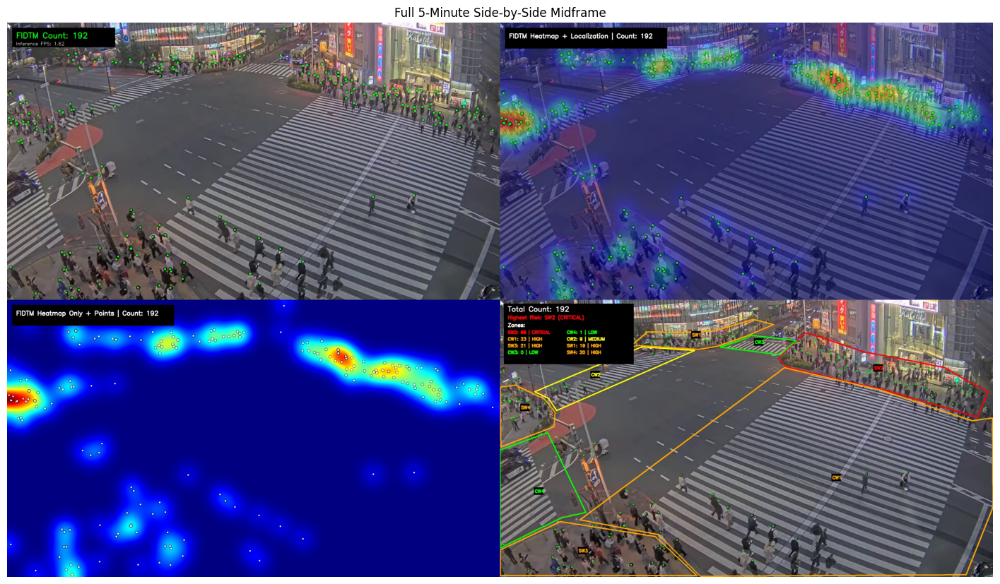


✅ FULL RUN COMPLETE
Now next step is to run the cleaned analysis cell again on these new CSVs.


In [6]:
# ============================================================
# FULL 5-MINUTE FIDTM PIPELINE
# Cleaner visuals:
# - no large labels inside every zone
# - compact top info panel
# - short zone IDs only
# - overwrites previous FULL_ Shinjuku outputs
# ============================================================

import os
import sys
import cv2
import json
import math
import time
import glob
import shutil
import random
import warnings
import importlib.util
from pathlib import Path

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from tqdm import tqdm
import matplotlib.pyplot as plt
from IPython.display import Video, display

warnings.filterwarnings("ignore")

# ============================================================
# 1) LOAD PATH INFO
# ============================================================

BASE_OUT = Path("/kaggle/working/crowd_outputs")
PATH_INFO_PATH = BASE_OUT / "path_info_complete_demo.json"

if not PATH_INFO_PATH.exists():
    raise FileNotFoundError("❌ Run Cell 1 first so path_info_complete_demo.json exists.")

with open(PATH_INFO_PATH, "r") as f:
    PATH_INFO = json.load(f)

VIDEO_PATH = PATH_INFO["VIDEO_PATH"]
ZONE_FRAME_PATH = PATH_INFO["ZONE_FRAME_PATH"]

ZONE_JSON_PATH = BASE_OUT / "zone_annotation" / "zones_config_complete_demo.json"
if not ZONE_JSON_PATH.exists():
    raise FileNotFoundError("❌ Run Cell 2 first so zones_config_complete_demo.json exists.")

print("✅ Loaded paths")
print("Video:", VIDEO_PATH)
print("Zones:", ZONE_JSON_PATH)

# ============================================================
# 2) OUTPUT FOLDERS + CLEAN OLD FULL OUTPUTS
# ============================================================

VIDEOS_OUT = BASE_OUT / "videos"
VIS_OUT = BASE_OUT / "visualizations"
BENCH_OUT = BASE_OUT / "benchmark"
HEATMAP_OUT = BASE_OUT / "heatmaps"

for p in [VIDEOS_OUT, VIS_OUT, BENCH_OUT, HEATMAP_OUT]:
    p.mkdir(parents=True, exist_ok=True)

# remove old FULL_ outputs only
for folder in [VIDEOS_OUT, VIS_OUT, BENCH_OUT, HEATMAP_OUT]:
    for item in folder.glob("FULL_*"):
        if item.is_file():
            item.unlink()

print("✅ Old FULL_ outputs removed")

# ============================================================
# 3) FIND FIDTM REPO + CHECKPOINT
# ============================================================

repo_candidates = list(Path("/kaggle/working").rglob("seg_hrnet.py"))
if not repo_candidates:
    raise FileNotFoundError("❌ Could not find seg_hrnet.py in /kaggle/working")

repo_seg = repo_candidates[0]
FIDTM_REPO = repo_seg.parent.parent.parent  # .../FIDTM
print("✅ FIDTM repo:", FIDTM_REPO)

ckpt_candidates = []
for root in [Path("/kaggle/input"), Path("/kaggle/working")]:
    ckpt_candidates += list(root.rglob("*.pth"))

if not ckpt_candidates:
    raise FileNotFoundError("❌ No checkpoint .pth found")

CKPT_PATH = None
for p in ckpt_candidates:
    if "jhu" in p.name.lower() or "model_best" in p.name.lower():
        CKPT_PATH = p
        break

if CKPT_PATH is None:
    CKPT_PATH = ckpt_candidates[0]

print("✅ Checkpoint:", CKPT_PATH)

# ============================================================
# 4) SAFE IMPORTS
# ============================================================

sys.path.insert(0, str(FIDTM_REPO))

config_py = FIDTM_REPO / "config.py"
if not config_py.exists():
    raise FileNotFoundError(f"❌ config.py not found in {FIDTM_REPO}")

# Patch argv so argparse inside config.py doesn't crash in notebook
old_argv = sys.argv[:]
sys.argv = [sys.argv[0]]

spec = importlib.util.spec_from_file_location("fidtm_config_module", str(config_py))
fidtm_config_module = importlib.util.module_from_spec(spec)
spec.loader.exec_module(fidtm_config_module)

sys.argv = old_argv

args = fidtm_config_module.args

from Networks.HR_Net.seg_hrnet import get_seg_model

print("✅ Imported FIDTM model + config safely")

# ============================================================
# 5) DEVICE + MODEL
# ============================================================

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("✅ Device:", device)

model = get_seg_model()
ckpt = torch.load(str(CKPT_PATH), map_location=device)

state_dict = ckpt.get("state_dict", ckpt)

# Remove possible "module." prefix
new_state = {}
for k, v in state_dict.items():
    nk = k.replace("module.", "")
    new_state[nk] = v

missing, unexpected = model.load_state_dict(new_state, strict=False)
print("✅ Loaded checkpoint")
print("Missing:", len(missing))
print("Unexpected:", len(unexpected))

model = model.to(device)
model.eval()

# ============================================================
# 6) LOAD ZONES
# ============================================================

with open(ZONE_JSON_PATH, "r") as f:
    zone_json = json.load(f)

zone_shapes = zone_json["shapes"]

zones = []
for s in zone_shapes:
    label = s["label"]
    pts = np.array(s["points"], dtype=np.float32)
    zones.append({
        "name": label,
        "polygon": pts,
        "polygon_int": pts.astype(np.int32),
        "area": float(abs(cv2.contourArea(pts.astype(np.int32))))
    })

print("✅ Loaded zones:")
for z in zones:
    print("-", z["name"], "| area =", round(z["area"], 2))

# Short IDs for cleaner visuals
ZONE_ID_MAP = {
    "crosswalk_main": "CW1",
    "crosswalk_left": "CW2",
    "crosswalk_top": "CW3",
    "crosswalk_bottom": "CW4",
    "sidewalk_top": "SW1",
    "sidewalk_right": "SW2",
    "sidewalk_bottom": "SW3",
    "sidewalk_left": "SW4",
}

# ============================================================
# 7) VIDEO INFO
# ============================================================

cap = cv2.VideoCapture(VIDEO_PATH)
if not cap.isOpened():
    raise RuntimeError(f"❌ Could not open video: {VIDEO_PATH}")

fps = cap.get(cv2.CAP_PROP_FPS)
if fps <= 0:
    fps = 30.0

total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
duration = total_frames / fps

print("✅ Video info")
print("Resolution:", width, "x", height)
print("FPS:", fps)
print("Frames:", total_frames)
print("Duration (sec):", duration)

cap.release()

# ============================================================
# 8) OUTPUT PATHS
# ============================================================

VID_LOCAL = VIDEOS_OUT / "FULL_01_shinjuku_fidtm_localization_count.mp4"
VID_HEAT_OVER = VIDEOS_OUT / "FULL_02_shinjuku_fidtm_heatmap_overlay_points.mp4"
VID_HEAT_ONLY = VIDEOS_OUT / "FULL_03_shinjuku_fidtm_heatmap_only_points.mp4"
VID_ZONE = VIDEOS_OUT / "FULL_04_shinjuku_fidtm_zone_density_risk.mp4"
VID_SIDE = VIDEOS_OUT / "FULL_05_shinjuku_side_by_side_outputs.mp4"

CSV_FRAME = BENCH_OUT / "FULL_01_shinjuku_frame_counts.csv"
CSV_ZONE = BENCH_OUT / "FULL_02_shinjuku_zone_density_risk.csv"

MIDFRAME_PATH = VIS_OUT / "FULL_shinjuku_side_by_side_midframe.jpg"

# ============================================================
# 9) VIDEO WRITERS
# ============================================================

fourcc = cv2.VideoWriter_fourcc(*"mp4v")

writer_local = cv2.VideoWriter(str(VID_LOCAL), fourcc, fps, (width, height))
writer_heat_over = cv2.VideoWriter(str(VID_HEAT_OVER), fourcc, fps, (width, height))
writer_heat_only = cv2.VideoWriter(str(VID_HEAT_ONLY), fourcc, fps, (width, height))
writer_zone = cv2.VideoWriter(str(VID_ZONE), fourcc, fps, (width, height))
writer_side = cv2.VideoWriter(str(VID_SIDE), fourcc, fps, (width * 2, height * 2))

# ============================================================
# 10) HELPERS
# ============================================================

def preprocess_bgr(frame_bgr):
    rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB)
    x = rgb.astype(np.float32) / 255.0
    x = (x - [0.485, 0.456, 0.406]) / [0.229, 0.224, 0.225]
    x = np.transpose(x, (2, 0, 1))
    x = torch.tensor(x, dtype=torch.float32).unsqueeze(0)
    return x

def extract_points_from_pred(pred_map, thresh=0.20, nms_ks=3, max_points=6000):
    """
    Generic local-max extraction from predicted density / confidence map.
    """
    if pred_map.ndim == 4:
        pred_map = pred_map[0, 0]
    elif pred_map.ndim == 3:
        pred_map = pred_map[0]

    pred_map = pred_map.detach().cpu().numpy().astype(np.float32)

    heat = pred_map.copy()
    heat[heat < thresh] = 0

    if heat.max() <= 0:
        return []

    dil = cv2.dilate(heat, np.ones((nms_ks, nms_ks), np.uint8))
    peaks = (heat == dil) & (heat > thresh)

    ys, xs = np.where(peaks)
    scores = heat[ys, xs]

    order = np.argsort(scores)[::-1]
    xs = xs[order]
    ys = ys[order]
    scores = scores[order]

    points = []
    for x, y, s in zip(xs[:max_points], ys[:max_points], scores[:max_points]):
        points.append((float(x), float(y), float(s)))

    return points

def make_smooth_heatmap_from_points(frame_shape, points, sigma=35):
    h, w = frame_shape[:2]
    heat = np.zeros((h, w), dtype=np.float32)

    for x, y, score in points:
        xi, yi = int(x), int(y)
        if 0 <= xi < w and 0 <= yi < h:
            heat[yi, xi] += 1.0

    heat = cv2.GaussianBlur(heat, (0, 0), sigmaX=sigma, sigmaY=sigma)

    if heat.max() > 0:
        heat = heat / heat.max()

    heat_uint8 = np.uint8(255 * heat)
    heat_color = cv2.applyColorMap(heat_uint8, cv2.COLORMAP_JET)

    return heat_color, heat_uint8

def draw_fidtm_points(frame_bgr, points, count, fps_text=None):
    out = frame_bgr.copy()

    for x, y, score in points:
        cv2.circle(out, (int(x), int(y)), 4, (0, 255, 0), -1)
        cv2.circle(out, (int(x), int(y)), 7, (0, 0, 0), 1)

    cv2.rectangle(out, (20, 20), (420, 95), (0, 0, 0), -1)

    cv2.putText(
        out,
        f"FIDTM Count: {count}",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.0,
        (0, 255, 0),
        2,
        cv2.LINE_AA,
    )

    if fps_text:
        cv2.putText(
            out,
            fps_text,
            (35, 88),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.6,
            (255, 255, 255),
            1,
            cv2.LINE_AA,
        )

    return out

def draw_heatmap_overlay(frame_bgr, points, count, sigma=35, draw_points=True):
    heat_color, _ = make_smooth_heatmap_from_points(frame_bgr.shape, points, sigma=sigma)
    overlay = cv2.addWeighted(frame_bgr, 0.60, heat_color, 0.40, 0)

    if draw_points:
        for x, y, score in points:
            cv2.circle(overlay, (int(x), int(y)), 4, (0, 255, 0), -1)
            cv2.circle(overlay, (int(x), int(y)), 7, (0, 0, 0), 1)

    cv2.rectangle(overlay, (20, 20), (650, 100), (0, 0, 0), -1)
    cv2.putText(
        overlay,
        f"FIDTM Heatmap + Localization | Count: {count}",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    return overlay

def draw_heatmap_only(frame_bgr, points, count, sigma=35, draw_points=True):
    heat_color, _ = make_smooth_heatmap_from_points(frame_bgr.shape, points, sigma=sigma)
    only = heat_color.copy()

    if draw_points:
        for x, y, score in points:
            cv2.circle(only, (int(x), int(y)), 3, (255, 255, 255), -1)
            cv2.circle(only, (int(x), int(y)), 6, (0, 0, 0), 1)

    cv2.rectangle(only, (20, 20), (650, 100), (0, 0, 0), -1)
    cv2.putText(
        only,
        f"FIDTM Heatmap Only + Points | Count: {count}",
        (35, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2,
        cv2.LINE_AA,
    )

    return only

def point_in_polygon(x, y, polygon):
    return cv2.pointPolygonTest(polygon.astype(np.float32), (float(x), float(y)), False) >= 0

def classify_risk(zone_count):
    if zone_count < 8:
        return "LOW", (0, 255, 0)
    elif zone_count < 18:
        return "MEDIUM", (0, 255, 255)
    elif zone_count < 30:
        return "HIGH", (0, 165, 255)
    else:
        return "CRITICAL", (0, 0, 255)

def draw_zone_risk_clean(frame_bgr, points, zone_stats, total_count):
    out = frame_bgr.copy()

    # draw points
    for x, y, score in points:
        cv2.circle(out, (int(x), int(y)), 3, (0, 255, 0), -1)

    # draw zone outlines only + tiny short id
    for zs in zone_stats:
        poly = zs["polygon_int"]
        color = zs["risk_color"]
        short_id = zs["short_id"]

        cv2.polylines(out, [poly], True, color, 3)

        # tiny short id near centroid
        cx = int(np.mean(poly[:, 0]))
        cy = int(np.mean(poly[:, 1]))
        cv2.rectangle(out, (cx - 18, cy - 18), (cx + 18, cy + 10), (0, 0, 0), -1)
        cv2.putText(
            out, short_id, (cx - 15, cy + 2),
            cv2.FONT_HERSHEY_SIMPLEX, 0.55, color, 2, cv2.LINE_AA
        )

    # compact summary panel
    panel_x1, panel_y1, panel_x2, panel_y2 = 15, 15, 520, 250
    cv2.rectangle(out, (panel_x1, panel_y1), (panel_x2, panel_y2), (0, 0, 0), -1)

    highest = max(zone_stats, key=lambda z: z["zone_count"])
    cv2.putText(out, f"Total Count: {total_count}", (30, 45),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 255), 2, cv2.LINE_AA)
    cv2.putText(out, f"Highest Risk: {highest['short_id']} ({highest['risk_level']})", (30, 75),
                cv2.FONT_HERSHEY_SIMPLEX, 0.65, highest["risk_color"], 2, cv2.LINE_AA)

    cv2.putText(out, "Zones:", (30, 105),
                cv2.FONT_HERSHEY_SIMPLEX, 0.65, (255, 255, 255), 2, cv2.LINE_AA)

    y = 132
    for i, zs in enumerate(zone_stats):
        line = f"{zs['short_id']}: {zs['zone_count']} | {zs['risk_level']}"
        col_x = 30 if i < 4 else 260
        row_y = y + (i % 4) * 26
        cv2.putText(out, line, (col_x, row_y),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.55, zs["risk_color"], 2, cv2.LINE_AA)

    return out

def make_side_by_side_2x2(img1, img2, img3, img4):
    top = np.hstack([img1, img2])
    bottom = np.hstack([img3, img4])
    return np.vstack([top, bottom])

# ============================================================
# 11) PROCESS FULL VIDEO
# ============================================================

cap = cv2.VideoCapture(VIDEO_PATH)

frame_rows = []
zone_rows = []

midframe_saved = False
mid_target = total_frames // 2

pbar = tqdm(total=total_frames, desc="Processing full video")

for frame_id in range(total_frames):
    ok, frame = cap.read()
    if not ok or frame is None:
        break

    t0 = time.time()

    inp = preprocess_bgr(frame).to(device)

    with torch.no_grad():
        pred = model(inp)

    # Some FIDTM versions return tuple/list
    if isinstance(pred, (list, tuple)):
        pred_map = pred[0]
    else:
        pred_map = pred

    # Resize pred map to original frame size if needed
    if pred_map.ndim == 4 and (pred_map.shape[-2] != height or pred_map.shape[-1] != width):
        pred_map = F.interpolate(pred_map, size=(height, width), mode="bilinear", align_corners=False)

    points = extract_points_from_pred(pred_map, thresh=0.20, nms_ks=3, max_points=6000)
    total_count = len(points)

    t1 = time.time()
    infer_time = t1 - t0
    infer_fps = 1.0 / infer_time if infer_time > 0 else 0.0

    timestamp_sec = frame_id / fps

    # -------- zone stats --------
    zone_stats = []
    for z in zones:
        in_pts = []
        for x, y, s in points:
            if point_in_polygon(x, y, z["polygon"]):
                in_pts.append((x, y, s))

        zone_count = len(in_pts)
        zone_density = zone_count / (z["area"] + 1e-9)
        risk_level, risk_color = classify_risk(zone_count)

        zone_stats.append({
            "name": z["name"],
            "short_id": ZONE_ID_MAP.get(z["name"], z["name"]),
            "polygon": z["polygon"],
            "polygon_int": z["polygon_int"],
            "area": z["area"],
            "zone_count": zone_count,
            "zone_density": zone_density,
            "risk_level": risk_level,
            "risk_color": risk_color,
        })

        zone_rows.append({
            "frame_id": frame_id,
            "timestamp_sec": timestamp_sec,
            "zone_name": z["name"],
            "zone_short_id": ZONE_ID_MAP.get(z["name"], z["name"]),
            "zone_count": zone_count,
            "zone_density_pixel": zone_density,
            "zone_area_pixels": z["area"],
            "risk_level": risk_level,
            "inference_time_sec": infer_time,
            "inference_fps": infer_fps,
        })

    frame_rows.append({
        "frame_id": frame_id,
        "timestamp_sec": timestamp_sec,
        "total_count": total_count,
        "inference_time_sec": infer_time,
        "inference_fps": infer_fps,
    })

    # -------- draw outputs --------
    fps_text = f"Inference FPS: {infer_fps:.2f}"
    img_local = draw_fidtm_points(frame, points, total_count, fps_text=fps_text)
    img_heat_over = draw_heatmap_overlay(frame, points, total_count, sigma=35, draw_points=True)
    img_heat_only = draw_heatmap_only(frame, points, total_count, sigma=35, draw_points=True)
    img_zone = draw_zone_risk_clean(frame, points, zone_stats, total_count)

    side = make_side_by_side_2x2(img_local, img_heat_over, img_heat_only, img_zone)

    writer_local.write(img_local)
    writer_heat_over.write(img_heat_over)
    writer_heat_only.write(img_heat_only)
    writer_zone.write(img_zone)
    writer_side.write(side)

    if (not midframe_saved) and (frame_id >= mid_target):
        cv2.imwrite(str(MIDFRAME_PATH), side)
        midframe_saved = True

    pbar.update(1)

pbar.close()
cap.release()

writer_local.release()
writer_heat_over.release()
writer_heat_only.release()
writer_zone.release()
writer_side.release()

# ============================================================
# 12) SAVE CSVs
# ============================================================

df_frame = pd.DataFrame(frame_rows)
df_zone = pd.DataFrame(zone_rows)

df_frame.to_csv(CSV_FRAME, index=False)
df_zone.to_csv(CSV_ZONE, index=False)

print("✅ Saved frame CSV:", CSV_FRAME)
print("✅ Saved zone CSV:", CSV_ZONE)

print("✅ Saved videos:")
print("-", VID_LOCAL)
print("-", VID_HEAT_OVER)
print("-", VID_HEAT_ONLY)
print("-", VID_ZONE)
print("-", VID_SIDE)

print("✅ Saved midframe:", MIDFRAME_PATH)

# ============================================================
# 13) QUICK SUMMARY
# ============================================================

print("\n📊 Quick Summary")
print("Frames processed:", len(df_frame))
print("Average total count:", round(df_frame["total_count"].mean(), 2))
print("Median total count:", round(df_frame["total_count"].median(), 2))
print("Max total count:", int(df_frame["total_count"].max()))
print("Average inference FPS:", round(df_frame["inference_fps"].mean(), 2))

# ============================================================
# 14) DISPLAY MIDFRAME + VIDEO PATHS
# ============================================================

mid_img = cv2.imread(str(MIDFRAME_PATH))
if mid_img is not None:
    plt.figure(figsize=(18, 12))
    plt.imshow(cv2.cvtColor(mid_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title("Full 5-Minute Side-by-Side Midframe")
    plt.show()

print("\n✅ FULL RUN COMPLETE")
print("Now next step is to run the cleaned analysis cell again on these new CSVs.")

In [9]:
# ============================================================
# CLEAN WORKING OUTPUTS
# Keep only:
# - side-by-side full video
# - 2 CSV files for analysis
# - midframe screenshot
# - zone JSON
# Delete everything else to save Kaggle working space
# ============================================================

from pathlib import Path
import shutil
import os

BASE_OUT = Path("/kaggle/working/crowd_outputs")

if not BASE_OUT.exists():
    raise FileNotFoundError(f"❌ Folder not found: {BASE_OUT}")

# Files we want to keep
KEEP_FILES = {
    BASE_OUT / "videos" / "FULL_05_shinjuku_side_by_side_outputs.mp4",
    BASE_OUT / "benchmark" / "FULL_01_shinjuku_frame_counts.csv",
    BASE_OUT / "benchmark" / "FULL_02_shinjuku_zone_density_risk.csv",
    BASE_OUT / "visualizations" / "FULL_shinjuku_side_by_side_midframe.jpg",
    BASE_OUT / "zone_annotation" / "zones_config_complete_demo.json",
    BASE_OUT / "zone_annotation" / "complete_demo_zone_summary.json",
    BASE_OUT / "visualizations" / "complete_demo_zone_verification_overlay.jpg",
}

# Normalize paths
KEEP_FILES = {p.resolve() for p in KEEP_FILES}

deleted_files = []
deleted_dirs = []
kept_files = []

# Delete files not in keep list
for item in BASE_OUT.rglob("*"):
    if item.is_file():
        if item.resolve() in KEEP_FILES:
            kept_files.append(item)
        else:
            try:
                item.unlink()
                deleted_files.append(item)
            except Exception as e:
                print(f"⚠️ Could not delete file {item}: {e}")

# Delete empty folders
for item in sorted(BASE_OUT.rglob("*"), reverse=True):
    if item.is_dir():
        try:
            if not any(item.iterdir()):
                item.rmdir()
                deleted_dirs.append(item)
        except Exception as e:
            print(f"⚠️ Could not delete folder {item}: {e}")

print("✅ Cleanup finished.")

print("\n✅ Kept files:")
for f in sorted(kept_files):
    size_mb = f.stat().st_size / (1024 * 1024)
    print(f"- {f} | {size_mb:.2f} MB")

print("\n🧹 Deleted files:", len(deleted_files))
print("🧹 Deleted empty folders:", len(deleted_dirs))

print("\n📁 Remaining tree:")
for path in sorted(BASE_OUT.rglob("*")):
    if path.is_file():
        print("-", path)

✅ Cleanup finished.

✅ Kept files:
- /kaggle/working/crowd_outputs/benchmark/FULL_01_shinjuku_frame_counts.csv | 0.57 MB
- /kaggle/working/crowd_outputs/benchmark/FULL_02_shinjuku_zone_density_risk.csv | 8.32 MB
- /kaggle/working/crowd_outputs/videos/FULL_05_shinjuku_side_by_side_outputs.mp4 | 2820.51 MB
- /kaggle/working/crowd_outputs/visualizations/FULL_shinjuku_side_by_side_midframe.jpg | 2.00 MB
- /kaggle/working/crowd_outputs/visualizations/complete_demo_zone_verification_overlay.jpg | 0.66 MB
- /kaggle/working/crowd_outputs/zone_annotation/complete_demo_zone_summary.json | 0.00 MB
- /kaggle/working/crowd_outputs/zone_annotation/zones_config_complete_demo.json | 0.01 MB

🧹 Deleted files: 14
🧹 Deleted empty folders: 2

📁 Remaining tree:
- /kaggle/working/crowd_outputs/benchmark/FULL_01_shinjuku_frame_counts.csv
- /kaggle/working/crowd_outputs/benchmark/FULL_02_shinjuku_zone_density_risk.csv
- /kaggle/working/crowd_outputs/videos/FULL_05_shinjuku_side_by_side_outputs.mp4
- /kaggle/w

✅ Fresh analysis folders created:
/kaggle/working/crowd_outputs/analysis_5min

📄 Found CSV files:
[0] /kaggle/input/datasets/yahiaelgayar/data-csv/FULL_01_shinjuku_frame_counts.csv
[1] /kaggle/input/datasets/yahiaelgayar/data-csv/FULL_02_shinjuku_zone_density_risk.csv

✅ Selected frame CSV:
/kaggle/input/datasets/yahiaelgayar/data-csv/FULL_01_shinjuku_frame_counts.csv

✅ Selected zone CSV:
/kaggle/input/datasets/yahiaelgayar/data-csv/FULL_02_shinjuku_zone_density_risk.csv

✅ Loaded data
Frame CSV shape: (9269, 5)
Zone CSV shape: (74152, 10)

Frame columns:
['frame_id', 'timestamp_sec', 'total_count', 'inference_time_sec', 'inference_fps']

Zone columns:
['frame_id', 'timestamp_sec', 'zone_name', 'zone_short_id', 'zone_count', 'zone_density_pixel', 'zone_area_pixels', 'risk_level', 'inference_time_sec', 'inference_fps']


,frame_id,timestamp_sec,total_count,inference_time_sec,inference_fps
0,0,0.000000,151,1.239954,0.806482
1,1,0.033290,149,0.551838,1.812127
2,2,0.066579,164,0.548199,1.824154
3,3,0.099869,165,0.546257,1.830641
4,4,0.133159,164,0.551429,1.813470


,frame_id,timestamp_sec,zone_name,zone_short_id,zone_count,zone_density_pixel,zone_area_pixels,risk_level,inference_time_sec,inference_fps
0,0,0.0,sidewalk_right,SW2,49,0.000462,105957.0,CRITICAL,1.239954,0.806482
1,0,0.0,crosswalk_main,CW1,9,0.000010,896895.0,MEDIUM,1.239954,0.806482
2,0,0.0,sidewalk_bottom,SW3,25,0.000217,115371.0,HIGH,1.239954,0.806482
3,0,0.0,crosswalk_top,CW3,0,0.000000,12484.0,LOW,1.239954,0.806482
4,0,0.0,crosswalk_bottom,CW4,1,0.000011,94518.5,LOW,1.239954,0.806482



✅ Estimated FPS: 30.03936326531647
✅ Duration seconds: 308.52851034631567
✅ Processed frames: 9269

📊 Global summary:


,video_duration_sec,processed_frames,estimated_video_fps,mean_total_count,median_total_count,min_total_count,max_total_count,std_total_count,mean_abs_count_change,max_positive_count_change,max_negative_count_change,mean_pipeline_fps,median_pipeline_fps,mean_processing_time_sec,median_processing_time_sec
0,308.52851,9269,30.039363,172.548711,158.0,76,323,46.697062,7.638796,52.0,-48.0,1.616122,1.615625,0.618864,0.618956



📊 Top 10 peak crowd frames:


,frame_id,timestamp_sec,total_count,inference_time_sec,inference_fps,total_count_change,total_count_change_abs,rolling_mean_count_5s,rolling_mean_count_change_5s
5186,5186,172.640144,323,0.627471,1.593699,45.0,45.0,272.733333,0.213333
5194,5194,172.906461,316,0.618914,1.615732,30.0,30.0,273.666667,0.160000
5336,5336,177.633592,316,0.617324,1.619895,31.0,31.0,278.106667,-0.046667
5187,5187,172.673434,314,0.620264,1.612216,-9.0,9.0,272.900000,0.166667
5196,5196,172.973041,313,0.618681,1.616343,10.0,10.0,274.020000,0.253333
5122,5122,170.509606,313,0.617675,1.618974,1.0,1.0,270.300000,0.226667
5121,5121,170.476317,312,0.623925,1.602756,14.0,14.0,270.073333,0.273333
5178,5178,172.373827,312,0.619469,1.614285,37.0,37.0,272.533333,0.093333
5280,5280,175.769371,312,0.618439,1.616975,30.0,30.0,275.433333,0.400000
5337,5337,177.666882,312,0.641546,1.558735,-4.0,4.0,278.093333,-0.013333



📊 Zone count/density summary:


,zone_name,zone_short_id,frames_observed,mean_count,median_count,min_count,max_count,std_count,mean_density,median_density,min_density,max_density,std_density,zone_area_pixels,count_variability,density_variability
7,sidewalk_top,SW1,9269,14.990938,15.0,0,40,6.076349,0.000514,0.000515,0.000000,0.001373,0.000209,29138.5,0.405335,0.405335
5,sidewalk_left,SW4,9269,16.871507,16.0,0,52,8.036400,0.000469,0.000445,0.000000,0.001445,0.000223,35974.0,0.476330,0.476330
6,sidewalk_right,SW2,9269,45.955982,47.0,8,80,12.596096,0.000434,0.000444,0.000076,0.000755,0.000119,105957.0,0.274090,0.274090
3,crosswalk_top,CW3,9269,2.954580,2.0,0,40,4.166267,0.000237,0.000160,0.000000,0.003204,0.000334,12484.0,1.410105,1.410105
1,crosswalk_left,CW2,9269,6.946920,2.0,0,43,8.930738,0.000139,0.000040,0.000000,0.000862,0.000179,49879.0,1.285568,1.285568
4,sidewalk_bottom,SW3,9269,15.879383,17.0,0,41,8.478890,0.000138,0.000147,0.000000,0.000355,0.000073,115371.0,0.533956,0.533956
0,crosswalk_bottom,CW4,9269,5.895890,4.0,0,39,6.617441,0.000062,0.000042,0.000000,0.000413,0.000070,94518.5,1.122382,1.122382
2,crosswalk_main,CW1,9269,39.484734,6.0,0,204,56.908669,0.000044,0.000007,0.000000,0.000227,0.000063,896895.0,1.441283,1.441283



📊 Risk duration summary:


risk_level,zone_name,LOW,MEDIUM,HIGH,CRITICAL,LOW_frames,LOW_seconds,MEDIUM_frames,MEDIUM_seconds,HIGH_frames,HIGH_seconds,CRITICAL_frames,CRITICAL_seconds,total_frames,total_seconds,high_or_critical_frames,high_or_critical_seconds,high_or_critical_percent
6,sidewalk_right,0,195,817,8257,0,0.000000,195,6.491482,817,27.197647,8257,274.872670,9269,308.5618,9074,302.070318,97.896213
4,sidewalk_bottom,2000,2900,4073,296,2000,66.579307,2900,96.539996,4073,135.588759,296,9.853737,9269,308.5618,4369,145.442497,47.135613
5,sidewalk_left,1124,4077,3361,707,1124,37.417571,4077,135.721918,3361,111.886526,707,23.535785,9269,308.5618,4068,135.422311,43.888230
2,crosswalk_main,4905,694,351,3319,4905,163.285751,694,23.103020,351,11.684668,3319,110.488361,9269,308.5618,3670,122.173029,39.594347
7,sidewalk_top,936,5346,2859,128,936,31.159116,5346,177.966489,2859,95.175120,128,4.261076,9269,308.5618,2987,99.436196,32.225699
1,crosswalk_left,6419,1355,1249,246,6419,213.686287,1355,45.107481,1249,41.578777,246,8.189255,9269,308.5618,1495,49.768032,16.129032
0,crosswalk_bottom,7376,1120,636,137,7376,245.544486,1120,37.284412,636,21.172220,137,4.560683,9269,308.5618,773,25.732902,8.339627
3,crosswalk_top,8415,696,131,27,8415,280.132436,696,23.169599,131,4.360945,27,0.898821,9269,308.5618,158,5.259765,1.704607



📊 Risk percentage summary:


risk_level,zone_name,LOW,MEDIUM,HIGH,CRITICAL,LOW_percent,MEDIUM_percent,HIGH_percent,CRITICAL_percent
0,crosswalk_bottom,7376,1120,636,137,79.577085,12.083288,6.861582,1.478045
1,crosswalk_left,6419,1355,1249,246,69.252347,14.618621,13.475024,2.654008
2,crosswalk_main,4905,694,351,3319,52.918330,7.487323,3.786816,35.807530
3,crosswalk_top,8415,696,131,27,90.786493,7.508901,1.413313,0.291294
4,sidewalk_bottom,2000,2900,4073,296,21.577301,31.287086,43.942173,3.193441
5,sidewalk_left,1124,4077,3361,707,12.126443,43.985327,36.260654,7.627576
6,sidewalk_right,0,195,817,8257,0.000000,2.103787,8.814327,89.081886
7,sidewalk_top,936,5346,2859,128,10.098177,57.676125,30.844751,1.380947



📊 Zone count correlation matrix:


zone_name,crosswalk_bottom,crosswalk_left,crosswalk_main,crosswalk_top,sidewalk_bottom,sidewalk_left,sidewalk_right,sidewalk_top
zone_name,,,,,,,,
crosswalk_bottom,1.000000,-0.360221,-0.351416,0.621152,-0.029125,0.093561,-0.087248,-0.192370
crosswalk_left,-0.360221,1.000000,0.865064,-0.172346,-0.582911,-0.515087,-0.428484,-0.105727
crosswalk_main,-0.351416,0.865064,1.000000,-0.197760,-0.675738,-0.584869,-0.567499,-0.165427
crosswalk_top,0.621152,-0.172346,-0.197760,1.000000,0.018849,0.113641,-0.054435,-0.219787
sidewalk_bottom,-0.029125,-0.582911,-0.675738,0.018849,1.000000,0.591747,0.475963,0.122468
sidewalk_left,0.093561,-0.515087,-0.584869,0.113641,0.591747,1.000000,0.405438,0.102401
sidewalk_right,-0.087248,-0.428484,-0.567499,-0.054435,0.475963,0.405438,1.000000,0.243566
sidewalk_top,-0.192370,-0.105727,-0.165427,-0.219787,0.122468,0.102401,0.243566,1.000000



📊 Zone lead-lag summary:


,zone_a,zone_b,best_lag_frames,best_lag_seconds,best_correlation,interpretation
8,crosswalk_left,crosswalk_main,-64,-2.130538,0.876357,crosswalk_main tends to lead crosswalk_left by...
15,crosswalk_main,crosswalk_left,64,2.130538,0.876357,crosswalk_main tends to lead crosswalk_left by...
2,crosswalk_bottom,crosswalk_top,5,0.166448,0.624102,crosswalk_bottom tends to lead crosswalk_top b...
21,crosswalk_top,crosswalk_bottom,-5,-0.166448,0.624102,crosswalk_bottom tends to lead crosswalk_top b...
32,sidewalk_bottom,sidewalk_left,-8,-0.266317,0.593750,sidewalk_left tends to lead sidewalk_bottom by...
39,sidewalk_left,sidewalk_bottom,8,0.266317,0.593750,sidewalk_left tends to lead sidewalk_bottom by...
46,sidewalk_right,sidewalk_bottom,0,0.000000,0.475963,sidewalk_right and sidewalk_bottom peak at app...
33,sidewalk_bottom,sidewalk_right,0,0.000000,0.475963,sidewalk_bottom and sidewalk_right peak at app...
47,sidewalk_right,sidewalk_left,0,0.000000,0.405438,sidewalk_right and sidewalk_left peak at appro...
40,sidewalk_left,sidewalk_right,0,0.000000,0.405438,sidewalk_left and sidewalk_right peak at appro...



📊 Density trend summary:


density_trend,zone_name,ACCUMULATING,DISPERSING,STABLE,total_frames,ACCUMULATING_percent,DISPERSING_percent,STABLE_percent
7,sidewalk_top,2455,2477,4337,9269,26.486137,26.723487,46.790377
5,sidewalk_left,2412,2409,4448,9269,26.022225,25.989859,47.987917
6,sidewalk_right,2390,2421,4458,9269,25.784874,26.119322,48.095803
3,crosswalk_top,1929,1943,5397,9269,20.811307,20.962348,58.226346
4,sidewalk_bottom,1796,1793,5680,9269,19.376416,19.344050,61.279534
1,crosswalk_left,1318,1350,6601,9269,14.219441,14.564678,71.215881
0,crosswalk_bottom,715,704,7850,9269,7.713885,7.595210,84.690905
2,crosswalk_main,89,83,9097,9269,0.960190,0.895458,98.144352



📊 Sudden spike events:


,frame_id,timestamp_sec,zone_name,zone_short_id,zone_count,count_30_frames_ago,count_percent_change_30f,zone_density_pixel,density_percent_change_30f,risk_level
0,30,0.998690,sidewalk_left,SW4,36,25.0,44.000000,0.001001,44.000000,CRITICAL
1,31,1.031979,crosswalk_main,CW1,12,9.0,33.333333,0.000013,33.333333,MEDIUM
2,31,1.031979,sidewalk_left,SW4,35,26.0,34.615385,0.000973,34.615385,CRITICAL
3,31,1.031979,sidewalk_top,SW1,23,15.0,53.333333,0.000789,53.333333,HIGH
4,32,1.065269,crosswalk_main,CW1,10,7.0,42.857143,0.000011,42.857143,MEDIUM
5,33,1.098559,crosswalk_main,CW1,10,7.0,42.857143,0.000011,42.857143,MEDIUM
6,33,1.098559,sidewalk_left,SW4,32,23.0,39.130435,0.000890,39.130435,CRITICAL
7,33,1.098559,sidewalk_top,SW1,25,19.0,31.578947,0.000858,31.578947,HIGH
8,34,1.131848,sidewalk_top,SW1,21,13.0,61.538462,0.000721,61.538462,HIGH
9,35,1.165138,sidewalk_top,SW1,19,12.0,58.333333,0.000652,58.333333,HIGH


/tmp/ipykernel_57/3379583978.py:594: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_anomaly = df_anomaly.groupby("zone_name", group_keys=False).apply(add_anomaly_scores)



📊 CSV-based anomaly summary:


,zone_name,density_spike_anomalies,accumulation_anomalies,mean_density_z_score,max_density_z_score,mean_density_change_z_score,max_density_change_z_score
0,crosswalk_bottom,277,181,0.061591,12.165799,0.005135,12.165799
1,crosswalk_left,311,151,0.058907,6.488132,0.004738,5.551091
2,crosswalk_main,284,139,-0.019986,7.200000,0.008426,6.828152
3,crosswalk_top,343,198,0.029837,9.220168,0.005872,9.220168
4,sidewalk_bottom,231,105,0.040003,5.966296,0.002035,6.494533
5,sidewalk_left,168,108,-0.007096,4.488793,0.001744,4.978242
6,sidewalk_right,108,86,0.001262,3.737536,0.000557,4.645774
7,sidewalk_top,172,108,-0.010649,4.889592,0.001166,4.519005



📊 Multi-zone simultaneous alerts:


,frame_id,timestamp_sec,high_or_critical_zone_count,total_zones,zones_high_or_critical
0,0,0.000000,3,8,"sidewalk_bottom, sidewalk_left, sidewalk_right"
1,1,0.033290,3,8,"sidewalk_bottom, sidewalk_left, sidewalk_right"
2,2,0.066579,4,8,"sidewalk_bottom, sidewalk_left, sidewalk_right..."
3,3,0.099869,4,8,"sidewalk_bottom, sidewalk_left, sidewalk_right..."
4,4,0.133159,3,8,"sidewalk_bottom, sidewalk_left, sidewalk_right"
5,5,0.166448,3,8,"sidewalk_bottom, sidewalk_left, sidewalk_right"
6,6,0.199738,4,8,"sidewalk_bottom, sidewalk_left, sidewalk_right..."
7,7,0.233028,4,8,"sidewalk_bottom, sidewalk_left, sidewalk_right..."
8,8,0.266317,4,8,"sidewalk_bottom, sidewalk_left, sidewalk_right..."
9,9,0.299607,4,8,"sidewalk_bottom, sidewalk_left, sidewalk_right..."



📊 Crowd entropy summary:


,mean_entropy,median_entropy,min_entropy,max_entropy,mean_normalized_entropy,median_normalized_entropy,min_normalized_entropy,max_normalized_entropy
0,1.510759,1.549638,0.681705,1.934028,0.726522,0.745218,0.327831,0.930071



📊 Risk transition matrix:


to_risk,LOW,MEDIUM,HIGH,CRITICAL
from_risk,,,,
LOW,29875,1289,6,0
MEDIUM,1295,13459,1623,4
HIGH,2,1625,11141,709
CRITICAL,0,8,705,12403


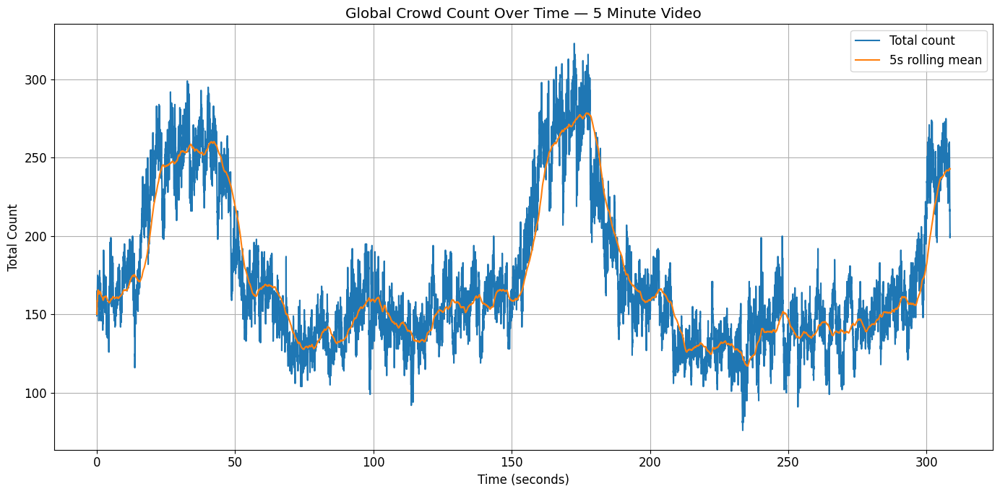

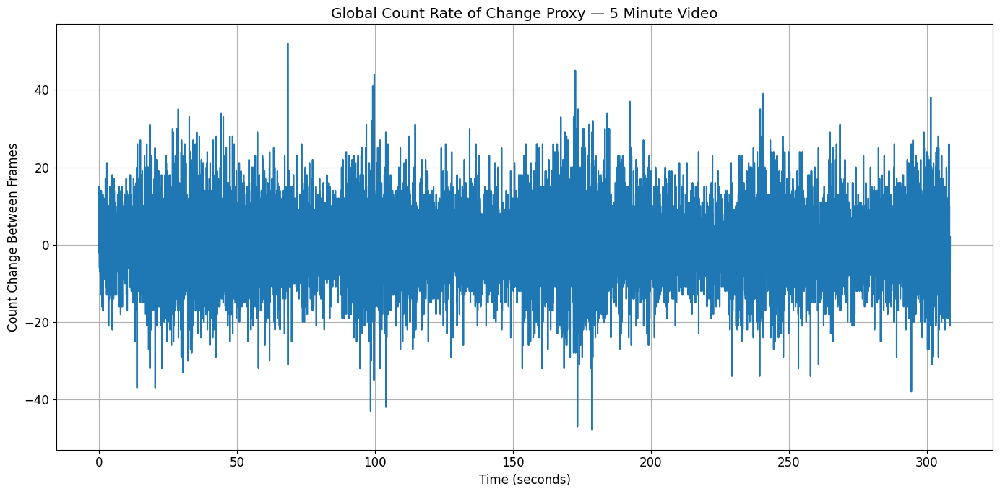

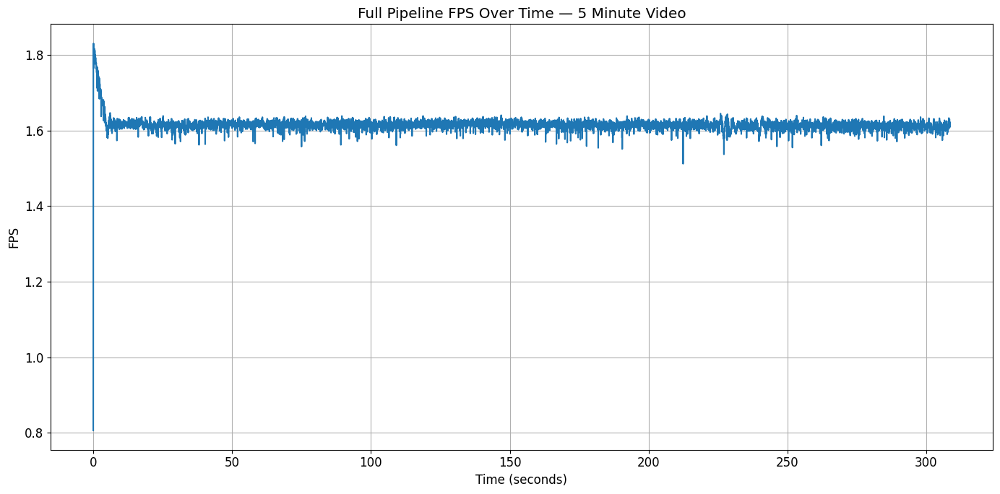

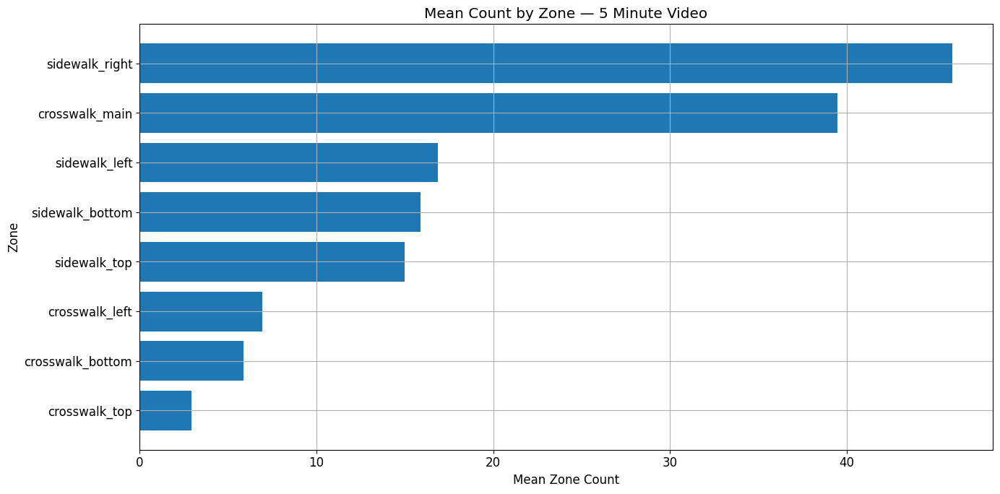

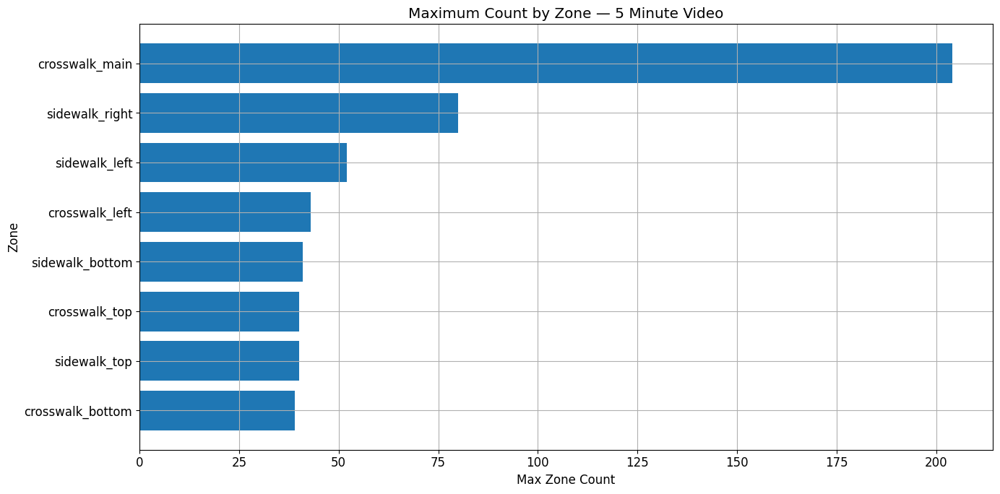

...

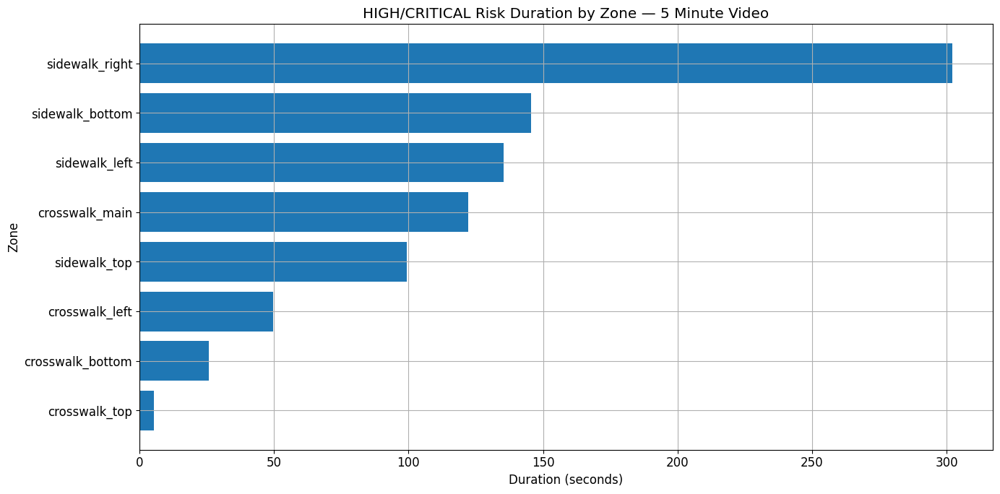

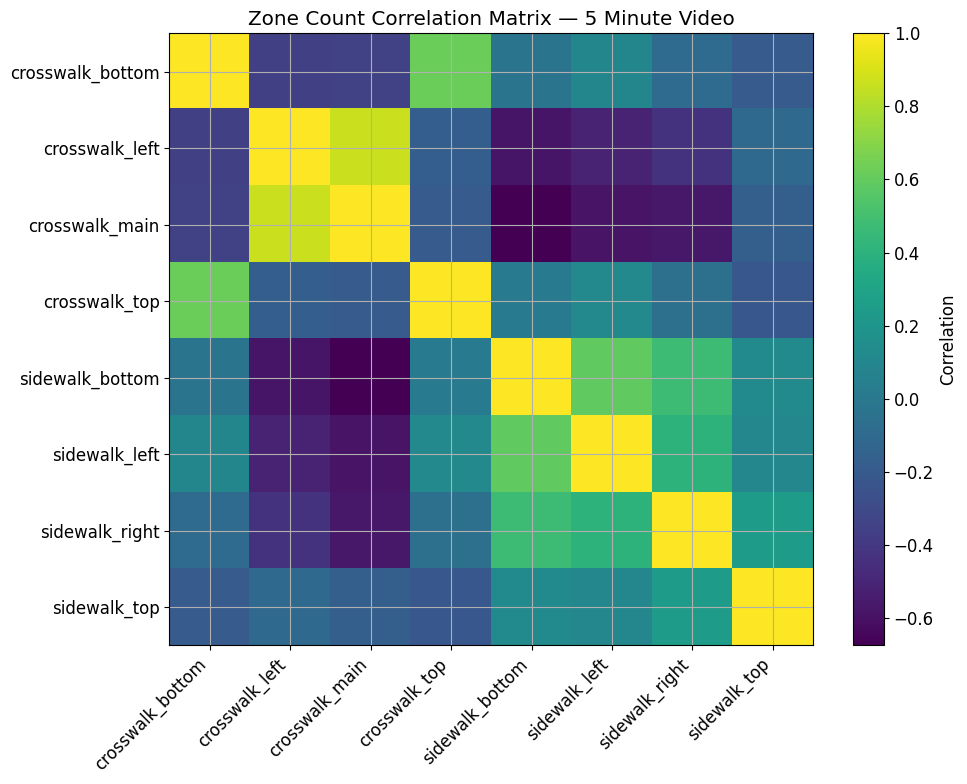

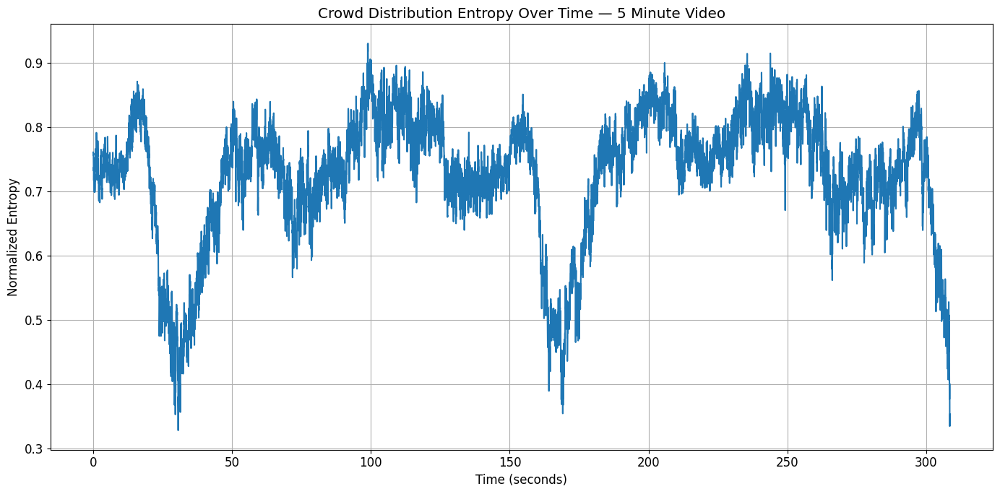

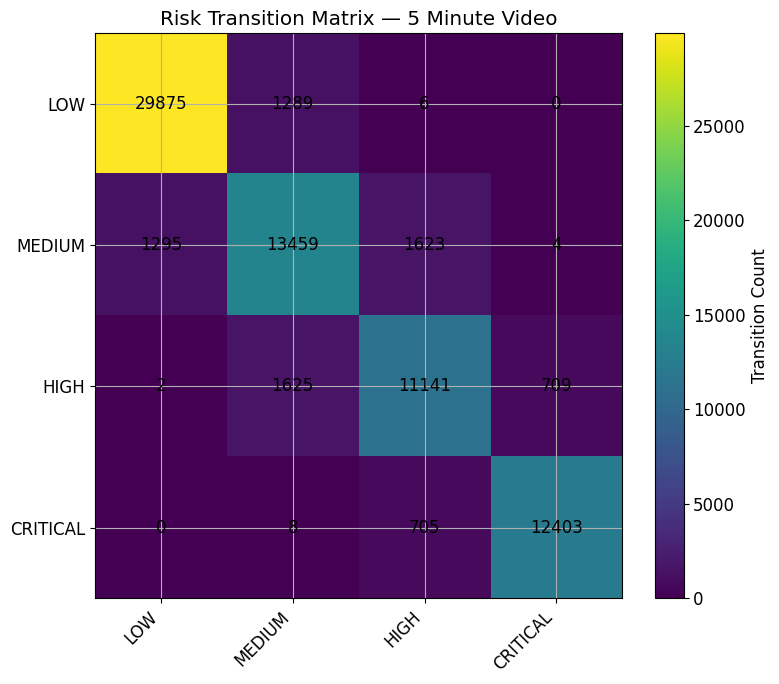

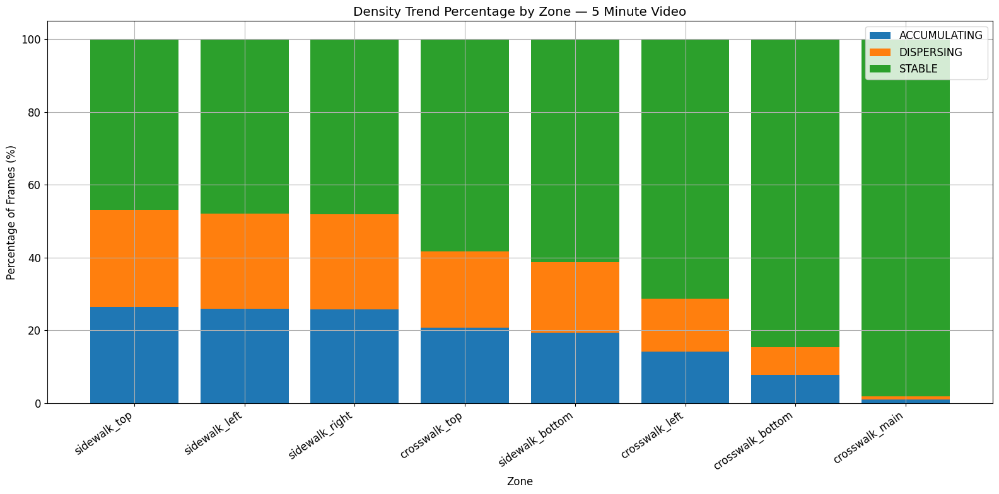

5-MINUTE SHINJUKU CROWD ANALYSIS INSIGHTS

Dataset Overview
- Video duration: 308.53 seconds.
- Processed frames: 9269.
- Estimated video FPS: 30.04.
- Number of zones: 8.

1. Global Crowd Timeline
- Average total count: 172.55.
- Median total count: 158.00.
- Maximum total count: 323.
- Peak moment occurred at 172.64 seconds, frame 5186.
- Standard deviation of total count: 46.70.

2. Full Pipeline Performance
- Average full-pipeline FPS: 1.62.
- Average processing time per frame: 0.6189 seconds.
- This represents the full pipeline speed, including inference, point extraction, zone assignment, visualization, and logging.

3. Zone Hotspot Ranking
- Highest average count zone: sidewalk_right with mean count 45.96.
- Highest peak count zone: crosswalk_main with max count 204.
- Highest average density zone: sidewalk_top with mean density 0.00051447.
- Highest maximum density zone: crosswalk_top with max density 0.00320410.
- Density is pixel-based and relative to polygon area, not real-w

In [2]:
# ============================================================
# FULL 5-MINUTE CSV ANALYSIS
# Temporal analysis + zone analysis + anomaly detection
# No stagnation detection yet because optical flow is not added.
# ============================================================

import os
import json
import shutil
import zipfile
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import display, Image

# ============================================================
# 1) OUTPUT FOLDERS
# ============================================================

BASE_OUT = Path("/kaggle/working/crowd_outputs")
ANALYSIS_OUT = BASE_OUT / "analysis_5min"
TABLES_OUT = ANALYSIS_OUT / "tables"
FIGURES_OUT = ANALYSIS_OUT / "figures"
INSIGHTS_OUT = ANALYSIS_OUT / "insights"
ZIP_PATH = BASE_OUT / "analysis_5min_outputs.zip"

# Clean old analysis_5min outputs
if ANALYSIS_OUT.exists():
    shutil.rmtree(ANALYSIS_OUT)

if ZIP_PATH.exists():
    ZIP_PATH.unlink()

for p in [BASE_OUT, ANALYSIS_OUT, TABLES_OUT, FIGURES_OUT, INSIGHTS_OUT]:
    p.mkdir(parents=True, exist_ok=True)

print("✅ Fresh analysis folders created:")
print(ANALYSIS_OUT)

# ============================================================
# 2) FIND CSV FILES
# ============================================================

csv_candidates = []

for root in [Path("/kaggle/input"), Path("/kaggle/working")]:
    if root.exists():
        csv_candidates.extend(list(root.rglob("*.csv")))

print("\n📄 Found CSV files:")
for i, p in enumerate(csv_candidates):
    print(f"[{i}] {p}")

frame_csv = None
zone_csv = None

for p in csv_candidates:
    name = p.name.lower()

    if name == "full_01_shinjuku_frame_counts.csv":
        frame_csv = p

    if name == "full_02_shinjuku_zone_density_risk.csv":
        zone_csv = p

# fallback
if frame_csv is None:
    for p in csv_candidates:
        name = p.name.lower()
        if "frame" in name and "count" in name:
            frame_csv = p
            break

if zone_csv is None:
    for p in csv_candidates:
        name = p.name.lower()
        if "zone" in name and "risk" in name:
            zone_csv = p
            break

if frame_csv is None:
    raise FileNotFoundError("❌ Could not find FULL_01_shinjuku_frame_counts.csv")

if zone_csv is None:
    raise FileNotFoundError("❌ Could not find FULL_02_shinjuku_zone_density_risk.csv")

print("\n✅ Selected frame CSV:")
print(frame_csv)

print("\n✅ Selected zone CSV:")
print(zone_csv)

# ============================================================
# 3) LOAD DATA
# ============================================================

df_frame = pd.read_csv(frame_csv)
df_zone = pd.read_csv(zone_csv)

print("\n✅ Loaded data")
print("Frame CSV shape:", df_frame.shape)
print("Zone CSV shape:", df_zone.shape)

print("\nFrame columns:")
print(df_frame.columns.tolist())

print("\nZone columns:")
print(df_zone.columns.tolist())

display(df_frame.head())
display(df_zone.head())

# ============================================================
# 4) VALIDATE COLUMNS
# ============================================================

required_frame_cols = [
    "frame_id",
    "timestamp_sec",
    "total_count",
    "inference_time_sec",
    "inference_fps",
]

required_zone_cols = [
    "frame_id",
    "timestamp_sec",
    "zone_name",
    "zone_count",
    "zone_density_pixel",
    "zone_area_pixels",
    "risk_level",
]

missing_frame = [c for c in required_frame_cols if c not in df_frame.columns]
missing_zone = [c for c in required_zone_cols if c not in df_zone.columns]

if missing_frame:
    raise ValueError(f"❌ Missing frame columns: {missing_frame}")

if missing_zone:
    raise ValueError(f"❌ Missing zone columns: {missing_zone}")

# Add zone_short_id if missing
if "zone_short_id" not in df_zone.columns:
    short_map = {
        "crosswalk_main": "CW1",
        "crosswalk_left": "CW2",
        "crosswalk_top": "CW3",
        "crosswalk_bottom": "CW4",
        "sidewalk_top": "SW1",
        "sidewalk_right": "SW2",
        "sidewalk_bottom": "SW3",
        "sidewalk_left": "SW4",
    }
    df_zone["zone_short_id"] = df_zone["zone_name"].map(short_map).fillna(df_zone["zone_name"])

df_frame = df_frame.sort_values("timestamp_sec").reset_index(drop=True)
df_zone = df_zone.sort_values(["zone_name", "timestamp_sec"]).reset_index(drop=True)

# Estimate FPS
timestamp_diff = df_frame["timestamp_sec"].diff().dropna()
median_dt = timestamp_diff[timestamp_diff > 0].median()

if pd.notna(median_dt) and median_dt > 0:
    estimated_fps = 1.0 / median_dt
else:
    estimated_fps = 30.0

video_duration_sec = float(df_frame["timestamp_sec"].max() - df_frame["timestamp_sec"].min())
processed_frames = len(df_frame)

print("\n✅ Estimated FPS:", estimated_fps)
print("✅ Duration seconds:", video_duration_sec)
print("✅ Processed frames:", processed_frames)

# ============================================================
# 5) TEMPORAL ANALYSIS — GLOBAL CROWD TIMELINE
# ============================================================

df_frame["total_count_change"] = df_frame["total_count"].diff().fillna(0)
df_frame["total_count_change_abs"] = df_frame["total_count_change"].abs()

# 5-second rolling window
rolling_window_frames = max(3, int(estimated_fps * 5))

df_frame["rolling_mean_count_5s"] = (
    df_frame["total_count"].rolling(rolling_window_frames, min_periods=1).mean()
)

df_frame["rolling_mean_count_change_5s"] = (
    df_frame["total_count_change"].rolling(rolling_window_frames, min_periods=1).mean()
)

global_summary = pd.DataFrame([{
    "video_duration_sec": video_duration_sec,
    "processed_frames": processed_frames,
    "estimated_video_fps": estimated_fps,

    "mean_total_count": df_frame["total_count"].mean(),
    "median_total_count": df_frame["total_count"].median(),
    "min_total_count": df_frame["total_count"].min(),
    "max_total_count": df_frame["total_count"].max(),
    "std_total_count": df_frame["total_count"].std(),

    "mean_abs_count_change": df_frame["total_count_change_abs"].mean(),
    "max_positive_count_change": df_frame["total_count_change"].max(),
    "max_negative_count_change": df_frame["total_count_change"].min(),

    "mean_pipeline_fps": df_frame["inference_fps"].mean(),
    "median_pipeline_fps": df_frame["inference_fps"].median(),
    "mean_processing_time_sec": df_frame["inference_time_sec"].mean(),
    "median_processing_time_sec": df_frame["inference_time_sec"].median(),
}])

GLOBAL_SUMMARY_PATH = TABLES_OUT / "global_count_summary_5min.csv"
global_summary.to_csv(GLOBAL_SUMMARY_PATH, index=False)

GLOBAL_CHANGE_PATH = TABLES_OUT / "global_count_change_features_5min.csv"
df_frame.to_csv(GLOBAL_CHANGE_PATH, index=False)

print("\n📊 Global summary:")
display(global_summary)

# Peak moments
top_10_peak_frames = df_frame.sort_values("total_count", ascending=False).head(10).copy()
TOP_PEAK_PATH = TABLES_OUT / "top_10_peak_crowd_frames_5min.csv"
top_10_peak_frames.to_csv(TOP_PEAK_PATH, index=False)

print("\n📊 Top 10 peak crowd frames:")
display(top_10_peak_frames)

# ============================================================
# 6) SPATIAL / ZONE ANALYSIS
# ============================================================

zone_summary = df_zone.groupby(["zone_name", "zone_short_id"]).agg(
    frames_observed=("frame_id", "count"),

    mean_count=("zone_count", "mean"),
    median_count=("zone_count", "median"),
    min_count=("zone_count", "min"),
    max_count=("zone_count", "max"),
    std_count=("zone_count", "std"),

    mean_density=("zone_density_pixel", "mean"),
    median_density=("zone_density_pixel", "median"),
    min_density=("zone_density_pixel", "min"),
    max_density=("zone_density_pixel", "max"),
    std_density=("zone_density_pixel", "std"),

    zone_area_pixels=("zone_area_pixels", "first")
).reset_index()

zone_summary["count_variability"] = zone_summary["std_count"] / (zone_summary["mean_count"] + 1e-9)
zone_summary["density_variability"] = zone_summary["std_density"] / (zone_summary["mean_density"] + 1e-12)

zone_summary = zone_summary.sort_values("mean_density", ascending=False)

ZONE_SUMMARY_PATH = TABLES_OUT / "zone_count_density_summary_5min.csv"
zone_summary.to_csv(ZONE_SUMMARY_PATH, index=False)

zone_count_ranking = zone_summary.sort_values("mean_count", ascending=False).copy()
zone_density_ranking = zone_summary.sort_values("mean_density", ascending=False).copy()

zone_count_ranking.to_csv(TABLES_OUT / "zone_count_ranking_5min.csv", index=False)
zone_density_ranking.to_csv(TABLES_OUT / "zone_density_ranking_5min.csv", index=False)

print("\n📊 Zone count/density summary:")
display(zone_summary)

# ============================================================
# 7) RISK TIME DISTRIBUTION
# ============================================================

risk_counts = pd.crosstab(df_zone["zone_name"], df_zone["risk_level"])

for level in ["LOW", "MEDIUM", "HIGH", "CRITICAL"]:
    if level not in risk_counts.columns:
        risk_counts[level] = 0

risk_counts = risk_counts[["LOW", "MEDIUM", "HIGH", "CRITICAL"]]
risk_counts = risk_counts.reset_index()

risk_duration = risk_counts.copy()

for level in ["LOW", "MEDIUM", "HIGH", "CRITICAL"]:
    risk_duration[level + "_frames"] = risk_duration[level]
    risk_duration[level + "_seconds"] = risk_duration[level] / estimated_fps

risk_duration["total_frames"] = risk_duration[["LOW", "MEDIUM", "HIGH", "CRITICAL"]].sum(axis=1)
risk_duration["total_seconds"] = risk_duration["total_frames"] / estimated_fps

risk_duration["high_or_critical_frames"] = risk_duration["HIGH"] + risk_duration["CRITICAL"]
risk_duration["high_or_critical_seconds"] = risk_duration["high_or_critical_frames"] / estimated_fps
risk_duration["high_or_critical_percent"] = (
    risk_duration["high_or_critical_frames"] /
    risk_duration["total_frames"].replace(0, np.nan) * 100
).fillna(0)

risk_duration = risk_duration.sort_values("high_or_critical_seconds", ascending=False)

risk_duration.to_csv(TABLES_OUT / "risk_duration_summary_5min.csv", index=False)

risk_percent = risk_counts.copy()
risk_percent_total = risk_percent[["LOW", "MEDIUM", "HIGH", "CRITICAL"]].sum(axis=1).replace(0, np.nan)

for level in ["LOW", "MEDIUM", "HIGH", "CRITICAL"]:
    risk_percent[level + "_percent"] = (risk_percent[level] / risk_percent_total * 100).fillna(0)

risk_percent.to_csv(TABLES_OUT / "risk_percentage_summary_5min.csv", index=False)

print("\n📊 Risk duration summary:")
display(risk_duration)

print("\n📊 Risk percentage summary:")
display(risk_percent)

# ============================================================
# 8) ZONE CORRELATION MATRIX
# ============================================================

zone_count_wide = df_zone.pivot_table(
    index="frame_id",
    columns="zone_name",
    values="zone_count",
    aggfunc="mean"
).fillna(0)

zone_density_wide = df_zone.pivot_table(
    index="frame_id",
    columns="zone_name",
    values="zone_density_pixel",
    aggfunc="mean"
).fillna(0)

zone_count_corr = zone_count_wide.corr()
zone_density_corr = zone_density_wide.corr()

zone_count_corr.to_csv(TABLES_OUT / "zone_count_correlation_matrix_5min.csv")
zone_density_corr.to_csv(TABLES_OUT / "zone_density_correlation_matrix_5min.csv")

print("\n📊 Zone count correlation matrix:")
display(zone_count_corr)

# ============================================================
# 9) ZONE LEAD-LAG ANALYSIS
# ============================================================

# Lead-lag: compare each pair of zones with lags from -5 sec to +5 sec.
max_lag_seconds = 5
max_lag_frames = int(max_lag_seconds * estimated_fps)

lead_lag_rows = []

zones = list(zone_count_wide.columns)

for zone_a in zones:
    for zone_b in zones:
        if zone_a == zone_b:
            continue

        series_a = zone_count_wide[zone_a]
        series_b = zone_count_wide[zone_b]

        best_corr = -999
        best_lag = 0

        for lag in range(-max_lag_frames, max_lag_frames + 1):
            shifted_b = series_b.shift(lag)
            corr = series_a.corr(shifted_b)

            if pd.notna(corr) and corr > best_corr:
                best_corr = corr
                best_lag = lag

        # Interpretation:
        # lag > 0 means zone_b is shifted later to match zone_a,
        # so zone_a tends to lead zone_b.
        lead_lag_rows.append({
            "zone_a": zone_a,
            "zone_b": zone_b,
            "best_lag_frames": best_lag,
            "best_lag_seconds": best_lag / estimated_fps,
            "best_correlation": best_corr,
            "interpretation": (
                f"{zone_a} tends to lead {zone_b} by {abs(best_lag / estimated_fps):.2f}s"
                if best_lag > 0 else
                f"{zone_b} tends to lead {zone_a} by {abs(best_lag / estimated_fps):.2f}s"
                if best_lag < 0 else
                f"{zone_a} and {zone_b} peak at approximately the same time"
            )
        })

lead_lag_df = pd.DataFrame(lead_lag_rows)
lead_lag_df = lead_lag_df.sort_values("best_correlation", ascending=False)

lead_lag_df.to_csv(TABLES_OUT / "zone_lead_lag_summary_5min.csv", index=False)

print("\n📊 Zone lead-lag summary:")
display(lead_lag_df.head(20))

# ============================================================
# 10) TEMPORAL DENSITY CHANGE + TRENDS
# ============================================================

df_temporal = df_zone.copy()
df_temporal = df_temporal.sort_values(["zone_name", "timestamp_sec"]).reset_index(drop=True)

df_temporal["count_change"] = df_temporal.groupby("zone_name")["zone_count"].diff().fillna(0)
df_temporal["density_change"] = df_temporal.groupby("zone_name")["zone_density_pixel"].diff().fillna(0)

density_std_by_zone = df_temporal.groupby("zone_name")["zone_density_pixel"].transform("std").fillna(0)
density_threshold = (density_std_by_zone * 0.20).clip(lower=1e-8)

df_temporal["density_trend"] = np.select(
    [
        df_temporal["density_change"] > density_threshold,
        df_temporal["density_change"] < -density_threshold
    ],
    [
        "ACCUMULATING",
        "DISPERSING"
    ],
    default="STABLE"
)

count_std_by_zone = df_temporal.groupby("zone_name")["zone_count"].transform("std").fillna(0)
count_threshold = (count_std_by_zone * 0.20).clip(lower=1.0)

df_temporal["count_trend"] = np.select(
    [
        df_temporal["count_change"] > count_threshold,
        df_temporal["count_change"] < -count_threshold
    ],
    [
        "ACCUMULATING",
        "DISPERSING"
    ],
    default="STABLE"
)

df_temporal.to_csv(TABLES_OUT / "temporal_density_features_5min.csv", index=False)

trend_summary = pd.crosstab(df_temporal["zone_name"], df_temporal["density_trend"]).reset_index()

for col in ["ACCUMULATING", "DISPERSING", "STABLE"]:
    if col not in trend_summary.columns:
        trend_summary[col] = 0

trend_summary["total_frames"] = trend_summary[["ACCUMULATING", "DISPERSING", "STABLE"]].sum(axis=1)

for col in ["ACCUMULATING", "DISPERSING", "STABLE"]:
    trend_summary[col + "_percent"] = (
        trend_summary[col] / trend_summary["total_frames"].replace(0, np.nan) * 100
    ).fillna(0)

trend_summary = trend_summary.sort_values("ACCUMULATING_percent", ascending=False)

trend_summary.to_csv(TABLES_OUT / "density_trend_summary_5min.csv", index=False)

print("\n📊 Density trend summary:")
display(trend_summary)

# Rolling behavior features
df_rolling = df_temporal.copy()

df_rolling["rolling_mean_count_5s"] = (
    df_rolling.groupby("zone_name")["zone_count"]
    .transform(lambda s: s.rolling(rolling_window_frames, min_periods=1).mean())
)

df_rolling["rolling_mean_density_5s"] = (
    df_rolling.groupby("zone_name")["zone_density_pixel"]
    .transform(lambda s: s.rolling(rolling_window_frames, min_periods=1).mean())
)

df_rolling["rolling_mean_density_change_5s"] = (
    df_rolling.groupby("zone_name")["density_change"]
    .transform(lambda s: s.rolling(rolling_window_frames, min_periods=1).mean())
)

df_rolling.to_csv(TABLES_OUT / "rolling_behavior_features_5s_5min.csv", index=False)

# ============================================================
# 11) ANOMALY DETECTION — SUDDEN SPIKE EVENTS
# ============================================================

# Rule 1: +30% increase in under 30 frames.
spike_window_frames = 30
spike_threshold_percent = 30.0

spike_rows = []

for zone_name, group in df_zone.groupby("zone_name"):
    group = group.sort_values("frame_id").copy()
    group["count_30_frames_ago"] = group["zone_count"].shift(spike_window_frames)
    group["density_30_frames_ago"] = group["zone_density_pixel"].shift(spike_window_frames)

    group["count_percent_change_30f"] = (
        (group["zone_count"] - group["count_30_frames_ago"]) /
        group["count_30_frames_ago"].replace(0, np.nan) * 100
    ).replace([np.inf, -np.inf], np.nan).fillna(0)

    group["density_percent_change_30f"] = (
        (group["zone_density_pixel"] - group["density_30_frames_ago"]) /
        group["density_30_frames_ago"].replace(0, np.nan) * 100
    ).replace([np.inf, -np.inf], np.nan).fillna(0)

    events = group[
        (group["count_percent_change_30f"] >= spike_threshold_percent) &
        (group["zone_count"] >= 8)
    ].copy()

    for _, row in events.iterrows():
        spike_rows.append({
            "frame_id": row["frame_id"],
            "timestamp_sec": row["timestamp_sec"],
            "zone_name": zone_name,
            "zone_short_id": row.get("zone_short_id", zone_name),
            "zone_count": row["zone_count"],
            "count_30_frames_ago": row["count_30_frames_ago"],
            "count_percent_change_30f": row["count_percent_change_30f"],
            "zone_density_pixel": row["zone_density_pixel"],
            "density_percent_change_30f": row["density_percent_change_30f"],
            "risk_level": row["risk_level"],
        })

sudden_spike_events = pd.DataFrame(spike_rows)

if sudden_spike_events.empty:
    sudden_spike_events = pd.DataFrame(columns=[
        "frame_id",
        "timestamp_sec",
        "zone_name",
        "zone_short_id",
        "zone_count",
        "count_30_frames_ago",
        "count_percent_change_30f",
        "zone_density_pixel",
        "density_percent_change_30f",
        "risk_level",
    ])

sudden_spike_events = sudden_spike_events.sort_values(
    ["timestamp_sec", "zone_name"]
).reset_index(drop=True)

sudden_spike_events.to_csv(TABLES_OUT / "sudden_spike_events_5min.csv", index=False)

print("\n📊 Sudden spike events:")
display(sudden_spike_events.head(30))

# Z-score anomaly summary
df_anomaly = df_temporal.copy()
window = rolling_window_frames

def add_anomaly_scores(group):
    group = group.sort_values("timestamp_sec").copy()

    rolling_mean = group["zone_density_pixel"].rolling(window, min_periods=5).mean()
    rolling_std = group["zone_density_pixel"].rolling(window, min_periods=5).std()

    group["density_rolling_mean_5s"] = rolling_mean
    group["density_rolling_std_5s"] = rolling_std

    group["density_z_score"] = (
        (group["zone_density_pixel"] - rolling_mean) /
        rolling_std.replace(0, np.nan)
    ).replace([np.inf, -np.inf], np.nan).fillna(0)

    group["density_spike_anomaly"] = (group["density_z_score"] > 2.5).astype(int)

    dc_mean = group["density_change"].rolling(window, min_periods=5).mean()
    dc_std = group["density_change"].rolling(window, min_periods=5).std()

    group["density_change_z_score"] = (
        (group["density_change"] - dc_mean) /
        dc_std.replace(0, np.nan)
    ).replace([np.inf, -np.inf], np.nan).fillna(0)

    group["accumulation_anomaly"] = (group["density_change_z_score"] > 2.5).astype(int)

    group["csv_anomaly_score"] = (
        0.60 * group["density_spike_anomaly"] +
        0.40 * group["accumulation_anomaly"]
    )

    return group

df_anomaly = df_anomaly.groupby("zone_name", group_keys=False).apply(add_anomaly_scores)

df_anomaly.to_csv(TABLES_OUT / "csv_based_anomaly_features_5min.csv", index=False)

anomaly_summary = df_anomaly.groupby("zone_name").agg(
    density_spike_anomalies=("density_spike_anomaly", "sum"),
    accumulation_anomalies=("accumulation_anomaly", "sum"),
    mean_density_z_score=("density_z_score", "mean"),
    max_density_z_score=("density_z_score", "max"),
    mean_density_change_z_score=("density_change_z_score", "mean"),
    max_density_change_z_score=("density_change_z_score", "max"),
).reset_index()

anomaly_summary.to_csv(TABLES_OUT / "csv_based_anomaly_summary_5min.csv", index=False)

print("\n📊 CSV-based anomaly summary:")
display(anomaly_summary)

# ============================================================
# 12) MULTI-ZONE SIMULTANEOUS ALERT
# ============================================================

df_zone["is_high_or_critical"] = df_zone["risk_level"].isin(["HIGH", "CRITICAL"]).astype(int)

multi_zone = df_zone.groupby("frame_id").agg(
    timestamp_sec=("timestamp_sec", "first"),
    high_or_critical_zone_count=("is_high_or_critical", "sum"),
    total_zones=("zone_name", "nunique"),
).reset_index()

# collect zone names per frame
zones_high = (
    df_zone[df_zone["is_high_or_critical"] == 1]
    .groupby("frame_id")["zone_name"]
    .apply(lambda x: ", ".join(sorted(x.unique())))
    .reset_index()
    .rename(columns={"zone_name": "zones_high_or_critical"})
)

multi_zone = multi_zone.merge(zones_high, on="frame_id", how="left")
multi_zone["zones_high_or_critical"] = multi_zone["zones_high_or_critical"].fillna("")

multi_zone_alerts = multi_zone[multi_zone["high_or_critical_zone_count"] >= 2].copy()

multi_zone.to_csv(TABLES_OUT / "multi_zone_risk_timeline_5min.csv", index=False)
multi_zone_alerts.to_csv(TABLES_OUT / "multi_zone_alerts_5min.csv", index=False)

print("\n📊 Multi-zone simultaneous alerts:")
display(multi_zone_alerts.head(30))

# ============================================================
# 13) STATISTICAL INSIGHTS — CROWD ENTROPY
# ============================================================

# Entropy of zone distribution:
# p_i = zone_count_i / sum(zone_count)
# entropy = -sum p_i log(p_i)
# normalized entropy = entropy / log(number_of_zones)

entropy_rows = []

for frame_id, group in df_zone.groupby("frame_id"):
    counts = group["zone_count"].values.astype(float)
    timestamp = group["timestamp_sec"].iloc[0]
    total = counts.sum()

    if total <= 0:
        entropy = 0.0
        normalized_entropy = 0.0
    else:
        p = counts / total
        p = p[p > 0]
        entropy = -np.sum(p * np.log(p))
        normalized_entropy = entropy / np.log(len(counts)) if len(counts) > 1 else 0.0

    entropy_rows.append({
        "frame_id": frame_id,
        "timestamp_sec": timestamp,
        "zone_total_count": total,
        "crowd_distribution_entropy": entropy,
        "normalized_entropy": normalized_entropy,
    })

entropy_df = pd.DataFrame(entropy_rows).sort_values("timestamp_sec")

entropy_summary = pd.DataFrame([{
    "mean_entropy": entropy_df["crowd_distribution_entropy"].mean(),
    "median_entropy": entropy_df["crowd_distribution_entropy"].median(),
    "min_entropy": entropy_df["crowd_distribution_entropy"].min(),
    "max_entropy": entropy_df["crowd_distribution_entropy"].max(),
    "mean_normalized_entropy": entropy_df["normalized_entropy"].mean(),
    "median_normalized_entropy": entropy_df["normalized_entropy"].median(),
    "min_normalized_entropy": entropy_df["normalized_entropy"].min(),
    "max_normalized_entropy": entropy_df["normalized_entropy"].max(),
}])

entropy_df.to_csv(TABLES_OUT / "crowd_entropy_over_time_5min.csv", index=False)
entropy_summary.to_csv(TABLES_OUT / "crowd_entropy_summary_5min.csv", index=False)

print("\n📊 Crowd entropy summary:")
display(entropy_summary)

# ============================================================
# 14) STATISTICAL INSIGHTS — RISK TRANSITION MATRIX
# ============================================================

risk_order = ["LOW", "MEDIUM", "HIGH", "CRITICAL"]

transition_rows = []

for zone_name, group in df_zone.groupby("zone_name"):
    group = group.sort_values("frame_id").copy()
    current_levels = group["risk_level"].values[:-1]
    next_levels = group["risk_level"].values[1:]

    for current, nxt in zip(current_levels, next_levels):
        transition_rows.append({
            "zone_name": zone_name,
            "from_risk": current,
            "to_risk": nxt,
        })

risk_transition_df = pd.DataFrame(transition_rows)

risk_transition_matrix = pd.crosstab(
    risk_transition_df["from_risk"],
    risk_transition_df["to_risk"]
)

for r in risk_order:
    if r not in risk_transition_matrix.index:
        risk_transition_matrix.loc[r] = 0
    if r not in risk_transition_matrix.columns:
        risk_transition_matrix[r] = 0

risk_transition_matrix = risk_transition_matrix.loc[risk_order, risk_order]

risk_transition_matrix.to_csv(TABLES_OUT / "risk_transition_matrix_5min.csv")

# Per-zone transition summary
risk_transition_by_zone = (
    risk_transition_df.groupby(["zone_name", "from_risk", "to_risk"])
    .size()
    .reset_index(name="transition_count")
    .sort_values(["zone_name", "transition_count"], ascending=[True, False])
)

risk_transition_by_zone.to_csv(TABLES_OUT / "risk_transition_by_zone_5min.csv", index=False)

print("\n📊 Risk transition matrix:")
display(risk_transition_matrix)

# ============================================================
# 15) FIGURES
# ============================================================

plt.rcParams.update({
    "figure.figsize": (14, 7),
    "axes.grid": True,
    "font.size": 12
})

# 15.1 Global count over time
plt.figure()
plt.plot(df_frame["timestamp_sec"], df_frame["total_count"], label="Total count")
plt.plot(df_frame["timestamp_sec"], df_frame["rolling_mean_count_5s"], label="5s rolling mean")
plt.title("Global Crowd Count Over Time — 5 Minute Video")
plt.xlabel("Time (seconds)")
plt.ylabel("Total Count")
plt.legend()
plt.tight_layout()
plt.savefig(FIGURES_OUT / "global_count_over_time_5min.png", dpi=200)
plt.show()

# 15.2 Global count change over time
plt.figure()
plt.plot(df_frame["timestamp_sec"], df_frame["total_count_change"])
plt.title("Global Count Rate of Change Proxy — 5 Minute Video")
plt.xlabel("Time (seconds)")
plt.ylabel("Count Change Between Frames")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "global_count_change_over_time_5min.png", dpi=200)
plt.show()

# 15.3 Inference FPS over time
plt.figure()
plt.plot(df_frame["timestamp_sec"], df_frame["inference_fps"])
plt.title("Full Pipeline FPS Over Time — 5 Minute Video")
plt.xlabel("Time (seconds)")
plt.ylabel("FPS")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "inference_fps_over_time_5min.png", dpi=200)
plt.show()

# 15.4 Mean count by zone
plt.figure()
plot_data = zone_summary.sort_values("mean_count", ascending=True)
plt.barh(plot_data["zone_name"], plot_data["mean_count"])
plt.title("Mean Count by Zone — 5 Minute Video")
plt.xlabel("Mean Zone Count")
plt.ylabel("Zone")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "mean_count_by_zone_5min.png", dpi=200)
plt.show()

# 15.5 Max count by zone
plt.figure()
plot_data = zone_summary.sort_values("max_count", ascending=True)
plt.barh(plot_data["zone_name"], plot_data["max_count"])
plt.title("Maximum Count by Zone — 5 Minute Video")
plt.xlabel("Max Zone Count")
plt.ylabel("Zone")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "max_count_by_zone_5min.png", dpi=200)
plt.show()

# 15.6 Mean density by zone
plt.figure()
plot_data = zone_summary.sort_values("mean_density", ascending=True)
plt.barh(plot_data["zone_name"], plot_data["mean_density"])
plt.title("Mean Pixel-Based Density by Zone — 5 Minute Video")
plt.xlabel("Mean Pixel-Based Density")
plt.ylabel("Zone")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "mean_density_by_zone_5min.png", dpi=200)
plt.show()

# 15.7 Max density by zone
plt.figure()
plot_data = zone_summary.sort_values("max_density", ascending=True)
plt.barh(plot_data["zone_name"], plot_data["max_density"])
plt.title("Maximum Pixel-Based Density by Zone — 5 Minute Video")
plt.xlabel("Max Pixel-Based Density")
plt.ylabel("Zone")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "max_density_by_zone_5min.png", dpi=200)
plt.show()

# 15.8 Risk percentage stacked bar
risk_plot = risk_percent.set_index("zone_name")[
    ["LOW_percent", "MEDIUM_percent", "HIGH_percent", "CRITICAL_percent"]
]

plt.figure(figsize=(16, 8))
bottom = np.zeros(len(risk_plot))

for col in risk_plot.columns:
    values = risk_plot[col].values
    plt.bar(risk_plot.index, values, bottom=bottom, label=col.replace("_percent", ""))
    bottom += values

plt.title("Risk Level Percentage by Zone — 5 Minute Video")
plt.xlabel("Zone")
plt.ylabel("Percentage of Frames (%)")
plt.xticks(rotation=35, ha="right")
plt.legend()
plt.tight_layout()
plt.savefig(FIGURES_OUT / "risk_percentage_by_zone_5min.png", dpi=200)
plt.show()

# 15.9 High/Critical risk duration
plt.figure()
plot_data = risk_duration.sort_values("high_or_critical_seconds", ascending=True)
plt.barh(plot_data["zone_name"], plot_data["high_or_critical_seconds"])
plt.title("HIGH/CRITICAL Risk Duration by Zone — 5 Minute Video")
plt.xlabel("Duration (seconds)")
plt.ylabel("Zone")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "high_critical_risk_duration_by_zone_5min.png", dpi=200)
plt.show()

# 15.10 Zone count correlation heatmap
plt.figure(figsize=(10, 8))
plt.imshow(zone_count_corr.values, aspect="auto")
plt.colorbar(label="Correlation")
plt.xticks(range(len(zone_count_corr.columns)), zone_count_corr.columns, rotation=45, ha="right")
plt.yticks(range(len(zone_count_corr.index)), zone_count_corr.index)
plt.title("Zone Count Correlation Matrix — 5 Minute Video")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "zone_count_correlation_heatmap_5min.png", dpi=200)
plt.show()

# 15.11 Crowd entropy over time
plt.figure()
plt.plot(entropy_df["timestamp_sec"], entropy_df["normalized_entropy"])
plt.title("Crowd Distribution Entropy Over Time — 5 Minute Video")
plt.xlabel("Time (seconds)")
plt.ylabel("Normalized Entropy")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "crowd_entropy_over_time_5min.png", dpi=200)
plt.show()

# 15.12 Risk transition matrix
plt.figure(figsize=(8, 7))
plt.imshow(risk_transition_matrix.values, aspect="auto")
plt.colorbar(label="Transition Count")
plt.xticks(range(len(risk_order)), risk_order, rotation=45, ha="right")
plt.yticks(range(len(risk_order)), risk_order)
plt.title("Risk Transition Matrix — 5 Minute Video")

for i in range(len(risk_order)):
    for j in range(len(risk_order)):
        plt.text(j, i, str(int(risk_transition_matrix.values[i, j])),
                 ha="center", va="center")

plt.tight_layout()
plt.savefig(FIGURES_OUT / "risk_transition_matrix_5min.png", dpi=200)
plt.show()

# 15.13 Density trend percentage
trend_plot = trend_summary.set_index("zone_name")[
    ["ACCUMULATING_percent", "DISPERSING_percent", "STABLE_percent"]
]

plt.figure(figsize=(16, 8))
bottom = np.zeros(len(trend_plot))

for col in trend_plot.columns:
    values = trend_plot[col].values
    plt.bar(trend_plot.index, values, bottom=bottom, label=col.replace("_percent", ""))
    bottom += values

plt.title("Density Trend Percentage by Zone — 5 Minute Video")
plt.xlabel("Zone")
plt.ylabel("Percentage of Frames (%)")
plt.xticks(rotation=35, ha="right")
plt.legend()
plt.tight_layout()
plt.savefig(FIGURES_OUT / "density_trend_percentage_by_zone_5min.png", dpi=200)
plt.show()

# ============================================================
# 16) AUTOMATIC INSIGHTS
# ============================================================

highest_mean_count = zone_summary.sort_values("mean_count", ascending=False).iloc[0]
highest_max_count = zone_summary.sort_values("max_count", ascending=False).iloc[0]
highest_mean_density = zone_summary.sort_values("mean_density", ascending=False).iloc[0]
highest_max_density = zone_summary.sort_values("max_density", ascending=False).iloc[0]
highest_risk_duration = risk_duration.sort_values("high_or_critical_seconds", ascending=False).iloc[0]
highest_accumulating = trend_summary.sort_values("ACCUMULATING_percent", ascending=False).iloc[0]
peak_frame = top_10_peak_frames.iloc[0]
highest_spike_zone = anomaly_summary.sort_values("density_spike_anomalies", ascending=False).iloc[0]
highest_entropy_frame = entropy_df.sort_values("normalized_entropy", ascending=False).iloc[0]
lowest_entropy_frame = entropy_df.sort_values("normalized_entropy", ascending=True).iloc[0]

multi_zone_alert_percent = len(multi_zone_alerts) / len(multi_zone) * 100 if len(multi_zone) > 0 else 0

insights = []

insights.append("5-MINUTE SHINJUKU CROWD ANALYSIS INSIGHTS")
insights.append("=" * 60)
insights.append("")

insights.append("Dataset Overview")
insights.append(f"- Video duration: {video_duration_sec:.2f} seconds.")
insights.append(f"- Processed frames: {processed_frames}.")
insights.append(f"- Estimated video FPS: {estimated_fps:.2f}.")
insights.append(f"- Number of zones: {df_zone['zone_name'].nunique()}.")
insights.append("")

insights.append("1. Global Crowd Timeline")
insights.append(f"- Average total count: {global_summary.loc[0, 'mean_total_count']:.2f}.")
insights.append(f"- Median total count: {global_summary.loc[0, 'median_total_count']:.2f}.")
insights.append(f"- Maximum total count: {global_summary.loc[0, 'max_total_count']:.0f}.")
insights.append(f"- Peak moment occurred at {peak_frame['timestamp_sec']:.2f} seconds, frame {int(peak_frame['frame_id'])}.")
insights.append(f"- Standard deviation of total count: {global_summary.loc[0, 'std_total_count']:.2f}.")
insights.append("")

insights.append("2. Full Pipeline Performance")
insights.append(f"- Average full-pipeline FPS: {global_summary.loc[0, 'mean_pipeline_fps']:.2f}.")
insights.append(f"- Average processing time per frame: {global_summary.loc[0, 'mean_processing_time_sec']:.4f} seconds.")
insights.append("- This represents the full pipeline speed, including inference, point extraction, zone assignment, visualization, and logging.")
insights.append("")

insights.append("3. Zone Hotspot Ranking")
insights.append(f"- Highest average count zone: {highest_mean_count['zone_name']} with mean count {highest_mean_count['mean_count']:.2f}.")
insights.append(f"- Highest peak count zone: {highest_max_count['zone_name']} with max count {highest_max_count['max_count']:.0f}.")
insights.append(f"- Highest average density zone: {highest_mean_density['zone_name']} with mean density {highest_mean_density['mean_density']:.8f}.")
insights.append(f"- Highest maximum density zone: {highest_max_density['zone_name']} with max density {highest_max_density['max_density']:.8f}.")
insights.append("- Density is pixel-based and relative to polygon area, not real-world persons per square meter.")
insights.append("")

insights.append("4. Risk Time Distribution")
insights.append(f"- Longest HIGH/CRITICAL risk duration zone: {highest_risk_duration['zone_name']}.")
insights.append(f"- HIGH/CRITICAL duration: {highest_risk_duration['high_or_critical_seconds']:.2f} seconds.")
insights.append(f"- HIGH/CRITICAL percentage: {highest_risk_duration['high_or_critical_percent']:.2f}% of frames for that zone.")
insights.append("")

insights.append("5. Temporal Density Trend")
insights.append(f"- Highest accumulation percentage zone: {highest_accumulating['zone_name']}.")
insights.append(f"- Accumulating frames percentage: {highest_accumulating['ACCUMULATING_percent']:.2f}%.")
insights.append("- This indicates which zone most frequently increased in density over time.")
insights.append("")

insights.append("6. Zone Correlation and Lead-Lag")
top_corr = lead_lag_df.iloc[0]
insights.append(f"- Strongest lead-lag relationship: {top_corr['zone_a']} and {top_corr['zone_b']} with correlation {top_corr['best_correlation']:.3f}.")
insights.append(f"- Interpretation: {top_corr['interpretation']}.")
insights.append("- Correlation and lead-lag analysis help identify zones that fill together or sequentially.")
insights.append("")

insights.append("7. Anomaly Detection")
insights.append(f"- Zone with most density spike anomalies: {highest_spike_zone['zone_name']} with {int(highest_spike_zone['density_spike_anomalies'])} events.")
insights.append(f"- Sudden spike rule detected {len(sudden_spike_events)} events based on +30% increase under 30 frames.")
insights.append(f"- Multi-zone risk alerts occurred in {len(multi_zone_alerts)} frames, representing {multi_zone_alert_percent:.2f}% of the video.")
insights.append("")

insights.append("8. Statistical Insights")
insights.append(f"- Mean normalized crowd distribution entropy: {entropy_summary.loc[0, 'mean_normalized_entropy']:.4f}.")
insights.append(f"- Highest entropy occurred at {highest_entropy_frame['timestamp_sec']:.2f} seconds, meaning the crowd was most evenly spread.")
insights.append(f"- Lowest entropy occurred at {lowest_entropy_frame['timestamp_sec']:.2f} seconds, meaning the crowd was most concentrated in fewer zones.")
insights.append("- The risk transition matrix shows how risk states evolve between consecutive frames.")
insights.append("")

insights.append("Conclusion")
insights.append("- The 5-minute analysis provides stronger evidence than the shorter experiment because it captures longer temporal cycles.")
insights.append("- The outputs support global crowd analysis, zone-level density analysis, risk duration analysis, temporal trend analysis, anomaly detection, and statistical crowd distribution analysis.")
insights.append("- These results can be used directly in the thesis and later connected to an interactive dashboard.")
insights.append("- Motion-based stagnation/congestion detection is intentionally left for the optical-flow stage.")

INSIGHTS_TXT_PATH = INSIGHTS_OUT / "automatic_analysis_insights_5min.txt"

with open(INSIGHTS_TXT_PATH, "w", encoding="utf-8") as f:
    f.write("\n".join(insights))

print("\n".join(insights))

# JSON summary
summary_json = {
    "dataset_overview": {
        "video_duration_sec": video_duration_sec,
        "processed_frames": processed_frames,
        "estimated_video_fps": estimated_fps,
        "num_zones": int(df_zone["zone_name"].nunique()),
    },
    "global_summary": global_summary.to_dict(orient="records")[0],
    "highest_mean_count_zone": highest_mean_count.to_dict(),
    "highest_max_count_zone": highest_max_count.to_dict(),
    "highest_mean_density_zone": highest_mean_density.to_dict(),
    "highest_max_density_zone": highest_max_density.to_dict(),
    "highest_high_or_critical_duration_zone": highest_risk_duration.to_dict(),
    "highest_accumulating_zone": highest_accumulating.to_dict(),
    "top_peak_frame": peak_frame.to_dict(),
    "highest_density_spike_zone": highest_spike_zone.to_dict(),
    "multi_zone_alert_frames": int(len(multi_zone_alerts)),
    "multi_zone_alert_percent": float(multi_zone_alert_percent),
    "entropy_summary": entropy_summary.to_dict(orient="records")[0],
    "top_lead_lag_relationship": top_corr.to_dict(),
    "outputs": {
        "tables": str(TABLES_OUT),
        "figures": str(FIGURES_OUT),
        "insights": str(INSIGHTS_OUT),
    }
}

SUMMARY_JSON_PATH = INSIGHTS_OUT / "analysis_summary_5min.json"

with open(SUMMARY_JSON_PATH, "w", encoding="utf-8") as f:
    json.dump(summary_json, f, indent=4)

# ============================================================
# 17) ZIP OUTPUTS
# ============================================================

with zipfile.ZipFile(ZIP_PATH, "w", zipfile.ZIP_DEFLATED) as zipf:
    for file in ANALYSIS_OUT.rglob("*"):
        if file.is_file():
            zipf.write(file, file.relative_to(BASE_OUT))

print("\n✅ Analysis complete.")
print("📁 Analysis folder:", ANALYSIS_OUT)
print("📦 ZIP file:", ZIP_PATH)

print("\n✅ Tables saved:")
for file in sorted(TABLES_OUT.glob("*.csv")):
    print("-", file)

print("\n✅ Figures saved:")
for file in sorted(FIGURES_OUT.glob("*.png")):
    print("-", file)

print("\n✅ Insights saved:")
for file in sorted(INSIGHTS_OUT.glob("*")):
    print("-", file)

✅ Fresh refined analysis folders created:
/kaggle/working/crowd_outputs/analysis_5min_refined

📄 Found CSV files:
[0] /kaggle/input/datasets/yahiaelgayar/data-csv/FULL_01_shinjuku_frame_counts.csv
[1] /kaggle/input/datasets/yahiaelgayar/data-csv/FULL_02_shinjuku_zone_density_risk.csv
[2] /kaggle/working/crowd_outputs/analysis_5min/tables/zone_count_density_summary_5min.csv
[3] /kaggle/working/crowd_outputs/analysis_5min/tables/temporal_density_features_5min.csv
[4] /kaggle/working/crowd_outputs/analysis_5min/tables/risk_duration_summary_5min.csv
[5] /kaggle/working/crowd_outputs/analysis_5min/tables/global_count_summary_5min.csv
[6] /kaggle/working/crowd_outputs/analysis_5min/tables/zone_count_ranking_5min.csv
[7] /kaggle/working/crowd_outputs/analysis_5min/tables/zone_count_correlation_matrix_5min.csv
[8] /kaggle/working/crowd_outputs/analysis_5min/tables/multi_zone_alerts_5min.csv
[9] /kaggle/working/crowd_outputs/analysis_5min/tables/risk_transition_matrix_5min.csv
[10] /kaggle/work

,video_duration_sec,processed_frames,estimated_video_fps,mean_total_count,median_total_count,min_total_count,max_total_count,std_total_count,mean_abs_count_change,max_positive_count_change,max_negative_count_change,mean_full_pipeline_fps,median_full_pipeline_fps,mean_processing_time_sec,median_processing_time_sec
0,308.52851,9269,30.039363,172.548711,158.0,76,323,46.697062,7.638796,52.0,-48.0,1.616122,1.615625,0.618864,0.618956



📊 Top 10 peak frames:


,frame_id,timestamp_sec,total_count,inference_time_sec,inference_fps,total_count_change,total_count_change_abs,rolling_mean_count_5s,rolling_mean_count_change_5s
5186,5186,172.640144,323,0.627471,1.593699,45.0,45.0,272.733333,0.213333
5194,5194,172.906461,316,0.618914,1.615732,30.0,30.0,273.666667,0.160000
5336,5336,177.633592,316,0.617324,1.619895,31.0,31.0,278.106667,-0.046667
5187,5187,172.673434,314,0.620264,1.612216,-9.0,9.0,272.900000,0.166667
5196,5196,172.973041,313,0.618681,1.616343,10.0,10.0,274.020000,0.253333
5122,5122,170.509606,313,0.617675,1.618974,1.0,1.0,270.300000,0.226667
5121,5121,170.476317,312,0.623925,1.602756,14.0,14.0,270.073333,0.273333
5178,5178,172.373827,312,0.619469,1.614285,37.0,37.0,272.533333,0.093333
5280,5280,175.769371,312,0.618439,1.616975,30.0,30.0,275.433333,0.400000
5337,5337,177.666882,312,0.641546,1.558735,-4.0,4.0,278.093333,-0.013333



📊 Zone count/density summary:


,zone_name,zone_short_id,frames_observed,mean_count,median_count,min_count,max_count,std_count,mean_density,median_density,min_density,max_density,std_density,zone_area_pixels,count_variability,density_variability
7,sidewalk_top,SW1,9269,14.990938,15.0,0,40,6.076349,0.000514,0.000515,0.000000,0.001373,0.000209,29138.5,0.405335,0.405335
5,sidewalk_left,SW4,9269,16.871507,16.0,0,52,8.036400,0.000469,0.000445,0.000000,0.001445,0.000223,35974.0,0.476330,0.476330
6,sidewalk_right,SW2,9269,45.955982,47.0,8,80,12.596096,0.000434,0.000444,0.000076,0.000755,0.000119,105957.0,0.274090,0.274090
3,crosswalk_top,CW3,9269,2.954580,2.0,0,40,4.166267,0.000237,0.000160,0.000000,0.003204,0.000334,12484.0,1.410105,1.410105
1,crosswalk_left,CW2,9269,6.946920,2.0,0,43,8.930738,0.000139,0.000040,0.000000,0.000862,0.000179,49879.0,1.285568,1.285568
4,sidewalk_bottom,SW3,9269,15.879383,17.0,0,41,8.478890,0.000138,0.000147,0.000000,0.000355,0.000073,115371.0,0.533956,0.533956
0,crosswalk_bottom,CW4,9269,5.895890,4.0,0,39,6.617441,0.000062,0.000042,0.000000,0.000413,0.000070,94518.5,1.122382,1.122382
2,crosswalk_main,CW1,9269,39.484734,6.0,0,204,56.908669,0.000044,0.000007,0.000000,0.000227,0.000063,896895.0,1.441283,1.441283



📊 Risk duration:


risk_level,zone_name,LOW,MEDIUM,HIGH,CRITICAL,LOW_frames,LOW_seconds,MEDIUM_frames,MEDIUM_seconds,HIGH_frames,HIGH_seconds,CRITICAL_frames,CRITICAL_seconds,total_frames,total_seconds,high_or_critical_frames,high_or_critical_seconds,high_or_critical_percent
6,sidewalk_right,0,195,817,8257,0,0.000000,195,6.491482,817,27.197647,8257,274.872670,9269,308.5618,9074,302.070318,97.896213
4,sidewalk_bottom,2000,2900,4073,296,2000,66.579307,2900,96.539996,4073,135.588759,296,9.853737,9269,308.5618,4369,145.442497,47.135613
5,sidewalk_left,1124,4077,3361,707,1124,37.417571,4077,135.721918,3361,111.886526,707,23.535785,9269,308.5618,4068,135.422311,43.888230
2,crosswalk_main,4905,694,351,3319,4905,163.285751,694,23.103020,351,11.684668,3319,110.488361,9269,308.5618,3670,122.173029,39.594347
7,sidewalk_top,936,5346,2859,128,936,31.159116,5346,177.966489,2859,95.175120,128,4.261076,9269,308.5618,2987,99.436196,32.225699
1,crosswalk_left,6419,1355,1249,246,6419,213.686287,1355,45.107481,1249,41.578777,246,8.189255,9269,308.5618,1495,49.768032,16.129032
0,crosswalk_bottom,7376,1120,636,137,7376,245.544486,1120,37.284412,636,21.172220,137,4.560683,9269,308.5618,773,25.732902,8.339627
3,crosswalk_top,8415,696,131,27,8415,280.132436,696,23.169599,131,4.360945,27,0.898821,9269,308.5618,158,5.259765,1.704607



📊 Risk percentage:


risk_level,zone_name,LOW,MEDIUM,HIGH,CRITICAL,LOW_percent,MEDIUM_percent,HIGH_percent,CRITICAL_percent
0,crosswalk_bottom,7376,1120,636,137,79.577085,12.083288,6.861582,1.478045
1,crosswalk_left,6419,1355,1249,246,69.252347,14.618621,13.475024,2.654008
2,crosswalk_main,4905,694,351,3319,52.918330,7.487323,3.786816,35.807530
3,crosswalk_top,8415,696,131,27,90.786493,7.508901,1.413313,0.291294
4,sidewalk_bottom,2000,2900,4073,296,21.577301,31.287086,43.942173,3.193441
5,sidewalk_left,1124,4077,3361,707,12.126443,43.985327,36.260654,7.627576
6,sidewalk_right,0,195,817,8257,0.000000,2.103787,8.814327,89.081886
7,sidewalk_top,936,5346,2859,128,10.098177,57.676125,30.844751,1.380947



📊 Zone count correlation:


zone_name,crosswalk_bottom,crosswalk_left,crosswalk_main,crosswalk_top,sidewalk_bottom,sidewalk_left,sidewalk_right,sidewalk_top
zone_name,,,,,,,,
crosswalk_bottom,1.000000,-0.360221,-0.351416,0.621152,-0.029125,0.093561,-0.087248,-0.192370
crosswalk_left,-0.360221,1.000000,0.865064,-0.172346,-0.582911,-0.515087,-0.428484,-0.105727
crosswalk_main,-0.351416,0.865064,1.000000,-0.197760,-0.675738,-0.584869,-0.567499,-0.165427
crosswalk_top,0.621152,-0.172346,-0.197760,1.000000,0.018849,0.113641,-0.054435,-0.219787
sidewalk_bottom,-0.029125,-0.582911,-0.675738,0.018849,1.000000,0.591747,0.475963,0.122468
sidewalk_left,0.093561,-0.515087,-0.584869,0.113641,0.591747,1.000000,0.405438,0.102401
sidewalk_right,-0.087248,-0.428484,-0.567499,-0.054435,0.475963,0.405438,1.000000,0.243566
sidewalk_top,-0.192370,-0.105727,-0.165427,-0.219787,0.122468,0.102401,0.243566,1.000000



📊 Lead-lag summary:


,zone_a,zone_b,best_lag_frames,best_lag_seconds,best_correlation,interpretation
8,crosswalk_left,crosswalk_main,-64,-2.130538,0.876357,crosswalk_main tends to lead crosswalk_left by...
15,crosswalk_main,crosswalk_left,64,2.130538,0.876357,crosswalk_main tends to lead crosswalk_left by...
2,crosswalk_bottom,crosswalk_top,5,0.166448,0.624102,crosswalk_bottom tends to lead crosswalk_top b...
21,crosswalk_top,crosswalk_bottom,-5,-0.166448,0.624102,crosswalk_bottom tends to lead crosswalk_top b...
32,sidewalk_bottom,sidewalk_left,-8,-0.266317,0.593750,sidewalk_left tends to lead sidewalk_bottom by...
39,sidewalk_left,sidewalk_bottom,8,0.266317,0.593750,sidewalk_left tends to lead sidewalk_bottom by...
46,sidewalk_right,sidewalk_bottom,0,0.000000,0.475963,sidewalk_right and sidewalk_bottom peak at app...
33,sidewalk_bottom,sidewalk_right,0,0.000000,0.475963,sidewalk_bottom and sidewalk_right peak at app...
47,sidewalk_right,sidewalk_left,0,0.000000,0.405438,sidewalk_right and sidewalk_left peak at appro...
40,sidewalk_left,sidewalk_right,0,0.000000,0.405438,sidewalk_left and sidewalk_right peak at appro...



📊 Density trend summary:


density_trend,zone_name,ACCUMULATING,DISPERSING,STABLE,total_frames,ACCUMULATING_percent,DISPERSING_percent,STABLE_percent
7,sidewalk_top,2455,2477,4337,9269,26.486137,26.723487,46.790377
5,sidewalk_left,2412,2409,4448,9269,26.022225,25.989859,47.987917
6,sidewalk_right,2390,2421,4458,9269,25.784874,26.119322,48.095803
3,crosswalk_top,1929,1943,5397,9269,20.811307,20.962348,58.226346
4,sidewalk_bottom,1796,1793,5680,9269,19.376416,19.344050,61.279534
1,crosswalk_left,1318,1350,6601,9269,14.219441,14.564678,71.215881
0,crosswalk_bottom,715,704,7850,9269,7.713885,7.595210,84.690905
2,crosswalk_main,89,83,9097,9269,0.960190,0.895458,98.144352



📊 Refined sudden spike events:


,zone_name,zone_short_id,event_start_frame,event_end_frame,event_start_sec,event_end_sec,event_duration_sec,peak_frame_id,peak_timestamp_sec,peak_zone_count,peak_absolute_increase,peak_percent_increase,peak_risk_level
0,crosswalk_bottom,CW4,2783,2889,92.645106,96.173809,3.528703,2878,95.807623,38.0,18.0,90.000000,CRITICAL
1,crosswalk_bottom,CW4,2988,3223,99.469485,107.292554,7.823069,3182,105.927678,39.0,26.0,200.000000,CRITICAL
2,crosswalk_bottom,CW4,3314,3314,110.321912,110.321912,0.000000,3314,110.321912,21.0,12.0,133.333333,HIGH
3,crosswalk_bottom,CW4,6983,7497,232.461652,249.572534,17.110882,7154,238.154182,34.0,22.0,183.333333,CRITICAL
4,crosswalk_left,CW2,547,1049,18.209441,34.920847,16.711406,910,30.293585,25.0,24.0,2400.000000,HIGH
5,crosswalk_left,CW2,1194,1243,39.747846,41.379040,1.631193,1206,40.147322,27.0,20.0,285.714286,HIGH
6,crosswalk_left,CW2,4713,4808,156.894138,160.056655,3.162517,4808,160.056655,36.0,16.0,80.000000,CRITICAL
7,crosswalk_left,CW2,4902,5560,163.185882,185.090474,21.904592,5098,169.710654,33.0,22.0,200.000000,CRITICAL
8,crosswalk_left,CW2,8935,9192,297.443056,305.998497,8.555441,9184,305.732179,29.0,17.0,141.666667,HIGH
9,crosswalk_main,CW1,386,602,12.849806,20.040372,7.190565,585,19.474447,97.0,40.0,70.175439,CRITICAL



📊 Refined sudden spike summary:


,zone_name,refined_spike_events,max_peak_zone_count,max_absolute_increase,max_percent_increase
0,crosswalk_bottom,4,39.0,26.0,200.000000
1,crosswalk_left,5,36.0,24.0,2400.000000
2,crosswalk_main,4,107.0,40.0,90.625000
3,crosswalk_top,3,38.0,33.0,660.000000
4,sidewalk_bottom,23,37.0,18.0,166.666667
5,sidewalk_left,31,52.0,32.0,250.000000
6,sidewalk_right,32,78.0,36.0,164.285714
7,sidewalk_top,35,39.0,22.0,525.000000


/tmp/ipykernel_57/386124874.py:702: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_anomaly = df_anomaly.groupby("zone_name", group_keys=False).apply(add_anomaly_scores)



📊 Z-score anomaly summary:


,zone_name,density_spike_anomalies,accumulation_anomalies,mean_density_z_score,max_density_z_score,mean_density_change_z_score,max_density_change_z_score
0,crosswalk_bottom,277,181,0.061591,12.165799,0.005135,12.165799
1,crosswalk_left,311,151,0.058907,6.488132,0.004738,5.551091
2,crosswalk_main,284,139,-0.019986,7.200000,0.008426,6.828152
3,crosswalk_top,343,198,0.029837,9.220168,0.005872,9.220168
4,sidewalk_bottom,231,105,0.040003,5.966296,0.002035,6.494533
5,sidewalk_left,168,108,-0.007096,4.488793,0.001744,4.978242
6,sidewalk_right,108,86,0.001262,3.737536,0.000557,4.645774
7,sidewalk_top,172,108,-0.010649,4.889592,0.001166,4.519005



📊 Refined multi-zone alert events:


,event_start_frame,event_end_frame,event_start_sec,event_end_sec,event_duration_sec,peak_frame_id,peak_timestamp_sec,peak_high_or_critical_zone_count,peak_total_count,zones_high_or_critical_at_peak
0,273,398,9.088075,13.249282,4.161207,390,12.982965,5,175.0,"crosswalk_main, sidewalk_bottom, sidewalk_left..."
1,453,566,15.080213,18.841944,3.761731,553,18.409178,5,250.0,"crosswalk_left, crosswalk_main, sidewalk_botto..."
2,4627,4720,154.031228,157.127165,3.095938,4640,154.463993,5,204.0,"crosswalk_main, sidewalk_bottom, sidewalk_left..."
3,4769,4909,158.758358,163.418910,4.660552,4814,160.256393,5,268.0,"crosswalk_left, crosswalk_main, sidewalk_left,..."
4,5113,5210,170.209999,173.439096,3.229096,5194,172.906461,5,316.0,"crosswalk_left, crosswalk_main, sidewalk_left,..."
5,9009,9116,299.906490,303.468483,3.561993,9033,300.705442,4,263.0,"crosswalk_left, crosswalk_main, sidewalk_botto..."



📊 Entropy summary:


,mean_entropy,median_entropy,min_entropy,max_entropy,mean_normalized_entropy,median_normalized_entropy,min_normalized_entropy,max_normalized_entropy
0,1.510759,1.549638,0.681705,1.934028,0.726522,0.745218,0.327831,0.930071



📊 Risk transition matrix:


to_risk,LOW,MEDIUM,HIGH,CRITICAL
from_risk,,,,
LOW,29875,1289,6,0
MEDIUM,1295,13459,1623,4
HIGH,2,1625,11141,709
CRITICAL,0,8,705,12403


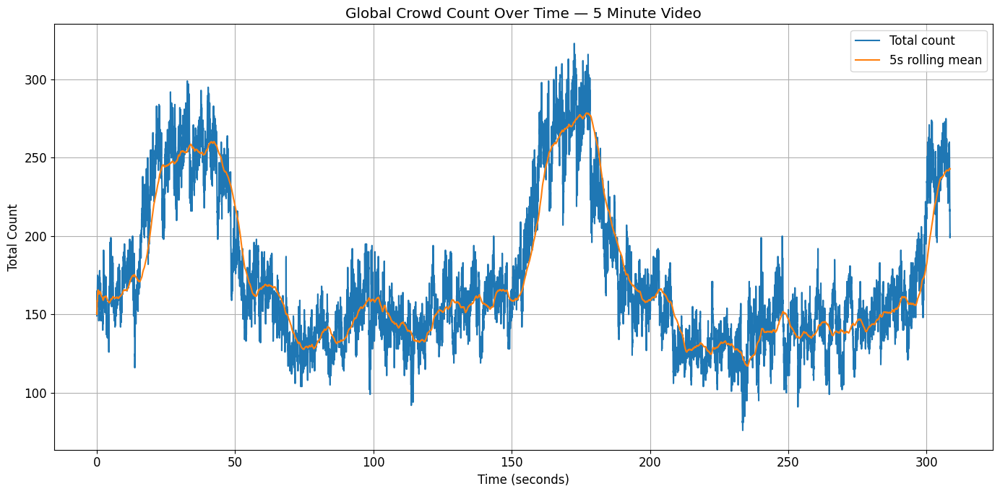

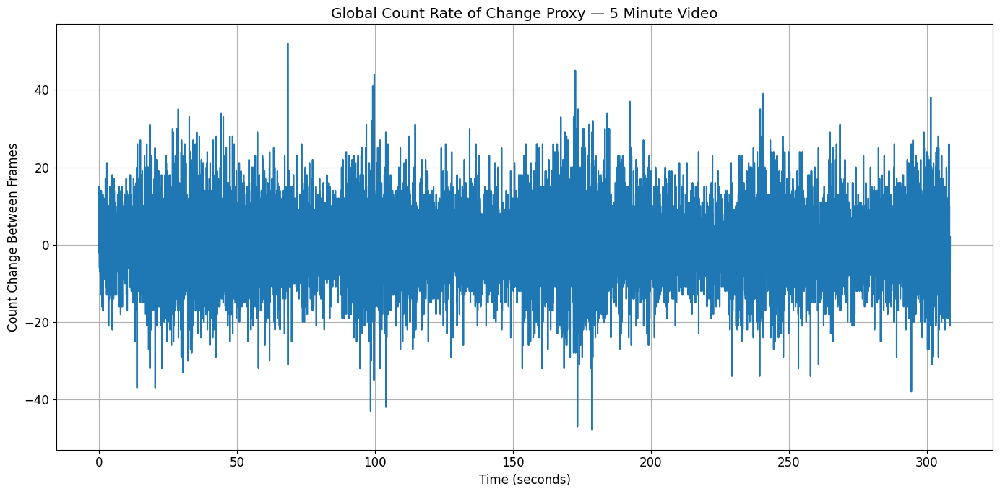

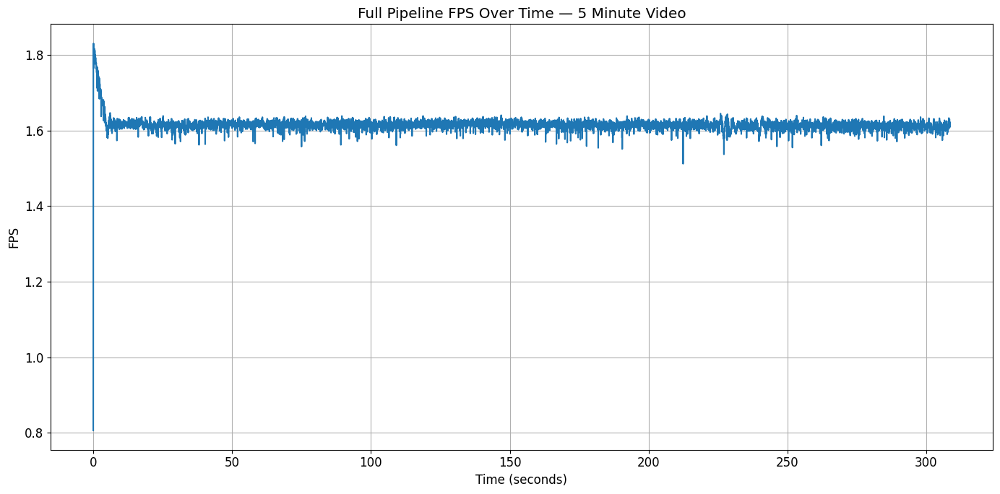

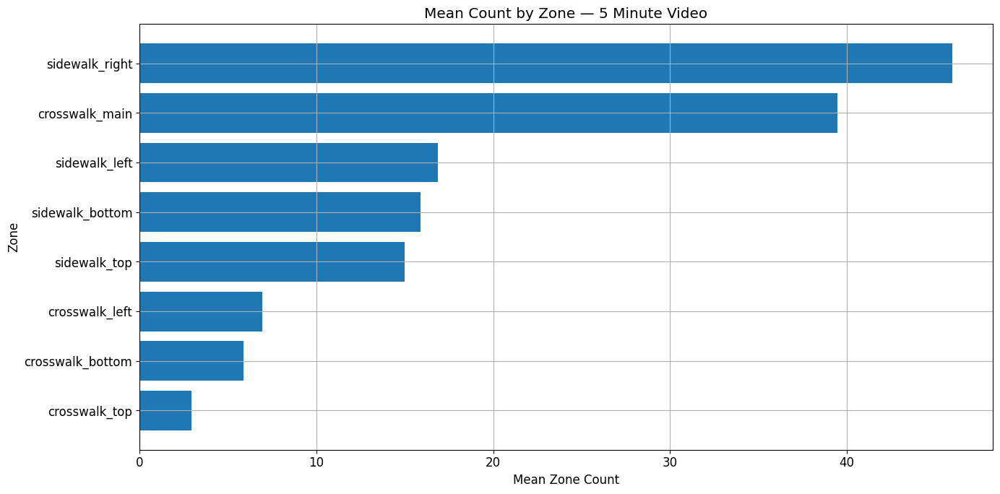

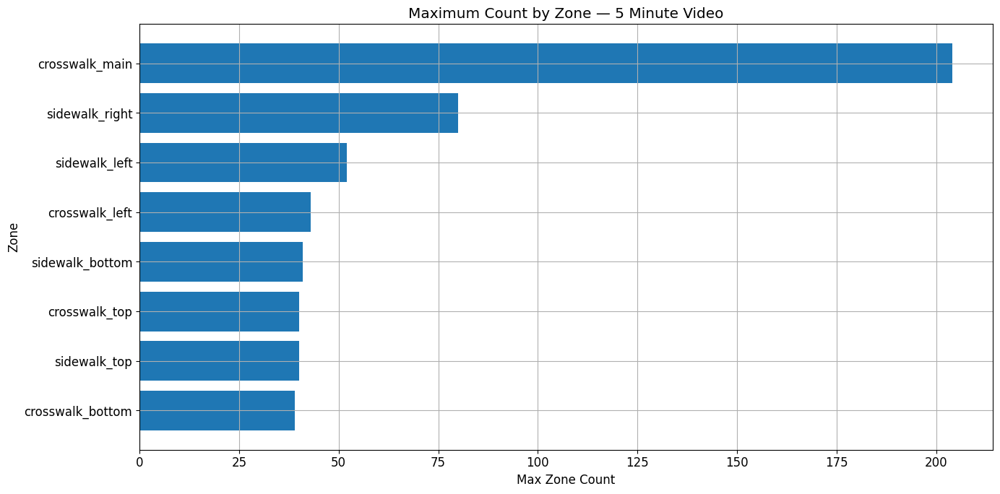

...

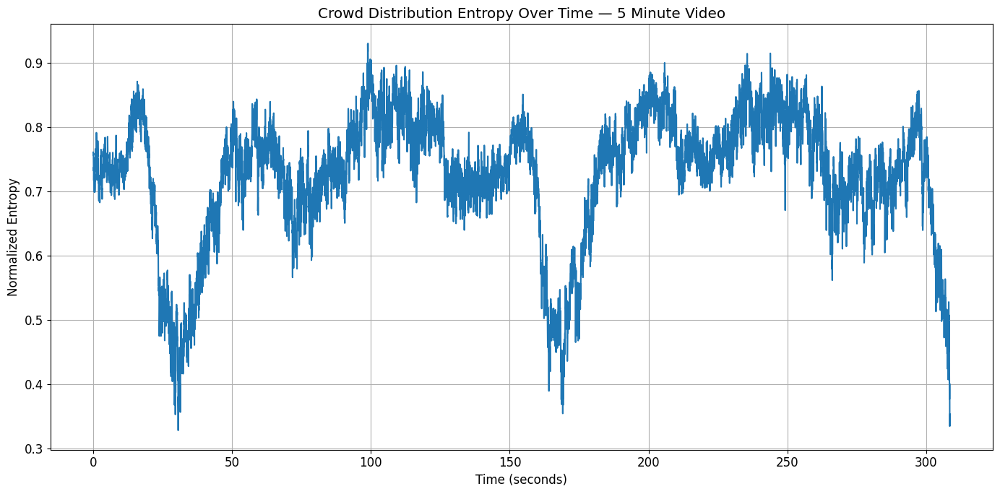

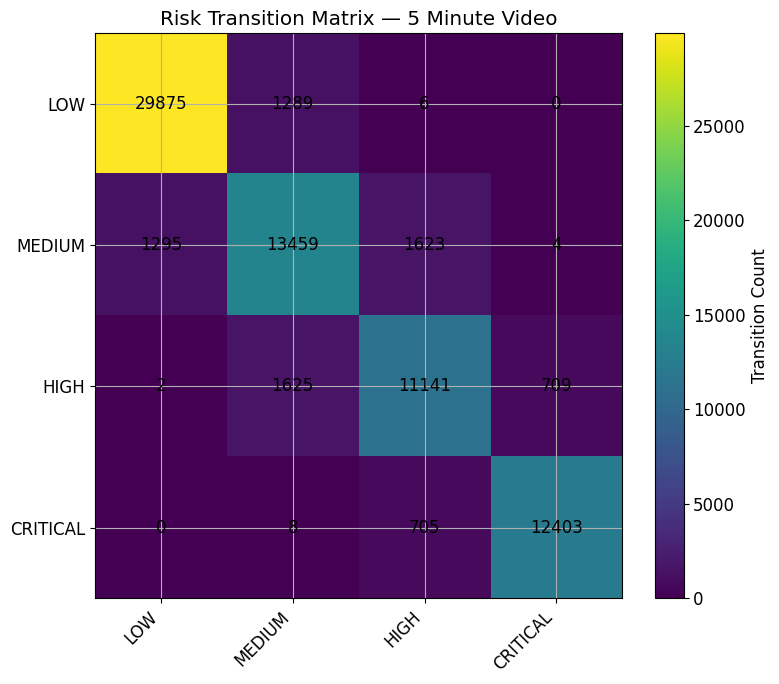

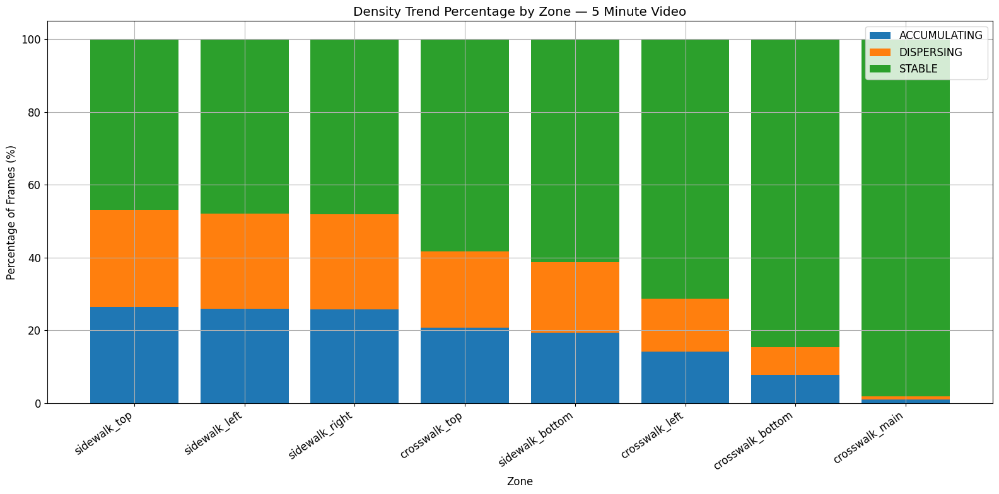

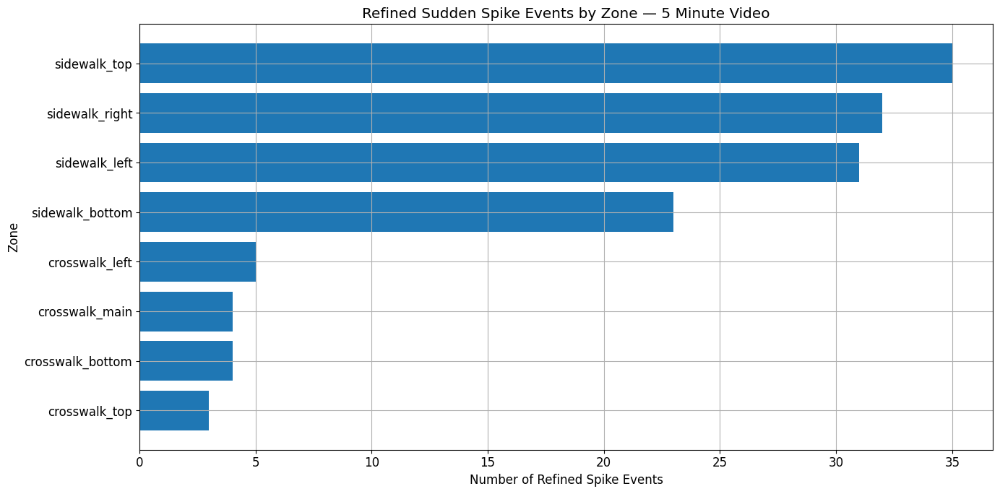

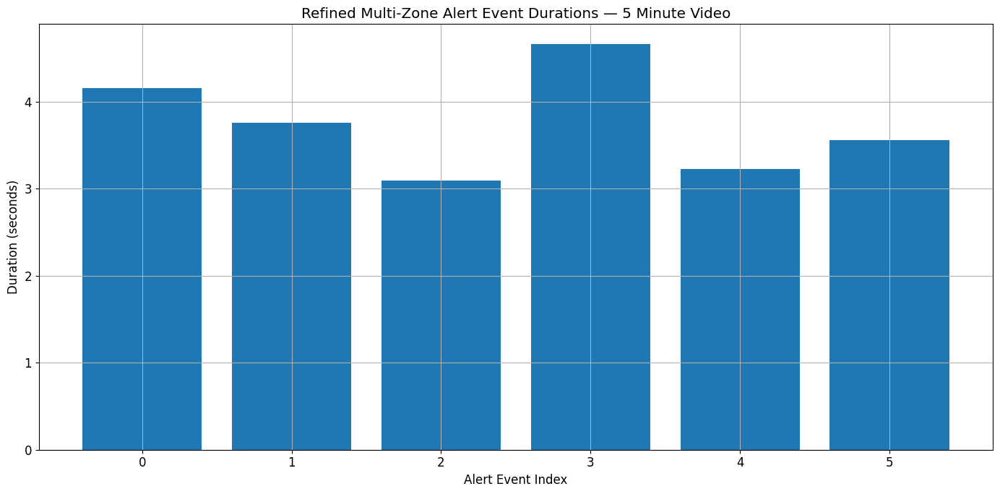

REFINED 5-MINUTE SHINJUKU CROWD ANALYSIS INSIGHTS

Dataset Overview
- Video duration: 308.53 seconds.
- Processed frames: 9269.
- Estimated video FPS: 30.04.
- Number of zones: 8.

1. Global Crowd Timeline
- Average total count: 172.55.
- Median total count: 158.00.
- Maximum total count: 323.
- Peak moment occurred at 172.64 seconds, frame 5186.
- Standard deviation of total count: 46.70.

2. Full Pipeline Performance
- Average full-pipeline FPS: 1.62.
- Average processing time per frame: 0.6189 seconds.
- This is the full offline pipeline speed, including inference, point extraction, zone assignment, visualization, and logging.

3. Zone Hotspot Ranking
- Highest average count zone: sidewalk_right with mean count 45.96.
- Highest peak count zone: crosswalk_main with max count 204.
- Highest average density zone: sidewalk_top with mean density 0.00051447.
- Highest maximum density zone: crosswalk_top with max density 0.00320410.
- Density is pixel-based and relative to polygon area, no

In [3]:
# ============================================================
# REFINED 5-MINUTE CSV ANALYSIS
# Fixes:
# - over-sensitive sudden spike detection
# - over-sensitive multi-zone alert detection
#
# Input:
# - FULL_01_shinjuku_frame_counts.csv
# - FULL_02_shinjuku_zone_density_risk.csv
#
# Output:
# /kaggle/working/crowd_outputs/analysis_5min_refined/
# /kaggle/working/crowd_outputs/analysis_5min_refined_outputs.zip
# ============================================================

import os
import json
import shutil
import zipfile
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display

# ============================================================
# 1) OUTPUT FOLDERS
# ============================================================

BASE_OUT = Path("/kaggle/working/crowd_outputs")
ANALYSIS_OUT = BASE_OUT / "analysis_5min_refined"
TABLES_OUT = ANALYSIS_OUT / "tables"
FIGURES_OUT = ANALYSIS_OUT / "figures"
INSIGHTS_OUT = ANALYSIS_OUT / "insights"
ZIP_PATH = BASE_OUT / "analysis_5min_refined_outputs.zip"

if ANALYSIS_OUT.exists():
    shutil.rmtree(ANALYSIS_OUT)

if ZIP_PATH.exists():
    ZIP_PATH.unlink()

for p in [BASE_OUT, ANALYSIS_OUT, TABLES_OUT, FIGURES_OUT, INSIGHTS_OUT]:
    p.mkdir(parents=True, exist_ok=True)

print("✅ Fresh refined analysis folders created:")
print(ANALYSIS_OUT)

# ============================================================
# 2) FIND CSV FILES
# ============================================================

csv_candidates = []

for root in [Path("/kaggle/input"), Path("/kaggle/working")]:
    if root.exists():
        csv_candidates.extend(list(root.rglob("*.csv")))

print("\n📄 Found CSV files:")
for i, p in enumerate(csv_candidates):
    print(f"[{i}] {p}")

frame_csv = None
zone_csv = None

for p in csv_candidates:
    name = p.name.lower()

    if name == "full_01_shinjuku_frame_counts.csv":
        frame_csv = p

    if name == "full_02_shinjuku_zone_density_risk.csv":
        zone_csv = p

if frame_csv is None:
    for p in csv_candidates:
        name = p.name.lower()
        if "frame" in name and "count" in name:
            frame_csv = p
            break

if zone_csv is None:
    for p in csv_candidates:
        name = p.name.lower()
        if "zone" in name and "risk" in name:
            zone_csv = p
            break

if frame_csv is None:
    raise FileNotFoundError("❌ Could not find FULL_01_shinjuku_frame_counts.csv")

if zone_csv is None:
    raise FileNotFoundError("❌ Could not find FULL_02_shinjuku_zone_density_risk.csv")

print("\n✅ Selected frame CSV:")
print(frame_csv)

print("\n✅ Selected zone CSV:")
print(zone_csv)

# ============================================================
# 3) LOAD DATA
# ============================================================

df_frame = pd.read_csv(frame_csv)
df_zone = pd.read_csv(zone_csv)

print("\n✅ Loaded data")
print("Frame CSV shape:", df_frame.shape)
print("Zone CSV shape:", df_zone.shape)

print("\nFrame columns:")
print(df_frame.columns.tolist())

print("\nZone columns:")
print(df_zone.columns.tolist())

# Required columns
required_frame_cols = [
    "frame_id",
    "timestamp_sec",
    "total_count",
    "inference_time_sec",
    "inference_fps",
]

required_zone_cols = [
    "frame_id",
    "timestamp_sec",
    "zone_name",
    "zone_count",
    "zone_density_pixel",
    "zone_area_pixels",
    "risk_level",
]

missing_frame = [c for c in required_frame_cols if c not in df_frame.columns]
missing_zone = [c for c in required_zone_cols if c not in df_zone.columns]

if missing_frame:
    raise ValueError(f"❌ Missing frame columns: {missing_frame}")

if missing_zone:
    raise ValueError(f"❌ Missing zone columns: {missing_zone}")

# Add short IDs if missing
if "zone_short_id" not in df_zone.columns:
    short_map = {
        "crosswalk_main": "CW1",
        "crosswalk_left": "CW2",
        "crosswalk_top": "CW3",
        "crosswalk_bottom": "CW4",
        "sidewalk_top": "SW1",
        "sidewalk_right": "SW2",
        "sidewalk_bottom": "SW3",
        "sidewalk_left": "SW4",
    }
    df_zone["zone_short_id"] = df_zone["zone_name"].map(short_map).fillna(df_zone["zone_name"])

df_frame = df_frame.sort_values("timestamp_sec").reset_index(drop=True)
df_zone = df_zone.sort_values(["zone_name", "timestamp_sec"]).reset_index(drop=True)

# Estimate FPS
timestamp_diff = df_frame["timestamp_sec"].diff().dropna()
median_dt = timestamp_diff[timestamp_diff > 0].median()

if pd.notna(median_dt) and median_dt > 0:
    estimated_fps = 1.0 / median_dt
else:
    estimated_fps = 30.0

video_duration_sec = float(df_frame["timestamp_sec"].max() - df_frame["timestamp_sec"].min())
processed_frames = len(df_frame)
num_zones = int(df_zone["zone_name"].nunique())

print("\n✅ Estimated FPS:", estimated_fps)
print("✅ Duration seconds:", video_duration_sec)
print("✅ Processed frames:", processed_frames)
print("✅ Number of zones:", num_zones)

# ============================================================
# 4) TEMPORAL ANALYSIS — GLOBAL COUNT
# ============================================================

df_frame["total_count_change"] = df_frame["total_count"].diff().fillna(0)
df_frame["total_count_change_abs"] = df_frame["total_count_change"].abs()

rolling_window_frames = max(3, int(estimated_fps * 5))

df_frame["rolling_mean_count_5s"] = (
    df_frame["total_count"]
    .rolling(rolling_window_frames, min_periods=1)
    .mean()
)

df_frame["rolling_mean_count_change_5s"] = (
    df_frame["total_count_change"]
    .rolling(rolling_window_frames, min_periods=1)
    .mean()
)

global_summary = pd.DataFrame([{
    "video_duration_sec": video_duration_sec,
    "processed_frames": processed_frames,
    "estimated_video_fps": estimated_fps,

    "mean_total_count": df_frame["total_count"].mean(),
    "median_total_count": df_frame["total_count"].median(),
    "min_total_count": df_frame["total_count"].min(),
    "max_total_count": df_frame["total_count"].max(),
    "std_total_count": df_frame["total_count"].std(),

    "mean_abs_count_change": df_frame["total_count_change_abs"].mean(),
    "max_positive_count_change": df_frame["total_count_change"].max(),
    "max_negative_count_change": df_frame["total_count_change"].min(),

    "mean_full_pipeline_fps": df_frame["inference_fps"].mean(),
    "median_full_pipeline_fps": df_frame["inference_fps"].median(),
    "mean_processing_time_sec": df_frame["inference_time_sec"].mean(),
    "median_processing_time_sec": df_frame["inference_time_sec"].median(),
}])

global_summary.to_csv(TABLES_OUT / "global_count_summary_5min_refined.csv", index=False)
df_frame.to_csv(TABLES_OUT / "global_count_change_features_5min_refined.csv", index=False)

top_10_peak_frames = df_frame.sort_values("total_count", ascending=False).head(10).copy()
top_10_peak_frames.to_csv(TABLES_OUT / "top_10_peak_crowd_frames_5min_refined.csv", index=False)

print("\n📊 Global summary:")
display(global_summary)

print("\n📊 Top 10 peak frames:")
display(top_10_peak_frames)

# ============================================================
# 5) SPATIAL / ZONE ANALYSIS
# ============================================================

zone_summary = df_zone.groupby(["zone_name", "zone_short_id"]).agg(
    frames_observed=("frame_id", "count"),

    mean_count=("zone_count", "mean"),
    median_count=("zone_count", "median"),
    min_count=("zone_count", "min"),
    max_count=("zone_count", "max"),
    std_count=("zone_count", "std"),

    mean_density=("zone_density_pixel", "mean"),
    median_density=("zone_density_pixel", "median"),
    min_density=("zone_density_pixel", "min"),
    max_density=("zone_density_pixel", "max"),
    std_density=("zone_density_pixel", "std"),

    zone_area_pixels=("zone_area_pixels", "first")
).reset_index()

zone_summary["count_variability"] = zone_summary["std_count"] / (zone_summary["mean_count"] + 1e-9)
zone_summary["density_variability"] = zone_summary["std_density"] / (zone_summary["mean_density"] + 1e-12)

zone_summary = zone_summary.sort_values("mean_density", ascending=False)

zone_summary.to_csv(TABLES_OUT / "zone_count_density_summary_5min_refined.csv", index=False)

zone_count_ranking = zone_summary.sort_values("mean_count", ascending=False).copy()
zone_density_ranking = zone_summary.sort_values("mean_density", ascending=False).copy()

zone_count_ranking.to_csv(TABLES_OUT / "zone_count_ranking_5min_refined.csv", index=False)
zone_density_ranking.to_csv(TABLES_OUT / "zone_density_ranking_5min_refined.csv", index=False)

print("\n📊 Zone count/density summary:")
display(zone_summary)

# ============================================================
# 6) RISK TIME DISTRIBUTION
# ============================================================

risk_counts = pd.crosstab(df_zone["zone_name"], df_zone["risk_level"])

for level in ["LOW", "MEDIUM", "HIGH", "CRITICAL"]:
    if level not in risk_counts.columns:
        risk_counts[level] = 0

risk_counts = risk_counts[["LOW", "MEDIUM", "HIGH", "CRITICAL"]]
risk_counts = risk_counts.reset_index()

risk_duration = risk_counts.copy()

for level in ["LOW", "MEDIUM", "HIGH", "CRITICAL"]:
    risk_duration[level + "_frames"] = risk_duration[level]
    risk_duration[level + "_seconds"] = risk_duration[level] / estimated_fps

risk_duration["total_frames"] = risk_duration[["LOW", "MEDIUM", "HIGH", "CRITICAL"]].sum(axis=1)
risk_duration["total_seconds"] = risk_duration["total_frames"] / estimated_fps

risk_duration["high_or_critical_frames"] = risk_duration["HIGH"] + risk_duration["CRITICAL"]
risk_duration["high_or_critical_seconds"] = risk_duration["high_or_critical_frames"] / estimated_fps
risk_duration["high_or_critical_percent"] = (
    risk_duration["high_or_critical_frames"] /
    risk_duration["total_frames"].replace(0, np.nan) * 100
).fillna(0)

risk_duration = risk_duration.sort_values("high_or_critical_seconds", ascending=False)

risk_duration.to_csv(TABLES_OUT / "risk_duration_summary_5min_refined.csv", index=False)

risk_percent = risk_counts.copy()
risk_percent_total = risk_percent[["LOW", "MEDIUM", "HIGH", "CRITICAL"]].sum(axis=1).replace(0, np.nan)

for level in ["LOW", "MEDIUM", "HIGH", "CRITICAL"]:
    risk_percent[level + "_percent"] = (risk_percent[level] / risk_percent_total * 100).fillna(0)

risk_percent.to_csv(TABLES_OUT / "risk_percentage_summary_5min_refined.csv", index=False)

print("\n📊 Risk duration:")
display(risk_duration)

print("\n📊 Risk percentage:")
display(risk_percent)

# ============================================================
# 7) ZONE CORRELATION MATRIX
# ============================================================

zone_count_wide = df_zone.pivot_table(
    index="frame_id",
    columns="zone_name",
    values="zone_count",
    aggfunc="mean"
).fillna(0)

zone_density_wide = df_zone.pivot_table(
    index="frame_id",
    columns="zone_name",
    values="zone_density_pixel",
    aggfunc="mean"
).fillna(0)

zone_count_corr = zone_count_wide.corr()
zone_density_corr = zone_density_wide.corr()

zone_count_corr.to_csv(TABLES_OUT / "zone_count_correlation_matrix_5min_refined.csv")
zone_density_corr.to_csv(TABLES_OUT / "zone_density_correlation_matrix_5min_refined.csv")

print("\n📊 Zone count correlation:")
display(zone_count_corr)

# ============================================================
# 8) ZONE LEAD-LAG ANALYSIS
# ============================================================

max_lag_seconds = 5
max_lag_frames = int(max_lag_seconds * estimated_fps)

lead_lag_rows = []
zones = list(zone_count_wide.columns)

for zone_a in zones:
    for zone_b in zones:
        if zone_a == zone_b:
            continue

        series_a = zone_count_wide[zone_a]
        series_b = zone_count_wide[zone_b]

        best_corr = -999
        best_lag = 0

        for lag in range(-max_lag_frames, max_lag_frames + 1):
            shifted_b = series_b.shift(lag)
            corr = series_a.corr(shifted_b)

            if pd.notna(corr) and corr > best_corr:
                best_corr = corr
                best_lag = lag

        if best_lag > 0:
            interpretation = f"{zone_a} tends to lead {zone_b} by {abs(best_lag / estimated_fps):.2f}s"
        elif best_lag < 0:
            interpretation = f"{zone_b} tends to lead {zone_a} by {abs(best_lag / estimated_fps):.2f}s"
        else:
            interpretation = f"{zone_a} and {zone_b} peak at approximately the same time"

        lead_lag_rows.append({
            "zone_a": zone_a,
            "zone_b": zone_b,
            "best_lag_frames": best_lag,
            "best_lag_seconds": best_lag / estimated_fps,
            "best_correlation": best_corr,
            "interpretation": interpretation,
        })

lead_lag_df = pd.DataFrame(lead_lag_rows)
lead_lag_df = lead_lag_df.sort_values("best_correlation", ascending=False)

lead_lag_df.to_csv(TABLES_OUT / "zone_lead_lag_summary_5min_refined.csv", index=False)

print("\n📊 Lead-lag summary:")
display(lead_lag_df.head(20))

# ============================================================
# 9) TEMPORAL DENSITY CHANGE + TRENDS
# ============================================================

df_temporal = df_zone.copy()
df_temporal = df_temporal.sort_values(["zone_name", "timestamp_sec"]).reset_index(drop=True)

df_temporal["count_change"] = df_temporal.groupby("zone_name")["zone_count"].diff().fillna(0)
df_temporal["density_change"] = df_temporal.groupby("zone_name")["zone_density_pixel"].diff().fillna(0)

density_std_by_zone = df_temporal.groupby("zone_name")["zone_density_pixel"].transform("std").fillna(0)
density_threshold = (density_std_by_zone * 0.20).clip(lower=1e-8)

df_temporal["density_trend"] = np.select(
    [
        df_temporal["density_change"] > density_threshold,
        df_temporal["density_change"] < -density_threshold,
    ],
    [
        "ACCUMULATING",
        "DISPERSING",
    ],
    default="STABLE"
)

count_std_by_zone = df_temporal.groupby("zone_name")["zone_count"].transform("std").fillna(0)
count_threshold = (count_std_by_zone * 0.20).clip(lower=1.0)

df_temporal["count_trend"] = np.select(
    [
        df_temporal["count_change"] > count_threshold,
        df_temporal["count_change"] < -count_threshold,
    ],
    [
        "ACCUMULATING",
        "DISPERSING",
    ],
    default="STABLE"
)

df_temporal.to_csv(TABLES_OUT / "temporal_density_features_5min_refined.csv", index=False)

trend_summary = pd.crosstab(df_temporal["zone_name"], df_temporal["density_trend"]).reset_index()

for col in ["ACCUMULATING", "DISPERSING", "STABLE"]:
    if col not in trend_summary.columns:
        trend_summary[col] = 0

trend_summary["total_frames"] = trend_summary[["ACCUMULATING", "DISPERSING", "STABLE"]].sum(axis=1)

for col in ["ACCUMULATING", "DISPERSING", "STABLE"]:
    trend_summary[col + "_percent"] = (
        trend_summary[col] / trend_summary["total_frames"].replace(0, np.nan) * 100
    ).fillna(0)

trend_summary = trend_summary.sort_values("ACCUMULATING_percent", ascending=False)

trend_summary.to_csv(TABLES_OUT / "density_trend_summary_5min_refined.csv", index=False)

print("\n📊 Density trend summary:")
display(trend_summary)

# Rolling 5-second features
df_rolling = df_temporal.copy()

df_rolling["rolling_mean_count_5s"] = (
    df_rolling.groupby("zone_name")["zone_count"]
    .transform(lambda s: s.rolling(rolling_window_frames, min_periods=1).mean())
)

df_rolling["rolling_mean_density_5s"] = (
    df_rolling.groupby("zone_name")["zone_density_pixel"]
    .transform(lambda s: s.rolling(rolling_window_frames, min_periods=1).mean())
)

df_rolling["rolling_mean_density_change_5s"] = (
    df_rolling.groupby("zone_name")["density_change"]
    .transform(lambda s: s.rolling(rolling_window_frames, min_periods=1).mean())
)

df_rolling.to_csv(TABLES_OUT / "rolling_behavior_features_5s_5min_refined.csv", index=False)

# ============================================================
# 10) REFINED ANOMALY DETECTION — SUDDEN SPIKES
# ============================================================

# Previous rule was too sensitive.
# New rule:
# - compare current count to 30 frames ago
# - current count must be at least 20
# - absolute increase must be at least 10 people
# - percent increase must be at least 50%
# - collapse repeated detections within 3 seconds into one event

SPIKE_WINDOW_FRAMES = 30
MIN_CURRENT_COUNT = 20
MIN_ABSOLUTE_INCREASE = 10
MIN_PERCENT_INCREASE = 50.0
MIN_EVENT_GAP_SECONDS = 3.0
MIN_EVENT_GAP_FRAMES = int(MIN_EVENT_GAP_SECONDS * estimated_fps)

raw_spike_rows = []

for zone_name, group in df_zone.groupby("zone_name"):
    group = group.sort_values("frame_id").copy()

    group["count_past"] = group["zone_count"].shift(SPIKE_WINDOW_FRAMES)
    group["density_past"] = group["zone_density_pixel"].shift(SPIKE_WINDOW_FRAMES)

    group["absolute_count_increase"] = group["zone_count"] - group["count_past"]

    group["count_percent_change"] = (
        group["absolute_count_increase"] /
        group["count_past"].replace(0, np.nan) * 100
    ).replace([np.inf, -np.inf], np.nan).fillna(0)

    group["density_percent_change"] = (
        (group["zone_density_pixel"] - group["density_past"]) /
        group["density_past"].replace(0, np.nan) * 100
    ).replace([np.inf, -np.inf], np.nan).fillna(0)

    candidates = group[
        (group["zone_count"] >= MIN_CURRENT_COUNT) &
        (group["absolute_count_increase"] >= MIN_ABSOLUTE_INCREASE) &
        (group["count_percent_change"] >= MIN_PERCENT_INCREASE)
    ].copy()

    for _, row in candidates.iterrows():
        raw_spike_rows.append({
            "frame_id": int(row["frame_id"]),
            "timestamp_sec": float(row["timestamp_sec"]),
            "zone_name": zone_name,
            "zone_short_id": row.get("zone_short_id", zone_name),
            "zone_count": float(row["zone_count"]),
            "count_past_30f": float(row["count_past"]),
            "absolute_count_increase": float(row["absolute_count_increase"]),
            "count_percent_change_30f": float(row["count_percent_change"]),
            "zone_density_pixel": float(row["zone_density_pixel"]),
            "density_percent_change_30f": float(row["density_percent_change"]),
            "risk_level": row["risk_level"],
        })

raw_spikes = pd.DataFrame(raw_spike_rows)

if raw_spikes.empty:
    raw_spikes = pd.DataFrame(columns=[
        "frame_id",
        "timestamp_sec",
        "zone_name",
        "zone_short_id",
        "zone_count",
        "count_past_30f",
        "absolute_count_increase",
        "count_percent_change_30f",
        "zone_density_pixel",
        "density_percent_change_30f",
        "risk_level",
    ])

# Collapse repeated frames into meaningful events
refined_spike_events = []

for zone_name, group in raw_spikes.groupby("zone_name"):
    group = group.sort_values("frame_id").copy()

    current_event = []
    last_frame = None

    for _, row in group.iterrows():
        if last_frame is None or (row["frame_id"] - last_frame) <= MIN_EVENT_GAP_FRAMES:
            current_event.append(row)
        else:
            event_df = pd.DataFrame(current_event)
            peak = event_df.sort_values("absolute_count_increase", ascending=False).iloc[0]

            refined_spike_events.append({
                "zone_name": zone_name,
                "zone_short_id": peak["zone_short_id"],
                "event_start_frame": int(event_df["frame_id"].min()),
                "event_end_frame": int(event_df["frame_id"].max()),
                "event_start_sec": float(event_df["timestamp_sec"].min()),
                "event_end_sec": float(event_df["timestamp_sec"].max()),
                "event_duration_sec": float(event_df["timestamp_sec"].max() - event_df["timestamp_sec"].min()),
                "peak_frame_id": int(peak["frame_id"]),
                "peak_timestamp_sec": float(peak["timestamp_sec"]),
                "peak_zone_count": float(peak["zone_count"]),
                "peak_absolute_increase": float(peak["absolute_count_increase"]),
                "peak_percent_increase": float(peak["count_percent_change_30f"]),
                "peak_risk_level": peak["risk_level"],
            })

            current_event = [row]

        last_frame = row["frame_id"]

    if current_event:
        event_df = pd.DataFrame(current_event)
        peak = event_df.sort_values("absolute_count_increase", ascending=False).iloc[0]

        refined_spike_events.append({
            "zone_name": zone_name,
            "zone_short_id": peak["zone_short_id"],
            "event_start_frame": int(event_df["frame_id"].min()),
            "event_end_frame": int(event_df["frame_id"].max()),
            "event_start_sec": float(event_df["timestamp_sec"].min()),
            "event_end_sec": float(event_df["timestamp_sec"].max()),
            "event_duration_sec": float(event_df["timestamp_sec"].max() - event_df["timestamp_sec"].min()),
            "peak_frame_id": int(peak["frame_id"]),
            "peak_timestamp_sec": float(peak["timestamp_sec"]),
            "peak_zone_count": float(peak["zone_count"]),
            "peak_absolute_increase": float(peak["absolute_count_increase"]),
            "peak_percent_increase": float(peak["count_percent_change_30f"]),
            "peak_risk_level": peak["risk_level"],
        })

refined_spike_events = pd.DataFrame(refined_spike_events)

if refined_spike_events.empty:
    refined_spike_events = pd.DataFrame(columns=[
        "zone_name",
        "zone_short_id",
        "event_start_frame",
        "event_end_frame",
        "event_start_sec",
        "event_end_sec",
        "event_duration_sec",
        "peak_frame_id",
        "peak_timestamp_sec",
        "peak_zone_count",
        "peak_absolute_increase",
        "peak_percent_increase",
        "peak_risk_level",
    ])

raw_spikes.to_csv(TABLES_OUT / "raw_sudden_spike_candidates_5min_refined.csv", index=False)
refined_spike_events.to_csv(TABLES_OUT / "refined_sudden_spike_events_5min.csv", index=False)

spike_summary = refined_spike_events.groupby("zone_name").agg(
    refined_spike_events=("zone_name", "count"),
    max_peak_zone_count=("peak_zone_count", "max"),
    max_absolute_increase=("peak_absolute_increase", "max"),
    max_percent_increase=("peak_percent_increase", "max"),
).reset_index()

if spike_summary.empty:
    spike_summary = pd.DataFrame(columns=[
        "zone_name",
        "refined_spike_events",
        "max_peak_zone_count",
        "max_absolute_increase",
        "max_percent_increase",
    ])

spike_summary.to_csv(TABLES_OUT / "refined_sudden_spike_summary_5min.csv", index=False)

print("\n📊 Refined sudden spike events:")
display(refined_spike_events.head(30))

print("\n📊 Refined sudden spike summary:")
display(spike_summary)

# ============================================================
# 11) Z-SCORE ANOMALY SUMMARY
# ============================================================

df_anomaly = df_temporal.copy()
window = rolling_window_frames

def add_anomaly_scores(group):
    group = group.sort_values("timestamp_sec").copy()

    rolling_mean = group["zone_density_pixel"].rolling(window, min_periods=5).mean()
    rolling_std = group["zone_density_pixel"].rolling(window, min_periods=5).std()

    group["density_rolling_mean_5s"] = rolling_mean
    group["density_rolling_std_5s"] = rolling_std

    group["density_z_score"] = (
        (group["zone_density_pixel"] - rolling_mean) /
        rolling_std.replace(0, np.nan)
    ).replace([np.inf, -np.inf], np.nan).fillna(0)

    group["density_spike_anomaly"] = (group["density_z_score"] > 2.5).astype(int)

    dc_mean = group["density_change"].rolling(window, min_periods=5).mean()
    dc_std = group["density_change"].rolling(window, min_periods=5).std()

    group["density_change_z_score"] = (
        (group["density_change"] - dc_mean) /
        dc_std.replace(0, np.nan)
    ).replace([np.inf, -np.inf], np.nan).fillna(0)

    group["accumulation_anomaly"] = (group["density_change_z_score"] > 2.5).astype(int)

    group["csv_anomaly_score"] = (
        0.60 * group["density_spike_anomaly"] +
        0.40 * group["accumulation_anomaly"]
    )

    return group

df_anomaly = df_anomaly.groupby("zone_name", group_keys=False).apply(add_anomaly_scores)

df_anomaly.to_csv(TABLES_OUT / "csv_based_anomaly_features_5min_refined.csv", index=False)

anomaly_summary = df_anomaly.groupby("zone_name").agg(
    density_spike_anomalies=("density_spike_anomaly", "sum"),
    accumulation_anomalies=("accumulation_anomaly", "sum"),
    mean_density_z_score=("density_z_score", "mean"),
    max_density_z_score=("density_z_score", "max"),
    mean_density_change_z_score=("density_change_z_score", "mean"),
    max_density_change_z_score=("density_change_z_score", "max"),
).reset_index()

anomaly_summary.to_csv(TABLES_OUT / "csv_based_anomaly_summary_5min_refined.csv", index=False)

print("\n📊 Z-score anomaly summary:")
display(anomaly_summary)

# ============================================================
# 12) REFINED MULTI-ZONE SIMULTANEOUS ALERTS
# ============================================================

# Previous rule was too sensitive:
#   2 or more HIGH/CRITICAL zones
#
# New rule:
# - 3 or more HIGH/CRITICAL zones
# - total_count >= median global count
# - alert segment must last >= 3 seconds

MIN_HIGH_CRITICAL_ZONES = 3
MIN_ALERT_DURATION_SEC = 3.0

df_zone_for_alerts = df_zone.copy()
df_zone_for_alerts["is_high_or_critical"] = df_zone_for_alerts["risk_level"].isin(["HIGH", "CRITICAL"]).astype(int)

multi_zone_timeline = df_zone_for_alerts.groupby("frame_id").agg(
    timestamp_sec=("timestamp_sec", "first"),
    high_or_critical_zone_count=("is_high_or_critical", "sum"),
    total_zones=("zone_name", "nunique"),
).reset_index()

zones_high = (
    df_zone_for_alerts[df_zone_for_alerts["is_high_or_critical"] == 1]
    .groupby("frame_id")["zone_name"]
    .apply(lambda x: ", ".join(sorted(x.unique())))
    .reset_index()
    .rename(columns={"zone_name": "zones_high_or_critical"})
)

multi_zone_timeline = multi_zone_timeline.merge(zones_high, on="frame_id", how="left")
multi_zone_timeline["zones_high_or_critical"] = multi_zone_timeline["zones_high_or_critical"].fillna("")

# Add global count
multi_zone_timeline = multi_zone_timeline.merge(
    df_frame[["frame_id", "total_count"]],
    on="frame_id",
    how="left"
)

median_global_count = df_frame["total_count"].median()

multi_zone_timeline["raw_multi_zone_alert"] = (
    (multi_zone_timeline["high_or_critical_zone_count"] >= MIN_HIGH_CRITICAL_ZONES) &
    (multi_zone_timeline["total_count"] >= median_global_count)
).astype(int)

# Convert raw alert frames into sustained alert events
alert_events = []
current_event = []

for _, row in multi_zone_timeline.sort_values("frame_id").iterrows():
    if row["raw_multi_zone_alert"] == 1:
        current_event.append(row)
    else:
        if current_event:
            event_df = pd.DataFrame(current_event)
            duration = event_df["timestamp_sec"].max() - event_df["timestamp_sec"].min()

            if duration >= MIN_ALERT_DURATION_SEC:
                peak = event_df.sort_values(
                    ["high_or_critical_zone_count", "total_count"],
                    ascending=False
                ).iloc[0]

                alert_events.append({
                    "event_start_frame": int(event_df["frame_id"].min()),
                    "event_end_frame": int(event_df["frame_id"].max()),
                    "event_start_sec": float(event_df["timestamp_sec"].min()),
                    "event_end_sec": float(event_df["timestamp_sec"].max()),
                    "event_duration_sec": float(duration),
                    "peak_frame_id": int(peak["frame_id"]),
                    "peak_timestamp_sec": float(peak["timestamp_sec"]),
                    "peak_high_or_critical_zone_count": int(peak["high_or_critical_zone_count"]),
                    "peak_total_count": float(peak["total_count"]),
                    "zones_high_or_critical_at_peak": peak["zones_high_or_critical"],
                })

            current_event = []

if current_event:
    event_df = pd.DataFrame(current_event)
    duration = event_df["timestamp_sec"].max() - event_df["timestamp_sec"].min()

    if duration >= MIN_ALERT_DURATION_SEC:
        peak = event_df.sort_values(
            ["high_or_critical_zone_count", "total_count"],
            ascending=False
        ).iloc[0]

        alert_events.append({
            "event_start_frame": int(event_df["frame_id"].min()),
            "event_end_frame": int(event_df["frame_id"].max()),
            "event_start_sec": float(event_df["timestamp_sec"].min()),
            "event_end_sec": float(event_df["timestamp_sec"].max()),
            "event_duration_sec": float(duration),
            "peak_frame_id": int(peak["frame_id"]),
            "peak_timestamp_sec": float(peak["timestamp_sec"]),
            "peak_high_or_critical_zone_count": int(peak["high_or_critical_zone_count"]),
            "peak_total_count": float(peak["total_count"]),
            "zones_high_or_critical_at_peak": peak["zones_high_or_critical"],
        })

refined_multi_zone_alerts = pd.DataFrame(alert_events)

if refined_multi_zone_alerts.empty:
    refined_multi_zone_alerts = pd.DataFrame(columns=[
        "event_start_frame",
        "event_end_frame",
        "event_start_sec",
        "event_end_sec",
        "event_duration_sec",
        "peak_frame_id",
        "peak_timestamp_sec",
        "peak_high_or_critical_zone_count",
        "peak_total_count",
        "zones_high_or_critical_at_peak",
    ])

multi_zone_timeline.to_csv(TABLES_OUT / "multi_zone_risk_timeline_5min_refined.csv", index=False)
refined_multi_zone_alerts.to_csv(TABLES_OUT / "refined_multi_zone_alert_events_5min.csv", index=False)

print("\n📊 Refined multi-zone alert events:")
display(refined_multi_zone_alerts.head(30))

# ============================================================
# 13) STATISTICAL INSIGHTS — CROWD ENTROPY
# ============================================================

entropy_rows = []

for frame_id, group in df_zone.groupby("frame_id"):
    counts = group["zone_count"].values.astype(float)
    timestamp = group["timestamp_sec"].iloc[0]
    total = counts.sum()

    if total <= 0:
        entropy = 0.0
        normalized_entropy = 0.0
    else:
        p = counts / total
        p = p[p > 0]
        entropy = -np.sum(p * np.log(p))
        normalized_entropy = entropy / np.log(len(counts)) if len(counts) > 1 else 0.0

    entropy_rows.append({
        "frame_id": frame_id,
        "timestamp_sec": timestamp,
        "zone_total_count": total,
        "crowd_distribution_entropy": entropy,
        "normalized_entropy": normalized_entropy,
    })

entropy_df = pd.DataFrame(entropy_rows).sort_values("timestamp_sec")

entropy_summary = pd.DataFrame([{
    "mean_entropy": entropy_df["crowd_distribution_entropy"].mean(),
    "median_entropy": entropy_df["crowd_distribution_entropy"].median(),
    "min_entropy": entropy_df["crowd_distribution_entropy"].min(),
    "max_entropy": entropy_df["crowd_distribution_entropy"].max(),
    "mean_normalized_entropy": entropy_df["normalized_entropy"].mean(),
    "median_normalized_entropy": entropy_df["normalized_entropy"].median(),
    "min_normalized_entropy": entropy_df["normalized_entropy"].min(),
    "max_normalized_entropy": entropy_df["normalized_entropy"].max(),
}])

entropy_df.to_csv(TABLES_OUT / "crowd_entropy_over_time_5min_refined.csv", index=False)
entropy_summary.to_csv(TABLES_OUT / "crowd_entropy_summary_5min_refined.csv", index=False)

print("\n📊 Entropy summary:")
display(entropy_summary)

# ============================================================
# 14) STATISTICAL INSIGHTS — RISK TRANSITION MATRIX
# ============================================================

risk_order = ["LOW", "MEDIUM", "HIGH", "CRITICAL"]

transition_rows = []

for zone_name, group in df_zone.groupby("zone_name"):
    group = group.sort_values("frame_id").copy()
    current_levels = group["risk_level"].values[:-1]
    next_levels = group["risk_level"].values[1:]

    for current, nxt in zip(current_levels, next_levels):
        transition_rows.append({
            "zone_name": zone_name,
            "from_risk": current,
            "to_risk": nxt,
        })

risk_transition_df = pd.DataFrame(transition_rows)

risk_transition_matrix = pd.crosstab(
    risk_transition_df["from_risk"],
    risk_transition_df["to_risk"]
)

for r in risk_order:
    if r not in risk_transition_matrix.index:
        risk_transition_matrix.loc[r] = 0
    if r not in risk_transition_matrix.columns:
        risk_transition_matrix[r] = 0

risk_transition_matrix = risk_transition_matrix.loc[risk_order, risk_order]

risk_transition_matrix.to_csv(TABLES_OUT / "risk_transition_matrix_5min_refined.csv")

risk_transition_by_zone = (
    risk_transition_df.groupby(["zone_name", "from_risk", "to_risk"])
    .size()
    .reset_index(name="transition_count")
    .sort_values(["zone_name", "transition_count"], ascending=[True, False])
)

risk_transition_by_zone.to_csv(TABLES_OUT / "risk_transition_by_zone_5min_refined.csv", index=False)

print("\n📊 Risk transition matrix:")
display(risk_transition_matrix)

# ============================================================
# 15) FIGURES
# ============================================================

plt.rcParams.update({
    "figure.figsize": (14, 7),
    "axes.grid": True,
    "font.size": 12
})

# 15.1 Global count over time
plt.figure()
plt.plot(df_frame["timestamp_sec"], df_frame["total_count"], label="Total count")
plt.plot(df_frame["timestamp_sec"], df_frame["rolling_mean_count_5s"], label="5s rolling mean")
plt.title("Global Crowd Count Over Time — 5 Minute Video")
plt.xlabel("Time (seconds)")
plt.ylabel("Total Count")
plt.legend()
plt.tight_layout()
plt.savefig(FIGURES_OUT / "global_count_over_time_5min_refined.png", dpi=200)
plt.show()

# 15.2 Global count change
plt.figure()
plt.plot(df_frame["timestamp_sec"], df_frame["total_count_change"])
plt.title("Global Count Rate of Change Proxy — 5 Minute Video")
plt.xlabel("Time (seconds)")
plt.ylabel("Count Change Between Frames")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "global_count_change_over_time_5min_refined.png", dpi=200)
plt.show()

# 15.3 Pipeline FPS
plt.figure()
plt.plot(df_frame["timestamp_sec"], df_frame["inference_fps"])
plt.title("Full Pipeline FPS Over Time — 5 Minute Video")
plt.xlabel("Time (seconds)")
plt.ylabel("FPS")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "inference_fps_over_time_5min_refined.png", dpi=200)
plt.show()

# 15.4 Mean count by zone
plt.figure()
plot_data = zone_summary.sort_values("mean_count", ascending=True)
plt.barh(plot_data["zone_name"], plot_data["mean_count"])
plt.title("Mean Count by Zone — 5 Minute Video")
plt.xlabel("Mean Zone Count")
plt.ylabel("Zone")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "mean_count_by_zone_5min_refined.png", dpi=200)
plt.show()

# 15.5 Max count by zone
plt.figure()
plot_data = zone_summary.sort_values("max_count", ascending=True)
plt.barh(plot_data["zone_name"], plot_data["max_count"])
plt.title("Maximum Count by Zone — 5 Minute Video")
plt.xlabel("Max Zone Count")
plt.ylabel("Zone")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "max_count_by_zone_5min_refined.png", dpi=200)
plt.show()

# 15.6 Mean density by zone
plt.figure()
plot_data = zone_summary.sort_values("mean_density", ascending=True)
plt.barh(plot_data["zone_name"], plot_data["mean_density"])
plt.title("Mean Pixel-Based Density by Zone — 5 Minute Video")
plt.xlabel("Mean Pixel-Based Density")
plt.ylabel("Zone")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "mean_density_by_zone_5min_refined.png", dpi=200)
plt.show()

# 15.7 Max density by zone
plt.figure()
plot_data = zone_summary.sort_values("max_density", ascending=True)
plt.barh(plot_data["zone_name"], plot_data["max_density"])
plt.title("Maximum Pixel-Based Density by Zone — 5 Minute Video")
plt.xlabel("Max Pixel-Based Density")
plt.ylabel("Zone")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "max_density_by_zone_5min_refined.png", dpi=200)
plt.show()

# 15.8 Risk percentage stacked bar
risk_plot = risk_percent.set_index("zone_name")[
    ["LOW_percent", "MEDIUM_percent", "HIGH_percent", "CRITICAL_percent"]
]

plt.figure(figsize=(16, 8))
bottom = np.zeros(len(risk_plot))

for col in risk_plot.columns:
    values = risk_plot[col].values
    plt.bar(risk_plot.index, values, bottom=bottom, label=col.replace("_percent", ""))
    bottom += values

plt.title("Risk Level Percentage by Zone — 5 Minute Video")
plt.xlabel("Zone")
plt.ylabel("Percentage of Frames (%)")
plt.xticks(rotation=35, ha="right")
plt.legend()
plt.tight_layout()
plt.savefig(FIGURES_OUT / "risk_percentage_by_zone_5min_refined.png", dpi=200)
plt.show()

# 15.9 High/Critical duration
plt.figure()
plot_data = risk_duration.sort_values("high_or_critical_seconds", ascending=True)
plt.barh(plot_data["zone_name"], plot_data["high_or_critical_seconds"])
plt.title("HIGH/CRITICAL Risk Duration by Zone — 5 Minute Video")
plt.xlabel("Duration (seconds)")
plt.ylabel("Zone")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "high_critical_risk_duration_by_zone_5min_refined.png", dpi=200)
plt.show()

# 15.10 Correlation heatmap
plt.figure(figsize=(10, 8))
plt.imshow(zone_count_corr.values, aspect="auto")
plt.colorbar(label="Correlation")
plt.xticks(range(len(zone_count_corr.columns)), zone_count_corr.columns, rotation=45, ha="right")
plt.yticks(range(len(zone_count_corr.index)), zone_count_corr.index)
plt.title("Zone Count Correlation Matrix — 5 Minute Video")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "zone_count_correlation_heatmap_5min_refined.png", dpi=200)
plt.show()

# 15.11 Entropy
plt.figure()
plt.plot(entropy_df["timestamp_sec"], entropy_df["normalized_entropy"])
plt.title("Crowd Distribution Entropy Over Time — 5 Minute Video")
plt.xlabel("Time (seconds)")
plt.ylabel("Normalized Entropy")
plt.tight_layout()
plt.savefig(FIGURES_OUT / "crowd_entropy_over_time_5min_refined.png", dpi=200)
plt.show()

# 15.12 Risk transition matrix
plt.figure(figsize=(8, 7))
plt.imshow(risk_transition_matrix.values, aspect="auto")
plt.colorbar(label="Transition Count")
plt.xticks(range(len(risk_order)), risk_order, rotation=45, ha="right")
plt.yticks(range(len(risk_order)), risk_order)
plt.title("Risk Transition Matrix — 5 Minute Video")

for i in range(len(risk_order)):
    for j in range(len(risk_order)):
        plt.text(j, i, str(int(risk_transition_matrix.values[i, j])),
                 ha="center", va="center")

plt.tight_layout()
plt.savefig(FIGURES_OUT / "risk_transition_matrix_5min_refined.png", dpi=200)
plt.show()

# 15.13 Density trend
trend_plot = trend_summary.set_index("zone_name")[
    ["ACCUMULATING_percent", "DISPERSING_percent", "STABLE_percent"]
]

plt.figure(figsize=(16, 8))
bottom = np.zeros(len(trend_plot))

for col in trend_plot.columns:
    values = trend_plot[col].values
    plt.bar(trend_plot.index, values, bottom=bottom, label=col.replace("_percent", ""))
    bottom += values

plt.title("Density Trend Percentage by Zone — 5 Minute Video")
plt.xlabel("Zone")
plt.ylabel("Percentage of Frames (%)")
plt.xticks(rotation=35, ha="right")
plt.legend()
plt.tight_layout()
plt.savefig(FIGURES_OUT / "density_trend_percentage_by_zone_5min_refined.png", dpi=200)
plt.show()

# 15.14 Refined spike summary
if not spike_summary.empty:
    plt.figure()
    plot_data = spike_summary.sort_values("refined_spike_events", ascending=True)
    plt.barh(plot_data["zone_name"], plot_data["refined_spike_events"])
    plt.title("Refined Sudden Spike Events by Zone — 5 Minute Video")
    plt.xlabel("Number of Refined Spike Events")
    plt.ylabel("Zone")
    plt.tight_layout()
    plt.savefig(FIGURES_OUT / "refined_spike_events_by_zone_5min.png", dpi=200)
    plt.show()

# 15.15 Refined multi-zone alert events
if not refined_multi_zone_alerts.empty:
    plt.figure()
    plt.bar(range(len(refined_multi_zone_alerts)), refined_multi_zone_alerts["event_duration_sec"])
    plt.title("Refined Multi-Zone Alert Event Durations — 5 Minute Video")
    plt.xlabel("Alert Event Index")
    plt.ylabel("Duration (seconds)")
    plt.tight_layout()
    plt.savefig(FIGURES_OUT / "refined_multi_zone_alert_durations_5min.png", dpi=200)
    plt.show()

# ============================================================
# 16) AUTOMATIC INSIGHTS
# ============================================================

highest_mean_count = zone_summary.sort_values("mean_count", ascending=False).iloc[0]
highest_max_count = zone_summary.sort_values("max_count", ascending=False).iloc[0]
highest_mean_density = zone_summary.sort_values("mean_density", ascending=False).iloc[0]
highest_max_density = zone_summary.sort_values("max_density", ascending=False).iloc[0]
highest_risk_duration = risk_duration.sort_values("high_or_critical_seconds", ascending=False).iloc[0]
highest_accumulating = trend_summary.sort_values("ACCUMULATING_percent", ascending=False).iloc[0]
peak_frame = top_10_peak_frames.iloc[0]
top_corr = lead_lag_df.iloc[0]
highest_entropy_frame = entropy_df.sort_values("normalized_entropy", ascending=False).iloc[0]
lowest_entropy_frame = entropy_df.sort_values("normalized_entropy", ascending=True).iloc[0]

if not spike_summary.empty:
    highest_spike_zone = spike_summary.sort_values("refined_spike_events", ascending=False).iloc[0]
    highest_spike_zone_name = highest_spike_zone["zone_name"]
    highest_spike_count = int(highest_spike_zone["refined_spike_events"])
else:
    highest_spike_zone_name = "None"
    highest_spike_count = 0

refined_multi_zone_alert_total_duration = (
    refined_multi_zone_alerts["event_duration_sec"].sum()
    if not refined_multi_zone_alerts.empty else 0
)

refined_multi_zone_alert_percent = (
    refined_multi_zone_alert_total_duration / video_duration_sec * 100
    if video_duration_sec > 0 else 0
)

insights = []

insights.append("REFINED 5-MINUTE SHINJUKU CROWD ANALYSIS INSIGHTS")
insights.append("=" * 70)
insights.append("")

insights.append("Dataset Overview")
insights.append(f"- Video duration: {video_duration_sec:.2f} seconds.")
insights.append(f"- Processed frames: {processed_frames}.")
insights.append(f"- Estimated video FPS: {estimated_fps:.2f}.")
insights.append(f"- Number of zones: {num_zones}.")
insights.append("")

insights.append("1. Global Crowd Timeline")
insights.append(f"- Average total count: {global_summary.loc[0, 'mean_total_count']:.2f}.")
insights.append(f"- Median total count: {global_summary.loc[0, 'median_total_count']:.2f}.")
insights.append(f"- Maximum total count: {global_summary.loc[0, 'max_total_count']:.0f}.")
insights.append(f"- Peak moment occurred at {peak_frame['timestamp_sec']:.2f} seconds, frame {int(peak_frame['frame_id'])}.")
insights.append(f"- Standard deviation of total count: {global_summary.loc[0, 'std_total_count']:.2f}.")
insights.append("")

insights.append("2. Full Pipeline Performance")
insights.append(f"- Average full-pipeline FPS: {global_summary.loc[0, 'mean_full_pipeline_fps']:.2f}.")
insights.append(f"- Average processing time per frame: {global_summary.loc[0, 'mean_processing_time_sec']:.4f} seconds.")
insights.append("- This is the full offline pipeline speed, including inference, point extraction, zone assignment, visualization, and logging.")
insights.append("")

insights.append("3. Zone Hotspot Ranking")
insights.append(f"- Highest average count zone: {highest_mean_count['zone_name']} with mean count {highest_mean_count['mean_count']:.2f}.")
insights.append(f"- Highest peak count zone: {highest_max_count['zone_name']} with max count {highest_max_count['max_count']:.0f}.")
insights.append(f"- Highest average density zone: {highest_mean_density['zone_name']} with mean density {highest_mean_density['mean_density']:.8f}.")
insights.append(f"- Highest maximum density zone: {highest_max_density['zone_name']} with max density {highest_max_density['max_density']:.8f}.")
insights.append("- Density is pixel-based and relative to polygon area, not real-world persons per square meter.")
insights.append("")

insights.append("4. Risk Time Distribution")
insights.append(f"- Longest HIGH/CRITICAL risk duration zone: {highest_risk_duration['zone_name']}.")
insights.append(f"- HIGH/CRITICAL duration: {highest_risk_duration['high_or_critical_seconds']:.2f} seconds.")
insights.append(f"- HIGH/CRITICAL percentage: {highest_risk_duration['high_or_critical_percent']:.2f}% of frames for that zone.")
insights.append("")

insights.append("5. Temporal Density Trend")
insights.append(f"- Highest accumulation percentage zone: {highest_accumulating['zone_name']}.")
insights.append(f"- Accumulating frames percentage: {highest_accumulating['ACCUMULATING_percent']:.2f}%.")
insights.append("- This indicates which zone most frequently increased in density over time.")
insights.append("")

insights.append("6. Zone Correlation and Lead-Lag")
insights.append(f"- Strongest lead-lag relationship: {top_corr['zone_a']} and {top_corr['zone_b']} with correlation {top_corr['best_correlation']:.3f}.")
insights.append(f"- Interpretation: {top_corr['interpretation']}.")
insights.append("- This helps identify zones that fill together or sequentially.")
insights.append("")

insights.append("7. Refined Anomaly Detection")
insights.append("- The sudden spike rule was refined to avoid counting tiny percentage changes as anomalies.")
insights.append(f"- Refined sudden spike events detected: {len(refined_spike_events)}.")
insights.append(f"- Zone with most refined spike events: {highest_spike_zone_name} with {highest_spike_count} events.")
insights.append("- Refined spike rule: current count >= 20, absolute increase >= 10, percent increase >= 50%, compared to 30 frames earlier.")
insights.append(f"- Refined multi-zone alert events detected: {len(refined_multi_zone_alerts)}.")
insights.append(f"- Total refined multi-zone alert duration: {refined_multi_zone_alert_total_duration:.2f} seconds.")
insights.append(f"- Refined multi-zone alert percentage of video: {refined_multi_zone_alert_percent:.2f}%.")
insights.append("- Refined multi-zone rule: at least 3 HIGH/CRITICAL zones, total count above median, and duration of at least 3 seconds.")
insights.append("")

insights.append("8. Statistical Insights")
insights.append(f"- Mean normalized crowd distribution entropy: {entropy_summary.loc[0, 'mean_normalized_entropy']:.4f}.")
insights.append(f"- Highest entropy occurred at {highest_entropy_frame['timestamp_sec']:.2f} seconds, meaning the crowd was most evenly spread across zones.")
insights.append(f"- Lowest entropy occurred at {lowest_entropy_frame['timestamp_sec']:.2f} seconds, meaning the crowd was most concentrated in fewer zones.")
insights.append("- The risk transition matrix shows how zone risk states evolve between consecutive frames.")
insights.append("")

insights.append("Conclusion")
insights.append("- The refined 5-minute analysis provides reliable evidence for global crowd trends, zone hotspots, density behavior, risk duration, and statistical crowd distribution.")
insights.append("- The anomaly section is now more selective and thesis-safe compared with the initial over-sensitive rule.")
insights.append("- Motion-based stagnation or congestion detection is intentionally left for the optical-flow stage.")

INSIGHTS_TXT_PATH = INSIGHTS_OUT / "automatic_analysis_insights_5min_refined.txt"

with open(INSIGHTS_TXT_PATH, "w", encoding="utf-8") as f:
    f.write("\n".join(insights))

print("\n".join(insights))

# JSON summary
summary_json = {
    "dataset_overview": {
        "video_duration_sec": video_duration_sec,
        "processed_frames": processed_frames,
        "estimated_video_fps": estimated_fps,
        "num_zones": num_zones,
    },
    "global_summary": global_summary.to_dict(orient="records")[0],
    "highest_mean_count_zone": highest_mean_count.to_dict(),
    "highest_max_count_zone": highest_max_count.to_dict(),
    "highest_mean_density_zone": highest_mean_density.to_dict(),
    "highest_max_density_zone": highest_max_density.to_dict(),
    "highest_high_or_critical_duration_zone": highest_risk_duration.to_dict(),
    "highest_accumulating_zone": highest_accumulating.to_dict(),
    "top_peak_frame": peak_frame.to_dict(),
    "top_lead_lag_relationship": top_corr.to_dict(),
    "refined_anomaly_summary": {
        "refined_spike_events_total": int(len(refined_spike_events)),
        "highest_spike_zone": highest_spike_zone_name,
        "highest_spike_zone_event_count": highest_spike_count,
        "refined_multi_zone_alert_events_total": int(len(refined_multi_zone_alerts)),
        "refined_multi_zone_alert_total_duration_sec": float(refined_multi_zone_alert_total_duration),
        "refined_multi_zone_alert_percent": float(refined_multi_zone_alert_percent),
    },
    "entropy_summary": entropy_summary.to_dict(orient="records")[0],
    "outputs": {
        "tables": str(TABLES_OUT),
        "figures": str(FIGURES_OUT),
        "insights": str(INSIGHTS_OUT),
    }
}

SUMMARY_JSON_PATH = INSIGHTS_OUT / "analysis_summary_5min_refined.json"

with open(SUMMARY_JSON_PATH, "w", encoding="utf-8") as f:
    json.dump(summary_json, f, indent=4)

# ============================================================
# 17) ZIP OUTPUTS
# ============================================================

with zipfile.ZipFile(ZIP_PATH, "w", zipfile.ZIP_DEFLATED) as zipf:
    for file in ANALYSIS_OUT.rglob("*"):
        if file.is_file():
            zipf.write(file, file.relative_to(BASE_OUT))

print("\n✅ Refined analysis complete.")
print("📁 Analysis folder:", ANALYSIS_OUT)
print("📦 ZIP file:", ZIP_PATH)

print("\n✅ Tables saved:")
for file in sorted(TABLES_OUT.glob("*.csv")):
    print("-", file)

print("\n✅ Figures saved:")
for file in sorted(FIGURES_OUT.glob("*.png")):
    print("-", file)

print("\n✅ Insights saved:")
for file in sorted(INSIGHTS_OUT.glob("*")):
    print("-", file)